In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import pickle

In [2]:
!pip install --upgrade prophet
!pip install --pre neuralprophet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.4/14.4 MB 77.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 42.0 MB/s eta 0:00:00
  Attempting uninstall: holidays
    Found existing installation: holidays 0.24
    Uninstalling holidays-0.24:
      Successfully uninstalled holidays-0.24
  Attempting uninstall: prophet
    Found existing installation: prophet 1.1.1
    Uninstalling prophet-1.1.1:
      Successfully uninstalled prophet-1.1.1
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.4/145.4 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 36.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 829.5/829.5 kB 42.3 MB/s eta 0:00:00
  Attempting uninstall: pytorch-lightning
    Found existing installation: pytorch-lightning 2.2.1
    Uninstalling pytorch-lightning-2.2.1:
      Successfully uninstalled pytorch-lightning-2.2.1


In [3]:
df = pd.read_csv('/kaggle/input/energy-forecast/global-data-on-sustainable-energy.csv')

In [4]:
# create a copy of the dataframe for predicting power consumption
df_power = df.copy()

In [5]:
# drop 2 columns: Financial flows to developing countries (US $) and Renewables (% equivalent primary energy) have too many missing values (over 2000 missising values / total 3649 samples
df_power.drop(['Financial flows to developing countries (US $)', 'Renewables (% equivalent primary energy)'], axis=1, inplace=True)

In [6]:
# drop the last 4 columns (in the columns array) as they are not relevant for predicting power consumption
df_power.drop(df_power.columns[-4:], axis=1, inplace=True)

In [7]:
# drop entity French Guiana as it has only 1 row
df_power = df_power[df_power['Entity'] != 'French Guiana']

In [8]:
# impute missing values by entity

def impute_missing_values_by_entity_first_step(df_fillna):
    df = df_fillna.copy()
    for entity in df['Entity'].unique():
        entity_df = df[df['Entity'] == entity]
        # fill all nan values in the beginning and final of all columns with interpolate linear, limit_direction both, limit_area outside
        entity_df = entity_df.interpolate(limit_direction='both', limit_area='outside')
        # fill all nan values in the middle of all columns with interpolate linear, limit_direction both, limit_area inside
        entity_df = entity_df.interpolate(limit_direction='both', limit_area='inside')
        df[df['Entity'] == entity] = entity_df
    df = df.reset_index(drop=True)
    return df

df_power_filled_first_step = impute_missing_values_by_entity_first_step(df_power)

In [9]:
# drop column 'Renewable-electricity-generating-capacity-per-capita', drop 11 entities with missing values in column 'Value_co2_emissions_kt_by_country'
df_power_filled_first_step.drop('Renewable-electricity-generating-capacity-per-capita', axis=1, inplace=True)
df_power_filled_first_step.dropna(subset=['Value_co2_emissions_kt_by_country'], inplace=True)

df_power_filled_first_step.isna().sum()

Entity                                                                0
Year                                                                  0
Access to electricity (% of population)                               0
Access to clean fuels for cooking                                   147
Renewable energy share in the total final energy consumption (%)     21
Electricity from fossil fuels (TWh)                                  21
Electricity from nuclear (TWh)                                      126
Electricity from renewables (TWh)                                    21
Low-carbon electricity (% electricity)                               42
Primary energy consumption per capita (kWh/person)                    0
Energy intensity level of primary energy (MJ/$2017 PPP GDP)          21
Value_co2_emissions_kt_by_country                                     0
gdp_growth                                                           21
gdp_per_capita                                                  

In [10]:
# drop all rows with missing values
df_power_filled_first_step.dropna(inplace=True)

In [11]:
df_power_filled_first_step.isna().sum()

Entity                                                              0
Year                                                                0
Access to electricity (% of population)                             0
Access to clean fuels for cooking                                   0
Renewable energy share in the total final energy consumption (%)    0
Electricity from fossil fuels (TWh)                                 0
Electricity from nuclear (TWh)                                      0
Electricity from renewables (TWh)                                   0
Low-carbon electricity (% electricity)                              0
Primary energy consumption per capita (kWh/person)                  0
Energy intensity level of primary energy (MJ/$2017 PPP GDP)         0
Value_co2_emissions_kt_by_country                                   0
gdp_growth                                                          0
gdp_per_capita                                                      0
dtype: int64

In [12]:
df_power_filled_first_step.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3081 entries, 0 to 3647
Data columns (total 14 columns):
 #   Column                                                            Non-Null Count  Dtype  
---  ------                                                            --------------  -----  
 0   Entity                                                            3081 non-null   object 
 1   Year                                                              3081 non-null   int64  
 2   Access to electricity (% of population)                           3081 non-null   float64
 3   Access to clean fuels for cooking                                 3081 non-null   float64
 4   Renewable energy share in the total final energy consumption (%)  3081 non-null   float64
 5   Electricity from fossil fuels (TWh)                               3081 non-null   float64
 6   Electricity from nuclear (TWh)                                    3081 non-null   float64
 7   Electricity from renewables (TWh)     

In [13]:
# for easy control, change name of column 'Value_co2_emissions_kt_by_country' to 'CO2', 'Access to electricity (% of population)' to 'AE',
# 'Access to clean fuels for cooking' to 'AF', 'Renewable energy share in the total final energy consumption (%)'to 'RE'
# 'Electricity from fossil fuels (TWh)' to 'EF',  'Electricity from nuclear (TWh)' to 'EN', 'Electricity from renewables (TWh)' to 'ER',
# Low-carbon electricity (% electricity) to 'EC',
# Primary energy consumption per capita (kWh/person) to 'PE', Energy intensity level of primary energy (MJ/$2017 PPP GDP) to 'EI', gdp_growth to 'GG', gdp_per_capita to 'GC'

df_power_filled_first_step.rename(columns={'Value_co2_emissions_kt_by_country': 'CO2', 'Access to electricity (% of population)': 'AE', 'Access to clean fuels for cooking': 'AF',
                                'Renewable energy share in the total final energy consumption (%)': 'RE',
                                'Electricity from fossil fuels (TWh)': 'EF', 'Electricity from nuclear (TWh)': 'EN', 'Electricity from renewables (TWh)': 'ER',
                                'Low-carbon electricity (% electricity)': 'EC',
                                'Primary energy consumption per capita (kWh/person)': 'PE', 'Energy intensity level of primary energy (MJ/$2017 PPP GDP)': 'EI',
                                'gdp_growth': 'GG', 'gdp_per_capita': 'GC'}, inplace=True)

df_power_filled_first_step.head()

,Entity,Year,AE,AF,RE,EF,EN,ER,EC,PE,EI,CO2,GG,GC
0,Afghanistan,2000,1.613591,6.2,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,8.832278,179.426579
1,Afghanistan,2001,4.074574,7.2,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,8.832278,179.426579
2,Afghanistan,2002,9.409158,8.2,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,8.832278,179.426579
3,Afghanistan,2003,14.738506,9.5,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,8.832278,190.683814
4,Afghanistan,2004,20.064968,10.9,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,1.414118,211.382074


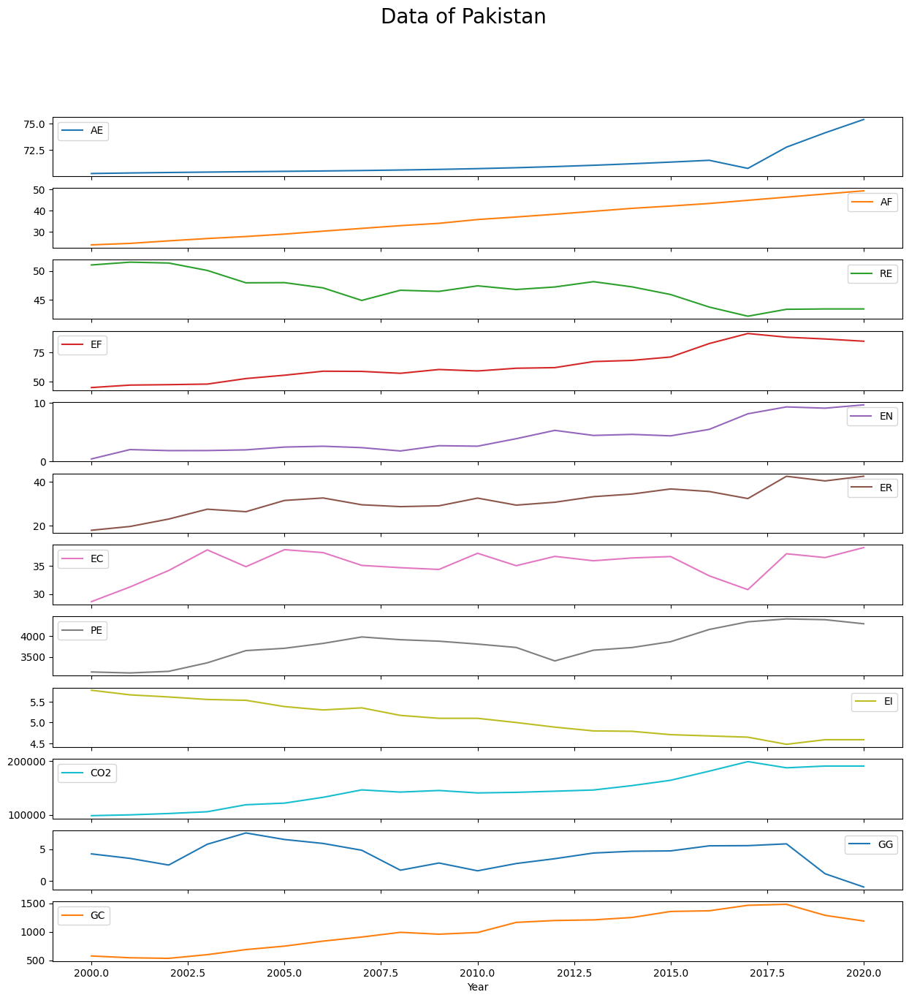

In [14]:
# choose 1 random entity and visualize the data of other columns for that entity
np.random.seed(42)
entity = np.random.choice(df_power_filled_first_step['Entity'].unique())
entity_df = df_power_filled_first_step[df_power_filled_first_step['Entity'] == entity]
entity_df = entity_df.set_index('Year')
entity_df.drop('Entity', axis=1, inplace=True)
entity_df.plot(subplots=True, figsize=(15, 15))
plt.suptitle(f'Data of {entity}', fontsize=20)
plt.show()


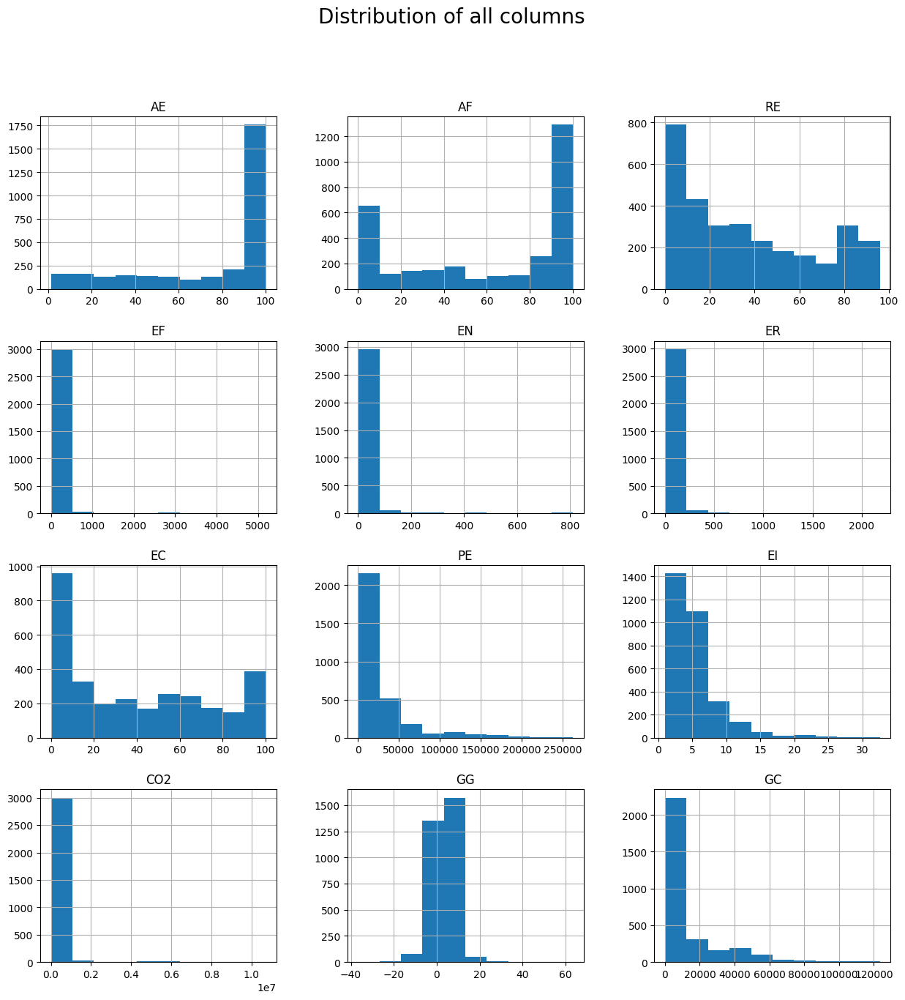

In [15]:
# visualize the distribution of all columns in the dataframe (except 'Year' and 'Entity')
df_power_filled_first_step.drop(['Year', 'Entity'], axis=1).hist(figsize=(15, 15))
plt.suptitle('Distribution of all columns', fontsize=20)
plt.show()



In [16]:
# adf test for each entity, return a list of entities that are stationary in all columns
from statsmodels.tsa.stattools import adfuller

def adf_test(df_adf):
    stationary_entities = []
    stationary_co2 = []
    stationary_power = []
    for entity in df_adf['Entity'].unique():
        entity_df = df_adf[df_adf['Entity'] == entity]
        entity_df = entity_df.set_index('Year')
        entity_df.drop(['Entity'], axis=1, inplace=True)  
        cols = entity_df.columns
        for col in cols:
            if entity_df[col].nunique() < 4:
                entity_df.drop(col, axis=1, inplace=True)
        co2_col_idx = entity_df.columns.get_loc('CO2')
        power_col_idx = entity_df.columns.get_loc('PE')
        adf_result = entity_df.apply(lambda x: adfuller(x)[1])
        if all(adf_result < 0.05):
            stationary_entities.append(entity)
        if (adf_result[co2_col_idx] < 0.05):
            stationary_co2.append(entity)
        if (adf_result[power_col_idx] < 0.05):
            stationary_power.append(entity)
    return stationary_entities, stationary_co2, stationary_power
stationary_entities, stationary_co2, stationary_power = adf_test(df_power_filled_first_step)
if len(stationary_entities) == 0:
    print('No entity is stationary in all columns')
else:
    print(stationary_entities)  
print("Number of entities have stationary CO2 column: ", len(stationary_co2), "over total entities: ", len(df_power_filled_first_step['Entity'].unique()))
print("Number of entities have stationary Power column: ", len(stationary_power), "over total entities: ", len(df_power_filled_first_step['Entity'].unique()))


No entity is stationary in all columns
Number of entities have stationary CO2 column:  23 over total entities:  148
Number of entities have stationary Power column:  25 over total entities:  148


In [17]:
def adf_test_after_differencing(df_adf):
    stationary_entities = []
    stationary_co2 = []
    stationary_power = []
    for entity in df_adf['Entity'].unique():
        entity_df = df_adf[df_adf['Entity'] == entity].copy()
        entity_df = entity_df.set_index('Year')
        entity_df.drop(['Entity'], axis=1, inplace=True)
        cols = entity_df.columns
        for col in cols:
            if entity_df[col].nunique() < 4:
                entity_df.drop(col, axis=1, inplace=True)
            else: 
                entity_df[col] = entity_df[col].diff()
        entity_df.dropna(inplace=True)
        co2_col_idx = entity_df.columns.get_loc('CO2')
        power_col_idx = entity_df.columns.get_loc('PE')
        adf_result = entity_df.apply(lambda x: adfuller(x)[1])
        if all(adf_result < 0.05):
            stationary_entities.append(entity)
        if (adf_result[co2_col_idx] < 0.05):
            stationary_co2.append(entity)
        if (adf_result[power_col_idx] < 0.05):
            stationary_power.append(entity)
    return stationary_entities, stationary_co2, stationary_power
stationary_entities, stationary_co2, stationary_power = adf_test_after_differencing(df_power_filled_first_step)
if len(stationary_entities) == 0:
    print('No entity is stationary in all columns')
else:
    print(stationary_entities)  
print("Number of entities have stationary CO2 column: ", len(stationary_co2), "over total entities: ", len(df_power_filled_first_step['Entity'].unique()))
print("Number of entities have stationary Power column: ", len(stationary_power), "over total entities: ", len(df_power_filled_first_step['Entity'].unique()))


['South Sudan']
Number of entities have stationary CO2 column:  80 over total entities:  148
Number of entities have stationary Power column:  68 over total entities:  148


In [18]:
# data duplicate check
df_power_filled_first_step.duplicated().sum()


0

In [19]:
df_power_filled_first_step.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3081 entries, 0 to 3647
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Entity  3081 non-null   object 
 1   Year    3081 non-null   int64  
 2   AE      3081 non-null   float64
 3   AF      3081 non-null   float64
 4   RE      3081 non-null   float64
 5   EF      3081 non-null   float64
 6   EN      3081 non-null   float64
 7   ER      3081 non-null   float64
 8   EC      3081 non-null   float64
 9   PE      3081 non-null   float64
 10  EI      3081 non-null   float64
 11  CO2     3081 non-null   float64
 12  GG      3081 non-null   float64
 13  GC      3081 non-null   float64
dtypes: float64(12), int64(1), object(1)
memory usage: 361.1+ KB


In [20]:
from prophet import Prophet
def prophet_predict_for_each_entity(df):
    entities = df['Entity'].unique()
    true = []
    predict = []
    predict_unseen = []
    for entity in entities:
        entity_df = df[df['Entity'] == entity].copy()
        entity_df.drop('Entity', axis=1, inplace=True)
        entity_df.drop(entity_df.columns.difference(['Year', 'PE']), axis=1, inplace=True)
        entity_df.rename(columns={'Year': 'ds', 'PE': 'y'}, inplace=True)
        entity_df['ds'] = pd.to_datetime(entity_df['ds'], format='%Y')
        entity_df = entity_df.reset_index(drop=True)
        entity_df.set_index('ds', inplace=True)
        train = entity_df.iloc[:-5]
        test = entity_df.iloc[-5:]
        model = Prophet()
        model.fit(train.reset_index().rename(columns={'ds': 'ds', 'y': 'y'}))
        future = model.make_future_dataframe(periods=10, freq='Y', include_history=True)
        forecast = model.predict(future)
        predict_unseen.append(forecast['yhat'].iloc[-5:].values)
        predict.append(forecast['yhat'].iloc[-10:-5].values)
        true.append(test['y'].values)
#         break
    return predict, predict_unseen, true

In [21]:
# calculate the predict and predict unseen for all entities
predict, predict_unseen, true = prophet_predict_for_each_entity(df_power_filled_first_step)


22:25:11 - cmdstanpy - INFO - Chain [1] start processing
22:25:11 - cmdstanpy - INFO - Chain [1] done processing
22:25:11 - cmdstanpy - INFO - Chain [1] start processing
22:25:11 - cmdstanpy - INFO - Chain [1] done processing
22:25:11 - cmdstanpy - INFO - Chain [1] start processing
22:25:11 - cmdstanpy - INFO - Chain [1] done processing
22:25:11 - cmdstanpy - INFO - Chain [1] start processing
22:25:11 - cmdstanpy - INFO - Chain [1] done processing
22:25:11 - cmdstanpy - INFO - Chain [1] start processing
22:25:11 - cmdstanpy - INFO - Chain [1] done processing
22:25:12 - cmdstanpy - INFO - Chain [1] start processing
22:25:12 - cmdstanpy - INFO - Chain [1] done processing
22:25:12 - cmdstanpy - INFO - Chain [1] start processing
22:25:12 - cmdstanpy - INFO - Chain [1] done processing
22:25:12 - cmdstanpy - INFO - Chain [1] start processing
22:25:12 - cmdstanpy - INFO - Chain [1] done processing
22:25:12 - cmdstanpy - INFO - Chain [1] start processing
22:25:12 - cmdstanpy - INFO - Chain [1]

In [22]:
len(predict_unseen)

148

In [23]:
predict_df = pd.DataFrame(predict, columns=[f'Year_{i}' for i in range(1, 6)])
predict_unseen_df = pd.DataFrame(predict_unseen, columns=[f'Year_{i}' for i in range(6, 11)])
true_df = pd.DataFrame(true, columns=[f'Year_{i}' for i in range(1, 6)])

In [24]:
predict_df

,Year_1,Year_2,Year_3,Year_4,Year_5
0,1490.446888,1461.046661,1571.284134,1685.486754,1803.602023
1,18231.200308,17283.677200,18355.302687,19559.780554,20896.118708
2,4472.597207,4565.626859,4750.358253,4934.210175,5117.158316
3,35122.639747,33832.883877,34176.335805,34602.688766,35111.130904
4,28585.307865,25334.287143,26647.347292,28230.732331,30082.353496
...,...,...,...,...,...
143,21053.058513,20003.421149,20704.171966,21564.881508,22584.585201
144,13591.798094,16209.454337,15173.996689,13912.157493,12425.550164
145,2758.486929,2904.596252,2945.398081,2973.067067,2987.660698
146,2946.214348,3049.104102,3032.819683,3012.311475,2987.625469


In [25]:
predict_df.iloc[:, 0]

0       1490.446888
1      18231.200308
2       4472.597207
3      35122.639747
4      28585.307865
           ...     
143    21053.058513
144    13591.798094
145     2758.486929
146     2946.214348
147     3172.062639
Name: Year_1, Length: 148, dtype: float64

In [26]:
# there are 5 mae, mae_1, mae_2, mae_3, mae_4, mae_5, mae_1 = mae(predict[:][0],true[:][0])
from sklearn.metrics import mean_absolute_error, mean_squared_error

def calculate_error(predict_df, true_df):
    mae = []
    rmse = []
    for i in range(len(predict_df.columns)):
        mae.append(mean_absolute_error(true_df.iloc[:, i], predict_df.iloc[:, i]))
        rmse.append(np.sqrt(mean_squared_error(true_df.iloc[:, i], predict_df.iloc[:, i])))
    return mae, rmse

mae, rmse = calculate_error(predict_df, true_df)

In [27]:
rmse

[8024.920993756998,
 5941.515978324691,
 7627.294999562512,
 10302.534518177028,
 14293.69884664295]

In [28]:
mae

[3828.390520712456,
 2418.647594727244,
 3187.055848747967,
 4397.914843677992,
 5823.944292106041]

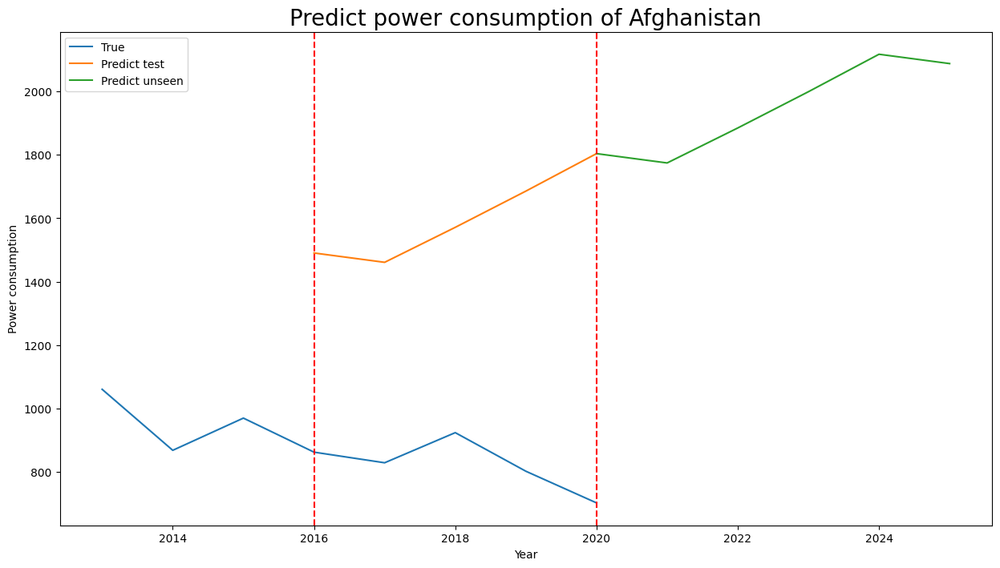

In [29]:
# # plot the predict and the true with the true is 8 last record data in entity_df and the predict is the last 5 years in forecast

def visualize_predict_prophet(df, predict_df, predict_unseen_df, entity_idx):
    entity_name = df['Entity'].unique()[entity_idx]
    entity_df = df[df['Entity'] == entity_name].copy()
    year_unseen = [i for i in range(2020, 2026)]
    prediction = np.concatenate((predict_df.loc[entity_idx].values, predict_unseen_df.loc[entity_idx].values))
    plt.figure(figsize=(15, 8))
    plt.plot(entity_df['Year'].values[-8:], entity_df['PE'].values[-8:], label='True')
    plt.plot(entity_df['Year'].values[-5:], predict_df.loc[entity_idx].values, label='Predict test')
    plt.plot(year_unseen, prediction[-6:], label='Predict unseen')
    plt.title(f'Predict power consumption of {entity_name}', fontsize=20)
    plt.xlabel('Year')
    plt.ylabel('Power consumption')
    plt.axvline(entity_df['Year'].values[-5], color='r', linestyle='--')
    plt.axvline(entity_df['Year'].values[-1], color='r', linestyle='--')
    plt.legend()
    plt.show()

visualize_predict_prophet(df_power_filled_first_step, predict_df, predict_unseen_df, 0)



In [30]:
def prophet_predict_for_each_entity_with_lags(df):
    entities = df['Entity'].unique()
    true = []
    predict = []
    predict_unseen = []
    list_regressors = ['AE', 'AF', 'RE', 'EF', 'EN', 'ER', 'EC', 'EI','CO2', 'GG', 'GC']
    for entity in entities:
        entity_df = df[df['Entity'] == entity].copy()
        entity_df.drop('Entity', axis=1, inplace=True)
        # add 5 rows with year 2021, 2022, 2023, 2024, 2025 to entity_df, all columns are nan
        new_rows = pd.DataFrame({'Year': [2021, 2022, 2023, 2024, 2025]})
        new_rows = new_rows.assign(**{col: np.nan for col in entity_df.columns[1:]})

        # Thêm DataFrame mới vào cuối entity_df
        entity_df = pd.concat([entity_df, new_rows], ignore_index=True)

        for regressor in list_regressors:
            regressor_data = entity_df.drop(entity_df.columns.difference(['Year', regressor]), axis=1)
            regressor_data.rename(columns={'Year': 'ds', regressor: 'y'}, inplace=True)
            regressor_data['ds'] = pd.to_datetime(regressor_data['ds'], format='%Y')
            regressor_data = regressor_data.reset_index(drop=True)
            regressor_data.set_index('ds', inplace=True)
            train = regressor_data.iloc[:-5]
            regressor_model = Prophet()
            regressor_model.fit(train.reset_index().rename(columns={'ds': 'ds', regressor: 'y'}))
            regressor_future = regressor_model.make_future_dataframe(periods=5, freq='Y', include_history=False)
            regressor_forecast = regressor_model.predict(regressor_future)
            regressor_unseen = regressor_forecast['yhat'].values
            # add regressor_unseen to entity_df[resgressor] at year 2021, 2022, 2023, 2024, 2025
            entity_df.loc[entity_df['Year'] == 2021, regressor] = regressor_unseen[0]
            entity_df.loc[entity_df['Year'] == 2022, regressor] = regressor_unseen[1]
            entity_df.loc[entity_df['Year'] == 2023, regressor] = regressor_unseen[2]
            entity_df.loc[entity_df['Year'] == 2024, regressor] = regressor_unseen[3]
            entity_df.loc[entity_df['Year'] == 2025, regressor] = regressor_unseen[4]

        pe_df = entity_df.copy()
        pe_df.rename(columns={'Year': 'ds', 'PE': 'y'}, inplace=True)
        pe_df['ds'] = pd.to_datetime(pe_df['ds'], format='%Y')
        pe_df = pe_df.reset_index(drop=True)
        pe_df.set_index('ds', inplace=True)
        pe_df.dropna(inplace=True)
        train_pe = pe_df.iloc[:-5]
        test_pe = pe_df.iloc[-5:]
        model_pe = Prophet()
        # add regressors to model_pe
        for regressor in list_regressors:
            model_pe.add_regressor(regressor)

        model_pe.fit(train_pe.reset_index().rename(columns={'ds': 'ds', 'y': 'y'}))
        future_pe = model_pe.make_future_dataframe(periods=10, freq='Y', include_history=True)
        for regressor in list_regressors:
            future_pe[regressor] = entity_df[regressor].values
        forecast_pe = model_pe.predict(future_pe)
        predict_unseen.append(forecast_pe['yhat'].iloc[-5:].values)
        predict.append(forecast_pe['yhat'].iloc[-10:-5].values)
        true.append(test_pe['y'].values)
#         break
    return predict, predict_unseen, true
            
        

        

            


In [31]:
# calculate the predict and predict unseen for all entities
predict_lags, predict_unseen_lags, true = prophet_predict_for_each_entity_with_lags(df_power_filled_first_step)

22:25:37 - cmdstanpy - INFO - Chain [1] start processing
22:25:37 - cmdstanpy - INFO - Chain [1] done processing
22:25:37 - cmdstanpy - INFO - Chain [1] start processing
22:25:37 - cmdstanpy - INFO - Chain [1] done processing
22:25:37 - cmdstanpy - INFO - Chain [1] start processing
22:25:37 - cmdstanpy - INFO - Chain [1] done processing
22:25:37 - cmdstanpy - INFO - Chain [1] start processing
22:25:38 - cmdstanpy - INFO - Chain [1] done processing
22:25:38 - cmdstanpy - INFO - Chain [1] start processing
22:25:38 - cmdstanpy - INFO - Chain [1] done processing
22:25:38 - cmdstanpy - INFO - Chain [1] start processing
22:25:38 - cmdstanpy - INFO - Chain [1] done processing
22:25:38 - cmdstanpy - INFO - Chain [1] start processing
22:25:38 - cmdstanpy - INFO - Chain [1] done processing
22:25:38 - cmdstanpy - INFO - Chain [1] start processing
22:25:38 - cmdstanpy - INFO - Chain [1] done processing
22:25:38 - cmdstanpy - INFO - Chain [1] start processing
22:25:38 - cmdstanpy - INFO - Chain [1]

In [32]:
# calculate the error
predict_lags_df = pd.DataFrame(predict_lags, columns=[f'Year_{i}' for i in range(1, 6)])
predict_unseen_lags_df = pd.DataFrame(predict_unseen_lags, columns=[f'Year_{i}' for i in range(6, 11)])
true_df = pd.DataFrame(true, columns=[f'Year_{i}' for i in range(1, 6)])
mae_lags, rmse_lags = calculate_error(predict_lags_df, true_df)




In [33]:
mae_lags

[6404.296848197142,
 4293.672192042553,
 7034.6759501014685,
 11639.369709199342,
 11008.473847897267]

In [34]:
rmse_lags

[15327.912846056575,
 13681.639356176198,
 24962.124578838047,
 63415.34798168106,
 33125.4167543359]

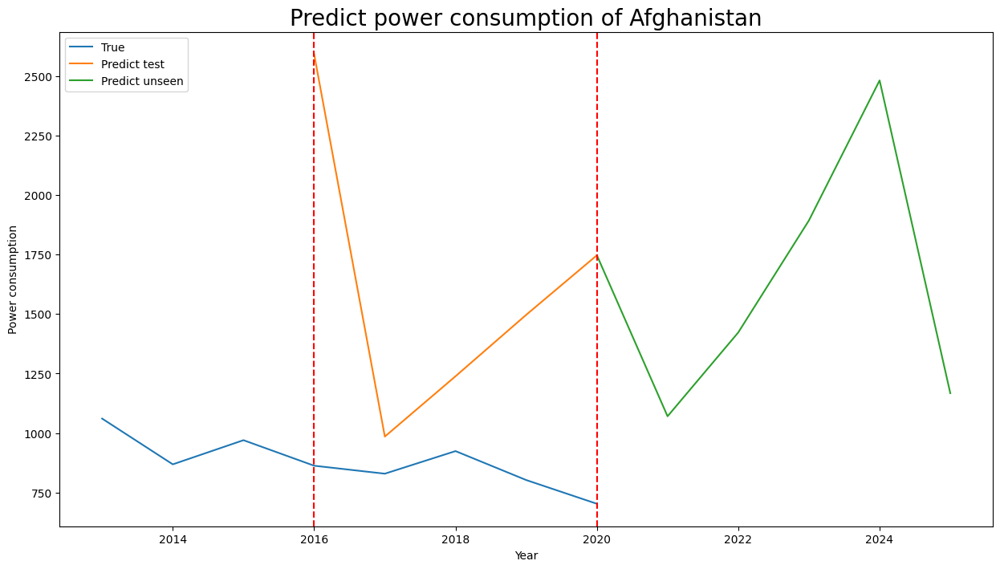

In [35]:
# visualize the predict and the true with the true is 8 last record data in entity_df and the predict is the last 5 years in forecast
visualize_predict_prophet(df_power_filled_first_step, predict_lags_df, predict_unseen_lags_df, 0)

In [36]:
# Import the NeuralProphet class
from neuralprophet import NeuralProphet, set_log_level

# Disable logging messages unless there is an error
set_log_level("ERROR")

In [37]:
df_power_filled_first_step_neural = df_power_filled_first_step[df_power_filled_first_step['Entity'] != 'South Sudan']
df_power_filled_first_step_neural = df_power_filled_first_step_neural[df_power_filled_first_step_neural['Entity'] != 'Serbia']
df_power_filled_first_step_neural = df_power_filled_first_step_neural[df_power_filled_first_step_neural['Entity'] != 'Montenegro']

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

2024-04-17 22:37:08.399844: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-17 22:37:08.399967: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-17 22:37:08.532628: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

MAE NeuralProphet:  [3961.882949390776, 3485.686662113837, 3195.3882150244144, 3133.7859402847857, 3773.991407255085]
RMSE NeuralProphet:  [7712.678775397673, 6491.800267833967, 5700.645533344445, 6447.20598835833, 7987.622015424565]


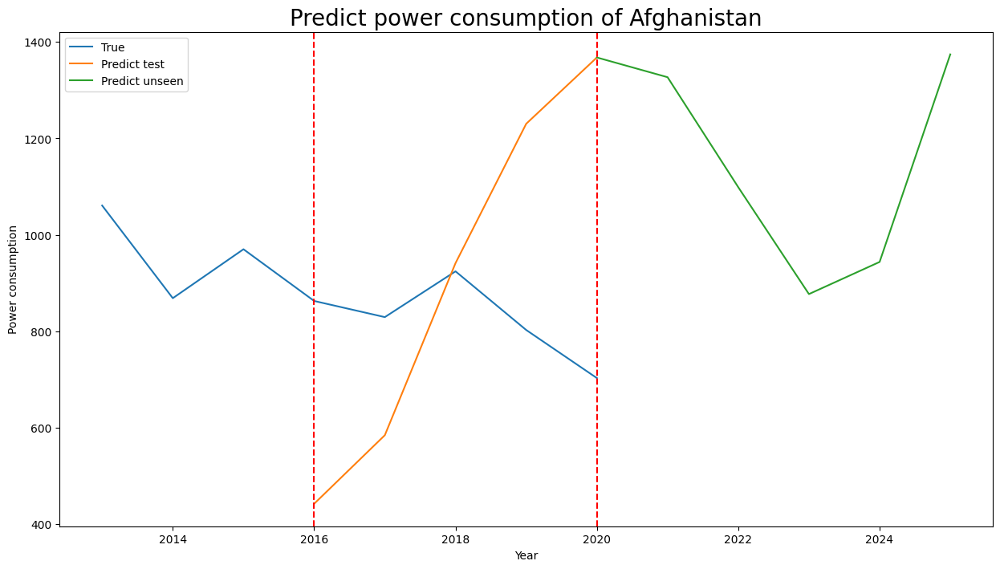

In [38]:
def neural_prophet_predict_for_each_entity(df):
    entities = df['Entity'].unique()
    true = []
    predict = []
    predict_unseen = []
    for entity in entities:
        entity_df = df[df['Entity'] == entity].copy()
        entity_df.drop('Entity', axis=1, inplace=True)
        entity_df.drop(entity_df.columns.difference(['Year', 'PE']), axis=1, inplace=True)
        entity_df.rename(columns={'Year': 'ds', 'PE': 'y'}, inplace=True)
        entity_df['ds'] = pd.to_datetime(entity_df['ds'], format='%Y')
        entity_df = entity_df.reset_index(drop=True)
        # entity_df.set_index('ds', inplace=True)
        train = entity_df.iloc[:-5]
        test = entity_df.iloc[-5:]
        model = NeuralProphet(
                yearly_seasonality=False,
                weekly_seasonality=False,
                daily_seasonality=False,
                normalize='standardize',
                n_lags=3)
        model.fit(train, freq='Y')
        future = model.make_future_dataframe(train, periods=10, n_historic_predictions=len(train))
        forecast = model.predict(future)
        predict_unseen.append(forecast['yhat1'].iloc[-5:].values)
        predict.append(forecast['yhat1'].iloc[-10:-5].values)
        true.append(test['y'].values)
#         break
    return predict, predict_unseen, true

# calculate the predict and predict unseen for all entities
predict_neural, predict_unseen_neural, true = neural_prophet_predict_for_each_entity(df_power_filled_first_step_neural)

# calculate the error
predict_neural_df = pd.DataFrame(predict_neural, columns=[f'Year_{i}' for i in range(1, 6)])
predict_unseen_neural_df = pd.DataFrame(predict_unseen_neural, columns=[f'Year_{i}' for i in range(6, 11)])
true_neural_df = pd.DataFrame(true, columns=[f'Year_{i}' for i in range(1, 6)])

# print(predict_neural_df.info())
# print(predict_unseen_neural_df.info())
# print(true_neural_df.info())
mae_neural, rmse_neural = calculate_error(predict_neural_df, true_neural_df)

print('MAE NeuralProphet: ', mae_neural)
print('RMSE NeuralProphet: ', rmse_neural)

# visualize the predict and the true with the true is 8 last record data in entity_df and the predict is the last 5 years in forecast
visualize_predict_prophet(df_power_filled_first_step_neural, predict_neural_df, predict_unseen_neural_df, 0)

Afghanistan
           ds         AE     AF     RE    EF    ER         EC           y  \
0  2000-01-01   1.613591   6.20  44.99  0.16  0.31  65.957440   302.59482   
1  2001-01-01   4.074574   7.20  45.60  0.09  0.50  84.745766   236.89185   
2  2002-01-01   9.409158   8.20  37.83  0.13  0.56  81.159424   210.86215   
3  2003-01-01  14.738506   9.50  36.66  0.31  0.63  67.021280   229.96822   
4  2004-01-01  20.064968  10.90  44.24  0.33  0.56  62.921350   204.23125   
5  2005-01-01  25.390894  12.20  33.88  0.34  0.59  63.440857   252.06912   
6  2006-01-01  30.718690  13.85  31.89  0.20  0.64  76.190475   304.42090   
7  2007-01-01  36.051010  15.30  28.78  0.20  0.75  78.947370   354.27990   
8  2008-01-01  42.400000  16.70  21.17  0.19  0.54  73.972600   607.83350   
9  2009-01-01  46.740050  18.40  16.53  0.16  0.78  82.978720   975.04816   
10 2010-01-01  42.700000  20.00  15.15  0.19  0.75  79.787230  1182.89200   
11 2011-01-01  43.222020  21.80  12.61  0.18  0.60  76.923090  1

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC           y  \
0  2000-01-01   1.613591   6.20  44.99  0.16  0.31  65.957440   302.59482   
1  2001-01-01   4.074574   7.20  45.60  0.09  0.50  84.745766   236.89185   
2  2002-01-01   9.409158   8.20  37.83  0.13  0.56  81.159424   210.86215   
3  2003-01-01  14.738506   9.50  36.66  0.31  0.63  67.021280   229.96822   
4  2004-01-01  20.064968  10.90  44.24  0.33  0.56  62.921350   204.23125   
5  2005-01-01  25.390894  12.20  33.88  0.34  0.59  63.440857   252.06912   
6  2006-01-01  30.718690  13.85  31.89  0.20  0.64  76.190475   304.42090   
7  2007-01-01  36.051010  15.30  28.78  0.20  0.75  78.947370   354.27990   
8  2008-01-01  42.400000  16.70  21.17  0.19  0.54  73.972600   607.83350   
9  2009-01-01  46.740050  18.40  16.53  0.16  0.78  82.978720   975.04816   
10 2010-01-01  42.700000  20.00  15.15  0.19  0.75  79.787230  1182.89200   
11 2011-01-01  43.222020  21.80  12.61  0.18  0.60  76.923090  1436.11430   

Predicting: 2it [00:00, ?it/s]

Algeria
           ds         AE    AF    RE     EF    ER        EC          y    EI  \
0  2000-01-01  98.973100  97.1  0.43  23.84  0.05  0.209293   9746.524  4.18   
1  2001-01-01  98.966870  97.3  0.43  24.96  0.07  0.279664   9961.640  4.07   
2  2002-01-01  98.953060  97.8  0.51  25.94  0.06  0.230769  10180.350  4.12   
3  2003-01-01  98.934010  98.0  0.47  27.54  0.26  0.935252  10510.461  4.08   
4  2004-01-01  98.912080  98.2  0.44  29.14  0.25  0.850630  10759.022  3.96   
5  2005-01-01  98.889610  98.5  0.58  31.36  0.55  1.723598  11113.723  3.90   
6  2006-01-01  98.869010  98.7  0.41  32.90  0.22  0.664251  11341.980  4.10   
7  2007-01-01  98.852936  98.8  0.41  34.75  0.22  0.629111  11759.701  4.21   
8  2008-01-01  99.300000  99.0  0.30  37.55  0.28  0.740153  12252.297  4.16   
9  2009-01-01  98.845184  99.1  0.31  35.91  0.30  0.828500  12753.120  4.48   
10 2010-01-01  98.858930  99.2  0.26  42.82  0.17  0.395441  12243.156  4.42   
11 2011-01-01  98.888030  99.3  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF    RE     EF    ER        EC          y    EI  \
0  2000-01-01  98.973100  97.1  0.43  23.84  0.05  0.209293   9746.524  4.18   
1  2001-01-01  98.966870  97.3  0.43  24.96  0.07  0.279664   9961.640  4.07   
2  2002-01-01  98.953060  97.8  0.51  25.94  0.06  0.230769  10180.350  4.12   
3  2003-01-01  98.934010  98.0  0.47  27.54  0.26  0.935252  10510.461  4.08   
4  2004-01-01  98.912080  98.2  0.44  29.14  0.25  0.850630  10759.022  3.96   
5  2005-01-01  98.889610  98.5  0.58  31.36  0.55  1.723598  11113.723  3.90   
6  2006-01-01  98.869010  98.7  0.41  32.90  0.22  0.664251  11341.980  4.10   
7  2007-01-01  98.852936  98.8  0.41  34.75  0.22  0.629111  11759.701  4.21   
8  2008-01-01  99.300000  99.0  0.30  37.55  0.28  0.740153  12252.297  4.16   
9  2009-01-01  98.845184  99.1  0.31  35.91  0.30  0.828500  12753.120  4.48   
10 2010-01-01  98.858930  99.2  0.26  42.82  0.17  0.395441  12243.156  4.42   
11 2011-01-01  98.888030  99.3  0.18  47

Predicting: 2it [00:00, ?it/s]

Angola
           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  24.212744  41.1  73.44  0.50  0.90  64.285710  1979.2562  3.68   
1  2001-01-01  20.000000  41.7  72.34  0.58  1.01  63.522010  2079.7320  3.65   
2  2002-01-01  26.352118  41.7  70.42  0.58  1.13  66.081870  2143.5280  3.34   
3  2003-01-01  27.412777  42.0  65.14  0.71  1.23  63.402060  2298.9023  3.49   
4  2004-01-01  28.470550  41.9  61.92  0.45  1.73  79.357796  2454.6700  3.17   
5  2005-01-01  29.527786  42.6  68.38  0.53  2.20  80.586080  2016.8517  2.60   
6  2006-01-01  30.586895  42.9  62.13  0.60  2.64  81.481480  2453.2468  2.62   
7  2007-01-01  37.500000  43.5  58.49  0.68  2.47  78.412700  2719.0603  2.50   
8  2008-01-01  38.490000  43.6  54.88  0.96  3.10  76.354680  3072.0240  2.48   
9  2009-01-01  33.802190  43.8  52.41  1.54  3.06  66.521740  3368.8357  2.71   
10 2010-01-01  34.895638  44.3  52.51  1.64  3.68  69.172930  3560.0942  2.61   
11 2011-01-01  34.600

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  24.212744  41.1  73.44  0.50  0.90  64.285710  1979.2562  3.68   
1  2001-01-01  20.000000  41.7  72.34  0.58  1.01  63.522010  2079.7320  3.65   
2  2002-01-01  26.352118  41.7  70.42  0.58  1.13  66.081870  2143.5280  3.34   
3  2003-01-01  27.412777  42.0  65.14  0.71  1.23  63.402060  2298.9023  3.49   
4  2004-01-01  28.470550  41.9  61.92  0.45  1.73  79.357796  2454.6700  3.17   
5  2005-01-01  29.527786  42.6  68.38  0.53  2.20  80.586080  2016.8517  2.60   
6  2006-01-01  30.586895  42.9  62.13  0.60  2.64  81.481480  2453.2468  2.62   
7  2007-01-01  37.500000  43.5  58.49  0.68  2.47  78.412700  2719.0603  2.50   
8  2008-01-01  38.490000  43.6  54.88  0.96  3.10  76.354680  3072.0240  2.48   
9  2009-01-01  33.802190  43.8  52.41  1.54  3.06  66.521740  3368.8357  2.71   
10 2010-01-01  34.895638  44.3  52.51  1.64  3.68  69.172930  3560.0942  2.61   
11 2011-01-01  34.600000  44

Predicting: 2it [00:00, ?it/s]

Antigua and Barbuda
           ds    RE    EF    ER        EC          y    EI          CO2  \
0  2000-01-01  0.00  0.14  0.00  0.000000  28457.223  3.13   330.000000   
1  2001-01-01  0.00  0.16  0.00  0.000000  28025.290  3.31   350.000000   
2  2002-01-01  0.00  0.18  0.00  0.000000  29660.344  3.59   389.999986   
3  2003-01-01  0.00  0.20  0.00  0.000000  30824.252  3.63   409.999996   
4  2004-01-01  0.00  0.21  0.00  0.000000  31622.059  3.57   400.000006   
5  2005-01-01  0.00  0.23  0.00  0.000000  31734.295  3.40   409.999996   
6  2006-01-01  0.00  0.24  0.00  0.000000  32290.607  3.12   439.999998   
7  2007-01-01  0.00  0.26  0.00  0.000000  33375.836  3.02   460.000008   
8  2008-01-01  0.00  0.27  0.00  0.000000  33637.074  3.08   479.999989   
9  2009-01-01  0.00  0.31  0.00  0.000000  34709.180  3.70  1389.999986   
10 2010-01-01  0.00  0.32  0.00  0.000000  33104.540  4.05   490.000009   
11 2011-01-01  0.08  0.32  0.00  0.000000  32616.084  4.08   540.000022   
12 20

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE    EF    ER        EC          y    EI          CO2  \
0  2000-01-01  0.00  0.14  0.00  0.000000  28457.223  3.13   330.000000   
1  2001-01-01  0.00  0.16  0.00  0.000000  28025.290  3.31   350.000000   
2  2002-01-01  0.00  0.18  0.00  0.000000  29660.344  3.59   389.999986   
3  2003-01-01  0.00  0.20  0.00  0.000000  30824.252  3.63   409.999996   
4  2004-01-01  0.00  0.21  0.00  0.000000  31622.059  3.57   400.000006   
5  2005-01-01  0.00  0.23  0.00  0.000000  31734.295  3.40   409.999996   
6  2006-01-01  0.00  0.24  0.00  0.000000  32290.607  3.12   439.999998   
7  2007-01-01  0.00  0.26  0.00  0.000000  33375.836  3.02   460.000008   
8  2008-01-01  0.00  0.27  0.00  0.000000  33637.074  3.08   479.999989   
9  2009-01-01  0.00  0.31  0.00  0.000000  34709.180  3.70  1389.999986   
10 2010-01-01  0.00  0.32  0.00  0.000000  33104.540  4.05   490.000009   
11 2011-01-01  0.08  0.32  0.00  0.000000  32616.084  4.08   540.000022   
12 2012-01-01  0.15  0.31

Predicting: 2it [00:00, ?it/s]

Argentina
           ds          AE     AF     RE     EF    EN     ER         EC  \
0  2000-01-01   95.783290  95.00   9.85  50.37  5.99  28.89  40.914955   
1  2001-01-01   95.511060  95.60  11.51  42.91  6.54  37.04  50.387330   
2  2002-01-01   96.228870  96.10  11.62  39.70  5.39  36.06  51.078250   
3  2003-01-01   96.442635  96.45  10.82  46.73  7.03  34.38  46.982075   
4  2004-01-01   96.653500  97.20   9.29  57.35  7.31  31.03  40.066883   
5  2005-01-01   96.863846  97.50   9.64  59.89  6.37  34.60  40.620663   
6  2006-01-01   97.076060  98.10   9.18  65.58  7.15  38.67  41.131058   
7  2007-01-01   97.292790  98.30   7.72  72.95  6.72  31.18  34.190350   
8  2008-01-01   97.516754  98.60   7.65  76.62  6.85  31.28  33.228760   
9  2009-01-01   97.750656  98.90   8.59  74.01  7.59  34.70  36.362854   
10 2010-01-01   98.820000  99.10   8.79  78.54  6.69  34.41  34.353058   
11 2011-01-01   99.095350  99.30   8.83  84.43  5.89  32.43  31.217922   
12 2012-01-01   99.229980  9

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds          AE     AF     RE     EF    EN     ER         EC  \
0  2000-01-01   95.783290  95.00   9.85  50.37  5.99  28.89  40.914955   
1  2001-01-01   95.511060  95.60  11.51  42.91  6.54  37.04  50.387330   
2  2002-01-01   96.228870  96.10  11.62  39.70  5.39  36.06  51.078250   
3  2003-01-01   96.442635  96.45  10.82  46.73  7.03  34.38  46.982075   
4  2004-01-01   96.653500  97.20   9.29  57.35  7.31  31.03  40.066883   
5  2005-01-01   96.863846  97.50   9.64  59.89  6.37  34.60  40.620663   
6  2006-01-01   97.076060  98.10   9.18  65.58  7.15  38.67  41.131058   
7  2007-01-01   97.292790  98.30   7.72  72.95  6.72  31.18  34.190350   
8  2008-01-01   97.516754  98.60   7.65  76.62  6.85  31.28  33.228760   
9  2009-01-01   97.750656  98.90   8.59  74.01  7.59  34.70  36.362854   
10 2010-01-01   98.820000  99.10   8.79  78.54  6.69  34.41  34.353058   
11 2011-01-01   99.095350  99.30   8.83  84.43  5.89  32.43  31.217922   
12 2012-01-01   99.229980  99.50   8.6

Predicting: 2it [00:00, ?it/s]

Armenia
           ds          AE    AF     RE    EF    EN    ER         EC  \
0  2000-01-01   98.900000  79.5   7.16  2.53  1.84  1.25  54.982210   
1  2001-01-01  100.000000  82.2   5.42  2.62  1.99  0.96  52.962296   
2  2002-01-01   98.000000  84.9   8.90  1.48  2.09  1.64  71.593090   
3  2003-01-01   99.190130  87.7   9.81  1.43  1.82  1.96  72.552780   
4  2004-01-01   99.189230  89.9   8.71  1.72  2.20  1.98  70.847450   
5  2005-01-01   99.800000  91.6   6.49  1.72  2.50  1.75  71.189285   
6  2006-01-01   99.188230  92.9   7.65  1.39  2.42  1.81  75.266910   
7  2007-01-01   99.193184  94.2   7.02  1.40  2.35  1.83  74.910390   
8  2008-01-01   99.205376  95.0   6.40  1.42  2.27  1.78  74.040230   
9  2009-01-01   99.227500  95.7   7.80  1.08  2.29  2.00  79.888270   
10 2010-01-01   99.800000  96.4   9.36  1.35  2.29  2.54  78.155340   
11 2011-01-01   99.605800  96.8   8.01  2.25  2.36  2.46  68.175390   
12 2012-01-01   99.628970  97.2   6.56  3.19  2.12  2.30  58.081470  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds          AE    AF     RE    EF    EN    ER         EC  \
0  2000-01-01   98.900000  79.5   7.16  2.53  1.84  1.25  54.982210   
1  2001-01-01  100.000000  82.2   5.42  2.62  1.99  0.96  52.962296   
2  2002-01-01   98.000000  84.9   8.90  1.48  2.09  1.64  71.593090   
3  2003-01-01   99.190130  87.7   9.81  1.43  1.82  1.96  72.552780   
4  2004-01-01   99.189230  89.9   8.71  1.72  2.20  1.98  70.847450   
5  2005-01-01   99.800000  91.6   6.49  1.72  2.50  1.75  71.189285   
6  2006-01-01   99.188230  92.9   7.65  1.39  2.42  1.81  75.266910   
7  2007-01-01   99.193184  94.2   7.02  1.40  2.35  1.83  74.910390   
8  2008-01-01   99.205376  95.0   6.40  1.42  2.27  1.78  74.040230   
9  2009-01-01   99.227500  95.7   7.80  1.08  2.29  2.00  79.888270   
10 2010-01-01   99.800000  96.4   9.36  1.35  2.29  2.54  78.155340   
11 2011-01-01   99.605800  96.8   8.01  2.25  2.36  2.46  68.175390   
12 2012-01-01   99.628970  97.2   6.56  3.19  2.12  2.30  58.081470   
13 201

Predicting: 2it [00:00, ?it/s]

Australia
           ds    RE      EF     ER         EC          y    EI          CO2  \
0  2000-01-01  8.42  181.05  17.11   8.634437  68632.960  6.16  339450.0000   
1  2001-01-01  8.37  194.33  17.40   8.218014  68338.280  5.91  345640.0000   
2  2002-01-01  8.74  197.29  17.35   8.083303  68892.780  5.89  353369.9951   
3  2003-01-01  7.15  195.13  18.50   8.659832  69082.790  5.78  352579.9866   
4  2004-01-01  6.68  203.66  19.41   8.701304  70486.320  5.65  365809.9976   
5  2005-01-01  6.71  195.95  19.75   9.156236  69917.164  5.52  370089.9963   
6  2006-01-01  6.85  198.72  21.19   9.635760  71863.760  5.58  375489.9902   
7  2007-01-01  6.95  208.59  20.93   9.119031  72304.695  5.52  385750.0000   
8  2008-01-01  6.79  211.06  18.49   8.054890  72089.340  5.53  388940.0024   
9  2009-01-01  7.15  216.42  18.32   7.804379  69689.840  5.43  395290.0085   
10 2010-01-01  8.16  212.50  21.13   9.044215  68523.875  5.33  387540.0085   
11 2011-01-01  8.32  213.56  27.33  11.345

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE      EF     ER         EC          y    EI          CO2  \
0  2000-01-01  8.42  181.05  17.11   8.634437  68632.960  6.16  339450.0000   
1  2001-01-01  8.37  194.33  17.40   8.218014  68338.280  5.91  345640.0000   
2  2002-01-01  8.74  197.29  17.35   8.083303  68892.780  5.89  353369.9951   
3  2003-01-01  7.15  195.13  18.50   8.659832  69082.790  5.78  352579.9866   
4  2004-01-01  6.68  203.66  19.41   8.701304  70486.320  5.65  365809.9976   
5  2005-01-01  6.71  195.95  19.75   9.156236  69917.164  5.52  370089.9963   
6  2006-01-01  6.85  198.72  21.19   9.635760  71863.760  5.58  375489.9902   
7  2007-01-01  6.95  208.59  20.93   9.119031  72304.695  5.52  385750.0000   
8  2008-01-01  6.79  211.06  18.49   8.054890  72089.340  5.53  388940.0024   
9  2009-01-01  7.15  216.42  18.32   7.804379  69689.840  5.43  395290.0085   
10 2010-01-01  8.16  212.50  21.13   9.044215  68523.875  5.33  387540.0085   
11 2011-01-01  8.32  213.56  27.33  11.345427  69714

Predicting: 2it [00:00, ?it/s]

Austria
           ds     RE     EF     ER         EC          y    EI          CO2  \
0  2000-01-01  26.44  16.41  43.44  72.581460  48863.280  3.22  63530.00000   
1  2001-01-01  25.53  18.82  42.24  69.177860  50421.105  3.36  67910.00000   
2  2002-01-01  24.68  18.79  41.90  69.039380  50254.640  3.33  69370.00275   
3  2003-01-01  22.56  22.82  35.24  60.695835  50523.203  3.48  74459.99908   
4  2004-01-01  23.17  22.31  39.62  63.975456  51139.312  3.44  75800.00305   
5  2005-01-01  24.41  23.61  40.88  63.389675  51714.720  3.47  76239.99786   
6  2006-01-01  26.64  21.62  40.66  65.285805  50921.684  3.38  74099.99847   
7  2007-01-01  28.99  19.74  43.17  68.621840  49669.195  3.20  71239.99786   
8  2008-01-01  29.68  19.97  44.53  69.038760  50475.008  3.18  70730.00336   
9  2009-01-01  31.31  19.12  47.18  71.161385  48765.184  3.14  64419.99817   
10 2010-01-01  31.15  22.92  44.99  66.249440  50240.960  3.29  69959.99908   
11 2011-01-01  31.64  21.35  40.91  65.70832

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE     EF     ER         EC          y    EI          CO2  \
0  2000-01-01  26.44  16.41  43.44  72.581460  48863.280  3.22  63530.00000   
1  2001-01-01  25.53  18.82  42.24  69.177860  50421.105  3.36  67910.00000   
2  2002-01-01  24.68  18.79  41.90  69.039380  50254.640  3.33  69370.00275   
3  2003-01-01  22.56  22.82  35.24  60.695835  50523.203  3.48  74459.99908   
4  2004-01-01  23.17  22.31  39.62  63.975456  51139.312  3.44  75800.00305   
5  2005-01-01  24.41  23.61  40.88  63.389675  51714.720  3.47  76239.99786   
6  2006-01-01  26.64  21.62  40.66  65.285805  50921.684  3.38  74099.99847   
7  2007-01-01  28.99  19.74  43.17  68.621840  49669.195  3.20  71239.99786   
8  2008-01-01  29.68  19.97  44.53  69.038760  50475.008  3.18  70730.00336   
9  2009-01-01  31.31  19.12  47.18  71.161385  48765.184  3.14  64419.99817   
10 2010-01-01  31.15  22.92  44.99  66.249440  50240.960  3.29  69959.99908   
11 2011-01-01  31.64  21.35  40.91  65.708320  47200

Predicting: 2it [00:00, ?it/s]

Azerbaijan
           ds    AF    RE     EF    ER         EC          y     EI  \
0  2000-01-01  70.3  2.07  16.13  1.52   8.611898  16123.289  14.46   
1  2001-01-01  73.6  1.75  16.61  1.29   7.206704  15361.870  13.33   
2  2002-01-01  76.8  2.35  16.47  2.00  10.828371  15003.191  12.31   
3  2003-01-01  80.3  2.94  17.69  2.44  12.121213  16075.374  11.74   
4  2004-01-01  82.9  3.07  17.76  2.73  13.323572  17986.783  11.30   
5  2005-01-01  85.2  3.36  17.12  2.98  14.825871  19273.648   9.28   
6  2006-01-01  87.4  2.86  19.83  2.49  11.155914  18724.746   6.80   
7  2007-01-01  89.4  3.78  18.31  2.34  11.331718  17015.564   5.13   
8  2008-01-01  90.7  3.08  18.24  2.21  10.806846  16933.111   5.15   
9  2009-01-01  92.1  3.27  15.57  2.29  12.821948  14348.922   4.21   
10 2010-01-01  93.1  4.45  14.34  3.41  19.211267  13958.922   3.82   
11 2011-01-01  94.0  3.55  16.57  2.65  13.787722  15663.720   4.20   
12 2012-01-01  94.7  2.84  19.90  1.80   8.294930  15936.576   4.4

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    AF    RE     EF    ER         EC          y     EI  \
0  2000-01-01  70.3  2.07  16.13  1.52   8.611898  16123.289  14.46   
1  2001-01-01  73.6  1.75  16.61  1.29   7.206704  15361.870  13.33   
2  2002-01-01  76.8  2.35  16.47  2.00  10.828371  15003.191  12.31   
3  2003-01-01  80.3  2.94  17.69  2.44  12.121213  16075.374  11.74   
4  2004-01-01  82.9  3.07  17.76  2.73  13.323572  17986.783  11.30   
5  2005-01-01  85.2  3.36  17.12  2.98  14.825871  19273.648   9.28   
6  2006-01-01  87.4  2.86  19.83  2.49  11.155914  18724.746   6.80   
7  2007-01-01  89.4  3.78  18.31  2.34  11.331718  17015.564   5.13   
8  2008-01-01  90.7  3.08  18.24  2.21  10.806846  16933.111   5.15   
9  2009-01-01  92.1  3.27  15.57  2.29  12.821948  14348.922   4.21   
10 2010-01-01  93.1  4.45  14.34  3.41  19.211267  13958.922   3.82   
11 2011-01-01  94.0  3.55  16.57  2.65  13.787722  15663.720   4.20   
12 2012-01-01  94.7  2.84  19.90  1.80   8.294930  15936.576   4.47   
13 201

Predicting: 2it [00:00, ?it/s]

Bahrain
           ds     EF    ER        EC          y     EI          CO2        GG  \
0  2000-01-01  13.02  0.00  0.000000  157253.03  10.43  15880.00000  5.300070   
1  2001-01-01  13.74  0.00  0.000000  158559.69  10.41  16390.00000  2.490948   
2  2002-01-01  14.34  0.00  0.000000  165096.56  10.45  17219.99931  3.348551   
3  2003-01-01  14.76  0.00  0.000000  165859.02  10.30  17940.00053  6.296442   
4  2004-01-01  15.18  0.00  0.000000  160432.52   9.83  17930.00031  6.980961   
5  2005-01-01  18.20  0.00  0.000000  166315.33  10.55  20690.00053  6.768998   
6  2006-01-01  19.77  0.00  0.000000  164833.39  10.36  22489.99977  6.467000   
7  2007-01-01  20.42  0.00  0.000000  157924.50  10.31  23000.00000  8.293960   
8  2008-01-01  21.45  0.00  0.000000  154979.23  10.35  24760.00023  6.245011   
9  2009-01-01  21.21  0.00  0.000000  144448.34   9.70  24719.99931  2.539886   
10 2010-01-01  22.39  0.00  0.000000  141914.10   9.59  25969.99931  4.334299   
11 2011-01-01  22.88

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     EF    ER        EC          y     EI          CO2        GG  \
0  2000-01-01  13.02  0.00  0.000000  157253.03  10.43  15880.00000  5.300070   
1  2001-01-01  13.74  0.00  0.000000  158559.69  10.41  16390.00000  2.490948   
2  2002-01-01  14.34  0.00  0.000000  165096.56  10.45  17219.99931  3.348551   
3  2003-01-01  14.76  0.00  0.000000  165859.02  10.30  17940.00053  6.296442   
4  2004-01-01  15.18  0.00  0.000000  160432.52   9.83  17930.00031  6.980961   
5  2005-01-01  18.20  0.00  0.000000  166315.33  10.55  20690.00053  6.768998   
6  2006-01-01  19.77  0.00  0.000000  164833.39  10.36  22489.99977  6.467000   
7  2007-01-01  20.42  0.00  0.000000  157924.50  10.31  23000.00000  8.293960   
8  2008-01-01  21.45  0.00  0.000000  154979.23  10.35  24760.00023  6.245011   
9  2009-01-01  21.21  0.00  0.000000  144448.34   9.70  24719.99931  2.539886   
10 2010-01-01  22.39  0.00  0.000000  141914.10   9.59  25969.99931  4.334299   
11 2011-01-01  22.88  0.00  

Predicting: 2it [00:00, ?it/s]

Bangladesh
           ds         AE    AF     RE     EF    ER        EC          y    EI  \
0  2000-01-01  32.000000   8.3  59.06  13.93  0.94  6.321453  1053.6212  3.14   
1  2001-01-01  35.032646   8.3  55.82  15.41  0.98  5.979256  1181.6239  3.27   
2  2002-01-01  37.851070   8.4  54.33  16.55  1.05  5.965909  1163.1385  3.23   
3  2003-01-01  40.664260   8.6  52.62  17.47  1.12  6.024744  1208.1465  3.20   
4  2004-01-01  40.600000   8.9  52.05  22.05  1.21  5.202064  1261.4670  3.10   
5  2005-01-01  44.230000   9.2  50.66  24.15  1.28  5.033425  1345.8510  3.05   
6  2006-01-01  50.525100   9.8  48.69  27.86  1.39  4.752137  1438.7640  3.05   
7  2007-01-01  46.500000  10.3  47.19  28.45  0.76  2.601849  1458.1193  2.98   
8  2008-01-01  54.735516  11.0  45.20  31.36  0.96  2.970297  1528.5890  2.94   
9  2009-01-01  57.568848  11.8  43.10  34.60  0.47  1.340177  1660.9723  2.94   
10 2010-01-01  55.260000  12.7  40.28  37.65  0.84  2.182385  1685.9304  2.93   
11 2011-01-01  59

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE     EF    ER        EC          y    EI  \
0  2000-01-01  32.000000   8.3  59.06  13.93  0.94  6.321453  1053.6212  3.14   
1  2001-01-01  35.032646   8.3  55.82  15.41  0.98  5.979256  1181.6239  3.27   
2  2002-01-01  37.851070   8.4  54.33  16.55  1.05  5.965909  1163.1385  3.23   
3  2003-01-01  40.664260   8.6  52.62  17.47  1.12  6.024744  1208.1465  3.20   
4  2004-01-01  40.600000   8.9  52.05  22.05  1.21  5.202064  1261.4670  3.10   
5  2005-01-01  44.230000   9.2  50.66  24.15  1.28  5.033425  1345.8510  3.05   
6  2006-01-01  50.525100   9.8  48.69  27.86  1.39  4.752137  1438.7640  3.05   
7  2007-01-01  46.500000  10.3  47.19  28.45  0.76  2.601849  1458.1193  2.98   
8  2008-01-01  54.735516  11.0  45.20  31.36  0.96  2.970297  1528.5890  2.94   
9  2009-01-01  57.568848  11.8  43.10  34.60  0.47  1.340177  1660.9723  2.94   
10 2010-01-01  55.260000  12.7  40.28  37.65  0.84  2.182385  1685.9304  2.93   
11 2011-01-01  59.600000  13

Predicting: 2it [00:00, ?it/s]

Barbados
           ds     RE    EF    ER        EC          y    EI          CO2  \
0  2000-01-01  14.32  0.76  0.00  0.000000  26318.064  3.83  1240.000000   
1  2001-01-01  12.56  0.80  0.00  0.000000  26262.209  4.01  1310.000000   
2  2002-01-01  11.30  0.83  0.00  0.000000  26331.500  3.91  1370.000005   
3  2003-01-01   9.95  0.87  0.00  0.000000  26508.630  3.92  1379.999995   
4  2004-01-01   9.93  0.90  0.00  0.000000  26606.236  3.97  1360.000014   
5  2005-01-01   9.91  0.95  0.00  0.000000  26715.060  3.97  1419.999957   
6  2006-01-01   9.90  0.98  0.00  0.000000  26681.957  3.84  1470.000029   
7  2007-01-01   9.71  1.00  0.00  0.000000  25360.926  3.81  1480.000019   
8  2008-01-01   8.63  1.01  0.00  0.000000  29773.459  4.52  1779.999971   
9  2009-01-01   9.40  1.02  0.00  0.000000  27941.865  4.81  4619.999886   
10 2010-01-01   9.08  0.97  0.00  0.000000  26839.543  4.57  1549.999952   
11 2011-01-01   4.66  0.99  0.00  0.000000  28088.297  4.61  1759.999990   
12 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE    EF    ER        EC          y    EI          CO2  \
0  2000-01-01  14.32  0.76  0.00  0.000000  26318.064  3.83  1240.000000   
1  2001-01-01  12.56  0.80  0.00  0.000000  26262.209  4.01  1310.000000   
2  2002-01-01  11.30  0.83  0.00  0.000000  26331.500  3.91  1370.000005   
3  2003-01-01   9.95  0.87  0.00  0.000000  26508.630  3.92  1379.999995   
4  2004-01-01   9.93  0.90  0.00  0.000000  26606.236  3.97  1360.000014   
5  2005-01-01   9.91  0.95  0.00  0.000000  26715.060  3.97  1419.999957   
6  2006-01-01   9.90  0.98  0.00  0.000000  26681.957  3.84  1470.000029   
7  2007-01-01   9.71  1.00  0.00  0.000000  25360.926  3.81  1480.000019   
8  2008-01-01   8.63  1.01  0.00  0.000000  29773.459  4.52  1779.999971   
9  2009-01-01   9.40  1.02  0.00  0.000000  27941.865  4.81  4619.999886   
10 2010-01-01   9.08  0.97  0.00  0.000000  26839.543  4.57  1549.999952   
11 2011-01-01   4.66  0.99  0.00  0.000000  28088.297  4.61  1759.999990   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Belarus
           ds     AF    RE     EF    ER        EC          y     EI  \
0  2000-01-01  94.70  5.65  24.51  0.03  0.122249  24868.184  12.85   
1  2001-01-01  95.20  6.26  23.53  0.03  0.127334  24306.926  12.33   
2  2002-01-01  95.80  6.52  24.84  0.03  0.120627  25309.941  11.96   
3  2003-01-01  96.40  6.25  25.00  0.03  0.119856  25292.014  11.50   
4  2004-01-01  96.90  6.27  29.31  0.03  0.102249  28508.880  10.66   
5  2005-01-01  97.10  6.83  29.07  0.04  0.137410  28600.459   9.74   
6  2006-01-01  97.50  7.20  29.79  0.06  0.201005  30598.045   9.42   
7  2007-01-01  97.90  7.28  29.81  0.07  0.234270  29999.406   8.50   
8  2008-01-01  98.15  7.08  32.79  0.11  0.334346  30513.402   7.72   
9  2009-01-01  98.50  7.39  28.38  0.10  0.351124  28957.873   7.29   
10 2010-01-01  98.70  7.30  32.68  0.12  0.365854  31470.040   7.01   
11 2011-01-01  98.80  7.52  30.12  0.12  0.396825  30981.086   7.06   
12 2012-01-01  99.00  7.25  28.78  0.16  0.552868  33557.434   7.24  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     AF    RE     EF    ER        EC          y     EI  \
0  2000-01-01  94.70  5.65  24.51  0.03  0.122249  24868.184  12.85   
1  2001-01-01  95.20  6.26  23.53  0.03  0.127334  24306.926  12.33   
2  2002-01-01  95.80  6.52  24.84  0.03  0.120627  25309.941  11.96   
3  2003-01-01  96.40  6.25  25.00  0.03  0.119856  25292.014  11.50   
4  2004-01-01  96.90  6.27  29.31  0.03  0.102249  28508.880  10.66   
5  2005-01-01  97.10  6.83  29.07  0.04  0.137410  28600.459   9.74   
6  2006-01-01  97.50  7.20  29.79  0.06  0.201005  30598.045   9.42   
7  2007-01-01  97.90  7.28  29.81  0.07  0.234270  29999.406   8.50   
8  2008-01-01  98.15  7.08  32.79  0.11  0.334346  30513.402   7.72   
9  2009-01-01  98.50  7.39  28.38  0.10  0.351124  28957.873   7.29   
10 2010-01-01  98.70  7.30  32.68  0.12  0.365854  31470.040   7.01   
11 2011-01-01  98.80  7.52  30.12  0.12  0.396825  30981.086   7.06   
12 2012-01-01  99.00  7.25  28.78  0.16  0.552868  33557.434   7.24   
13 201

Predicting: 2it [00:00, ?it/s]

Belgium
           ds    RE     EF     EN     ER         EC          y    EI  \
0  2000-01-01  1.44  33.58  48.16   1.05  59.439545  72420.410  5.51   
1  2001-01-01  1.58  31.20  46.35   1.08  60.320490  71475.500  5.41   
2  2002-01-01  1.68  32.44  47.36   1.14  59.920930  70828.990  5.15   
3  2003-01-01  1.89  34.99  47.38   1.20  58.130910  73221.560  5.32   
4  2004-01-01  2.02  34.11  47.31   1.50  58.863968  73126.234  5.15   
5  2005-01-01  2.46  34.39  47.60   2.11  59.108204  71894.960  5.01   
6  2006-01-01  2.82  33.46  46.65   2.96  59.720720  71647.290  4.82   
7  2007-01-01  3.34  34.84  48.23   3.49  59.750465  71662.340  4.56   
8  2008-01-01  3.91  32.82  45.57   4.42  60.367107  72317.910  4.68   
9  2009-01-01  4.83  37.00  47.22   5.45  58.737595  66274.000  4.58   
10 2010-01-01  6.22  38.39  47.94   6.54  58.662643  70300.140  4.81   
11 2011-01-01  6.66  32.51  48.23   8.31  63.492416  65134.080  4.40   
12 2012-01-01  7.67  30.62  40.29  10.51  62.392532  620

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE     EF     EN     ER         EC          y    EI  \
0  2000-01-01  1.44  33.58  48.16   1.05  59.439545  72420.410  5.51   
1  2001-01-01  1.58  31.20  46.35   1.08  60.320490  71475.500  5.41   
2  2002-01-01  1.68  32.44  47.36   1.14  59.920930  70828.990  5.15   
3  2003-01-01  1.89  34.99  47.38   1.20  58.130910  73221.560  5.32   
4  2004-01-01  2.02  34.11  47.31   1.50  58.863968  73126.234  5.15   
5  2005-01-01  2.46  34.39  47.60   2.11  59.108204  71894.960  5.01   
6  2006-01-01  2.82  33.46  46.65   2.96  59.720720  71647.290  4.82   
7  2007-01-01  3.34  34.84  48.23   3.49  59.750465  71662.340  4.56   
8  2008-01-01  3.91  32.82  45.57   4.42  60.367107  72317.910  4.68   
9  2009-01-01  4.83  37.00  47.22   5.45  58.737595  66274.000  4.58   
10 2010-01-01  6.22  38.39  47.94   6.54  58.662643  70300.140  4.81   
11 2011-01-01  6.66  32.51  48.23   8.31  63.492416  65134.080  4.40   
12 2012-01-01  7.67  30.62  40.29  10.51  62.392532  62090.016  

Predicting: 2it [00:00, ?it/s]

Belize
           ds         AE    AF     RE    EF    ER         EC           y  \
0  2000-01-01  79.000000  79.9  34.55  0.09  0.09  49.999996  10038.5520   
1  2001-01-01  80.196960  80.6  29.61  0.06  0.09  59.999996  10707.6400   
2  2002-01-01  81.029420  81.5  31.19  0.06  0.09  59.999996  10042.4770   
3  2003-01-01  81.856636  81.9  30.18  0.11  0.06  35.294117   9553.4750   
4  2004-01-01  82.680980  82.6  32.02  0.10  0.06  37.500000   8929.1455   
5  2005-01-01  83.504776  82.9  31.01  0.10  0.07  41.176470   9279.9450   
6  2006-01-01  90.988530  83.2  36.80  0.05  0.18  78.260870  10366.8040   
7  2007-01-01  85.160640  83.3  32.31  0.06  0.18  75.000000   9503.8040   
8  2008-01-01  85.998060  83.5  34.06  0.03  0.20  86.956520   8935.5450   
9  2009-01-01  86.845430  83.4  29.18  0.05  0.20  80.000000   9060.7570   
10 2010-01-01  89.917220  83.6  32.93  0.18  0.31  63.265305  10492.4450   
11 2011-01-01  91.681730  83.4  44.36  0.14  0.29  67.441860   8946.3800   
12 20

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER         EC           y  \
0  2000-01-01  79.000000  79.9  34.55  0.09  0.09  49.999996  10038.5520   
1  2001-01-01  80.196960  80.6  29.61  0.06  0.09  59.999996  10707.6400   
2  2002-01-01  81.029420  81.5  31.19  0.06  0.09  59.999996  10042.4770   
3  2003-01-01  81.856636  81.9  30.18  0.11  0.06  35.294117   9553.4750   
4  2004-01-01  82.680980  82.6  32.02  0.10  0.06  37.500000   8929.1455   
5  2005-01-01  83.504776  82.9  31.01  0.10  0.07  41.176470   9279.9450   
6  2006-01-01  90.988530  83.2  36.80  0.05  0.18  78.260870  10366.8040   
7  2007-01-01  85.160640  83.3  32.31  0.06  0.18  75.000000   9503.8040   
8  2008-01-01  85.998060  83.5  34.06  0.03  0.20  86.956520   8935.5450   
9  2009-01-01  86.845430  83.4  29.18  0.05  0.20  80.000000   9060.7570   
10 2010-01-01  89.917220  83.6  32.93  0.18  0.31  63.265305  10492.4450   
11 2011-01-01  91.681730  83.4  44.36  0.14  0.29  67.441860   8946.3800   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Benin
           ds         AE     RE    EF           y    EI          CO2  \
0  2000-01-01  21.531084  70.29  0.08   980.96387  4.88  1420.000000   
1  2001-01-01  21.900000  66.86  0.06  1083.34610  4.93  1740.000000   
2  2002-01-01  23.415928  64.04  0.06  1204.54610  5.05  2180.000067   
3  2003-01-01  24.349323  61.73  0.07  1357.00390  5.15  2440.000057   
4  2004-01-01  25.279833  60.69  0.08  1388.15400  5.15  2650.000095   
5  2005-01-01  26.209805  59.20  0.10  1262.39340  5.08  2900.000095   
6  2006-01-01  27.900000  57.31  0.14  1672.01920  5.76  3470.000029   
7  2007-01-01  28.078016  54.49  0.20  1918.38210  5.91  4000.000000   
8  2008-01-01  29.021614  54.76  0.21  1904.88950  5.76  4019.999981   
9  2009-01-01  29.975151  52.83  0.12  2054.21500  5.91  4420.000076   
10 2010-01-01  34.200000  47.19  0.11  2287.76930  6.00  4829.999924   
11 2011-01-01  36.900000  48.70  0.09  2071.18770  5.82  4650.000095   
12 2012-01-01  38.400000  50.33  0.05  1909.26420  5.61  4

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     RE    EF           y    EI          CO2  \
0  2000-01-01  21.531084  70.29  0.08   980.96387  4.88  1420.000000   
1  2001-01-01  21.900000  66.86  0.06  1083.34610  4.93  1740.000000   
2  2002-01-01  23.415928  64.04  0.06  1204.54610  5.05  2180.000067   
3  2003-01-01  24.349323  61.73  0.07  1357.00390  5.15  2440.000057   
4  2004-01-01  25.279833  60.69  0.08  1388.15400  5.15  2650.000095   
5  2005-01-01  26.209805  59.20  0.10  1262.39340  5.08  2900.000095   
6  2006-01-01  27.900000  57.31  0.14  1672.01920  5.76  3470.000029   
7  2007-01-01  28.078016  54.49  0.20  1918.38210  5.91  4000.000000   
8  2008-01-01  29.021614  54.76  0.21  1904.88950  5.76  4019.999981   
9  2009-01-01  29.975151  52.83  0.12  2054.21500  5.91  4420.000076   
10 2010-01-01  34.200000  47.19  0.11  2287.76930  6.00  4829.999924   
11 2011-01-01  36.900000  48.70  0.09  2071.18770  5.82  4650.000095   
12 2012-01-01  38.400000  50.33  0.05  1909.26420  5.61  4440.00

Predicting: 2it [00:00, ?it/s]

Bhutan
           ds         AE     AF     RE    ER          y     EI         CO2  \
0  2000-01-01  31.150000  27.80  91.40  1.79   8469.052  18.42  210.000000   
1  2001-01-01  40.045130  30.90  91.75  1.92   9100.751  17.29  230.000000   
2  2002-01-01  43.978878  34.80  91.20  2.18   9810.103  15.99  239.999995   
3  2003-01-01  41.100000  38.80  91.92  2.50  10658.221  14.96  259.999991   
4  2004-01-01  51.833010  42.70  93.46  2.33  10014.694  14.15  289.999992   
5  2005-01-01  59.808113  47.30  91.67  2.62  11119.834  13.61  319.999993   
6  2006-01-01  59.685055  51.10  91.92  4.47  17746.780  12.99  319.999993   
7  2007-01-01  71.800000  54.65  92.07  6.49  21903.543  11.30  319.999993   
8  2008-01-01  67.555250  57.80  91.81  6.89  22370.271  11.12  300.000012   
9  2009-01-01  71.503900  61.20  92.38  6.93  22935.088  10.69  319.999993   
10 2010-01-01  73.282910  63.90  90.80  7.26  24284.154  10.11  400.000006   
11 2011-01-01  81.767090  66.70  89.01  6.97  23369.613  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    ER          y     EI         CO2  \
0  2000-01-01  31.150000  27.80  91.40  1.79   8469.052  18.42  210.000000   
1  2001-01-01  40.045130  30.90  91.75  1.92   9100.751  17.29  230.000000   
2  2002-01-01  43.978878  34.80  91.20  2.18   9810.103  15.99  239.999995   
3  2003-01-01  41.100000  38.80  91.92  2.50  10658.221  14.96  259.999991   
4  2004-01-01  51.833010  42.70  93.46  2.33  10014.694  14.15  289.999992   
5  2005-01-01  59.808113  47.30  91.67  2.62  11119.834  13.61  319.999993   
6  2006-01-01  59.685055  51.10  91.92  4.47  17746.780  12.99  319.999993   
7  2007-01-01  71.800000  54.65  92.07  6.49  21903.543  11.30  319.999993   
8  2008-01-01  67.555250  57.80  91.81  6.89  22370.271  11.12  300.000012   
9  2009-01-01  71.503900  61.20  92.38  6.93  22935.088  10.69  319.999993   
10 2010-01-01  73.282910  63.90  90.80  7.26  24284.154  10.11  400.000006   
11 2011-01-01  81.767090  66.70  89.01  6.97  23369.613   9.47  

Predicting: 2it [00:00, ?it/s]

Bosnia and Herzegovina
           ds          AE     AF     RE     EF    ER         EC          y  \
0  2000-01-01  100.000000  52.10  19.35   5.01  5.04  50.149254  15474.596   
1  2001-01-01   99.400000  51.45  20.27   5.13  5.13  50.000000  15337.629   
2  2002-01-01   98.500000  50.90  21.21   5.19  5.22  50.144093  15402.803   
3  2003-01-01  100.000000  50.80  20.14   6.36  4.46  41.219963  13485.733   
4  2004-01-01  100.000000  49.30  20.10   6.34  5.92  48.287113  14065.254   
5  2005-01-01  100.000000  48.90  19.73   6.21  5.94  48.888890  13151.445   
6  2006-01-01   99.387276  47.90  18.12   7.00  5.80  45.312500  13561.985   
7  2007-01-01   99.700000  47.10  14.84   7.32  3.96  35.106384  13117.112   
8  2008-01-01  100.000000  46.70  14.28   9.36  4.82  33.991540  15073.022   
9  2009-01-01  100.000000  45.80  17.43   8.86  6.18  41.090427  18430.324   
10 2010-01-01  100.000000  45.00  19.57   8.55  7.95  48.181820  20074.406   
11 2011-01-01   99.705780  44.70  14.16  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds          AE     AF     RE     EF    ER         EC          y  \
0  2000-01-01  100.000000  52.10  19.35   5.01  5.04  50.149254  15474.596   
1  2001-01-01   99.400000  51.45  20.27   5.13  5.13  50.000000  15337.629   
2  2002-01-01   98.500000  50.90  21.21   5.19  5.22  50.144093  15402.803   
3  2003-01-01  100.000000  50.80  20.14   6.36  4.46  41.219963  13485.733   
4  2004-01-01  100.000000  49.30  20.10   6.34  5.92  48.287113  14065.254   
5  2005-01-01  100.000000  48.90  19.73   6.21  5.94  48.888890  13151.445   
6  2006-01-01   99.387276  47.90  18.12   7.00  5.80  45.312500  13561.985   
7  2007-01-01   99.700000  47.10  14.84   7.32  3.96  35.106384  13117.112   
8  2008-01-01  100.000000  46.70  14.28   9.36  4.82  33.991540  15073.022   
9  2009-01-01  100.000000  45.80  17.43   8.86  6.18  41.090427  18430.324   
10 2010-01-01  100.000000  45.00  19.57   8.55  7.95  48.181820  20074.406   
11 2011-01-01   99.705780  44.70  14.16  10.24  4.34  29.766804 

Predicting: 2it [00:00, ?it/s]

Botswana
           ds         AE    AF     RE    EF           y    EI          CO2  \
0  2000-01-01  26.408980  44.4  38.46  0.89   8308.6610  4.00  4030.000000   
1  2001-01-01  24.800000  46.3  37.51  0.95   8561.0990  4.04  3870.000000   
2  2002-01-01  27.000000  47.8  36.13  0.84   8817.6490  3.86  4030.000210   
3  2003-01-01  33.083107  49.5  36.21  0.68   8856.5230  3.68  3920.000076   
4  2004-01-01  35.298912  51.1  34.34  0.74   8571.5000  3.69  3970.000029   
5  2005-01-01  37.514180  52.6  33.00  0.81   8948.1040  3.64  4280.000210   
6  2006-01-01  39.731320  53.7  31.40  0.75   9380.9480  3.47  4090.000153   
7  2007-01-01  41.952980  55.1  29.03  0.58   9445.0730  3.28  4320.000172   
8  2008-01-01  44.500000  56.4  27.86  0.55   9627.6530  3.24  4389.999866   
9  2009-01-01  43.360000  57.6  28.29  0.41   8820.0205  3.25  4190.000057   
10 2010-01-01  52.017780  58.5  29.41  0.50   8901.2670  3.25  3369.999886   
11 2011-01-01  53.240000  59.6  28.41  0.45   9151.2550

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF           y    EI          CO2  \
0  2000-01-01  26.408980  44.4  38.46  0.89   8308.6610  4.00  4030.000000   
1  2001-01-01  24.800000  46.3  37.51  0.95   8561.0990  4.04  3870.000000   
2  2002-01-01  27.000000  47.8  36.13  0.84   8817.6490  3.86  4030.000210   
3  2003-01-01  33.083107  49.5  36.21  0.68   8856.5230  3.68  3920.000076   
4  2004-01-01  35.298912  51.1  34.34  0.74   8571.5000  3.69  3970.000029   
5  2005-01-01  37.514180  52.6  33.00  0.81   8948.1040  3.64  4280.000210   
6  2006-01-01  39.731320  53.7  31.40  0.75   9380.9480  3.47  4090.000153   
7  2007-01-01  41.952980  55.1  29.03  0.58   9445.0730  3.28  4320.000172   
8  2008-01-01  44.500000  56.4  27.86  0.55   9627.6530  3.24  4389.999866   
9  2009-01-01  43.360000  57.6  28.29  0.41   8820.0205  3.25  4190.000057   
10 2010-01-01  52.017780  58.5  29.41  0.50   8901.2670  3.25  3369.999886   
11 2011-01-01  53.240000  59.6  28.41  0.45   9151.2550  2.91  3

Predicting: 2it [00:00, ?it/s]

Brazil
           ds         AE    AF     RE      EF     EN      ER         EC  \
0  2000-01-01  94.391716  89.0  42.66   28.87   4.94  308.77  91.572780   
1  2001-01-01  96.016525  89.7  41.33   35.19  14.27  273.71  89.111000   
2  2002-01-01  96.652990  90.1  42.85   33.50  13.84  292.95  90.155460   
3  2003-01-01  96.980095  90.6  45.11   31.62  13.40  313.88  91.189750   
4  2004-01-01  96.765110  91.1  45.18   40.14  11.60  329.43  89.469260   
5  2005-01-01  97.093510  91.6  46.13   39.56   9.20  346.96  90.003030   
6  2006-01-01  97.594315  92.1  46.67   39.40  12.98  359.55  90.435270   
7  2007-01-01  98.125380  92.6  47.19   37.64  11.65  387.88  91.390076   
8  2008-01-01  98.526630  93.1  47.04   55.87  13.21  385.61  87.712510   
9  2009-01-01  98.856940  93.6  48.92   36.32  12.22  410.13  92.081450   
10 2010-01-01  98.600000  94.0  46.81   61.02  13.77  435.99  88.053566   
11 2011-01-01  99.328690  94.3  45.26   50.27  14.80  462.32  90.468155   
12 2012-01-01  99.

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE      EF     EN      ER         EC  \
0  2000-01-01  94.391716  89.0  42.66   28.87   4.94  308.77  91.572780   
1  2001-01-01  96.016525  89.7  41.33   35.19  14.27  273.71  89.111000   
2  2002-01-01  96.652990  90.1  42.85   33.50  13.84  292.95  90.155460   
3  2003-01-01  96.980095  90.6  45.11   31.62  13.40  313.88  91.189750   
4  2004-01-01  96.765110  91.1  45.18   40.14  11.60  329.43  89.469260   
5  2005-01-01  97.093510  91.6  46.13   39.56   9.20  346.96  90.003030   
6  2006-01-01  97.594315  92.1  46.67   39.40  12.98  359.55  90.435270   
7  2007-01-01  98.125380  92.6  47.19   37.64  11.65  387.88  91.390076   
8  2008-01-01  98.526630  93.1  47.04   55.87  13.21  385.61  87.712510   
9  2009-01-01  98.856940  93.6  48.92   36.32  12.22  410.13  92.081450   
10 2010-01-01  98.600000  94.0  46.81   61.02  13.77  435.99  88.053566   
11 2011-01-01  99.328690  94.3  45.26   50.27  14.80  462.32  90.468155   
12 2012-01-01  99.519490 

Predicting: 2it [00:00, ?it/s]

Burkina Faso
           ds         AE   AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01   9.075020  2.7  85.41  0.22  0.10  31.250000  358.42392  5.49   
1  2001-01-01   9.521352  2.9  83.68  0.27  0.05  15.625000  386.41492  5.15   
2  2002-01-01   9.960099  3.1  79.34  0.30  0.06  16.666666  392.56390  4.21   
3  2003-01-01  11.400000  3.4  79.08  0.35  0.10  22.222223  421.10350  4.03   
4  2004-01-01  10.824239  3.7  83.53  0.37  0.10  21.276596  367.58755  4.80   
5  2005-01-01  11.254328  3.9  86.54  0.39  0.10  20.408163  378.25854  5.55   
6  2006-01-01  11.686290  4.4  84.62  0.44  0.08  15.384616  361.50507  5.60   
7  2007-01-01  12.122773  4.6  82.43  0.47  0.11  18.965517  496.80994  5.72   
8  2008-01-01  12.566488  5.1  82.94  0.45  0.13  22.413794  526.81720  5.72   
9  2009-01-01  12.630000  5.4  83.60  0.53  0.13  19.696968  480.64005  5.66   
10 2010-01-01  13.100000  5.8  81.45  0.51  0.13  20.312500  509.41000  5.42   
11 2011-01-01  14.808414  6

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01   9.075020  2.7  85.41  0.22  0.10  31.250000  358.42392  5.49   
1  2001-01-01   9.521352  2.9  83.68  0.27  0.05  15.625000  386.41492  5.15   
2  2002-01-01   9.960099  3.1  79.34  0.30  0.06  16.666666  392.56390  4.21   
3  2003-01-01  11.400000  3.4  79.08  0.35  0.10  22.222223  421.10350  4.03   
4  2004-01-01  10.824239  3.7  83.53  0.37  0.10  21.276596  367.58755  4.80   
5  2005-01-01  11.254328  3.9  86.54  0.39  0.10  20.408163  378.25854  5.55   
6  2006-01-01  11.686290  4.4  84.62  0.44  0.08  15.384616  361.50507  5.60   
7  2007-01-01  12.122773  4.6  82.43  0.47  0.11  18.965517  496.80994  5.72   
8  2008-01-01  12.566488  5.1  82.94  0.45  0.13  22.413794  526.81720  5.72   
9  2009-01-01  12.630000  5.4  83.60  0.53  0.13  19.696968  480.64005  5.66   
10 2010-01-01  13.100000  5.8  81.45  0.51  0.13  20.312500  509.41000  5.42   
11 2011-01-01  14.808414  6.3  80.57  0.

Predicting: 2it [00:00, ?it/s]

Burundi
           ds        AE     RE    EF    ER          EC          y     EI  \
0  2000-01-01  2.463237  93.23  0.00  0.10  100.000000  261.95847  10.37   
1  2001-01-01  2.797420  94.84  0.00  0.11  100.000000  217.60869  10.52   
2  2002-01-01  3.124018  94.65  0.00  0.13  100.000000  200.19261  10.07   
3  2003-01-01  3.445382  95.76  0.00  0.10  100.000000  157.22882  10.05   
4  2004-01-01  3.763859  96.04  0.00  0.09   99.999990  174.65433   9.66   
5  2005-01-01  3.207317  96.01  0.00  0.09   99.999990  145.98683   9.48   
6  2006-01-01  2.660000  95.31  0.00  0.09   99.999990  163.21136   9.05   
7  2007-01-01  4.725946  95.29  0.00  0.12  100.000000  246.20040   8.83   
8  2008-01-01  4.800000  95.15  0.00  0.11  100.000000  155.42688   8.45   
9  2009-01-01  5.399017  95.18  0.00  0.12  100.000000  149.19579   8.03   
10 2010-01-01  5.300000  92.57  0.00  0.14  100.000000  199.67647   7.93   
11 2011-01-01  6.122684  91.65  0.01  0.13   92.857140  226.62114   7.77   
12 2

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds        AE     RE    EF    ER          EC          y     EI  \
0  2000-01-01  2.463237  93.23  0.00  0.10  100.000000  261.95847  10.37   
1  2001-01-01  2.797420  94.84  0.00  0.11  100.000000  217.60869  10.52   
2  2002-01-01  3.124018  94.65  0.00  0.13  100.000000  200.19261  10.07   
3  2003-01-01  3.445382  95.76  0.00  0.10  100.000000  157.22882  10.05   
4  2004-01-01  3.763859  96.04  0.00  0.09   99.999990  174.65433   9.66   
5  2005-01-01  3.207317  96.01  0.00  0.09   99.999990  145.98683   9.48   
6  2006-01-01  2.660000  95.31  0.00  0.09   99.999990  163.21136   9.05   
7  2007-01-01  4.725946  95.29  0.00  0.12  100.000000  246.20040   8.83   
8  2008-01-01  4.800000  95.15  0.00  0.11  100.000000  155.42688   8.45   
9  2009-01-01  5.399017  95.18  0.00  0.12  100.000000  149.19579   8.03   
10 2010-01-01  5.300000  92.57  0.00  0.14  100.000000  199.67647   7.93   
11 2011-01-01  6.122684  91.65  0.01  0.13   92.857140  226.62114   7.77   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Cambodia
           ds         AE    AF     RE    EF    ER         EC           y  \
0  2000-01-01  16.600000   3.6  81.58  0.42  0.05  10.638298   739.45550   
1  2001-01-01  14.624778   4.1  80.51  0.48  0.03   5.882353   769.40970   
2  2002-01-01  18.187100   4.7  80.97  0.66  0.03   4.347826   754.14470   
3  2003-01-01  19.300000   5.3  79.92  0.67  0.04   5.633803   803.81635   
4  2004-01-01  25.298384   5.9  80.69  0.73  0.03   3.947368   813.56445   
5  2005-01-01  20.500000   6.7  79.24  0.86  0.04   4.444445   909.82135   
6  2006-01-01  32.407580   7.6  78.01  0.98  0.13  11.711712   967.99585   
7  2007-01-01  35.967636   8.4  74.79  1.25  0.16  11.347518  1116.15470   
8  2008-01-01  26.400000   9.4  74.13  1.23  0.16  11.510792  1152.20100   
9  2009-01-01  43.112152  10.5  68.04  1.02  0.15  12.820514  1399.93350   
10 2010-01-01  31.100000  11.7  64.82  0.81  0.12  12.903226  1591.31980   
11 2011-01-01  50.307262  13.1  63.99  0.81  0.18  18.181818  1623.91760   
12 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER         EC           y  \
0  2000-01-01  16.600000   3.6  81.58  0.42  0.05  10.638298   739.45550   
1  2001-01-01  14.624778   4.1  80.51  0.48  0.03   5.882353   769.40970   
2  2002-01-01  18.187100   4.7  80.97  0.66  0.03   4.347826   754.14470   
3  2003-01-01  19.300000   5.3  79.92  0.67  0.04   5.633803   803.81635   
4  2004-01-01  25.298384   5.9  80.69  0.73  0.03   3.947368   813.56445   
5  2005-01-01  20.500000   6.7  79.24  0.86  0.04   4.444445   909.82135   
6  2006-01-01  32.407580   7.6  78.01  0.98  0.13  11.711712   967.99585   
7  2007-01-01  35.967636   8.4  74.79  1.25  0.16  11.347518  1116.15470   
8  2008-01-01  26.400000   9.4  74.13  1.23  0.16  11.510792  1152.20100   
9  2009-01-01  43.112152  10.5  68.04  1.02  0.15  12.820514  1399.93350   
10 2010-01-01  31.100000  11.7  64.82  0.81  0.12  12.903226  1591.31980   
11 2011-01-01  50.307262  13.1  63.99  0.81  0.18  18.181818  1623.91760   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Cameroon
           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  41.000000   9.80  84.59  0.04  3.41  98.840576  1575.5760   
1  2001-01-01  46.200000  10.70  85.30  0.06  3.44  98.285710  1529.8099   
2  2002-01-01  44.040400  11.70  85.26  0.11  3.15  96.625770  1467.4718   
3  2003-01-01  45.123013  12.70  85.30  0.15  3.49  95.879120  1529.6643   
4  2004-01-01  47.100000  13.70  85.53  0.18  3.88  95.566505  1551.4000   
5  2005-01-01  47.281933  14.70  86.31  0.22  3.73  94.430380  1456.8976   
6  2006-01-01  49.000000  15.90  85.51  0.54  3.85  87.699320  1606.5828   
7  2007-01-01  48.200000  16.80  80.82  1.24  3.81  75.445540  1647.3816   
8  2008-01-01  50.541397  17.70  80.82  1.29  4.19  76.459854  1625.4770   
9  2009-01-01  51.644154  18.55  79.25  1.59  3.98  71.454216  1695.7526   
10 2010-01-01  52.759556  19.40  78.76  1.49  4.22  73.905426  1886.1508   
11 2011-01-01  53.700000  20.00  78.61  1.38  4.35  75.916230  1931.2103   
12 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  41.000000   9.80  84.59  0.04  3.41  98.840576  1575.5760   
1  2001-01-01  46.200000  10.70  85.30  0.06  3.44  98.285710  1529.8099   
2  2002-01-01  44.040400  11.70  85.26  0.11  3.15  96.625770  1467.4718   
3  2003-01-01  45.123013  12.70  85.30  0.15  3.49  95.879120  1529.6643   
4  2004-01-01  47.100000  13.70  85.53  0.18  3.88  95.566505  1551.4000   
5  2005-01-01  47.281933  14.70  86.31  0.22  3.73  94.430380  1456.8976   
6  2006-01-01  49.000000  15.90  85.51  0.54  3.85  87.699320  1606.5828   
7  2007-01-01  48.200000  16.80  80.82  1.24  3.81  75.445540  1647.3816   
8  2008-01-01  50.541397  17.70  80.82  1.29  4.19  76.459854  1625.4770   
9  2009-01-01  51.644154  18.55  79.25  1.59  3.98  71.454216  1695.7526   
10 2010-01-01  52.759556  19.40  78.76  1.49  4.22  73.905426  1886.1508   
11 2011-01-01  53.700000  20.00  78.61  1.38  4.35  75.916230  1931.2103   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Canada
           ds     RE      EF      EN      ER         EC           y    EI  \
0  2000-01-01  22.04  155.56   69.16  363.70  73.563100  118875.336  9.31   
1  2001-01-01  21.53  159.93   72.86  339.58  72.058280  115218.680  9.04   
2  2002-01-01  21.77  155.12   71.75  357.06  73.435170  117915.380  8.77   
3  2003-01-01  21.18  157.35   71.15  343.88  72.509520  117365.120  8.89   
4  2004-01-01  21.58  148.86   85.87  347.68  74.440690  118078.050  8.77   
5  2005-01-01  21.99  150.78   86.83  368.86  75.138100  117744.770  8.46   
6  2006-01-01  21.92  139.71   92.44  360.48  76.425420  115946.310  8.25   
7  2007-01-01  21.84  149.36   88.19  375.42  75.633390  119158.600  7.71   
8  2008-01-01  21.91  141.33   88.30  385.21  77.013530  116479.150  7.44   
9  2009-01-01  22.50  129.76   85.13  380.24  78.196360  110665.805  7.37   
10 2010-01-01  21.88  130.08   85.53  366.21  77.642570  110485.930  7.16   
11 2011-01-01  21.84  131.30   88.29  391.95  78.529620  113449.320  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE      EF      EN      ER         EC           y    EI  \
0  2000-01-01  22.04  155.56   69.16  363.70  73.563100  118875.336  9.31   
1  2001-01-01  21.53  159.93   72.86  339.58  72.058280  115218.680  9.04   
2  2002-01-01  21.77  155.12   71.75  357.06  73.435170  117915.380  8.77   
3  2003-01-01  21.18  157.35   71.15  343.88  72.509520  117365.120  8.89   
4  2004-01-01  21.58  148.86   85.87  347.68  74.440690  118078.050  8.77   
5  2005-01-01  21.99  150.78   86.83  368.86  75.138100  117744.770  8.46   
6  2006-01-01  21.92  139.71   92.44  360.48  76.425420  115946.310  8.25   
7  2007-01-01  21.84  149.36   88.19  375.42  75.633390  119158.600  7.71   
8  2008-01-01  21.91  141.33   88.30  385.21  77.013530  116479.150  7.44   
9  2009-01-01  22.50  129.76   85.13  380.24  78.196360  110665.805  7.37   
10 2010-01-01  21.88  130.08   85.53  366.21  77.642570  110485.930  7.16   
11 2011-01-01  21.84  131.30   88.29  391.95  78.529620  113449.320  7.09   

Predicting: 2it [00:00, ?it/s]

Central African Republic
           ds         AE     RE    EF    ER          EC          y    EI  \
0  2000-01-01   6.000000  88.90  0.02  0.08   80.000000  384.72043  7.73   
1  2001-01-01   5.736052  88.92  0.02  0.08   80.000000  386.34530  7.55   
2  2002-01-01   6.177054  89.22  0.02  0.08   80.000000  373.58560  7.38   
3  2003-01-01   6.612820  90.25  0.02  0.08   80.000000  342.82562  7.93   
4  2004-01-01   7.045701  90.64  0.03  0.12   80.000000  359.33325  7.65   
5  2005-01-01   7.478045  90.96  0.03  0.13   81.250000  352.10990  7.74   
6  2006-01-01   7.805169  90.80  0.03  0.14   82.352940  358.04587  7.59   
7  2007-01-01   8.350998  90.88  0.02  0.14   87.500000  349.30215  7.47   
8  2008-01-01   7.480000  93.64  0.02  0.14   87.500000  276.59943  7.33   
9  2009-01-01   9.252875  93.91  0.02  0.14   87.500000  260.59473  6.89   
10 2010-01-01   9.800000  93.84  0.03  0.13   81.250000  260.01820  6.76   
11 2011-01-01  10.246648  93.33  0.03  0.15   83.333336  279.48

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     RE    EF    ER          EC          y    EI  \
0  2000-01-01   6.000000  88.90  0.02  0.08   80.000000  384.72043  7.73   
1  2001-01-01   5.736052  88.92  0.02  0.08   80.000000  386.34530  7.55   
2  2002-01-01   6.177054  89.22  0.02  0.08   80.000000  373.58560  7.38   
3  2003-01-01   6.612820  90.25  0.02  0.08   80.000000  342.82562  7.93   
4  2004-01-01   7.045701  90.64  0.03  0.12   80.000000  359.33325  7.65   
5  2005-01-01   7.478045  90.96  0.03  0.13   81.250000  352.10990  7.74   
6  2006-01-01   7.805169  90.80  0.03  0.14   82.352940  358.04587  7.59   
7  2007-01-01   8.350998  90.88  0.02  0.14   87.500000  349.30215  7.47   
8  2008-01-01   7.480000  93.64  0.02  0.14   87.500000  276.59943  7.33   
9  2009-01-01   9.252875  93.91  0.02  0.14   87.500000  260.59473  6.89   
10 2010-01-01   9.800000  93.84  0.03  0.13   81.250000  260.01820  6.76   
11 2011-01-01  10.246648  93.33  0.03  0.15   83.333336  279.48138  6.68   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Chad
           ds        AE    AF     RE    EF           y    EI          CO2  \
0  2000-01-01  3.179881  3.00  88.70  0.08  124.966064  8.21   290.000000   
1  2001-01-01  3.527114  2.80  88.60  0.09  116.015000  7.51   340.000000   
2  2002-01-01  3.866763  2.50  88.53  0.09  110.641914  7.05   400.000006   
3  2003-01-01  4.201176  2.50  83.91  0.10  105.110120  6.56   449.999988   
4  2004-01-01  3.500000  2.45  84.00  0.11  105.935500  5.00   449.999988   
5  2005-01-01  4.863694  2.40  83.82  0.11  109.555520  4.35   479.999989   
6  2006-01-01  5.196557  2.40  83.74  0.12  107.341400  4.40   509.999991   
7  2007-01-01  5.533941  2.30  82.80  0.12  114.514046  4.38   500.000000   
8  2008-01-01  5.878556  2.30  80.63  0.14  116.016660  4.43   540.000022   
9  2009-01-01  6.233111  2.50  79.78  0.17  122.113625  4.37   790.000022   
10 2010-01-01  6.400000  2.60  79.01  0.18  130.909420  3.95  1240.000010   
11 2011-01-01  8.980000  2.80  82.37  0.18  180.934300  4.08  1100.0000

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds        AE    AF     RE    EF           y    EI          CO2  \
0  2000-01-01  3.179881  3.00  88.70  0.08  124.966064  8.21   290.000000   
1  2001-01-01  3.527114  2.80  88.60  0.09  116.015000  7.51   340.000000   
2  2002-01-01  3.866763  2.50  88.53  0.09  110.641914  7.05   400.000006   
3  2003-01-01  4.201176  2.50  83.91  0.10  105.110120  6.56   449.999988   
4  2004-01-01  3.500000  2.45  84.00  0.11  105.935500  5.00   449.999988   
5  2005-01-01  4.863694  2.40  83.82  0.11  109.555520  4.35   479.999989   
6  2006-01-01  5.196557  2.40  83.74  0.12  107.341400  4.40   509.999991   
7  2007-01-01  5.533941  2.30  82.80  0.12  114.514046  4.38   500.000000   
8  2008-01-01  5.878556  2.30  80.63  0.14  116.016660  4.43   540.000022   
9  2009-01-01  6.233111  2.50  79.78  0.17  122.113625  4.37   790.000022   
10 2010-01-01  6.400000  2.60  79.01  0.18  130.909420  3.95  1240.000010   
11 2011-01-01  8.980000  2.80  82.37  0.18  180.934300  4.08  1100.000024   

Predicting: 2it [00:00, ?it/s]

China
           ds          AE    AF     RE       EF      EN       ER         EC  \
0  2000-01-01   97.021800  42.0  29.63  1113.30   16.74   225.56  17.874004   
1  2001-01-01   97.272790  42.3  28.36  1182.59   17.47   280.73  20.137900   
2  2002-01-01   97.516205  43.1  27.00  1337.46   25.13   291.41  19.137848   
3  2003-01-01   97.754380  43.4  23.86  1579.96   43.34   287.28  17.304693   
4  2004-01-01   97.989670  44.9  20.17  1795.41   50.47   357.43  18.513056   
5  2005-01-01   98.224430  46.3  17.44  2042.80   53.09   404.37  18.296497   
6  2006-01-01   98.461050  47.7  16.39  2364.16   54.84   446.72  17.502060   
7  2007-01-01   98.702200  49.4  14.88  2718.70   62.13   500.71  17.151705   
8  2008-01-01   98.950580  51.1  14.14  2762.29   68.39   665.08  20.981703   
9  2009-01-01   99.208900  53.5  13.43  2980.20   70.05   664.39  19.771500   
10 2010-01-01   99.700000  55.6  12.26  3326.19   74.74   786.38  20.564993   
11 2011-01-01   99.848724  58.0  11.34  3811.7

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds          AE    AF     RE       EF      EN       ER         EC  \
0  2000-01-01   97.021800  42.0  29.63  1113.30   16.74   225.56  17.874004   
1  2001-01-01   97.272790  42.3  28.36  1182.59   17.47   280.73  20.137900   
2  2002-01-01   97.516205  43.1  27.00  1337.46   25.13   291.41  19.137848   
3  2003-01-01   97.754380  43.4  23.86  1579.96   43.34   287.28  17.304693   
4  2004-01-01   97.989670  44.9  20.17  1795.41   50.47   357.43  18.513056   
5  2005-01-01   98.224430  46.3  17.44  2042.80   53.09   404.37  18.296497   
6  2006-01-01   98.461050  47.7  16.39  2364.16   54.84   446.72  17.502060   
7  2007-01-01   98.702200  49.4  14.88  2718.70   62.13   500.71  17.151705   
8  2008-01-01   98.950580  51.1  14.14  2762.29   68.39   665.08  20.981703   
9  2009-01-01   99.208900  53.5  13.43  2980.20   70.05   664.39  19.771500   
10 2010-01-01   99.700000  55.6  12.26  3326.19   74.74   786.38  20.564993   
11 2011-01-01   99.848724  58.0  11.34  3811.77   87

Predicting: 2it [00:00, ?it/s]

Colombia
           ds         AE     AF     RE     EF     ER         EC           y  \
0  2000-01-01  95.200000  78.10  28.03  10.21  31.98  75.799960   8011.8125   
1  2001-01-01  98.470000  78.90  27.24  10.78  31.69  74.617380   7953.8550   
2  2002-01-01  94.905500  79.70  28.80  10.25  33.83  76.746826   7834.4710   
3  2003-01-01  95.129350  80.70  30.70   9.60  36.00  78.947370   7863.6520   
4  2004-01-01  95.350310  81.50  29.18   8.87  39.91  81.816320   8152.3345   
5  2005-01-01  96.800000  82.40  29.08   9.71  39.64  80.324220   7917.9070   
6  2006-01-01  95.793030  83.00  29.69  10.13  42.60  80.788925   9024.0930   
7  2007-01-01  96.019844  83.80  30.42   9.93  44.27  81.678960   9058.0020   
8  2008-01-01  96.806760  84.60  29.97   8.77  46.19  84.042940   9322.7670   
9  2009-01-01  96.057230  85.40  30.91  14.77  41.08  73.554170   9111.8610   
10 2010-01-01  96.788994  86.30  29.75  15.96  40.66  71.812080   9474.2960   
11 2011-01-01  96.693600  87.00  28.91  10.

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE     EF     ER         EC           y  \
0  2000-01-01  95.200000  78.10  28.03  10.21  31.98  75.799960   8011.8125   
1  2001-01-01  98.470000  78.90  27.24  10.78  31.69  74.617380   7953.8550   
2  2002-01-01  94.905500  79.70  28.80  10.25  33.83  76.746826   7834.4710   
3  2003-01-01  95.129350  80.70  30.70   9.60  36.00  78.947370   7863.6520   
4  2004-01-01  95.350310  81.50  29.18   8.87  39.91  81.816320   8152.3345   
5  2005-01-01  96.800000  82.40  29.08   9.71  39.64  80.324220   7917.9070   
6  2006-01-01  95.793030  83.00  29.69  10.13  42.60  80.788925   9024.0930   
7  2007-01-01  96.019844  83.80  30.42   9.93  44.27  81.678960   9058.0020   
8  2008-01-01  96.806760  84.60  29.97   8.77  46.19  84.042940   9322.7670   
9  2009-01-01  96.057230  85.40  30.91  14.77  41.08  73.554170   9111.8610   
10 2010-01-01  96.788994  86.30  29.75  15.96  40.66  71.812080   9474.2960   
11 2011-01-01  96.693600  87.00  28.91  10.11  48.81

Predicting: 2it [00:00, ?it/s]

Comoros
           ds         AE   AF     RE           y    EI         CO2         GG  \
0  2000-01-01  39.715355  0.6  69.87   816.70210  2.66  100.000000  10.847879   
1  2001-01-01  42.018665  0.7  69.51   835.32465  2.68  110.000000   2.332907   
2  2002-01-01  44.800000  0.8  70.31   823.61163  2.65  109.999999   2.324945   
3  2003-01-01  46.604880  1.0  64.39  1032.13680  2.88  140.000001   2.103872   
4  2004-01-01  48.892487  1.2  63.52  1111.62620  2.97  150.000006   1.919660   
5  2005-01-01  51.179554  1.4  65.74  1046.98460  2.87  150.000006   2.837548   
6  2006-01-01  53.468494  1.7  61.81  1194.37150  3.02  170.000002   2.646955   
7  2007-01-01  55.761955  2.0  74.36   773.59000  2.57  109.999999   0.800042   
8  2008-01-01  58.062650  2.4  73.44   772.85850  2.51  109.999999   3.999972   
9  2009-01-01  60.373283  2.8  68.53   923.48040  2.65  140.000001   3.200113   
10 2010-01-01  69.807710  3.2  66.39  1074.19650  2.78  170.000002   3.799933   
11 2011-01-01  69.42

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE           y    EI         CO2         GG  \
0  2000-01-01  39.715355  0.6  69.87   816.70210  2.66  100.000000  10.847879   
1  2001-01-01  42.018665  0.7  69.51   835.32465  2.68  110.000000   2.332907   
2  2002-01-01  44.800000  0.8  70.31   823.61163  2.65  109.999999   2.324945   
3  2003-01-01  46.604880  1.0  64.39  1032.13680  2.88  140.000001   2.103872   
4  2004-01-01  48.892487  1.2  63.52  1111.62620  2.97  150.000006   1.919660   
5  2005-01-01  51.179554  1.4  65.74  1046.98460  2.87  150.000006   2.837548   
6  2006-01-01  53.468494  1.7  61.81  1194.37150  3.02  170.000002   2.646955   
7  2007-01-01  55.761955  2.0  74.36   773.59000  2.57  109.999999   0.800042   
8  2008-01-01  58.062650  2.4  73.44   772.85850  2.51  109.999999   3.999972   
9  2009-01-01  60.373283  2.8  68.53   923.48040  2.65  140.000001   3.200113   
10 2010-01-01  69.807710  3.2  66.39  1074.19650  2.78  170.000002   3.799933   
11 2011-01-01  69.425804  3.

Predicting: 2it [00:00, ?it/s]

Costa Rica
           ds         AE    AF     RE    EF     ER         EC          y  \
0  2000-01-01  96.940000  89.0  32.95  0.07   6.78  98.978100  10699.309   
1  2001-01-01  98.249780  89.4  32.11  0.11   6.78  98.403490  10693.142   
2  2002-01-01  98.509186  89.8  32.54  0.16   7.26  97.843666  10944.455   
3  2003-01-01  98.695900  90.1  33.30  0.19   7.10  97.393690  10991.341   
4  2004-01-01  98.954780  90.4  39.16  0.07   7.90  99.121710  11161.785   
5  2005-01-01  99.053055  90.7  41.73  0.28   7.87  96.564420  11431.702   
6  2006-01-01  99.147520  91.2  42.40  0.53   8.05  93.822845  11759.994   
7  2007-01-01  99.217995  91.3  41.19  0.69   8.24  92.273230  12253.692   
8  2008-01-01  99.263940  91.8  40.70  0.68   8.68  92.735050  12241.504   
9  2009-01-01  99.409805  92.1  40.72  0.52   8.70  94.360085  11747.936   
10 2010-01-01  98.995735  92.4  40.39  0.71   8.76  92.502640  11786.667   
11 2011-01-01  99.232346  92.9  38.02  0.91   8.79  90.618560  11703.091   
1

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF     ER         EC          y  \
0  2000-01-01  96.940000  89.0  32.95  0.07   6.78  98.978100  10699.309   
1  2001-01-01  98.249780  89.4  32.11  0.11   6.78  98.403490  10693.142   
2  2002-01-01  98.509186  89.8  32.54  0.16   7.26  97.843666  10944.455   
3  2003-01-01  98.695900  90.1  33.30  0.19   7.10  97.393690  10991.341   
4  2004-01-01  98.954780  90.4  39.16  0.07   7.90  99.121710  11161.785   
5  2005-01-01  99.053055  90.7  41.73  0.28   7.87  96.564420  11431.702   
6  2006-01-01  99.147520  91.2  42.40  0.53   8.05  93.822845  11759.994   
7  2007-01-01  99.217995  91.3  41.19  0.69   8.24  92.273230  12253.692   
8  2008-01-01  99.263940  91.8  40.70  0.68   8.68  92.735050  12241.504   
9  2009-01-01  99.409805  92.1  40.72  0.52   8.70  94.360085  11747.936   
10 2010-01-01  98.995735  92.4  40.39  0.71   8.76  92.502640  11786.667   
11 2011-01-01  99.232346  92.9  38.02  0.91   8.79  90.618560  11703.091   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Croatia
           ds     RE    EF    ER         EC          y    EI          CO2  \
0  2000-01-01  26.76  4.81  6.45  57.282413  21227.025  4.32  18040.00000   
1  2001-01-01  26.92  5.59  7.18  56.225525  22525.262  4.36  19200.00000   
2  2002-01-01  24.61  6.86  5.85  46.026750  22668.963  4.24  20280.00069   
3  2003-01-01  24.82  7.73  5.46  41.394997  23832.379  4.30  21610.00061   
4  2004-01-01  26.56  6.26  7.63  54.931602  24877.861  4.13  21100.00038   
5  2005-01-01  26.82  6.00  7.06  54.058190  24671.021  4.02  21450.00076   
6  2006-01-01  25.51  6.27  6.65  51.470590  24436.512  3.81  21610.00061   
7  2007-01-01  22.66  7.80  4.74  37.799040  24617.822  3.77  22879.99916   
8  2008-01-01  24.14  6.94  5.84  45.696400  24549.996  3.60  21729.99954   
9  2009-01-01  27.16  5.87  7.48  56.029960  24300.623  3.75  20309.99947   
10 2010-01-01  29.75  5.49  9.30  62.880325  24781.908  3.76  19459.99908   
11 2011-01-01  27.16  5.95  5.28  47.016922  21703.076  3.68  19030.

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE    EF    ER         EC          y    EI          CO2  \
0  2000-01-01  26.76  4.81  6.45  57.282413  21227.025  4.32  18040.00000   
1  2001-01-01  26.92  5.59  7.18  56.225525  22525.262  4.36  19200.00000   
2  2002-01-01  24.61  6.86  5.85  46.026750  22668.963  4.24  20280.00069   
3  2003-01-01  24.82  7.73  5.46  41.394997  23832.379  4.30  21610.00061   
4  2004-01-01  26.56  6.26  7.63  54.931602  24877.861  4.13  21100.00038   
5  2005-01-01  26.82  6.00  7.06  54.058190  24671.021  4.02  21450.00076   
6  2006-01-01  25.51  6.27  6.65  51.470590  24436.512  3.81  21610.00061   
7  2007-01-01  22.66  7.80  4.74  37.799040  24617.822  3.77  22879.99916   
8  2008-01-01  24.14  6.94  5.84  45.696400  24549.996  3.60  21729.99954   
9  2009-01-01  27.16  5.87  7.48  56.029960  24300.623  3.75  20309.99947   
10 2010-01-01  29.75  5.49  9.30  62.880325  24781.908  3.76  19459.99908   
11 2011-01-01  27.16  5.95  5.28  47.016922  21703.076  3.68  19030.00069   

Predicting: 2it [00:00, ?it/s]

Cuba
           ds         AE     AF     RE     EF    ER         EC          y  \
0  2000-01-01  97.000000  71.40  34.43  14.10  0.09   0.634250   9883.993   
1  2001-01-01  96.226260  74.50  34.05  14.37  0.07   0.484765   9075.244   
2  2002-01-01  95.500000  77.20  34.80  14.71  0.10   0.675219   9158.403   
3  2003-01-01  96.513030  79.80  33.56  14.79  0.13   0.871314   9271.938   
4  2004-01-01  96.650910  81.80  33.77  14.66  0.09   0.610170   9365.984   
5  2005-01-01  96.788250  83.80  26.31  11.88  2.57  17.785467   9199.146   
6  2006-01-01  96.927475  85.40  21.96  13.96  1.54   9.935484   8954.739   
7  2007-01-01  97.071210  87.00  18.59  14.67  1.93  11.626506   9036.614   
8  2008-01-01  97.222180  88.10  18.73  14.70  1.97  11.817637  10330.990   
9  2009-01-01  97.383095  89.10  18.97  14.82  1.89  11.310593  10402.473   
10 2010-01-01  97.556650  90.20  15.61  14.66  1.73  10.555217  11812.895   
11 2011-01-01  97.745570  91.00  19.20  14.99  1.74  10.400478  10603.1

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE     EF    ER         EC          y  \
0  2000-01-01  97.000000  71.40  34.43  14.10  0.09   0.634250   9883.993   
1  2001-01-01  96.226260  74.50  34.05  14.37  0.07   0.484765   9075.244   
2  2002-01-01  95.500000  77.20  34.80  14.71  0.10   0.675219   9158.403   
3  2003-01-01  96.513030  79.80  33.56  14.79  0.13   0.871314   9271.938   
4  2004-01-01  96.650910  81.80  33.77  14.66  0.09   0.610170   9365.984   
5  2005-01-01  96.788250  83.80  26.31  11.88  2.57  17.785467   9199.146   
6  2006-01-01  96.927475  85.40  21.96  13.96  1.54   9.935484   8954.739   
7  2007-01-01  97.071210  87.00  18.59  14.67  1.93  11.626506   9036.614   
8  2008-01-01  97.222180  88.10  18.73  14.70  1.97  11.817637  10330.990   
9  2009-01-01  97.383095  89.10  18.97  14.82  1.89  11.310593  10402.473   
10 2010-01-01  97.556650  90.20  15.61  14.66  1.73  10.555217  11812.895   
11 2011-01-01  97.745570  91.00  19.20  14.99  1.74  10.400478  10603.101   

Predicting: 2it [00:00, ?it/s]

Cyprus
           ds     RE    EF    ER        EC          y    EI          CO2  \
0  2000-01-01   3.08  3.37  0.00  0.000000  31912.982  3.92  7130.000000   
1  2001-01-01   3.03  3.55  0.00  0.000000  31725.172  3.73  6990.000000   
2  2002-01-01   3.16  3.79  0.00  0.000000  30732.920  3.65  7170.000076   
3  2003-01-01   3.24  4.05  0.00  0.000000  32076.912  3.87  7829.999924   
4  2004-01-01   3.29  4.20  0.00  0.000000  30655.473  3.46  7780.000210   
5  2005-01-01   3.34  4.38  0.00  0.000000  33741.973  3.36  7900.000095   
6  2006-01-01   3.50  4.65  0.00  0.000000  32604.191  3.34  8000.000000   
7  2007-01-01   4.33  4.87  0.00  0.000000  32579.771  3.35  8310.000420   
8  2008-01-01   5.47  5.06  0.01  0.197239  32822.430  3.44  8489.999771   
9  2009-01-01   6.31  5.18  0.03  0.575816  31506.953  3.44  8279.999733   
10 2010-01-01   6.55  5.25  0.08  1.500938  30146.273  3.25  7900.000095   
11 2011-01-01   7.66  4.75  0.17  3.455285  29451.955  3.15  7630.000114   
12 20

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE    EF    ER        EC          y    EI          CO2  \
0  2000-01-01   3.08  3.37  0.00  0.000000  31912.982  3.92  7130.000000   
1  2001-01-01   3.03  3.55  0.00  0.000000  31725.172  3.73  6990.000000   
2  2002-01-01   3.16  3.79  0.00  0.000000  30732.920  3.65  7170.000076   
3  2003-01-01   3.24  4.05  0.00  0.000000  32076.912  3.87  7829.999924   
4  2004-01-01   3.29  4.20  0.00  0.000000  30655.473  3.46  7780.000210   
5  2005-01-01   3.34  4.38  0.00  0.000000  33741.973  3.36  7900.000095   
6  2006-01-01   3.50  4.65  0.00  0.000000  32604.191  3.34  8000.000000   
7  2007-01-01   4.33  4.87  0.00  0.000000  32579.771  3.35  8310.000420   
8  2008-01-01   5.47  5.06  0.01  0.197239  32822.430  3.44  8489.999771   
9  2009-01-01   6.31  5.18  0.03  0.575816  31506.953  3.44  8279.999733   
10 2010-01-01   6.55  5.25  0.08  1.500938  30146.273  3.25  7900.000095   
11 2011-01-01   7.66  4.75  0.17  3.455285  29451.955  3.15  7630.000114   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Denmark
           ds     RE     EF     ER         EC          y    EI          CO2  \
0  2000-01-01  10.73  30.43   5.57  15.472222  44286.535  2.99  52600.00000   
1  2001-01-01  11.12  31.87   5.85  15.509013  44250.590  3.06  54250.00000   
2  2002-01-01  11.86  32.49   6.79  17.286152  44017.223  3.01  53840.00015   
3  2003-01-01  12.72  38.09   8.07  17.482670  47297.210  3.17  59229.99954   
4  2004-01-01  14.44  30.90   9.52  23.552700  44621.560  2.99  53729.99954   
5  2005-01-01  16.12  26.43   9.80  27.049406  41866.430  2.83  50200.00076   
6  2006-01-01  15.26  36.41   9.20  20.171015  46091.766  2.93  58130.00107   
7  2007-01-01  17.69  29.01  10.30  26.201982  43548.508  2.83  53409.99985   
8  2008-01-01  18.54  26.52  10.10  27.580559  41183.277  2.78  50130.00107   
9  2009-01-01  19.33  26.32  10.06  27.652557  38827.246  2.78  47930.00031   
10 2010-01-01  21.20  26.44  12.43  31.978390  41063.633  2.89  48119.99893   
11 2011-01-01  23.83  21.05  14.17  40.23282

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE     EF     ER         EC          y    EI          CO2  \
0  2000-01-01  10.73  30.43   5.57  15.472222  44286.535  2.99  52600.00000   
1  2001-01-01  11.12  31.87   5.85  15.509013  44250.590  3.06  54250.00000   
2  2002-01-01  11.86  32.49   6.79  17.286152  44017.223  3.01  53840.00015   
3  2003-01-01  12.72  38.09   8.07  17.482670  47297.210  3.17  59229.99954   
4  2004-01-01  14.44  30.90   9.52  23.552700  44621.560  2.99  53729.99954   
5  2005-01-01  16.12  26.43   9.80  27.049406  41866.430  2.83  50200.00076   
6  2006-01-01  15.26  36.41   9.20  20.171015  46091.766  2.93  58130.00107   
7  2007-01-01  17.69  29.01  10.30  26.201982  43548.508  2.83  53409.99985   
8  2008-01-01  18.54  26.52  10.10  27.580559  41183.277  2.78  50130.00107   
9  2009-01-01  19.33  26.32  10.06  27.652557  38827.246  2.78  47930.00031   
10 2010-01-01  21.20  26.44  12.43  31.978390  41063.633  2.89  48119.99893   
11 2011-01-01  23.83  21.05  14.17  40.232822  38406

Predicting: 2it [00:00, ?it/s]

Djibouti
           ds         AE   AF     RE    EF          y    EI         CO2  \
0  2000-01-01  56.379950  4.0  31.44  0.18  4762.1700  6.03  370.000000   
1  2001-01-01  56.365143  4.1  31.68  0.18  4599.1320  5.95  380.000000   
2  2002-01-01  49.700000  4.2  32.44  0.19  4474.3870  6.10  400.000006   
3  2003-01-01  56.315117  4.3  32.88  0.19  4541.9604  6.13  409.999996   
4  2004-01-01  56.284600  4.5  33.62  0.20  4353.0415  5.83  400.000006   
5  2005-01-01  56.253548  4.8  33.09  0.24  4054.5566  5.74  430.000007   
6  2006-01-01  55.500000  5.0  33.01  0.26  3716.9540  5.10  430.000007   
7  2007-01-01  56.199707  5.3  32.52  0.30  3787.3547  5.20  469.999999   
8  2008-01-01  56.182278  5.7  33.14  0.32  4150.3564  5.26  469.999999   
9  2009-01-01  56.174790  6.1  34.00  0.33  3531.1523  4.52  469.999999   
10 2010-01-01  56.179950  6.5  32.54  0.36  3942.1558  4.36  519.999981   
11 2011-01-01  56.200470  6.8  33.93  0.36  2921.8823  3.63  479.999989   
12 2012-01-01  5

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF          y    EI         CO2  \
0  2000-01-01  56.379950  4.0  31.44  0.18  4762.1700  6.03  370.000000   
1  2001-01-01  56.365143  4.1  31.68  0.18  4599.1320  5.95  380.000000   
2  2002-01-01  49.700000  4.2  32.44  0.19  4474.3870  6.10  400.000006   
3  2003-01-01  56.315117  4.3  32.88  0.19  4541.9604  6.13  409.999996   
4  2004-01-01  56.284600  4.5  33.62  0.20  4353.0415  5.83  400.000006   
5  2005-01-01  56.253548  4.8  33.09  0.24  4054.5566  5.74  430.000007   
6  2006-01-01  55.500000  5.0  33.01  0.26  3716.9540  5.10  430.000007   
7  2007-01-01  56.199707  5.3  32.52  0.30  3787.3547  5.20  469.999999   
8  2008-01-01  56.182278  5.7  33.14  0.32  4150.3564  5.26  469.999999   
9  2009-01-01  56.174790  6.1  34.00  0.33  3531.1523  4.52  469.999999   
10 2010-01-01  56.179950  6.5  32.54  0.36  3942.1558  4.36  519.999981   
11 2011-01-01  56.200470  6.8  33.93  0.36  2921.8823  3.63  479.999989   
12 2012-01-01  54.600000 

Predicting: 2it [00:00, ?it/s]

Dominica
           ds         AE    AF     RE    EF    ER         EC           y  \
0  2000-01-01  80.951810  81.0  11.06  0.04  0.03  42.857143   7741.9917   
1  2001-01-01  82.279210  82.0   9.41  0.05  0.03  37.500000   8312.1580   
2  2002-01-01  87.700000  82.8  13.60  0.04  0.03  42.857143   7820.6606   
3  2003-01-01  84.913620  83.6  10.56  0.05  0.03  37.500000   8702.4230   
4  2004-01-01  86.225310  84.0  11.56  0.04  0.03  42.857143  10289.6410   
5  2005-01-01  87.536476  85.0  10.80  0.05  0.03  37.500000   9846.5870   
6  2006-01-01  88.849510  85.5   9.88  0.05  0.03  37.500000   9808.0205   
7  2007-01-01  90.167060  86.3   8.68  0.06  0.02  25.000000  11844.8545   
8  2008-01-01  90.900000  87.0   8.45  0.06  0.02  25.000000  10663.4375   
9  2009-01-01  92.826570  87.4   9.23  0.06  0.02  25.000000  10826.4580   
10 2010-01-01  94.173940  87.8  10.28  0.07  0.02  22.222221  11327.7230   
11 2011-01-01  95.536674  88.3  13.80  0.06  0.04  40.000000  11478.5900   
12 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER         EC           y  \
0  2000-01-01  80.951810  81.0  11.06  0.04  0.03  42.857143   7741.9917   
1  2001-01-01  82.279210  82.0   9.41  0.05  0.03  37.500000   8312.1580   
2  2002-01-01  87.700000  82.8  13.60  0.04  0.03  42.857143   7820.6606   
3  2003-01-01  84.913620  83.6  10.56  0.05  0.03  37.500000   8702.4230   
4  2004-01-01  86.225310  84.0  11.56  0.04  0.03  42.857143  10289.6410   
5  2005-01-01  87.536476  85.0  10.80  0.05  0.03  37.500000   9846.5870   
6  2006-01-01  88.849510  85.5   9.88  0.05  0.03  37.500000   9808.0205   
7  2007-01-01  90.167060  86.3   8.68  0.06  0.02  25.000000  11844.8545   
8  2008-01-01  90.900000  87.0   8.45  0.06  0.02  25.000000  10663.4375   
9  2009-01-01  92.826570  87.4   9.23  0.06  0.02  25.000000  10826.4580   
10 2010-01-01  94.173940  87.8  10.28  0.07  0.02  22.222221  11327.7230   
11 2011-01-01  95.536674  88.3  13.80  0.06  0.04  40.000000  11478.5900   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Dominican Republic
           ds         AE     AF     RE     EF    ER         EC           y  \
0  2000-01-01  88.764930  84.10  19.11   7.34  0.75   9.270704  10094.0440   
1  2001-01-01  89.791360  84.70  18.89   9.07  0.70   7.164790   9667.4000   
2  2002-01-01  89.749820  85.50  17.94  10.98  0.87   7.341772  10064.7890   
3  2003-01-01  89.173805  86.05  18.94  11.38  1.19   9.466986   9104.6420   
4  2004-01-01  90.316570  86.40  20.67   9.58  1.60  14.311270   8357.8955   
5  2005-01-01  90.141230  86.70  19.44  10.14  1.91  15.850622   9065.0880   
6  2006-01-01  90.118150  87.00  17.98  11.36  1.75  13.348589   8931.6010   
7  2007-01-01  96.876340  87.10  17.89  11.98  1.70  12.426900   9066.1980   
8  2008-01-01  97.576195  87.30  17.68  10.34  1.38  11.774744   8900.0790   
9  2009-01-01  97.857760  87.40  17.34  10.13  1.46  12.597066   8679.0130   
10 2010-01-01  98.145420  87.60  16.91  12.50  1.48  10.586553   8981.3600   
11 2011-01-01  97.898870  87.80  16.75  13.33

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE     EF    ER         EC           y  \
0  2000-01-01  88.764930  84.10  19.11   7.34  0.75   9.270704  10094.0440   
1  2001-01-01  89.791360  84.70  18.89   9.07  0.70   7.164790   9667.4000   
2  2002-01-01  89.749820  85.50  17.94  10.98  0.87   7.341772  10064.7890   
3  2003-01-01  89.173805  86.05  18.94  11.38  1.19   9.466986   9104.6420   
4  2004-01-01  90.316570  86.40  20.67   9.58  1.60  14.311270   8357.8955   
5  2005-01-01  90.141230  86.70  19.44  10.14  1.91  15.850622   9065.0880   
6  2006-01-01  90.118150  87.00  17.98  11.36  1.75  13.348589   8931.6010   
7  2007-01-01  96.876340  87.10  17.89  11.98  1.70  12.426900   9066.1980   
8  2008-01-01  97.576195  87.30  17.68  10.34  1.38  11.774744   8900.0790   
9  2009-01-01  97.857760  87.40  17.34  10.13  1.46  12.597066   8679.0130   
10 2010-01-01  98.145420  87.60  16.91  12.50  1.48  10.586553   8981.3600   
11 2011-01-01  97.898870  87.80  16.75  13.33  1.59  10.656837  

Predicting: 2it [00:00, ?it/s]

Ecuador
           ds         AE     AF     RE     EF     ER         EC           y  \
0  2000-01-01  93.732260  87.80  19.43   2.82   7.53  72.753624   8246.8400   
1  2001-01-01  94.024620  88.75  17.05   3.74   7.00  65.176910   8211.6510   
2  2002-01-01  94.309390  89.80  17.10   4.10   7.45  64.502170   7965.1455   
3  2003-01-01  94.973045  90.60  16.55   4.11   7.11  63.368984   8014.8800   
4  2004-01-01  94.865570  91.10  16.73   5.59   7.50  57.295647   8426.9910   
5  2005-01-01  95.832650  91.70  16.16   5.09   7.07  58.141450   8767.2230   
6  2006-01-01  96.315260  92.30  14.19   6.17   7.35  54.363903   9114.5040   
7  2007-01-01  96.812614  92.70  15.88   7.33   9.26  55.816757   9420.0170   
8  2008-01-01  97.206570  93.05  15.32   6.68  11.58  63.417305   9883.9120   
9  2009-01-01  96.470860  93.30  12.87   8.36   9.57  53.374233   9482.9640   
10 2010-01-01  97.462140  93.60  11.79   9.77   9.00  47.948853  10353.4730   
11 2011-01-01  96.872696  93.90  13.15   8.4

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE     EF     ER         EC           y  \
0  2000-01-01  93.732260  87.80  19.43   2.82   7.53  72.753624   8246.8400   
1  2001-01-01  94.024620  88.75  17.05   3.74   7.00  65.176910   8211.6510   
2  2002-01-01  94.309390  89.80  17.10   4.10   7.45  64.502170   7965.1455   
3  2003-01-01  94.973045  90.60  16.55   4.11   7.11  63.368984   8014.8800   
4  2004-01-01  94.865570  91.10  16.73   5.59   7.50  57.295647   8426.9910   
5  2005-01-01  95.832650  91.70  16.16   5.09   7.07  58.141450   8767.2230   
6  2006-01-01  96.315260  92.30  14.19   6.17   7.35  54.363903   9114.5040   
7  2007-01-01  96.812614  92.70  15.88   7.33   9.26  55.816757   9420.0170   
8  2008-01-01  97.206570  93.05  15.32   6.68  11.58  63.417305   9883.9120   
9  2009-01-01  96.470860  93.30  12.87   8.36   9.57  53.374233   9482.9640   
10 2010-01-01  97.462140  93.60  11.79   9.77   9.00  47.948853  10353.4730   
11 2011-01-01  96.872696  93.90  13.15   8.47  11.41

Predicting: 2it [00:00, ?it/s]

El Salvador
           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  84.519250  57.90  33.51  1.70  2.03  54.423590  4934.5900   
1  2001-01-01  87.063830  59.95  33.11  1.46  2.33  61.477573  5098.6440   
2  2002-01-01  87.549060  62.00  34.02  1.57  2.40  60.453403  5202.2905   
3  2003-01-01  86.961150  63.90  33.85  1.46  2.81  65.807960  5536.2100   
4  2004-01-01  87.357050  65.80  33.33  1.61  2.73  62.903225  5513.2593   
5  2005-01-01  87.525840  67.70  34.08  1.64  3.07  65.180466  5701.8530   
6  2006-01-01  89.201470  69.40  34.76  2.11  3.49  62.321430  6029.8820   
7  2007-01-01  91.109560  71.40  28.24  2.21  3.51  61.363640  6277.0610   
8  2008-01-01  91.000230  73.10  31.50  2.08  3.91  65.275460  6136.0747   
9  2009-01-01  91.084020  75.10  32.20  2.38  3.47  59.316240  5893.1600   
10 2010-01-01  91.580240  76.80  32.62  2.00  3.97  66.499170  6082.8460   
11 2011-01-01  92.574684  78.70  29.52  1.97  4.12  67.651886  6068.4243   


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  84.519250  57.90  33.51  1.70  2.03  54.423590  4934.5900   
1  2001-01-01  87.063830  59.95  33.11  1.46  2.33  61.477573  5098.6440   
2  2002-01-01  87.549060  62.00  34.02  1.57  2.40  60.453403  5202.2905   
3  2003-01-01  86.961150  63.90  33.85  1.46  2.81  65.807960  5536.2100   
4  2004-01-01  87.357050  65.80  33.33  1.61  2.73  62.903225  5513.2593   
5  2005-01-01  87.525840  67.70  34.08  1.64  3.07  65.180466  5701.8530   
6  2006-01-01  89.201470  69.40  34.76  2.11  3.49  62.321430  6029.8820   
7  2007-01-01  91.109560  71.40  28.24  2.21  3.51  61.363640  6277.0610   
8  2008-01-01  91.000230  73.10  31.50  2.08  3.91  65.275460  6136.0747   
9  2009-01-01  91.084020  75.10  32.20  2.38  3.47  59.316240  5893.1600   
10 2010-01-01  91.580240  76.80  32.62  2.00  3.97  66.499170  6082.8460   
11 2011-01-01  92.574684  78.70  29.52  1.97  4.12  67.651886  6068.4243   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Equatorial Guinea
           ds         AE     AF     RE    EF    ER         EC           y  \
0  2000-01-01  65.559560  19.00  45.85  0.08  0.01  11.111111   4751.2705   
1  2001-01-01  65.571190  19.50  46.12  0.05  0.01  16.666668   2574.4720   
2  2002-01-01  65.575230  19.40  31.31  0.10  0.01   9.090909  37471.2400   
3  2003-01-01  65.574040  19.60  29.49  0.11  0.01   8.333334  38771.4400   
4  2004-01-01  65.569970  20.10   7.20  0.16  0.01   5.882353   7523.6550   
5  2005-01-01  65.565350  20.80   7.10  0.19  0.01   5.000000  26154.9570   
6  2006-01-01  65.562614  21.30   6.99  0.25  0.01   3.846154  30517.9920   
7  2007-01-01  65.564390  21.70   8.49  0.31  0.01   3.125000  32212.7230   
8  2008-01-01  65.573410  22.10   7.23  0.41  0.05  10.869565  30431.8220   
9  2009-01-01  65.592360  22.50   9.24  0.46  0.05   9.803922  30738.8870   
10 2010-01-01  66.157265  22.70   5.74  0.55  0.03   5.172414  28152.8850   
11 2011-01-01  66.100000  23.35   5.58  0.62  0.03   4.615

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC           y  \
0  2000-01-01  65.559560  19.00  45.85  0.08  0.01  11.111111   4751.2705   
1  2001-01-01  65.571190  19.50  46.12  0.05  0.01  16.666668   2574.4720   
2  2002-01-01  65.575230  19.40  31.31  0.10  0.01   9.090909  37471.2400   
3  2003-01-01  65.574040  19.60  29.49  0.11  0.01   8.333334  38771.4400   
4  2004-01-01  65.569970  20.10   7.20  0.16  0.01   5.882353   7523.6550   
5  2005-01-01  65.565350  20.80   7.10  0.19  0.01   5.000000  26154.9570   
6  2006-01-01  65.562614  21.30   6.99  0.25  0.01   3.846154  30517.9920   
7  2007-01-01  65.564390  21.70   8.49  0.31  0.01   3.125000  32212.7230   
8  2008-01-01  65.573410  22.10   7.23  0.41  0.05  10.869565  30431.8220   
9  2009-01-01  65.592360  22.50   9.24  0.46  0.05   9.803922  30738.8870   
10 2010-01-01  66.157265  22.70   5.74  0.55  0.03   5.172414  28152.8850   
11 2011-01-01  66.100000  23.35   5.58  0.62  0.03   4.615385  28943.4240   

Predicting: 2it [00:00, ?it/s]

Eritrea
           ds         AE   AF     RE    EF           y        EI         CO2
0  2000-01-01  29.254510  3.5  76.62  0.20  1086.23540  5.202373  640.000000
1  2001-01-01  30.352562  3.9  74.68  0.22  1156.57690  5.012198  700.000000
2  2002-01-01  32.200000  4.4  74.67  0.24  1019.16840  4.909889  680.000007
3  2003-01-01  32.528260  4.9  74.89  0.26  1172.76730  5.401414  689.999998
4  2004-01-01  33.610603  5.4  69.91  0.27  1226.45200  4.939409  680.000007
5  2005-01-01  34.692410  5.8  74.65  0.27  1197.50350  4.934521  600.000024
6  2006-01-01  35.776093  6.4  78.34  0.25   809.80237  4.539425  519.999981
7  2007-01-01  36.864292  6.8  79.80  0.27   818.48190  4.622241  509.999991
8  2008-01-01  37.959724  7.4  81.72  0.27   569.35100  4.820060  449.999988
9  2009-01-01  39.065098  7.7  81.63  0.28   670.50433  4.965970  469.999999
10 2010-01-01  40.183120  8.0  81.07  0.29   654.88983  4.987259  500.000000
11 2011-01-01  41.316500  8.3  79.71  0.30   655.35320  4.705405  56

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF           y        EI         CO2
0  2000-01-01  29.254510  3.5  76.62  0.20  1086.23540  5.202373  640.000000
1  2001-01-01  30.352562  3.9  74.68  0.22  1156.57690  5.012198  700.000000
2  2002-01-01  32.200000  4.4  74.67  0.24  1019.16840  4.909889  680.000007
3  2003-01-01  32.528260  4.9  74.89  0.26  1172.76730  5.401414  689.999998
4  2004-01-01  33.610603  5.4  69.91  0.27  1226.45200  4.939409  680.000007
5  2005-01-01  34.692410  5.8  74.65  0.27  1197.50350  4.934521  600.000024
6  2006-01-01  35.776093  6.4  78.34  0.25   809.80237  4.539425  519.999981
7  2007-01-01  36.864292  6.8  79.80  0.27   818.48190  4.622241  509.999991
8  2008-01-01  37.959724  7.4  81.72  0.27   569.35100  4.820060  449.999988
9  2009-01-01  39.065098  7.7  81.63  0.28   670.50433  4.965970  469.999999
10 2010-01-01  40.183120  8.0  81.07  0.29   654.88983  4.987259  500.000000
11 2011-01-01  41.316500  8.3  79.71  0.30   655.35320  4.705405  569.999993

Predicting: 2it [00:00, ?it/s]

Estonia
           ds     RE     EF    ER         EC          y    EI          CO2  \
0  2000-01-01  19.83   8.50  0.01   0.117509  39722.040  7.95  14920.00000   
1  2001-01-01  18.93   8.47  0.02   0.235571  41673.484  7.83  15380.00000   
2  2002-01-01  19.41   8.50  0.03   0.351700  41766.360  7.01  14949.99981   
3  2003-01-01  19.82  10.11  0.05   0.492126  45834.830  7.21  16940.00053   
4  2004-01-01  19.97  10.25  0.06   0.581959  47047.777  6.88  17020.00046   
5  2005-01-01  18.85  10.09  0.11   1.078431  47588.280  6.18  17229.99954   
6  2006-01-01  17.18   9.60  0.13   1.336074  47286.480  5.49  15979.99954   
7  2007-01-01  18.56  12.04  0.14   1.149425  55017.598  5.71  19979.99954   
8  2008-01-01  20.29  10.38  0.20   1.890359  50750.434  5.81  18399.99962   
9  2009-01-01  24.13   8.24  0.54   6.150342  43997.600  6.02  15050.00019   
10 2010-01-01  25.35  11.92  1.05   8.095605  54935.600  6.77  19000.00000   
11 2011-01-01  24.98  11.71  1.18   9.154383  54965.695 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE     EF    ER         EC          y    EI          CO2  \
0  2000-01-01  19.83   8.50  0.01   0.117509  39722.040  7.95  14920.00000   
1  2001-01-01  18.93   8.47  0.02   0.235571  41673.484  7.83  15380.00000   
2  2002-01-01  19.41   8.50  0.03   0.351700  41766.360  7.01  14949.99981   
3  2003-01-01  19.82  10.11  0.05   0.492126  45834.830  7.21  16940.00053   
4  2004-01-01  19.97  10.25  0.06   0.581959  47047.777  6.88  17020.00046   
5  2005-01-01  18.85  10.09  0.11   1.078431  47588.280  6.18  17229.99954   
6  2006-01-01  17.18   9.60  0.13   1.336074  47286.480  5.49  15979.99954   
7  2007-01-01  18.56  12.04  0.14   1.149425  55017.598  5.71  19979.99954   
8  2008-01-01  20.29  10.38  0.20   1.890359  50750.434  5.81  18399.99962   
9  2009-01-01  24.13   8.24  0.54   6.150342  43997.600  6.02  15050.00019   
10 2010-01-01  25.35  11.92  1.05   8.095605  54935.600  6.77  19000.00000   
11 2011-01-01  24.98  11.71  1.18   9.154383  54965.695  6.30  1

Predicting: 2it [00:00, ?it/s]

Eswatini
           ds         AE    AF     RE    ER         EC          y    EI  \
0  2000-01-01  20.195763  24.3  59.39  0.55  90.163930  6083.9030  6.23   
1  2001-01-01  26.900000  25.4  61.24  0.57  90.476190  6071.8660  5.98   
2  2002-01-01  25.808670  26.4  63.65  0.59  90.769226  6199.8135  5.89   
3  2003-01-01  28.606096  27.8  65.59  0.50  89.285710  5659.0590  5.66   
4  2004-01-01  31.400637  29.3  65.64  0.47  88.679250  5462.6250  5.45   
5  2005-01-01  34.194640  30.1  66.56  0.54  90.000000  5620.2163  5.32   
6  2006-01-01  35.200000  31.8  71.42  0.54  90.000000  5687.3140  5.76   
7  2007-01-01  39.790913  33.7  71.35  0.57  90.476190  5892.1600  5.64   
8  2008-01-01  42.598540  35.3  72.68  0.54  90.000000  5664.2330  5.61   
9  2009-01-01  38.600000  37.1  70.83  0.57  90.476190  5503.0060  5.52   
10 2010-01-01  45.552338  39.1  72.39  0.58  90.625000  5146.9580  5.22   
11 2011-01-01  51.148006  41.0  72.52  0.68  95.774650  5236.0625  5.18   
12 2012-01-01  5

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    ER         EC          y    EI  \
0  2000-01-01  20.195763  24.3  59.39  0.55  90.163930  6083.9030  6.23   
1  2001-01-01  26.900000  25.4  61.24  0.57  90.476190  6071.8660  5.98   
2  2002-01-01  25.808670  26.4  63.65  0.59  90.769226  6199.8135  5.89   
3  2003-01-01  28.606096  27.8  65.59  0.50  89.285710  5659.0590  5.66   
4  2004-01-01  31.400637  29.3  65.64  0.47  88.679250  5462.6250  5.45   
5  2005-01-01  34.194640  30.1  66.56  0.54  90.000000  5620.2163  5.32   
6  2006-01-01  35.200000  31.8  71.42  0.54  90.000000  5687.3140  5.76   
7  2007-01-01  39.790913  33.7  71.35  0.57  90.476190  5892.1600  5.64   
8  2008-01-01  42.598540  35.3  72.68  0.54  90.000000  5664.2330  5.61   
9  2009-01-01  38.600000  37.1  70.83  0.57  90.476190  5503.0060  5.52   
10 2010-01-01  45.552338  39.1  72.39  0.58  90.625000  5146.9580  5.22   
11 2011-01-01  51.148006  41.0  72.52  0.68  95.774650  5236.0625  5.18   
12 2012-01-01  54.366226 

Predicting: 2it [00:00, ?it/s]

Ethiopia
           ds         AE   AF     RE    EF     ER         EC          y  \
0  2000-01-01  12.700000  0.9  95.55  0.06   1.64  96.470590  287.99124   
1  2001-01-01  10.162491  0.9  94.60  0.06   1.98  97.058820  304.54670   
2  2002-01-01  11.854834  1.0  94.53  0.06   2.01  97.101456  303.84665   
3  2003-01-01  13.541941  1.0  94.23  0.06   2.27  97.424900  319.22073   
4  2004-01-01  15.226162  1.1  94.13  0.06   2.51  97.665375  331.65744   
5  2005-01-01  14.000000  1.1  94.73  0.06   2.82  97.916664  370.18850   
6  2006-01-01  18.595404  1.3  94.54  0.06   3.24  98.181816  394.91357   
7  2007-01-01  20.285480  1.4  94.16  0.17   3.37  95.197740  424.85315   
8  2008-01-01  21.982790  1.6  94.09  0.44   3.31  88.266670  432.32028   
9  2009-01-01  23.690039  1.9  94.18  0.42   3.55  89.420654  434.64044   
10 2010-01-01  25.409937  2.1  94.11  0.08   4.91  98.396800  468.26212   
11 2011-01-01  23.000000  2.5  93.56  0.07   6.25  98.892400  514.24506   
12 2012-01-01  2

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF     ER         EC          y  \
0  2000-01-01  12.700000  0.9  95.55  0.06   1.64  96.470590  287.99124   
1  2001-01-01  10.162491  0.9  94.60  0.06   1.98  97.058820  304.54670   
2  2002-01-01  11.854834  1.0  94.53  0.06   2.01  97.101456  303.84665   
3  2003-01-01  13.541941  1.0  94.23  0.06   2.27  97.424900  319.22073   
4  2004-01-01  15.226162  1.1  94.13  0.06   2.51  97.665375  331.65744   
5  2005-01-01  14.000000  1.1  94.73  0.06   2.82  97.916664  370.18850   
6  2006-01-01  18.595404  1.3  94.54  0.06   3.24  98.181816  394.91357   
7  2007-01-01  20.285480  1.4  94.16  0.17   3.37  95.197740  424.85315   
8  2008-01-01  21.982790  1.6  94.09  0.44   3.31  88.266670  432.32028   
9  2009-01-01  23.690039  1.9  94.18  0.42   3.55  89.420654  434.64044   
10 2010-01-01  25.409937  2.1  94.11  0.08   4.91  98.396800  468.26212   
11 2011-01-01  23.000000  2.5  93.56  0.07   6.25  98.892400  514.24506   
12 2012-01-01  28.898520 

Predicting: 2it [00:00, ?it/s]

Fiji
           ds         AE     AF     RE    EF    ER         EC           y  \
0  2000-01-01  75.724920  28.20  50.06  0.18  0.44  70.967740   9308.9560   
1  2001-01-01  77.000680  28.15  40.44  0.17  0.50  74.626860   9574.9950   
2  2002-01-01  79.630000  28.20  48.98  0.21  0.50  70.422540   8027.7280   
3  2003-01-01  80.000000  28.30  40.83  0.31  0.41  56.944443   8717.3980   
4  2004-01-01  80.791840  28.50  35.72  0.31  0.44  58.666668  11433.9290   
5  2005-01-01  82.051350  28.70  40.02  0.37  0.42  53.164555   9695.1020   
6  2006-01-01  83.312740  29.20  39.07  0.39  0.45  53.571430  10524.9900   
7  2007-01-01  88.900000  29.60  36.04  0.27  0.60  68.965520  10062.7410   
8  2008-01-01  86.160000  30.20  40.89  0.26  0.62  70.454544   7890.7285   
9  2009-01-01  87.134865  31.00  40.09  0.28  0.58  67.441860   6803.4795   
10 2010-01-01  89.248580  31.90  26.49  0.35  0.55  61.111115   9167.4940   
11 2011-01-01  90.146126  33.20  31.15  0.30  0.56  65.116280   7085.07

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC           y  \
0  2000-01-01  75.724920  28.20  50.06  0.18  0.44  70.967740   9308.9560   
1  2001-01-01  77.000680  28.15  40.44  0.17  0.50  74.626860   9574.9950   
2  2002-01-01  79.630000  28.20  48.98  0.21  0.50  70.422540   8027.7280   
3  2003-01-01  80.000000  28.30  40.83  0.31  0.41  56.944443   8717.3980   
4  2004-01-01  80.791840  28.50  35.72  0.31  0.44  58.666668  11433.9290   
5  2005-01-01  82.051350  28.70  40.02  0.37  0.42  53.164555   9695.1020   
6  2006-01-01  83.312740  29.20  39.07  0.39  0.45  53.571430  10524.9900   
7  2007-01-01  88.900000  29.60  36.04  0.27  0.60  68.965520  10062.7410   
8  2008-01-01  86.160000  30.20  40.89  0.26  0.62  70.454544   7890.7285   
9  2009-01-01  87.134865  31.00  40.09  0.28  0.58  67.441860   6803.4795   
10 2010-01-01  89.248580  31.90  26.49  0.35  0.55  61.111115   9167.4940   
11 2011-01-01  90.146126  33.20  31.15  0.30  0.56  65.116280   7085.0757   

Predicting: 2it [00:00, ?it/s]

Finland
           ds     RE     EF     EN     ER         EC          y    EI  \
0  2000-01-01  31.68  23.93  22.48  23.38  65.711420  69377.000  6.57   
1  2001-01-01  29.25  29.98  22.77  21.54  59.644634  70719.580  6.57   
2  2002-01-01  29.52  32.60  22.30  19.83  56.376286  70908.920  6.79   
3  2003-01-01  28.35  42.29  22.73  19.06  49.702663  75758.370  7.02   
4  2004-01-01  31.10  37.25  22.72  25.63  56.483646  75218.670  6.83   
5  2005-01-01  31.52  23.60  23.27  23.46  66.443910  68155.330  6.13   
6  2006-01-01  31.25  36.68  22.91  22.46  55.295550  72824.555  6.41   
7  2007-01-01  31.80  33.18  23.42  24.32  58.996540  72265.940  6.00   
8  2008-01-01  34.61  26.25  22.96  27.77  65.900230  69352.664  5.71   
9  2009-01-01  32.46  26.55  23.53  21.70  63.011982  63925.770  5.86   
10 2010-01-01  33.43  33.36  22.80  24.18  58.476480  69228.280  6.22   
11 2011-01-01  35.14  25.84  23.19  24.18  64.704280  64942.777  5.83   
12 2012-01-01  38.72  18.54  22.99  28.56  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE     EF     EN     ER         EC          y    EI  \
0  2000-01-01  31.68  23.93  22.48  23.38  65.711420  69377.000  6.57   
1  2001-01-01  29.25  29.98  22.77  21.54  59.644634  70719.580  6.57   
2  2002-01-01  29.52  32.60  22.30  19.83  56.376286  70908.920  6.79   
3  2003-01-01  28.35  42.29  22.73  19.06  49.702663  75758.370  7.02   
4  2004-01-01  31.10  37.25  22.72  25.63  56.483646  75218.670  6.83   
5  2005-01-01  31.52  23.60  23.27  23.46  66.443910  68155.330  6.13   
6  2006-01-01  31.25  36.68  22.91  22.46  55.295550  72824.555  6.41   
7  2007-01-01  31.80  33.18  23.42  24.32  58.996540  72265.940  6.00   
8  2008-01-01  34.61  26.25  22.96  27.77  65.900230  69352.664  5.71   
9  2009-01-01  32.46  26.55  23.53  21.70  63.011982  63925.770  5.86   
10 2010-01-01  33.43  33.36  22.80  24.18  58.476480  69228.280  6.22   
11 2011-01-01  35.14  25.84  23.19  24.18  64.704280  64942.777  5.83   
12 2012-01-01  38.72  18.54  22.99  28.56  73.54830

Predicting: 2it [00:00, ?it/s]

France
           ds     RE     EF      EN     ER         EC          y    EI  \
0  2000-01-01   9.32  50.61  415.16  67.83  90.515370  52966.594  4.36   
1  2001-01-01   9.46  46.48  421.08  76.09  91.450380  53298.860  4.42   
2  2002-01-01   8.73  52.67  436.76  62.69  90.460410  52433.270  4.38   
3  2003-01-01   8.91  57.38  441.07  61.47  89.752110  52657.883  4.45   
4  2004-01-01   8.95  56.53  448.24  62.42  90.033325  52754.130  4.39   
5  2005-01-01   8.66  63.35  451.53  54.98  88.883240  52097.117  4.34   
6  2006-01-01   8.52  56.90  450.19  60.91  89.982390  51332.477  4.17   
7  2007-01-01   9.46  58.18  439.73  64.30  89.651550  50095.920  4.02   
8  2008-01-01  10.60  55.57  439.45  72.33  90.205345  49932.984  4.03   
9  2009-01-01  11.32  51.32  409.74  68.15  90.302520  46864.530  3.97   
10 2010-01-01  11.99  57.63  428.52  76.68  89.760670  48006.330  4.02   
11 2011-01-01  10.66  58.99  442.39  66.02  89.603450  45914.770  3.85   
12 2012-01-01  12.34  56.42  42

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE     EF      EN     ER         EC          y    EI  \
0  2000-01-01   9.32  50.61  415.16  67.83  90.515370  52966.594  4.36   
1  2001-01-01   9.46  46.48  421.08  76.09  91.450380  53298.860  4.42   
2  2002-01-01   8.73  52.67  436.76  62.69  90.460410  52433.270  4.38   
3  2003-01-01   8.91  57.38  441.07  61.47  89.752110  52657.883  4.45   
4  2004-01-01   8.95  56.53  448.24  62.42  90.033325  52754.130  4.39   
5  2005-01-01   8.66  63.35  451.53  54.98  88.883240  52097.117  4.34   
6  2006-01-01   8.52  56.90  450.19  60.91  89.982390  51332.477  4.17   
7  2007-01-01   9.46  58.18  439.73  64.30  89.651550  50095.920  4.02   
8  2008-01-01  10.60  55.57  439.45  72.33  90.205345  49932.984  4.03   
9  2009-01-01  11.32  51.32  409.74  68.15  90.302520  46864.530  3.97   
10 2010-01-01  11.99  57.63  428.52  76.68  89.760670  48006.330  4.02   
11 2011-01-01  10.66  58.99  442.39  66.02  89.603450  45914.770  3.85   
12 2012-01-01  12.34  56.42  425.41  8

Predicting: 2it [00:00, ?it/s]

Gabon
           ds         AE     AF     RE    EF    ER         EC           y  \
0  2000-01-01  73.600000  64.60  72.78  0.48  0.80  62.500000   9016.4530   
1  2001-01-01  77.140800  66.50  72.42  0.48  0.87  64.444440   9478.8560   
2  2002-01-01  77.842440  68.00  79.82  0.51  0.91  64.084510   9233.1930   
3  2003-01-01  78.538840  69.60  83.63  0.57  0.89  60.958904   8742.1875   
4  2004-01-01  79.232350  71.10  85.78  0.60  0.88  59.459457   8665.5200   
5  2005-01-01  81.600000  72.70  85.25  0.71  0.80  52.980133   9015.1410   
6  2006-01-01  80.620180  74.45  86.16  0.67  0.94  58.385094   8974.7160   
7  2007-01-01  81.319550  75.90  87.35  0.89  0.79  47.023810   8646.7340   
8  2008-01-01  82.026150  77.70  87.32  0.89  0.88  49.717514   8547.8410   
9  2009-01-01  82.742700  79.00  88.00  0.87  0.94  51.933704   8182.4560   
10 2010-01-01  89.461720  80.40  85.86  0.97  0.90  48.128340   9214.6500   
11 2011-01-01  88.859566  81.60  79.71  1.13  0.83  42.346940   9102.2

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC           y  \
0  2000-01-01  73.600000  64.60  72.78  0.48  0.80  62.500000   9016.4530   
1  2001-01-01  77.140800  66.50  72.42  0.48  0.87  64.444440   9478.8560   
2  2002-01-01  77.842440  68.00  79.82  0.51  0.91  64.084510   9233.1930   
3  2003-01-01  78.538840  69.60  83.63  0.57  0.89  60.958904   8742.1875   
4  2004-01-01  79.232350  71.10  85.78  0.60  0.88  59.459457   8665.5200   
5  2005-01-01  81.600000  72.70  85.25  0.71  0.80  52.980133   9015.1410   
6  2006-01-01  80.620180  74.45  86.16  0.67  0.94  58.385094   8974.7160   
7  2007-01-01  81.319550  75.90  87.35  0.89  0.79  47.023810   8646.7340   
8  2008-01-01  82.026150  77.70  87.32  0.89  0.88  49.717514   8547.8410   
9  2009-01-01  82.742700  79.00  88.00  0.87  0.94  51.933704   8182.4560   
10 2010-01-01  89.461720  80.40  85.86  0.97  0.90  48.128340   9214.6500   
11 2011-01-01  88.859566  81.60  79.71  1.13  0.83  42.346940   9102.2980   

Predicting: 2it [00:00, ?it/s]

Georgia
           ds     AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  48.10  47.25  1.47  5.80  79.779915   9423.704  5.99   
1  2001-01-01  49.10  53.15  1.31  5.49  80.735290   8959.572  5.12   
2  2002-01-01  49.60  56.76  0.46  6.70  93.575424  10776.443  4.80   
3  2003-01-01  51.10  55.33  0.60  6.46  91.501420   9694.849  4.60   
4  2004-01-01  52.70  54.53  0.82  5.99  87.958885  10085.432  4.47   
5  2005-01-01  54.20  41.48  0.97  6.17  86.414566  11553.322  4.17   
6  2006-01-01  56.35  37.22  1.85  5.26  73.980310  10517.187  4.06   
7  2007-01-01  58.30  36.22  1.42  6.75  82.619340  13246.120  3.98   
8  2008-01-01  60.80  36.30  1.21  7.09  85.421684  13342.630  3.49   
9  2009-01-01  63.00  36.72  1.08  7.34  87.173390  13652.776  3.74   
10 2010-01-01  65.60  39.15  0.71  9.27  92.885780  14789.647  3.55   
11 2011-01-01  68.70  31.53  2.17  7.81  78.256516  13820.907  3.75   
12 2012-01-01  71.70  28.69  2.32  7.15  75.501580  14376.836  3.68  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  48.10  47.25  1.47  5.80  79.779915   9423.704  5.99   
1  2001-01-01  49.10  53.15  1.31  5.49  80.735290   8959.572  5.12   
2  2002-01-01  49.60  56.76  0.46  6.70  93.575424  10776.443  4.80   
3  2003-01-01  51.10  55.33  0.60  6.46  91.501420   9694.849  4.60   
4  2004-01-01  52.70  54.53  0.82  5.99  87.958885  10085.432  4.47   
5  2005-01-01  54.20  41.48  0.97  6.17  86.414566  11553.322  4.17   
6  2006-01-01  56.35  37.22  1.85  5.26  73.980310  10517.187  4.06   
7  2007-01-01  58.30  36.22  1.42  6.75  82.619340  13246.120  3.98   
8  2008-01-01  60.80  36.30  1.21  7.09  85.421684  13342.630  3.49   
9  2009-01-01  63.00  36.72  1.08  7.34  87.173390  13652.776  3.74   
10 2010-01-01  65.60  39.15  0.71  9.27  92.885780  14789.647  3.55   
11 2011-01-01  68.70  31.53  2.17  7.81  78.256516  13820.907  3.75   
12 2012-01-01  71.70  28.69  2.32  7.15  75.501580  14376.836  3.68   
13 201

Predicting: 2it [00:00, ?it/s]

Germany
           ds     RE      EF      EN      ER         EC          y    EI  \
0  2000-01-01   3.70  367.22  169.61   35.47  35.834354  48903.700  4.00   
1  2001-01-01   3.90  372.69  171.30   37.90  35.951813  49841.387  4.05   
2  2002-01-01   4.41  372.64  164.84   44.48  35.968105  49257.790  3.97   
3  2003-01-01   5.44  390.81  165.06   46.67  35.139576  49300.902  3.99   
4  2004-01-01   6.34  385.24  167.07   57.97  36.874874  49342.406  3.97   
5  2005-01-01   7.28  386.96  163.05   63.40  36.916584  48793.566  3.92   
6  2006-01-01   8.59  390.03  167.27   72.51  38.071800  50043.030  3.89   
7  2007-01-01  10.47  402.40  140.53   89.38  36.360330  47958.130  3.58   
8  2008-01-01  10.25  390.43  148.49   94.28  38.340176  48445.984  3.59   
9  2009-01-01  10.72  358.07  134.93   95.94  39.200935  45436.277  3.56   
10 2010-01-01  11.61  378.90  140.56  105.18  39.341060  47305.820  3.60   
11 2011-01-01  12.54  373.16  107.97  124.04  38.337990  45571.504  3.28   
12 2

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE      EF      EN      ER         EC          y    EI  \
0  2000-01-01   3.70  367.22  169.61   35.47  35.834354  48903.700  4.00   
1  2001-01-01   3.90  372.69  171.30   37.90  35.951813  49841.387  4.05   
2  2002-01-01   4.41  372.64  164.84   44.48  35.968105  49257.790  3.97   
3  2003-01-01   5.44  390.81  165.06   46.67  35.139576  49300.902  3.99   
4  2004-01-01   6.34  385.24  167.07   57.97  36.874874  49342.406  3.97   
5  2005-01-01   7.28  386.96  163.05   63.40  36.916584  48793.566  3.92   
6  2006-01-01   8.59  390.03  167.27   72.51  38.071800  50043.030  3.89   
7  2007-01-01  10.47  402.40  140.53   89.38  36.360330  47958.130  3.58   
8  2008-01-01  10.25  390.43  148.49   94.28  38.340176  48445.984  3.59   
9  2009-01-01  10.72  358.07  134.93   95.94  39.200935  45436.277  3.56   
10 2010-01-01  11.61  378.90  140.56  105.18  39.341060  47305.820  3.60   
11 2011-01-01  12.54  373.16  107.97  124.04  38.337990  45571.504  3.28   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Ghana
           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  43.700000   6.2  71.62  0.58  6.55  91.865360  2116.7700  5.02   
1  2001-01-01  44.837513   6.6  69.32  1.18  6.55  84.734800  2073.1177  4.82   
2  2002-01-01  46.858070   7.2  65.68  2.10  5.01  70.464134  1846.1882  4.61   
3  2003-01-01  48.300000   7.9  64.47  1.86  3.87  67.539270  1645.2809  4.16   
4  2004-01-01  50.885830   8.5  62.38  0.64  5.24  89.115650  1892.3693  3.88   
5  2005-01-01  41.250000   9.5  61.43  1.10  5.58  83.532936  1893.7173  3.64   
6  2006-01-01  55.093450  10.5  58.56  2.64  5.58  67.883210  1794.2775  3.69   
7  2007-01-01  56.929794  11.8  54.53  3.06  3.71  54.800590  1649.7666  3.48   
8  2008-01-01  60.500000  13.0  57.34  2.00  6.14  75.429970  1899.8279  3.42   
9  2009-01-01  60.990780  14.5  51.90  1.96  6.82  77.676540  2130.4485  3.34   
10 2010-01-01  64.200000  16.0  51.91  2.98  6.95  69.989930  2141.8370  3.42   
11 2011-01-01  64.0625

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  43.700000   6.2  71.62  0.58  6.55  91.865360  2116.7700  5.02   
1  2001-01-01  44.837513   6.6  69.32  1.18  6.55  84.734800  2073.1177  4.82   
2  2002-01-01  46.858070   7.2  65.68  2.10  5.01  70.464134  1846.1882  4.61   
3  2003-01-01  48.300000   7.9  64.47  1.86  3.87  67.539270  1645.2809  4.16   
4  2004-01-01  50.885830   8.5  62.38  0.64  5.24  89.115650  1892.3693  3.88   
5  2005-01-01  41.250000   9.5  61.43  1.10  5.58  83.532936  1893.7173  3.64   
6  2006-01-01  55.093450  10.5  58.56  2.64  5.58  67.883210  1794.2775  3.69   
7  2007-01-01  56.929794  11.8  54.53  3.06  3.71  54.800590  1649.7666  3.48   
8  2008-01-01  60.500000  13.0  57.34  2.00  6.14  75.429970  1899.8279  3.42   
9  2009-01-01  60.990780  14.5  51.90  1.96  6.82  77.676540  2130.4485  3.34   
10 2010-01-01  64.200000  16.0  51.91  2.98  6.95  69.989930  2141.8370  3.42   
11 2011-01-01  64.062560  17

Predicting: 2it [00:00, ?it/s]

Greece
           ds     RE     EF     ER         EC          y    EI           CO2  \
0  2000-01-01   7.82  49.28   4.14   7.749906  33796.730  3.60   94460.00000   
1  2001-01-01   7.11  50.14   2.94   5.538809  33961.258  3.58   96610.00000   
2  2002-01-01   7.33  50.37   3.58   6.635774  33917.586  3.48   96599.99847   
3  2003-01-01   7.60  52.01   5.89  10.172711  35850.453  3.39  100220.00120   
4  2004-01-01   7.85  52.89   5.91  10.051021  35828.086  3.29   99839.99634   
5  2005-01-01   8.01  53.02   6.41  10.785798  35956.984  3.33  101949.99690   
6  2006-01-01   8.51  52.50   7.67  12.747216  37034.242  3.15  100699.99690   
7  2007-01-01   8.05  58.12   4.59   7.319407  37808.297  3.04  104309.99760   
8  2008-01-01   8.32  57.17   5.75   9.138589  37168.062  3.07  100410.00370   
9  2009-01-01   9.19  52.91   8.16  13.361716  35855.250  3.11   94739.99786   
10 2010-01-01  11.37  46.85  10.53  18.351341  34298.055  3.09   87580.00183   
11 2011-01-01  11.38  51.04   8.1

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE     EF     ER         EC          y    EI           CO2  \
0  2000-01-01   7.82  49.28   4.14   7.749906  33796.730  3.60   94460.00000   
1  2001-01-01   7.11  50.14   2.94   5.538809  33961.258  3.58   96610.00000   
2  2002-01-01   7.33  50.37   3.58   6.635774  33917.586  3.48   96599.99847   
3  2003-01-01   7.60  52.01   5.89  10.172711  35850.453  3.39  100220.00120   
4  2004-01-01   7.85  52.89   5.91  10.051021  35828.086  3.29   99839.99634   
5  2005-01-01   8.01  53.02   6.41  10.785798  35956.984  3.33  101949.99690   
6  2006-01-01   8.51  52.50   7.67  12.747216  37034.242  3.15  100699.99690   
7  2007-01-01   8.05  58.12   4.59   7.319407  37808.297  3.04  104309.99760   
8  2008-01-01   8.32  57.17   5.75   9.138589  37168.062  3.07  100410.00370   
9  2009-01-01   9.19  52.91   8.16  13.361716  35855.250  3.11   94739.99786   
10 2010-01-01  11.37  46.85  10.53  18.351341  34298.055  3.09   87580.00183   
11 2011-01-01  11.38  51.04   8.15  13.7

Predicting: 2it [00:00, ?it/s]

Grenada
           ds         AE    AF     RE           y    EI         CO2  \
0  2000-01-01  86.042230  92.4  10.50   8030.9450  2.45  210.000000   
1  2001-01-01  86.371660  92.8  10.42   8319.6190  2.56  230.000000   
2  2002-01-01  86.693510  92.8  10.46   8525.0370  2.58  239.999995   
3  2003-01-01  87.010124  93.1  10.44   8976.2180  2.50  250.000000   
4  2004-01-01  87.323845  93.1  10.56   8654.6640  2.45  230.000004   
5  2005-01-01  87.637040  93.2  10.57   9039.7320  2.27  250.000000   
6  2006-01-01  87.952100  93.3  10.36   9290.9290  2.45  259.999991   
7  2007-01-01  88.271680  93.2   9.90   9798.6760  2.44  280.000001   
8  2008-01-01  90.000000  93.2  10.69  10349.0560  2.52  289.999992   
9  2009-01-01  88.935260  92.9  10.47   9980.4795  2.70  810.000002   
10 2010-01-01  89.284660  92.7  10.53  10297.7150  2.82  289.999992   
11 2011-01-01  88.800000  92.6  11.27  10196.2010  2.69  310.000002   
12 2012-01-01  90.032250  92.2  11.38  10296.6170  2.89  409.999996  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE           y    EI         CO2  \
0  2000-01-01  86.042230  92.4  10.50   8030.9450  2.45  210.000000   
1  2001-01-01  86.371660  92.8  10.42   8319.6190  2.56  230.000000   
2  2002-01-01  86.693510  92.8  10.46   8525.0370  2.58  239.999995   
3  2003-01-01  87.010124  93.1  10.44   8976.2180  2.50  250.000000   
4  2004-01-01  87.323845  93.1  10.56   8654.6640  2.45  230.000004   
5  2005-01-01  87.637040  93.2  10.57   9039.7320  2.27  250.000000   
6  2006-01-01  87.952100  93.3  10.36   9290.9290  2.45  259.999991   
7  2007-01-01  88.271680  93.2   9.90   9798.6760  2.44  280.000001   
8  2008-01-01  90.000000  93.2  10.69  10349.0560  2.52  289.999992   
9  2009-01-01  88.935260  92.9  10.47   9980.4795  2.70  810.000002   
10 2010-01-01  89.284660  92.7  10.53  10297.7150  2.82  289.999992   
11 2011-01-01  88.800000  92.6  11.27  10196.2010  2.69  310.000002   
12 2012-01-01  90.032250  92.2  11.38  10296.6170  2.89  409.999996   
13 201

Predicting: 2it [00:00, ?it/s]

Guatemala
           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  73.318210  40.55  62.75  2.84  3.19  52.902153  4058.5440   
1  2001-01-01  73.732730  39.70  61.35  2.83  3.00  51.457977  4133.9460   
2  2002-01-01  78.667840  39.00  63.84  3.35  2.79  45.439740  4082.9360   
3  2003-01-01  78.512210  38.20  64.37  4.10  3.55  46.405228  4382.7970   
4  2004-01-01  77.228240  37.60  66.17  3.45  3.29  48.813057  4045.2960   
5  2005-01-01  78.389206  37.45  65.32  4.31  3.99  48.072290  4087.1430   
6  2006-01-01  83.730995  37.30  64.81  3.68  4.61  55.609170  4242.9150   
7  2007-01-01  80.719406  37.10  63.36  4.44  4.58  50.776050  4454.0240   
8  2008-01-01  81.894000  37.10  66.59  3.39  5.05  59.834130  4052.9338   
9  2009-01-01  83.078530  37.40  65.35  4.04  4.50  52.693207  4154.5220   
10 2010-01-01  84.275710  38.10  67.17  2.96  5.03  62.953697  4004.3474   
11 2011-01-01  84.026410  38.40  67.19  3.02  5.26  63.526573  4004.5560   
12

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  73.318210  40.55  62.75  2.84  3.19  52.902153  4058.5440   
1  2001-01-01  73.732730  39.70  61.35  2.83  3.00  51.457977  4133.9460   
2  2002-01-01  78.667840  39.00  63.84  3.35  2.79  45.439740  4082.9360   
3  2003-01-01  78.512210  38.20  64.37  4.10  3.55  46.405228  4382.7970   
4  2004-01-01  77.228240  37.60  66.17  3.45  3.29  48.813057  4045.2960   
5  2005-01-01  78.389206  37.45  65.32  4.31  3.99  48.072290  4087.1430   
6  2006-01-01  83.730995  37.30  64.81  3.68  4.61  55.609170  4242.9150   
7  2007-01-01  80.719406  37.10  63.36  4.44  4.58  50.776050  4454.0240   
8  2008-01-01  81.894000  37.10  66.59  3.39  5.05  59.834130  4052.9338   
9  2009-01-01  83.078530  37.40  65.35  4.04  4.50  52.693207  4154.5220   
10 2010-01-01  84.275710  38.10  67.17  2.96  5.03  62.953697  4004.3474   
11 2011-01-01  84.026410  38.40  67.19  3.02  5.26  63.526573  4004.5560   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Guinea
           ds         AE   AF     RE    EF    ER         EC           y    EI  \
0  2000-01-01  15.146257  0.7  85.52  0.34  0.41  54.666668   933.22345  9.11   
1  2001-01-01  16.432384  0.7  84.84  0.39  0.55  58.510640  1009.30950  8.90   
2  2002-01-01  17.710926  0.7  84.27  0.40  0.59  59.595955  1035.37230  8.55   
3  2003-01-01  18.984232  0.7  83.47  0.47  0.40  45.977013   983.64320  8.50   
4  2004-01-01  20.254652  0.7  83.19  0.39  0.55  58.510640  1041.26700  8.43   
5  2005-01-01  20.200000  0.7  81.56  0.39  0.49  55.681820  1031.74050  8.25   
6  2006-01-01  22.796291  0.7  81.06  0.39  0.46  54.117645  1027.69090  8.23   
7  2007-01-01  24.072569  0.7  80.36  0.41  0.53  56.382977  1066.26170  7.81   
8  2008-01-01  25.356077  0.7  80.15  0.44  0.52  54.166668  1051.05210  7.54   
9  2009-01-01  26.649527  0.7  79.25  0.44  0.52  54.166668  1076.70290  7.75   
10 2010-01-01  27.955624  0.7  75.71  0.44  0.48  52.173912  1202.37840  7.71   
11 2011-01-01  29.277

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF    ER         EC           y    EI  \
0  2000-01-01  15.146257  0.7  85.52  0.34  0.41  54.666668   933.22345  9.11   
1  2001-01-01  16.432384  0.7  84.84  0.39  0.55  58.510640  1009.30950  8.90   
2  2002-01-01  17.710926  0.7  84.27  0.40  0.59  59.595955  1035.37230  8.55   
3  2003-01-01  18.984232  0.7  83.47  0.47  0.40  45.977013   983.64320  8.50   
4  2004-01-01  20.254652  0.7  83.19  0.39  0.55  58.510640  1041.26700  8.43   
5  2005-01-01  20.200000  0.7  81.56  0.39  0.49  55.681820  1031.74050  8.25   
6  2006-01-01  22.796291  0.7  81.06  0.39  0.46  54.117645  1027.69090  8.23   
7  2007-01-01  24.072569  0.7  80.36  0.41  0.53  56.382977  1066.26170  7.81   
8  2008-01-01  25.356077  0.7  80.15  0.44  0.52  54.166668  1051.05210  7.54   
9  2009-01-01  26.649527  0.7  79.25  0.44  0.52  54.166668  1076.70290  7.75   
10 2010-01-01  27.955624  0.7  75.71  0.44  0.48  52.173912  1202.37840  7.71   
11 2011-01-01  29.277080  0.

Predicting: 2it [00:00, ?it/s]

Guinea-Bissau
           ds         AE     RE    EF          y     EI         CO2        GG  \
0  2000-01-01   1.253706  91.24  0.03  809.85490  11.19  150.000000  5.426987   
1  2001-01-01   1.253706  91.21  0.03  807.33746  11.13  150.000000  2.188907   
2  2002-01-01   1.253706  91.04  0.02  806.62470  11.43  150.000006 -0.985178   
3  2003-01-01   2.591462  89.05  0.02  916.40906  11.79  189.999998  0.568510   
4  2004-01-01   3.926333  88.55  0.03  926.11926  11.70  200.000003  2.761402   
5  2005-01-01   5.260666  88.53  0.03  915.81470  11.39  209.999993  4.266099   
6  2006-01-01  14.536200  88.29  0.03  913.91820  11.32  219.999999  2.309358   
7  2007-01-01   7.937601  87.90  0.03  946.61170  11.20  230.000004  3.262955   
8  2008-01-01   9.285560  88.42  0.03  898.46826  10.95  219.999999  3.203567   
9  2009-01-01   4.700000  87.89  0.03  907.22980  10.80  230.000004  3.368975   
10 2010-01-01   6.000000  87.81  0.03  907.23600  10.49  239.999995  4.610971   
11 2011-01-01 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     RE    EF          y     EI         CO2        GG  \
0  2000-01-01   1.253706  91.24  0.03  809.85490  11.19  150.000000  5.426987   
1  2001-01-01   1.253706  91.21  0.03  807.33746  11.13  150.000000  2.188907   
2  2002-01-01   1.253706  91.04  0.02  806.62470  11.43  150.000006 -0.985178   
3  2003-01-01   2.591462  89.05  0.02  916.40906  11.79  189.999998  0.568510   
4  2004-01-01   3.926333  88.55  0.03  926.11926  11.70  200.000003  2.761402   
5  2005-01-01   5.260666  88.53  0.03  915.81470  11.39  209.999993  4.266099   
6  2006-01-01  14.536200  88.29  0.03  913.91820  11.32  219.999999  2.309358   
7  2007-01-01   7.937601  87.90  0.03  946.61170  11.20  230.000004  3.262955   
8  2008-01-01   9.285560  88.42  0.03  898.46826  10.95  219.999999  3.203567   
9  2009-01-01   4.700000  87.89  0.03  907.22980  10.80  230.000004  3.368975   
10 2010-01-01   6.000000  87.81  0.03  907.23600  10.49  239.999995  4.610971   
11 2011-01-01  13.399912  87

Predicting: 2it [00:00, ?it/s]

Guyana
           ds         AE    AF     RE    EF    ER         EC           y  \
0  2000-01-01  74.517280  35.6  29.75  0.82  0.06   6.818182   9131.1780   
1  2001-01-01  75.100740  37.7  30.41  0.85  0.06   6.593406   8915.7360   
2  2002-01-01  75.676610  39.9  33.73  0.85  0.06   6.593406   9012.3650   
3  2003-01-01  76.247250  42.4  34.10  0.77  0.05   6.097561   9282.5440   
4  2004-01-01  76.815010  45.0  35.05  0.80  0.06   6.976744   9064.2880   
5  2005-01-01  77.500000  47.6  34.13  0.60  0.05   7.692308   8189.1650   
6  2006-01-01  73.382590  50.3  36.28  0.62  0.05   7.462687   7341.6763   
7  2007-01-01  78.524925  53.0  32.63  0.65  0.05   7.142857   9106.5130   
8  2008-01-01  79.105770  55.8  32.03  0.66  0.05   7.042254   8685.3010   
9  2009-01-01  77.600000  58.5  31.09  0.61  0.11  15.277777   8978.9375   
10 2010-01-01  83.091630  61.0  30.29  0.73  0.13  15.116279   9713.2295   
11 2011-01-01  84.084540  63.7  32.57  0.77  0.14  15.384615  10153.4070   
12 20

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER         EC           y  \
0  2000-01-01  74.517280  35.6  29.75  0.82  0.06   6.818182   9131.1780   
1  2001-01-01  75.100740  37.7  30.41  0.85  0.06   6.593406   8915.7360   
2  2002-01-01  75.676610  39.9  33.73  0.85  0.06   6.593406   9012.3650   
3  2003-01-01  76.247250  42.4  34.10  0.77  0.05   6.097561   9282.5440   
4  2004-01-01  76.815010  45.0  35.05  0.80  0.06   6.976744   9064.2880   
5  2005-01-01  77.500000  47.6  34.13  0.60  0.05   7.692308   8189.1650   
6  2006-01-01  73.382590  50.3  36.28  0.62  0.05   7.462687   7341.6763   
7  2007-01-01  78.524925  53.0  32.63  0.65  0.05   7.142857   9106.5130   
8  2008-01-01  79.105770  55.8  32.03  0.66  0.05   7.042254   8685.3010   
9  2009-01-01  77.600000  58.5  31.09  0.61  0.11  15.277777   8978.9375   
10 2010-01-01  83.091630  61.0  30.29  0.73  0.13  15.116279   9713.2295   
11 2011-01-01  84.084540  63.7  32.57  0.77  0.14  15.384615  10153.4070   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Haiti
           ds         AE    AF     RE    EF    ER         EC           y  \
0  2000-01-01  33.700000  2.60  80.85  0.25  0.28  52.830193   836.08040   
1  2001-01-01  31.542381  2.70  80.88  0.29  0.28  49.122807   893.39100   
2  2002-01-01  33.152473  2.90  79.08  0.27  0.26  49.056606   961.62410   
3  2003-01-01  31.600000  3.00  79.02  0.26  0.25  49.019608   874.44620   
4  2004-01-01  34.110813  3.05  81.11  0.27  0.26  49.056606   990.22144   
5  2005-01-01  34.588005  3.10  81.11  0.27  0.26  49.056606  1015.81964   
6  2006-01-01  33.900000  3.30  81.37  0.28  0.27  49.090910  1022.48950   
7  2007-01-01  35.550650  3.40  79.26  0.30  0.15  33.333336  1084.66210   
8  2008-01-01  36.041466  3.40  79.64  0.29  0.18  38.297870  1075.17360   
9  2009-01-01  36.542220  3.60  80.33  0.48  0.20  29.411764  1005.77826   
10 2010-01-01  37.055622  3.60  78.99  0.39  0.17  30.357143   922.15204   
11 2011-01-01  37.584385  3.70  79.01  0.53  0.12  18.461538   958.59840   
12 201

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER         EC           y  \
0  2000-01-01  33.700000  2.60  80.85  0.25  0.28  52.830193   836.08040   
1  2001-01-01  31.542381  2.70  80.88  0.29  0.28  49.122807   893.39100   
2  2002-01-01  33.152473  2.90  79.08  0.27  0.26  49.056606   961.62410   
3  2003-01-01  31.600000  3.00  79.02  0.26  0.25  49.019608   874.44620   
4  2004-01-01  34.110813  3.05  81.11  0.27  0.26  49.056606   990.22144   
5  2005-01-01  34.588005  3.10  81.11  0.27  0.26  49.056606  1015.81964   
6  2006-01-01  33.900000  3.30  81.37  0.28  0.27  49.090910  1022.48950   
7  2007-01-01  35.550650  3.40  79.26  0.30  0.15  33.333336  1084.66210   
8  2008-01-01  36.041466  3.40  79.64  0.29  0.18  38.297870  1075.17360   
9  2009-01-01  36.542220  3.60  80.33  0.48  0.20  29.411764  1005.77826   
10 2010-01-01  37.055622  3.60  78.99  0.39  0.17  30.357143   922.15204   
11 2011-01-01  37.584385  3.70  79.01  0.53  0.12  18.461538   958.59840   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Honduras
           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  67.383354  30.7  55.24  1.30  2.24  63.276836  3657.3855  4.65   
1  2001-01-01  64.200000  32.2  50.40  1.86  1.89  50.400000  3886.6245  4.88   
2  2002-01-01  63.141136  33.8  49.76  2.30  1.63  41.475826  3824.1345  4.93   
3  2003-01-01  65.090460  35.0  47.94  2.54  1.81  41.609196  4087.4094  5.12   
4  2004-01-01  67.113525  36.3  46.70  3.12  1.54  33.047210  4235.9310  5.23   
5  2005-01-01  68.903310  37.4  51.62  3.48  1.92  35.555553  4243.7075  4.89   
6  2006-01-01  71.266450  38.7  52.49  3.48  2.26  39.372826  3989.0889  5.00   
7  2007-01-01  73.548190  39.8  50.87  3.61  2.44  40.330578  4827.8486  5.04   
8  2008-01-01  76.396900  40.8  50.32  3.71  2.57  40.923565  4677.7770  4.91   
9  2009-01-01  78.269684  41.5  51.33  3.31  3.07  48.119120  4338.6670  4.97   
10 2010-01-01  80.984665  42.5  52.16  3.18  3.34  51.226994  4439.4920  4.90   
11 2011-01-01  82.1

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  67.383354  30.7  55.24  1.30  2.24  63.276836  3657.3855  4.65   
1  2001-01-01  64.200000  32.2  50.40  1.86  1.89  50.400000  3886.6245  4.88   
2  2002-01-01  63.141136  33.8  49.76  2.30  1.63  41.475826  3824.1345  4.93   
3  2003-01-01  65.090460  35.0  47.94  2.54  1.81  41.609196  4087.4094  5.12   
4  2004-01-01  67.113525  36.3  46.70  3.12  1.54  33.047210  4235.9310  5.23   
5  2005-01-01  68.903310  37.4  51.62  3.48  1.92  35.555553  4243.7075  4.89   
6  2006-01-01  71.266450  38.7  52.49  3.48  2.26  39.372826  3989.0889  5.00   
7  2007-01-01  73.548190  39.8  50.87  3.61  2.44  40.330578  4827.8486  5.04   
8  2008-01-01  76.396900  40.8  50.32  3.71  2.57  40.923565  4677.7770  4.91   
9  2009-01-01  78.269684  41.5  51.33  3.31  3.07  48.119120  4338.6670  4.97   
10 2010-01-01  80.984665  42.5  52.16  3.18  3.34  51.226994  4439.4920  4.90   
11 2011-01-01  82.195300  43

Predicting: 2it [00:00, ?it/s]

Hungary
           ds     RE     EF     EN    ER         EC          y    EI  \
0  2000-01-01   5.17  20.77  14.18  0.24  40.977550  27524.092  5.28   
1  2001-01-01   5.12  22.03  14.13  0.26  39.511260  28261.502  5.20   
2  2002-01-01   5.17  21.97  13.95  0.23  39.225450  27680.426  4.96   
3  2003-01-01   5.01  22.79  11.01  0.33  33.225900  28106.879  4.87   
4  2004-01-01   4.63  20.86  11.91  0.94  38.119255  28622.200  4.63   
5  2005-01-01   7.29  20.05  13.83  1.87  43.916084  30582.840  4.78   
6  2006-01-01   7.86  20.90  13.46  1.49  41.701534  30034.668  4.55   
7  2007-01-01   9.00  23.40  14.68  1.88  41.441440  29686.330  4.45   
8  2008-01-01   8.96  22.85  14.82  2.35  42.903550  29320.720  4.35   
9  2009-01-01  12.29  17.59  15.43  2.89  51.016430  27245.459  4.43   
10 2010-01-01  13.46  18.59  15.76  3.02  50.254220  27819.338  4.54   
11 2011-01-01  14.74  17.62  15.69  2.71  51.082730  27072.970  4.36   
12 2012-01-01  16.47  16.19  15.79  2.64  53.235126  253

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE     EF     EN    ER         EC          y    EI  \
0  2000-01-01   5.17  20.77  14.18  0.24  40.977550  27524.092  5.28   
1  2001-01-01   5.12  22.03  14.13  0.26  39.511260  28261.502  5.20   
2  2002-01-01   5.17  21.97  13.95  0.23  39.225450  27680.426  4.96   
3  2003-01-01   5.01  22.79  11.01  0.33  33.225900  28106.879  4.87   
4  2004-01-01   4.63  20.86  11.91  0.94  38.119255  28622.200  4.63   
5  2005-01-01   7.29  20.05  13.83  1.87  43.916084  30582.840  4.78   
6  2006-01-01   7.86  20.90  13.46  1.49  41.701534  30034.668  4.55   
7  2007-01-01   9.00  23.40  14.68  1.88  41.441440  29686.330  4.45   
8  2008-01-01   8.96  22.85  14.82  2.35  42.903550  29320.720  4.35   
9  2009-01-01  12.29  17.59  15.43  2.89  51.016430  27245.459  4.43   
10 2010-01-01  13.46  18.59  15.76  3.02  50.254220  27819.338  4.54   
11 2011-01-01  14.74  17.62  15.69  2.71  51.082730  27072.970  4.36   
12 2012-01-01  16.47  16.19  15.79  2.64  53.235126  25308.668  

Predicting: 2it [00:00, ?it/s]

Iceland
           ds     RE     ER           y     EI          CO2        GG  \
0  2000-01-01  60.66   7.61  118057.810  11.18  2230.000000  4.985043   
1  2001-01-01  62.12   7.96  117792.880  10.40  2160.000000  4.013498   
2  2002-01-01  61.84   8.34  121304.664  10.65  2240.000010  0.559519   
3  2003-01-01  61.88   8.43  121068.530  10.43  2230.000019  2.142688   
4  2004-01-01  61.81   8.54  122384.420   9.57  2319.999933  7.802400   
5  2005-01-01  62.47   8.61  120874.470   9.16  2289.999962  6.124439   
6  2006-01-01  64.02   9.85  129510.240  10.67  2329.999924  6.316993   
7  2007-01-01  67.52  11.89  144361.560  11.69  2380.000114  8.454860   
8  2008-01-01  74.00  16.34  177673.470  12.92  2180.000067  2.209496   
9  2009-01-01  74.69  16.71  176767.390  14.52  2109.999895 -7.663810   
10 2010-01-01  75.96  16.74  177121.830  15.02  1960.000038 -2.832775   
11 2011-01-01  77.19  16.85  176561.360  15.78  1889.999986  1.845779   
12 2012-01-01  77.82  17.29  177259.340  15

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE     ER           y     EI          CO2        GG  \
0  2000-01-01  60.66   7.61  118057.810  11.18  2230.000000  4.985043   
1  2001-01-01  62.12   7.96  117792.880  10.40  2160.000000  4.013498   
2  2002-01-01  61.84   8.34  121304.664  10.65  2240.000010  0.559519   
3  2003-01-01  61.88   8.43  121068.530  10.43  2230.000019  2.142688   
4  2004-01-01  61.81   8.54  122384.420   9.57  2319.999933  7.802400   
5  2005-01-01  62.47   8.61  120874.470   9.16  2289.999962  6.124439   
6  2006-01-01  64.02   9.85  129510.240  10.67  2329.999924  6.316993   
7  2007-01-01  67.52  11.89  144361.560  11.69  2380.000114  8.454860   
8  2008-01-01  74.00  16.34  177673.470  12.92  2180.000067  2.209496   
9  2009-01-01  74.69  16.71  176767.390  14.52  2109.999895 -7.663810   
10 2010-01-01  75.96  16.74  177121.830  15.02  1960.000038 -2.832775   
11 2011-01-01  77.19  16.85  176561.360  15.78  1889.999986  1.845779   
12 2012-01-01  77.82  17.29  177259.340  15.24  186

Predicting: 2it [00:00, ?it/s]

India
           ds         AE     AF     RE       EF     EN      ER         EC  \
0  2000-01-01  58.721474  22.30  46.88   475.35  15.77   80.27  16.808134   
1  2001-01-01  55.800000  23.40  47.11   491.01  18.89   76.19  16.222763   
2  2002-01-01  62.300000  24.70  45.75   517.51  19.35   72.78  15.112197   
3  2003-01-01  64.047485  25.90  45.63   545.36  18.14   74.63  14.537790   
4  2004-01-01  64.400000  27.30  44.92   567.86  21.26  109.20  18.681980   
5  2005-01-01  67.579810  28.60  44.16   579.32  17.73  107.47  17.770964   
6  2006-01-01  67.900000  29.50  43.16   599.24  17.63  127.56  19.503513   
7  2007-01-01  71.119865  30.55  41.53   636.68  17.83  141.75  20.041193   
8  2008-01-01  72.899380  32.00  39.37   674.27  15.23  138.91  18.606730   
9  2009-01-01  75.000000  34.00  37.41   728.56  16.82  134.33  17.181797   
10 2010-01-01  76.300000  35.40  36.16   771.78  23.08  142.61  17.674166   
11 2011-01-01  67.600000  37.20  35.01   828.16  32.22  173.62  19.907

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE       EF     EN      ER         EC  \
0  2000-01-01  58.721474  22.30  46.88   475.35  15.77   80.27  16.808134   
1  2001-01-01  55.800000  23.40  47.11   491.01  18.89   76.19  16.222763   
2  2002-01-01  62.300000  24.70  45.75   517.51  19.35   72.78  15.112197   
3  2003-01-01  64.047485  25.90  45.63   545.36  18.14   74.63  14.537790   
4  2004-01-01  64.400000  27.30  44.92   567.86  21.26  109.20  18.681980   
5  2005-01-01  67.579810  28.60  44.16   579.32  17.73  107.47  17.770964   
6  2006-01-01  67.900000  29.50  43.16   599.24  17.63  127.56  19.503513   
7  2007-01-01  71.119865  30.55  41.53   636.68  17.83  141.75  20.041193   
8  2008-01-01  72.899380  32.00  39.37   674.27  15.23  138.91  18.606730   
9  2009-01-01  75.000000  34.00  37.41   728.56  16.82  134.33  17.181797   
10 2010-01-01  76.300000  35.40  36.16   771.78  23.08  142.61  17.674166   
11 2011-01-01  67.600000  37.20  35.01   828.16  32.22  173.62  19.907156   

Predicting: 2it [00:00, ?it/s]

Iraq
           ds         AE     AF    RE     EF    ER         EC          y  \
0  2000-01-01  96.921680  74.10  0.36  29.41  0.61   2.031979  13100.986   
1  2001-01-01  97.062800  77.00  0.35  29.74  0.61   2.009885  14176.429   
2  2002-01-01  97.196335  79.40  0.31  31.34  0.51   1.601256  13048.608   
3  2003-01-01  97.324630  82.20  0.35  26.23  0.43   1.612903  11233.329   
4  2004-01-01  97.450040  84.90  0.36  29.89  0.49   1.612903  11703.380   
5  2005-01-01  97.574920  87.00  2.43  22.94  5.94  20.567867  10743.436   
6  2006-01-01  97.622110  89.10  2.56  26.07  6.04  18.810339  10367.605   
7  2007-01-01  98.100000  90.90  2.00  25.85  5.68  18.014590  10543.257   
8  2008-01-01  97.971436  92.60  1.15  31.35  3.45   9.913794  11838.880   
9  2009-01-01  98.119880  93.90  1.21  39.83  3.19   7.415156  11209.113   
10 2010-01-01  98.280970  95.00  1.67  41.49  4.72  10.214239  12167.795   
11 2011-01-01  98.000000  96.05  1.14  47.48  3.36   6.608969  12087.509   
12 2012

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF    RE     EF    ER         EC          y  \
0  2000-01-01  96.921680  74.10  0.36  29.41  0.61   2.031979  13100.986   
1  2001-01-01  97.062800  77.00  0.35  29.74  0.61   2.009885  14176.429   
2  2002-01-01  97.196335  79.40  0.31  31.34  0.51   1.601256  13048.608   
3  2003-01-01  97.324630  82.20  0.35  26.23  0.43   1.612903  11233.329   
4  2004-01-01  97.450040  84.90  0.36  29.89  0.49   1.612903  11703.380   
5  2005-01-01  97.574920  87.00  2.43  22.94  5.94  20.567867  10743.436   
6  2006-01-01  97.622110  89.10  2.56  26.07  6.04  18.810339  10367.605   
7  2007-01-01  98.100000  90.90  2.00  25.85  5.68  18.014590  10543.257   
8  2008-01-01  97.971436  92.60  1.15  31.35  3.45   9.913794  11838.880   
9  2009-01-01  98.119880  93.90  1.21  39.83  3.19   7.415156  11209.113   
10 2010-01-01  98.280970  95.00  1.67  41.49  4.72  10.214239  12167.795   
11 2011-01-01  98.000000  96.05  1.14  47.48  3.36   6.608969  12087.509   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Ireland
           ds    RE     EF    ER         EC          y    EI          CO2  \
0  2000-01-01  2.04  22.49  1.18   4.985213  45993.887  3.12  42530.00000   
1  2001-01-01  1.97  23.61  1.03   4.180195  47836.670  3.08  44820.00000   
2  2002-01-01  2.25  23.46  1.38   5.555555  46569.605  2.92  43930.00031   
3  2003-01-01  2.01  23.72  1.14   4.585680  44674.870  2.77  44090.00015   
4  2004-01-01  2.31  23.83  1.39   5.511499  44733.043  2.67  44689.99863   
5  2005-01-01  2.89  23.75  1.87   7.298985  45659.780  2.55  46650.00153   
6  2006-01-01  3.23  24.64  2.47   9.111029  45880.330  2.44  47259.99832   
7  2007-01-01  3.57  25.56  2.81   9.904829  45259.535  2.36  46360.00061   
8  2008-01-01  4.21  26.32  3.60  12.032085  44106.400  2.45  45779.99878   
9  2009-01-01  5.30  23.85  4.12  14.730068  39248.785  2.50  40560.00137   
10 2010-01-01  5.31  24.44  3.72  13.210227  39407.060  2.45  40189.99863   
11 2011-01-01  6.61  21.73  5.43  19.992636  37465.400  2.23  36680.

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE     EF    ER         EC          y    EI          CO2  \
0  2000-01-01  2.04  22.49  1.18   4.985213  45993.887  3.12  42530.00000   
1  2001-01-01  1.97  23.61  1.03   4.180195  47836.670  3.08  44820.00000   
2  2002-01-01  2.25  23.46  1.38   5.555555  46569.605  2.92  43930.00031   
3  2003-01-01  2.01  23.72  1.14   4.585680  44674.870  2.77  44090.00015   
4  2004-01-01  2.31  23.83  1.39   5.511499  44733.043  2.67  44689.99863   
5  2005-01-01  2.89  23.75  1.87   7.298985  45659.780  2.55  46650.00153   
6  2006-01-01  3.23  24.64  2.47   9.111029  45880.330  2.44  47259.99832   
7  2007-01-01  3.57  25.56  2.81   9.904829  45259.535  2.36  46360.00061   
8  2008-01-01  4.21  26.32  3.60  12.032085  44106.400  2.45  45779.99878   
9  2009-01-01  5.30  23.85  4.12  14.730068  39248.785  2.50  40560.00137   
10 2010-01-01  5.31  24.44  3.72  13.210227  39407.060  2.45  40189.99863   
11 2011-01-01  6.61  21.73  5.43  19.992636  37465.400  2.23  36680.00031   

Predicting: 2it [00:00, ?it/s]

Israel
           ds    RE     EF    ER        EC          y    EI          CO2  \
0  2000-01-01  5.96  40.07  0.03  0.074813  37170.773  3.86  57000.00000   
1  2001-01-01  6.30  41.30  0.02  0.048403  36424.156  4.05  57950.00000   
2  2002-01-01  6.50  42.74  0.03  0.070143  36462.848  3.98  61080.00183   
3  2003-01-01  6.52  44.18  0.04  0.090457  36880.750  4.13  62930.00031   
4  2004-01-01  6.73  44.41  0.04  0.089989  36929.900  3.86  63159.99985   
5  2005-01-01  7.03  45.65  0.04  0.087547  36458.637  3.57  61009.99832   
6  2006-01-01  6.86  47.50  0.02  0.042088  36028.926  3.72  64330.00183   
7  2007-01-01  6.72  50.53  0.03  0.059335  36725.434  3.61  66599.99847   
8  2008-01-01  8.90  53.34  0.04  0.074934  37139.566  3.85  66709.99908   
9  2009-01-01  8.46  54.67  0.07  0.127877  35460.906  3.59  65730.00336   
10 2010-01-01  8.55  58.41  0.14  0.239112  36229.890  3.66  70519.99664   
11 2011-01-01  9.08  59.34  0.26  0.436242  36258.530  3.49  69819.99969   
12 20

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE     EF    ER        EC          y    EI          CO2  \
0  2000-01-01  5.96  40.07  0.03  0.074813  37170.773  3.86  57000.00000   
1  2001-01-01  6.30  41.30  0.02  0.048403  36424.156  4.05  57950.00000   
2  2002-01-01  6.50  42.74  0.03  0.070143  36462.848  3.98  61080.00183   
3  2003-01-01  6.52  44.18  0.04  0.090457  36880.750  4.13  62930.00031   
4  2004-01-01  6.73  44.41  0.04  0.089989  36929.900  3.86  63159.99985   
5  2005-01-01  7.03  45.65  0.04  0.087547  36458.637  3.57  61009.99832   
6  2006-01-01  6.86  47.50  0.02  0.042088  36028.926  3.72  64330.00183   
7  2007-01-01  6.72  50.53  0.03  0.059335  36725.434  3.61  66599.99847   
8  2008-01-01  8.90  53.34  0.04  0.074934  37139.566  3.85  66709.99908   
9  2009-01-01  8.46  54.67  0.07  0.127877  35460.906  3.59  65730.00336   
10 2010-01-01  8.55  58.41  0.14  0.239112  36229.890  3.66  70519.99664   
11 2011-01-01  9.08  59.34  0.26  0.436242  36258.530  3.49  69819.99969   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Italy
           ds     RE      EF      ER         EC          y    EI          CO2  \
0  2000-01-01   5.12  218.28   50.87  18.900242  36851.285  2.93  436300.0000   
1  2001-01-01   5.38  216.73   54.35  20.049433  36802.125  2.88  436570.0000   
2  2002-01-01   5.60  228.45   48.31  17.455557  36481.184  2.90  443470.0012   
3  2003-01-01   6.24  238.52   46.86  16.420212  37436.270  3.03  462200.0122   
4  2004-01-01   5.94  240.95   53.88  18.274939  37979.510  3.01  472399.9939   
5  2005-01-01   6.70  247.29   48.43  16.376978  37805.060  3.04  473829.9866   
6  2006-01-01   7.51  256.03   50.64  16.512863  37481.960  2.96  466649.9939   
7  2007-01-01   8.73  259.49   47.72  15.533349  36549.080  2.91  459369.9951   
8  2008-01-01  10.82  254.34   58.16  18.611200  35659.477  2.90  444980.0110   
9  2009-01-01  12.54  218.32   69.26  24.083735  33102.940  2.86  397059.9976   
10 2010-01-01  12.79  220.93   76.98  25.840020  34046.293  2.88  405269.9890   
11 2011-01-01  11.90  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE      EF      ER         EC          y    EI          CO2  \
0  2000-01-01   5.12  218.28   50.87  18.900242  36851.285  2.93  436300.0000   
1  2001-01-01   5.38  216.73   54.35  20.049433  36802.125  2.88  436570.0000   
2  2002-01-01   5.60  228.45   48.31  17.455557  36481.184  2.90  443470.0012   
3  2003-01-01   6.24  238.52   46.86  16.420212  37436.270  3.03  462200.0122   
4  2004-01-01   5.94  240.95   53.88  18.274939  37979.510  3.01  472399.9939   
5  2005-01-01   6.70  247.29   48.43  16.376978  37805.060  3.04  473829.9866   
6  2006-01-01   7.51  256.03   50.64  16.512863  37481.960  2.96  466649.9939   
7  2007-01-01   8.73  259.49   47.72  15.533349  36549.080  2.91  459369.9951   
8  2008-01-01  10.82  254.34   58.16  18.611200  35659.477  2.90  444980.0110   
9  2009-01-01  12.54  218.32   69.26  24.083735  33102.940  2.86  397059.9976   
10 2010-01-01  12.79  220.93   76.98  25.840020  34046.293  2.88  405269.9890   
11 2011-01-01  11.90  216.78

Predicting: 2it [00:00, ?it/s]

Jamaica
           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  84.394135  75.70   9.37  5.76  0.46   7.395499  16542.139   
1  2001-01-01  87.708115  77.60   7.95  5.85  0.41   6.549520  16699.781   
2  2002-01-01  86.681290  79.20   8.07  6.07  0.46   7.044410  16544.623   
3  2003-01-01  86.608570  80.60   8.18  6.23  0.50   7.429420  17159.158   
4  2004-01-01  87.337810  81.90   6.40  6.25  0.54   7.952872  16704.465   
5  2005-01-01  88.066505  83.40   5.43  6.40  0.59   8.440629  17141.955   
6  2006-01-01  88.797080  84.10   4.82  6.43  0.60   8.534851  19489.295   
7  2007-01-01  89.532180  84.85   5.35  5.09  0.52   9.269162  19765.360   
8  2008-01-01  92.000000  85.40   5.99  3.57  0.43  10.750000  16746.210   
9  2009-01-01  91.026780  85.80   7.51  3.64  0.42  10.344828  13112.701   
10 2010-01-01  92.200000  85.90   8.98  3.55  0.41  10.353536  11996.119   
11 2011-01-01  91.100000  86.20   9.84  3.56  0.45  11.221945  12652.353   
12 2

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  84.394135  75.70   9.37  5.76  0.46   7.395499  16542.139   
1  2001-01-01  87.708115  77.60   7.95  5.85  0.41   6.549520  16699.781   
2  2002-01-01  86.681290  79.20   8.07  6.07  0.46   7.044410  16544.623   
3  2003-01-01  86.608570  80.60   8.18  6.23  0.50   7.429420  17159.158   
4  2004-01-01  87.337810  81.90   6.40  6.25  0.54   7.952872  16704.465   
5  2005-01-01  88.066505  83.40   5.43  6.40  0.59   8.440629  17141.955   
6  2006-01-01  88.797080  84.10   4.82  6.43  0.60   8.534851  19489.295   
7  2007-01-01  89.532180  84.85   5.35  5.09  0.52   9.269162  19765.360   
8  2008-01-01  92.000000  85.40   5.99  3.57  0.43  10.750000  16746.210   
9  2009-01-01  91.026780  85.80   7.51  3.64  0.42  10.344828  13112.701   
10 2010-01-01  92.200000  85.90   8.98  3.55  0.41  10.353536  11996.119   
11 2011-01-01  91.100000  86.20   9.84  3.56  0.45  11.221945  12652.353   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Japan
           ds    RE      EF      EN      ER         EC          y    EI  \
0  2000-01-01  3.70  578.29  305.95  104.16  41.492310  49229.383  4.78   
1  2001-01-01  3.50  564.95  303.86  101.36  41.767937  48662.785  4.69   
2  2002-01-01  3.71  605.12  280.34  101.10  38.663640  48643.800  4.70   
3  2003-01-01  4.19  633.76  228.01  114.18  35.062250  48392.920  4.60   
4  2004-01-01  4.26  621.60  268.32  114.73  38.127705  48887.336  4.65   
5  2005-01-01  4.02  634.09  280.50  100.57  37.537926  49007.164  4.55   
6  2006-01-01  4.43  628.77  291.54  112.07  39.095100  48855.340  4.48   
7  2007-01-01  4.29  705.37  267.34  100.80  34.293114  48292.938  4.37   
8  2008-01-01  4.44  663.88  241.25  100.79  34.002705  47418.410  4.26   
9  2009-01-01  4.51  611.86  263.05  102.28  37.385770  43254.305  4.30   
10 2010-01-01  4.66  689.89  278.36  113.92  36.249386  46114.938  4.35   
11 2011-01-01  4.82  777.10  153.38  116.50  25.776997  43712.980  4.03   
12 2012-01-01  4.68

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE      EF      EN      ER         EC          y    EI  \
0  2000-01-01  3.70  578.29  305.95  104.16  41.492310  49229.383  4.78   
1  2001-01-01  3.50  564.95  303.86  101.36  41.767937  48662.785  4.69   
2  2002-01-01  3.71  605.12  280.34  101.10  38.663640  48643.800  4.70   
3  2003-01-01  4.19  633.76  228.01  114.18  35.062250  48392.920  4.60   
4  2004-01-01  4.26  621.60  268.32  114.73  38.127705  48887.336  4.65   
5  2005-01-01  4.02  634.09  280.50  100.57  37.537926  49007.164  4.55   
6  2006-01-01  4.43  628.77  291.54  112.07  39.095100  48855.340  4.48   
7  2007-01-01  4.29  705.37  267.34  100.80  34.293114  48292.938  4.37   
8  2008-01-01  4.44  663.88  241.25  100.79  34.002705  47418.410  4.26   
9  2009-01-01  4.51  611.86  263.05  102.28  37.385770  43254.305  4.30   
10 2010-01-01  4.66  689.89  278.36  113.92  36.249386  46114.938  4.35   
11 2011-01-01  4.82  777.10  153.38  116.50  25.776997  43712.980  4.03   
12 2012-01-01  4.68  920.

Predicting: 2it [00:00, ?it/s]

Jordan
           ds          AE    RE     EF    ER        EC          y    EI  \
0  2000-01-01   98.934270  2.09   6.89  0.05  0.720461  13120.570  4.55   
1  2001-01-01   98.978065  2.12   7.04  0.05  0.705219  12340.564  4.28   
2  2002-01-01   99.500000  2.09   7.59  0.06  0.784314  12667.007  4.25   
3  2003-01-01   99.045250  1.98   7.47  0.05  0.664894  13522.985  4.17   
4  2004-01-01   99.173440  1.83   8.37  0.06  0.711744  14329.478  4.62   
5  2005-01-01   99.100890  1.69   9.01  0.07  0.770925  15157.300  4.58   
6  2006-01-01  100.000000  2.28  10.38  0.07  0.669856  14647.871  4.35   
7  2007-01-01   98.800000  2.32  12.14  0.09  0.735895  13221.179  4.23   
8  2008-01-01  100.000000  2.74  12.92  0.09  0.691776  12430.374  3.87   
9  2009-01-01   99.400000  2.78  13.33  0.08  0.596570  12645.595  3.89   
10 2010-01-01  100.000000  2.95  13.81  0.08  0.575954  12875.821  3.62   
11 2011-01-01   99.651566  3.00  13.70  0.07  0.508351  13144.025  3.50   
12 2012-01-01   99

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds          AE    RE     EF    ER        EC          y    EI  \
0  2000-01-01   98.934270  2.09   6.89  0.05  0.720461  13120.570  4.55   
1  2001-01-01   98.978065  2.12   7.04  0.05  0.705219  12340.564  4.28   
2  2002-01-01   99.500000  2.09   7.59  0.06  0.784314  12667.007  4.25   
3  2003-01-01   99.045250  1.98   7.47  0.05  0.664894  13522.985  4.17   
4  2004-01-01   99.173440  1.83   8.37  0.06  0.711744  14329.478  4.62   
5  2005-01-01   99.100890  1.69   9.01  0.07  0.770925  15157.300  4.58   
6  2006-01-01  100.000000  2.28  10.38  0.07  0.669856  14647.871  4.35   
7  2007-01-01   98.800000  2.32  12.14  0.09  0.735895  13221.179  4.23   
8  2008-01-01  100.000000  2.74  12.92  0.09  0.691776  12430.374  3.87   
9  2009-01-01   99.400000  2.78  13.33  0.08  0.596570  12645.595  3.89   
10 2010-01-01  100.000000  2.95  13.81  0.08  0.575954  12875.821  3.62   
11 2011-01-01   99.651566  3.00  13.70  0.07  0.508351  13144.025  3.50   
12 2012-01-01   99.500000

Predicting: 2it [00:00, ?it/s]

Kenya
           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  15.131171   1.8  78.86  2.02  2.03  50.123455  1478.9890  6.40   
1  2001-01-01  17.033085   2.2  80.18  1.52  3.08  66.956520  1460.3776  6.26   
2  2002-01-01  18.927414   2.6  80.59  1.10  3.65  76.842100  1429.8123  6.32   
3  2003-01-01  16.000000   3.1  83.25  0.99  4.11  80.588234  1321.4634  6.28   
4  2004-01-01  22.702715   3.6  82.31  1.45  4.00  73.394500  1380.1080  6.28   
5  2005-01-01  24.588387   4.2  81.26  1.69  4.18  71.209530  1454.5236  6.15   
6  2006-01-01  26.475930   4.8  79.83  1.84  4.48  70.886070  1549.1115  6.03   
7  2007-01-01  28.367994   5.3  80.35  1.87  4.65  71.319016  1513.0850  5.77   
8  2008-01-01  30.267290   6.0  80.64  2.22  4.18  65.312490  1449.5537  5.97   
9  2009-01-01  23.000000   6.6  78.35  2.73  3.84  58.447487  1537.1414  6.12   
10 2010-01-01  19.200000   7.2  76.50  2.12  5.10  70.637120  1622.7236  5.90   
11 2011-01-01  36.0356

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  15.131171   1.8  78.86  2.02  2.03  50.123455  1478.9890  6.40   
1  2001-01-01  17.033085   2.2  80.18  1.52  3.08  66.956520  1460.3776  6.26   
2  2002-01-01  18.927414   2.6  80.59  1.10  3.65  76.842100  1429.8123  6.32   
3  2003-01-01  16.000000   3.1  83.25  0.99  4.11  80.588234  1321.4634  6.28   
4  2004-01-01  22.702715   3.6  82.31  1.45  4.00  73.394500  1380.1080  6.28   
5  2005-01-01  24.588387   4.2  81.26  1.69  4.18  71.209530  1454.5236  6.15   
6  2006-01-01  26.475930   4.8  79.83  1.84  4.48  70.886070  1549.1115  6.03   
7  2007-01-01  28.367994   5.3  80.35  1.87  4.65  71.319016  1513.0850  5.77   
8  2008-01-01  30.267290   6.0  80.64  2.22  4.18  65.312490  1449.5537  5.97   
9  2009-01-01  23.000000   6.6  78.35  2.73  3.84  58.447487  1537.1414  6.12   
10 2010-01-01  19.200000   7.2  76.50  2.12  5.10  70.637120  1622.7236  5.90   
11 2011-01-01  36.035656   8

Predicting: 2it [00:00, ?it/s]

Kiribati
           ds         AE   AF     RE          y    EI         GG           GC
0  2000-01-01  55.124897  1.6  55.85  1636.9808  5.07   6.250000   796.803204
1  2001-01-01  56.919025  1.7  55.60  1370.5415  5.00  -1.470588   735.069106
2  2002-01-01  58.705566  1.7  49.11  1968.1482  5.64   3.787463   826.916865
3  2003-01-01  60.486877  1.8  48.78  2004.7972  5.75   2.006325  1015.667006
4  2004-01-01  62.265297  1.9  46.99  2104.4172  6.16  -1.629360  1131.152504
5  2005-01-01  69.676410  2.0  41.47  2702.9736  6.64   4.951632  1214.635603
6  2006-01-01  68.800000  2.1  39.45  2949.2144  7.11  -0.049295  1168.473302
7  2007-01-01  67.607220  2.3  44.60  2641.9128  6.66   2.034947  1374.395199
8  2008-01-01  69.398730  2.6  41.53  2903.1602  7.37  -2.091437  1428.134977
9  2009-01-01  64.190000  2.9  44.60  2485.8700  6.66   0.802810  1312.023443
10 2010-01-01  63.167736  3.2  48.38  2429.8928  6.77  -0.923899  1516.763230
11 2011-01-01  74.843735  3.6  48.85  2205.6330  6.47  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE          y    EI         GG           GC
0  2000-01-01  55.124897  1.6  55.85  1636.9808  5.07   6.250000   796.803204
1  2001-01-01  56.919025  1.7  55.60  1370.5415  5.00  -1.470588   735.069106
2  2002-01-01  58.705566  1.7  49.11  1968.1482  5.64   3.787463   826.916865
3  2003-01-01  60.486877  1.8  48.78  2004.7972  5.75   2.006325  1015.667006
4  2004-01-01  62.265297  1.9  46.99  2104.4172  6.16  -1.629360  1131.152504
5  2005-01-01  69.676410  2.0  41.47  2702.9736  6.64   4.951632  1214.635603
6  2006-01-01  68.800000  2.1  39.45  2949.2144  7.11  -0.049295  1168.473302
7  2007-01-01  67.607220  2.3  44.60  2641.9128  6.66   2.034947  1374.395199
8  2008-01-01  69.398730  2.6  41.53  2903.1602  7.37  -2.091437  1428.134977
9  2009-01-01  64.190000  2.9  44.60  2485.8700  6.66   0.802810  1312.023443
10 2010-01-01  63.167736  3.2  48.38  2429.8928  6.77  -0.923899  1516.763230
11 2011-01-01  74.843735  3.6  48.85  2205.6330  6.47   1.594322

Predicting: 2it [00:00, ?it/s]

Kuwait
           ds    RE     EF    ER        EC           y    EI          CO2  \
0  2000-01-01  0.00  30.38  0.00  0.000000  109536.430  6.91  49840.00000   
1  2001-01-01  0.00  32.24  0.00  0.000000  107600.500  7.36  53190.00000   
2  2002-01-01  0.00  34.18  0.00  0.000000  110790.810  7.21  55590.00015   
3  2003-01-01  0.00  37.41  0.00  0.000000  128997.930  6.59  58119.99893   
4  2004-01-01  0.00  38.78  0.00  0.000000  140627.270  6.60  61909.99985   
5  2005-01-01  0.00  41.11  0.00  0.000000  149455.020  6.78  69910.00366   
6  2006-01-01  0.00  44.75  0.00  0.000000  135875.580  5.80  72430.00031   
7  2007-01-01  0.00  45.83  0.00  0.000000  124446.914  5.28  70599.99847   
8  2008-01-01  0.00  48.64  0.00  0.000000  127302.030  6.11  75839.99634   
9  2009-01-01  0.00  50.02  0.00  0.000000  124978.220  6.84  77650.00153   
10 2010-01-01  0.00  53.66  0.00  0.000000  133508.610  7.42  80720.00122   
11 2011-01-01  0.00  54.04  0.00  0.000000  128367.730  6.58  83290.0

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE     EF    ER        EC           y    EI          CO2  \
0  2000-01-01  0.00  30.38  0.00  0.000000  109536.430  6.91  49840.00000   
1  2001-01-01  0.00  32.24  0.00  0.000000  107600.500  7.36  53190.00000   
2  2002-01-01  0.00  34.18  0.00  0.000000  110790.810  7.21  55590.00015   
3  2003-01-01  0.00  37.41  0.00  0.000000  128997.930  6.59  58119.99893   
4  2004-01-01  0.00  38.78  0.00  0.000000  140627.270  6.60  61909.99985   
5  2005-01-01  0.00  41.11  0.00  0.000000  149455.020  6.78  69910.00366   
6  2006-01-01  0.00  44.75  0.00  0.000000  135875.580  5.80  72430.00031   
7  2007-01-01  0.00  45.83  0.00  0.000000  124446.914  5.28  70599.99847   
8  2008-01-01  0.00  48.64  0.00  0.000000  127302.030  6.11  75839.99634   
9  2009-01-01  0.00  50.02  0.00  0.000000  124978.220  6.84  77650.00153   
10 2010-01-01  0.00  53.66  0.00  0.000000  133508.610  7.42  80720.00122   
11 2011-01-01  0.00  54.04  0.00  0.000000  128367.730  6.58  83290.00092   

Predicting: 2it [00:00, ?it/s]

Latvia
           ds     RE    EF    ER         EC          y    EI          CO2  \
0  2000-01-01  35.82  1.32  2.82  68.115944  15779.984  5.27  6930.000000   
1  2001-01-01  35.35  1.44  2.83  66.276344  17236.137  5.32  7360.000000   
2  2002-01-01  34.38  1.49  2.48  62.468513  17635.336  4.92  7349.999905   
3  2003-01-01  34.34  1.63  2.34  58.942062  17660.322  4.82  7590.000153   
4  2004-01-01  36.11  1.49  3.20  68.230280  20126.611  4.56  7619.999886   
5  2005-01-01  36.30  1.50  3.42  69.512190  21027.428  4.20  7710.000038   
6  2006-01-01  34.00  2.10  2.79  57.055218  20211.020  3.88  8199.999809   
7  2007-01-01  33.08  1.94  2.82  59.243694  21105.200  3.61  8529.999733   
8  2008-01-01  33.71  2.06  3.21  60.910816  21504.193  3.57  8109.999657   
9  2009-01-01  38.40  2.01  3.56  63.913822  20609.242  4.00  7360.000134   
10 2010-01-01  33.07  2.99  3.64  54.901960  23635.057  4.28  8520.000458   
11 2011-01-01  35.54  3.01  3.08  50.574710  21346.463  3.80  7900.00

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE    EF    ER         EC          y    EI          CO2  \
0  2000-01-01  35.82  1.32  2.82  68.115944  15779.984  5.27  6930.000000   
1  2001-01-01  35.35  1.44  2.83  66.276344  17236.137  5.32  7360.000000   
2  2002-01-01  34.38  1.49  2.48  62.468513  17635.336  4.92  7349.999905   
3  2003-01-01  34.34  1.63  2.34  58.942062  17660.322  4.82  7590.000153   
4  2004-01-01  36.11  1.49  3.20  68.230280  20126.611  4.56  7619.999886   
5  2005-01-01  36.30  1.50  3.42  69.512190  21027.428  4.20  7710.000038   
6  2006-01-01  34.00  2.10  2.79  57.055218  20211.020  3.88  8199.999809   
7  2007-01-01  33.08  1.94  2.82  59.243694  21105.200  3.61  8529.999733   
8  2008-01-01  33.71  2.06  3.21  60.910816  21504.193  3.57  8109.999657   
9  2009-01-01  38.40  2.01  3.56  63.913822  20609.242  4.00  7360.000134   
10 2010-01-01  33.07  2.99  3.64  54.901960  23635.057  4.28  8520.000458   
11 2011-01-01  35.54  3.01  3.08  50.574710  21346.463  3.80  7900.000095   

Predicting: 2it [00:00, ?it/s]

Lesotho
           ds         AE     AF     RE    ER          y     EI         CO2  \
0  2000-01-01   4.258760  16.00  56.70  0.29  1235.5165  13.95  390.000000   
1  2001-01-01   1.252269  17.50  56.50  0.28  1251.1484  13.59  400.000000   
2  2002-01-01   3.361659  19.20  56.16  0.31  1287.3501  13.61  409.999996   
3  2003-01-01   5.465813  20.80  55.94  0.32  1312.4877  12.00  409.999996   
4  2004-01-01   6.800000  22.20  55.41  0.30  1322.3566  12.05  430.000007   
5  2005-01-01   9.667811  23.90  55.31  0.46  1564.1565  11.90  430.000007   
6  2006-01-01   9.700000  25.50  55.46  0.52  1662.7148  11.62  430.000007   
7  2007-01-01  13.877541  26.90  55.33  0.55  2002.3392  11.40  439.999998   
8  2008-01-01  15.991897  28.40  54.99  0.58  1805.3613  11.05  460.000008   
9  2009-01-01  17.000000  29.90  53.98  0.65  2048.8052  11.61  529.999971   
10 2010-01-01  17.000000  31.20  52.98  0.69  2175.0613  11.07  550.000012   
11 2011-01-01  22.405441  32.50  42.21  0.49  1932.6333 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    ER          y     EI         CO2  \
0  2000-01-01   4.258760  16.00  56.70  0.29  1235.5165  13.95  390.000000   
1  2001-01-01   1.252269  17.50  56.50  0.28  1251.1484  13.59  400.000000   
2  2002-01-01   3.361659  19.20  56.16  0.31  1287.3501  13.61  409.999996   
3  2003-01-01   5.465813  20.80  55.94  0.32  1312.4877  12.00  409.999996   
4  2004-01-01   6.800000  22.20  55.41  0.30  1322.3566  12.05  430.000007   
5  2005-01-01   9.667811  23.90  55.31  0.46  1564.1565  11.90  430.000007   
6  2006-01-01   9.700000  25.50  55.46  0.52  1662.7148  11.62  430.000007   
7  2007-01-01  13.877541  26.90  55.33  0.55  2002.3392  11.40  439.999998   
8  2008-01-01  15.991897  28.40  54.99  0.58  1805.3613  11.05  460.000008   
9  2009-01-01  17.000000  29.90  53.98  0.65  2048.8052  11.61  529.999971   
10 2010-01-01  17.000000  31.20  52.98  0.69  2175.0613  11.07  550.000012   
11 2011-01-01  22.405441  32.50  42.21  0.49  1932.6333  11.95  

Predicting: 2it [00:00, ?it/s]

Liberia
           ds         AE   AF     RE    EF           y     EI          CO2  \
0  2000-01-01   3.000000  0.7  90.88  0.20   653.12030  10.09   430.000000   
1  2001-01-01   3.000000  0.6  90.86  0.20   676.39770  10.25   450.000000   
2  2002-01-01   3.000000  0.6  91.14  0.20   650.02580  10.24   449.999988   
3  2003-01-01   3.000000  0.6  90.35  0.20   706.21320  15.37   479.999989   
4  2004-01-01   3.000000  0.5  89.56  0.20   756.93256  15.70   560.000002   
5  2005-01-01   3.000000  0.5  87.76  0.20   846.99274  15.82   670.000017   
6  2006-01-01   3.000000  0.5  87.59  0.20   820.09924  15.19   689.999998   
7  2007-01-01   3.000000  0.4  89.83  0.25   728.07930  14.18   639.999986   
8  2008-01-01   1.279290  0.4  91.84  0.25   619.28720  13.47   540.000022   
9  2009-01-01   1.900000  0.4  91.81  0.25   547.74620  13.09   540.000022   
10 2010-01-01   5.162664  0.4  88.59  0.25   837.75030  13.52   730.000019   
11 2011-01-01   4.100000  0.4  87.10  0.28   896.82810  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF           y     EI          CO2  \
0  2000-01-01   3.000000  0.7  90.88  0.20   653.12030  10.09   430.000000   
1  2001-01-01   3.000000  0.6  90.86  0.20   676.39770  10.25   450.000000   
2  2002-01-01   3.000000  0.6  91.14  0.20   650.02580  10.24   449.999988   
3  2003-01-01   3.000000  0.6  90.35  0.20   706.21320  15.37   479.999989   
4  2004-01-01   3.000000  0.5  89.56  0.20   756.93256  15.70   560.000002   
5  2005-01-01   3.000000  0.5  87.76  0.20   846.99274  15.82   670.000017   
6  2006-01-01   3.000000  0.5  87.59  0.20   820.09924  15.19   689.999998   
7  2007-01-01   3.000000  0.4  89.83  0.25   728.07930  14.18   639.999986   
8  2008-01-01   1.279290  0.4  91.84  0.25   619.28720  13.47   540.000022   
9  2009-01-01   1.900000  0.4  91.81  0.25   547.74620  13.09   540.000022   
10 2010-01-01   5.162664  0.4  88.59  0.25   837.75030  13.52   730.000019   
11 2011-01-01   4.100000  0.4  87.10  0.28   896.82810  13.09   

Predicting: 2it [00:00, ?it/s]

Lithuania
           ds     RE    EF    ER         EC          y    EI          CO2  \
0  2000-01-01  17.19  2.27  0.34  79.419770  21678.389  6.17  10510.00000   
1  2001-01-01  17.59  2.60  0.33  81.805460  25635.498  6.72  11150.00000   
2  2002-01-01  17.89  2.66  0.35  84.489800  27703.938  6.75  11220.00027   
3  2003-01-01  18.07  2.85  0.33  84.726690  29436.242  6.37  11229.99954   
4  2004-01-01  18.07  3.05  0.43  83.584500  30054.080  6.06  11909.99985   
5  2005-01-01  17.51  3.42  0.46  75.949360  27817.504  5.31  12829.99992   
6  2006-01-01  17.46  2.79  0.43  76.495370  26969.346  4.86  13020.00046   
7  2007-01-01  17.06  2.82  0.58  78.684810  29979.059  4.74  13210.00004   
8  2008-01-01  18.34  2.60  0.60  80.137510  30124.530  4.66  13060.00042   
9  2009-01-01  20.09  2.84  0.68  80.236600  28308.246  5.03  11689.99958   
10 2010-01-01  21.46  3.84  0.91  19.157894  20948.318  3.98  12600.00038   
11 2011-01-01  22.74  2.88  1.11  27.819550  22097.504  3.89  1185

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE    EF    ER         EC          y    EI          CO2  \
0  2000-01-01  17.19  2.27  0.34  79.419770  21678.389  6.17  10510.00000   
1  2001-01-01  17.59  2.60  0.33  81.805460  25635.498  6.72  11150.00000   
2  2002-01-01  17.89  2.66  0.35  84.489800  27703.938  6.75  11220.00027   
3  2003-01-01  18.07  2.85  0.33  84.726690  29436.242  6.37  11229.99954   
4  2004-01-01  18.07  3.05  0.43  83.584500  30054.080  6.06  11909.99985   
5  2005-01-01  17.51  3.42  0.46  75.949360  27817.504  5.31  12829.99992   
6  2006-01-01  17.46  2.79  0.43  76.495370  26969.346  4.86  13020.00046   
7  2007-01-01  17.06  2.82  0.58  78.684810  29979.059  4.74  13210.00004   
8  2008-01-01  18.34  2.60  0.60  80.137510  30124.530  4.66  13060.00042   
9  2009-01-01  20.09  2.84  0.68  80.236600  28308.246  5.03  11689.99958   
10 2010-01-01  21.46  3.84  0.91  19.157894  20948.318  3.98  12600.00038   
11 2011-01-01  22.74  2.88  1.11  27.819550  22097.504  3.89  11850.00038   

Predicting: 2it [00:00, ?it/s]

Luxembourg
           ds    RE    EF    ER         EC           y    EI           CO2  \
0  2000-01-01  6.81  0.24  0.16  40.000000   85402.430  3.35   8560.000000   
1  2001-01-01  3.42  0.70  0.17  19.540230   90348.625  3.44   9120.000000   
2  2002-01-01  1.32  2.65  0.15   5.357143   97735.350  3.44   9819.999695   
3  2003-01-01  1.28  2.65  0.14   5.017921  101260.220  3.57  10239.999770   
4  2004-01-01  1.35  3.18  0.19   5.637982  113106.170  3.84  11659.999850   
5  2005-01-01  1.87  3.14  0.21   6.268657  113049.230  3.80  11909.999850   
6  2006-01-01  2.08  3.29  0.25   7.062147  109285.400  3.57  11720.000270   
7  2007-01-01  3.64  2.93  0.26   8.150470  104455.210  3.20  11109.999660   
8  2008-01-01  3.96  2.44  0.28  10.294118  101834.570  3.24  11020.000460   
9  2009-01-01  3.73  2.88  0.27   8.571429   95591.980  3.19  10439.999580   
10 2010-01-01  3.68  2.97  0.27   8.333334   98832.990  3.24  11029.999730   
11 2011-01-01  3.76  2.40  0.24   9.090909   94211.61

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE    EF    ER         EC           y    EI           CO2  \
0  2000-01-01  6.81  0.24  0.16  40.000000   85402.430  3.35   8560.000000   
1  2001-01-01  3.42  0.70  0.17  19.540230   90348.625  3.44   9120.000000   
2  2002-01-01  1.32  2.65  0.15   5.357143   97735.350  3.44   9819.999695   
3  2003-01-01  1.28  2.65  0.14   5.017921  101260.220  3.57  10239.999770   
4  2004-01-01  1.35  3.18  0.19   5.637982  113106.170  3.84  11659.999850   
5  2005-01-01  1.87  3.14  0.21   6.268657  113049.230  3.80  11909.999850   
6  2006-01-01  2.08  3.29  0.25   7.062147  109285.400  3.57  11720.000270   
7  2007-01-01  3.64  2.93  0.26   8.150470  104455.210  3.20  11109.999660   
8  2008-01-01  3.96  2.44  0.28  10.294118  101834.570  3.24  11020.000460   
9  2009-01-01  3.73  2.88  0.27   8.571429   95591.980  3.19  10439.999580   
10 2010-01-01  3.68  2.97  0.27   8.333334   98832.990  3.24  11029.999730   
11 2011-01-01  3.76  2.40  0.24   9.090909   94211.610  3.12  10

Predicting: 2it [00:00, ?it/s]

Madagascar
           ds         AE     RE    EF    ER         EC          y    EI  \
0  2000-01-01  12.724190  82.62  0.24  0.54  69.230774  591.20060  6.03   
1  2001-01-01  14.800000  84.32  0.36  0.53  59.550560  563.03910  5.72   
2  2002-01-01  14.046576  87.35  0.33  0.54  62.068970  422.23250  6.37   
3  2003-01-01  20.300000  84.99  0.39  0.60  60.606064  524.76710  6.17   
4  2004-01-01  15.348019  84.44  0.47  0.63  57.272724  554.30440  6.06   
5  2005-01-01  15.996761  84.94  0.47  0.64  57.657658  520.99910  5.88   
6  2006-01-01  16.647375  86.03  0.50  0.63  55.752213  498.27472  5.67   
7  2007-01-01  17.302511  86.19  0.47  0.71  60.169495  516.44200  5.55   
8  2008-01-01  17.964880  86.14  0.54  0.69  56.097560  531.46800  5.45   
9  2009-01-01  17.400000  87.07  0.50  0.73  59.349594  455.50735  5.84   
10 2010-01-01  12.300000  86.66  0.62  0.70  53.030300  469.25098  6.08   
11 2011-01-01  14.300000  84.60  0.66  0.68  50.746270  511.36972  6.34   
12 2012-01-01 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     RE    EF    ER         EC          y    EI  \
0  2000-01-01  12.724190  82.62  0.24  0.54  69.230774  591.20060  6.03   
1  2001-01-01  14.800000  84.32  0.36  0.53  59.550560  563.03910  5.72   
2  2002-01-01  14.046576  87.35  0.33  0.54  62.068970  422.23250  6.37   
3  2003-01-01  20.300000  84.99  0.39  0.60  60.606064  524.76710  6.17   
4  2004-01-01  15.348019  84.44  0.47  0.63  57.272724  554.30440  6.06   
5  2005-01-01  15.996761  84.94  0.47  0.64  57.657658  520.99910  5.88   
6  2006-01-01  16.647375  86.03  0.50  0.63  55.752213  498.27472  5.67   
7  2007-01-01  17.302511  86.19  0.47  0.71  60.169495  516.44200  5.55   
8  2008-01-01  17.964880  86.14  0.54  0.69  56.097560  531.46800  5.45   
9  2009-01-01  17.400000  87.07  0.50  0.73  59.349594  455.50735  5.84   
10 2010-01-01  12.300000  86.66  0.62  0.70  53.030300  469.25098  6.08   
11 2011-01-01  14.300000  84.60  0.66  0.68  50.746270  511.36972  6.34   
12 2012-01-01  18.700000 

Predicting: 2it [00:00, ?it/s]

Malawi
           ds         AE    AF     RE    ER         EC          y    EI  \
0  2000-01-01   4.800000  2.10  82.62  1.09  87.903230  606.25275  5.29   
1  2001-01-01   5.139520  2.10  83.13  1.11  88.095240  581.44940  5.51   
2  2002-01-01   5.534160  2.10  83.30  1.17  87.969920  560.57740  5.66   
3  2003-01-01   6.200000  2.10  82.83  1.23  91.111110  574.14386  5.43   
4  2004-01-01   6.900000  2.10  82.45  1.34  89.932884  596.34100  5.23   
5  2005-01-01   6.696063  2.20  83.17  1.39  90.849680  564.41670  5.09   
6  2006-01-01   3.653227  2.30  82.80  1.42  91.025640  566.84424  4.85   
7  2007-01-01   7.476292  2.30  82.21  1.45  91.194970  548.93410  4.59   
8  2008-01-01   7.875898  2.40  80.39  1.62  93.641620  607.96954  4.46   
9  2009-01-01   8.285444  2.45  80.01  1.58  92.397660  549.87850  4.15   
10 2010-01-01   8.700000  2.50  81.21  1.83  93.367350  640.52893  3.86   
11 2011-01-01   7.600000  2.50  80.17  1.88  93.532340  626.80560  3.79   
12 2012-01-01   7.

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    ER         EC          y    EI  \
0  2000-01-01   4.800000  2.10  82.62  1.09  87.903230  606.25275  5.29   
1  2001-01-01   5.139520  2.10  83.13  1.11  88.095240  581.44940  5.51   
2  2002-01-01   5.534160  2.10  83.30  1.17  87.969920  560.57740  5.66   
3  2003-01-01   6.200000  2.10  82.83  1.23  91.111110  574.14386  5.43   
4  2004-01-01   6.900000  2.10  82.45  1.34  89.932884  596.34100  5.23   
5  2005-01-01   6.696063  2.20  83.17  1.39  90.849680  564.41670  5.09   
6  2006-01-01   3.653227  2.30  82.80  1.42  91.025640  566.84424  4.85   
7  2007-01-01   7.476292  2.30  82.21  1.45  91.194970  548.93410  4.59   
8  2008-01-01   7.875898  2.40  80.39  1.62  93.641620  607.96954  4.46   
9  2009-01-01   8.285444  2.45  80.01  1.58  92.397660  549.87850  4.15   
10 2010-01-01   8.700000  2.50  81.21  1.83  93.367350  640.52893  3.86   
11 2011-01-01   7.600000  2.50  80.17  1.88  93.532340  626.80560  3.79   
12 2012-01-01   7.400000 

Predicting: 2it [00:00, ?it/s]

Maldives
           ds          AE     AF    RE    EF    ER        EC          y    EI  \
0  2000-01-01   83.800000  53.10  2.34  0.10  0.00  0.000000  10129.736  1.74   
1  2001-01-01   87.486290  58.60  2.26  0.11  0.00  0.000000   8351.583  1.85   
2  2002-01-01   88.357500  63.70  1.78  0.12  0.00  0.000000   9816.173  2.20   
3  2003-01-01   89.223465  68.90  2.22  0.13  0.00  0.000000   8392.205  1.66   
4  2004-01-01   90.086550  74.00  1.67  0.15  0.00  0.000000  10799.323  2.07   
5  2005-01-01   90.949090  78.70  1.95  0.17  0.00  0.000000   9621.824  2.16   
6  2006-01-01   91.813510  82.90  1.59  0.20  0.00  0.000000  11906.826  2.16   
7  2007-01-01   92.682450  86.15  1.52  0.23  0.00  0.000000  11930.126  2.06   
8  2008-01-01   93.558624  89.00  1.53  0.26  0.00  0.000000  12517.400  2.02   
9  2009-01-01   99.900000  91.25  1.49  0.28  0.00  0.000000  12835.753  2.29   
10 2010-01-01   99.156860  93.30  1.36  0.34  0.00  0.000000  12524.812  2.25   
11 2011-01-01   99.

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds          AE     AF    RE    EF    ER        EC          y    EI  \
0  2000-01-01   83.800000  53.10  2.34  0.10  0.00  0.000000  10129.736  1.74   
1  2001-01-01   87.486290  58.60  2.26  0.11  0.00  0.000000   8351.583  1.85   
2  2002-01-01   88.357500  63.70  1.78  0.12  0.00  0.000000   9816.173  2.20   
3  2003-01-01   89.223465  68.90  2.22  0.13  0.00  0.000000   8392.205  1.66   
4  2004-01-01   90.086550  74.00  1.67  0.15  0.00  0.000000  10799.323  2.07   
5  2005-01-01   90.949090  78.70  1.95  0.17  0.00  0.000000   9621.824  2.16   
6  2006-01-01   91.813510  82.90  1.59  0.20  0.00  0.000000  11906.826  2.16   
7  2007-01-01   92.682450  86.15  1.52  0.23  0.00  0.000000  11930.126  2.06   
8  2008-01-01   93.558624  89.00  1.53  0.26  0.00  0.000000  12517.400  2.02   
9  2009-01-01   99.900000  91.25  1.49  0.28  0.00  0.000000  12835.753  2.29   
10 2010-01-01   99.156860  93.30  1.36  0.34  0.00  0.000000  12524.812  2.25   
11 2011-01-01   99.277250  9

Predicting: 2it [00:00, ?it/s]

Mali
           ds         AE   AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01   9.593200  0.7  83.47  0.14  0.25  64.102570  391.75388  4.82   
1  2001-01-01  10.800000  0.8  82.10  0.15  0.25  62.500000  384.58038  4.38   
2  2002-01-01  13.059765  0.8  83.58  0.15  0.26  63.414635  360.90942  4.73   
3  2003-01-01  14.784019  0.8  85.79  0.17  0.26  60.465115  350.71347  4.77   
4  2004-01-01  16.505388  0.8  81.53  0.18  0.28  60.869564  353.03635  5.00   
5  2005-01-01  18.226220  0.8  82.33  0.29  0.49  62.820515  378.31973  4.79   
6  2006-01-01  16.600000  0.9  81.65  0.31  0.53  63.095234  429.55984  4.70   
7  2007-01-01  21.676151  0.9  78.87  0.31  0.52  62.650604  489.21380  4.84   
8  2008-01-01  23.410606  0.9  74.99  0.37  0.63  63.000000  565.22516  4.73   
9  2009-01-01  24.030895  0.9  78.68  0.39  0.73  65.178570  691.58307  4.77   
10 2010-01-01  26.912050  0.9  79.24  0.53  1.18  69.005844  757.35394  4.88   
11 2011-01-01  28.684454  0.9  78.8

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01   9.593200  0.7  83.47  0.14  0.25  64.102570  391.75388  4.82   
1  2001-01-01  10.800000  0.8  82.10  0.15  0.25  62.500000  384.58038  4.38   
2  2002-01-01  13.059765  0.8  83.58  0.15  0.26  63.414635  360.90942  4.73   
3  2003-01-01  14.784019  0.8  85.79  0.17  0.26  60.465115  350.71347  4.77   
4  2004-01-01  16.505388  0.8  81.53  0.18  0.28  60.869564  353.03635  5.00   
5  2005-01-01  18.226220  0.8  82.33  0.29  0.49  62.820515  378.31973  4.79   
6  2006-01-01  16.600000  0.9  81.65  0.31  0.53  63.095234  429.55984  4.70   
7  2007-01-01  21.676151  0.9  78.87  0.31  0.52  62.650604  489.21380  4.84   
8  2008-01-01  23.410606  0.9  74.99  0.37  0.63  63.000000  565.22516  4.73   
9  2009-01-01  24.030895  0.9  78.68  0.39  0.73  65.178570  691.58307  4.77   
10 2010-01-01  26.912050  0.9  79.24  0.53  1.18  69.005844  757.35394  4.88   
11 2011-01-01  28.684454  0.9  78.85  0.

Predicting: 2it [00:00, ?it/s]

Malta
           ds    RE    EF    ER        EC          y    EI          CO2  \
0  2000-01-01  0.00  1.92  0.00  0.000000  46378.050  2.64  2130.000000   
1  2001-01-01  0.00  1.94  0.00  0.000000  50713.890  3.11  2490.000000   
2  2002-01-01  0.09  2.05  0.00  0.000000  49170.387  2.83  2319.999933   
3  2003-01-01  0.10  2.24  0.00  0.000000  56833.484  3.06  2609.999895   
4  2004-01-01  0.12  2.22  0.00  0.000000  59390.210  3.07  2599.999905   
5  2005-01-01  0.14  2.24  0.00  0.000000  50493.625  3.04  2630.000114   
6  2006-01-01  0.17  2.26  0.00  0.000000  51478.543  2.97  2650.000095   
7  2007-01-01  0.20  2.30  0.00  0.000000  55957.790  2.89  2720.000029   
8  2008-01-01  0.22  2.31  0.00  0.000000  57768.110  2.83  2720.000029   
9  2009-01-01  0.26  2.17  0.00  0.000000  61248.996  2.61  2509.999990   
10 2010-01-01  1.22  2.11  0.00  0.000000  72549.080  2.58  2589.999914   
11 2011-01-01  1.97  2.17  0.00  0.000000  68190.570  2.55  2569.999933   
12 2012-01-01  2.67

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE    EF    ER        EC          y    EI          CO2  \
0  2000-01-01  0.00  1.92  0.00  0.000000  46378.050  2.64  2130.000000   
1  2001-01-01  0.00  1.94  0.00  0.000000  50713.890  3.11  2490.000000   
2  2002-01-01  0.09  2.05  0.00  0.000000  49170.387  2.83  2319.999933   
3  2003-01-01  0.10  2.24  0.00  0.000000  56833.484  3.06  2609.999895   
4  2004-01-01  0.12  2.22  0.00  0.000000  59390.210  3.07  2599.999905   
5  2005-01-01  0.14  2.24  0.00  0.000000  50493.625  3.04  2630.000114   
6  2006-01-01  0.17  2.26  0.00  0.000000  51478.543  2.97  2650.000095   
7  2007-01-01  0.20  2.30  0.00  0.000000  55957.790  2.89  2720.000029   
8  2008-01-01  0.22  2.31  0.00  0.000000  57768.110  2.83  2720.000029   
9  2009-01-01  0.26  2.17  0.00  0.000000  61248.996  2.61  2509.999990   
10 2010-01-01  1.22  2.11  0.00  0.000000  72549.080  2.58  2589.999914   
11 2011-01-01  1.97  2.17  0.00  0.000000  68190.570  2.55  2569.999933   
12 2012-01-01  2.67  2.27

Predicting: 2it [00:00, ?it/s]

Mauritania
           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  18.746132  29.6  44.41  0.20  0.03  13.043478  1872.3640  2.50   
1  2001-01-01  22.200000  31.4  44.18  0.24  0.03  11.111111  1906.9940  2.62   
2  2002-01-01  21.503220  33.2  42.13  0.47  0.03   6.000000  2004.1155  2.73   
3  2003-01-01  22.872734  34.5  40.17  0.43  0.04   8.510638  2054.2488  2.64   
4  2004-01-01  24.239365  36.1  38.59  0.47  0.04   7.843137  2161.6206  2.66   
5  2005-01-01  18.200000  37.7  38.77  0.45  0.05  10.000000  2206.7163  2.53   
6  2006-01-01  26.973423  38.7  39.12  0.40  0.05  11.111112  2100.9646  2.15   
7  2007-01-01  33.040540  39.8  35.63  0.42  0.05  10.638298  2318.1570  2.39   
8  2008-01-01  30.000000  40.9  35.80  0.49  0.06  10.909091  2781.5295  2.54   
9  2009-01-01  31.115286  41.3  33.43  0.47  0.11  18.965517  2688.0107  2.74   
10 2010-01-01  33.959515  41.8  34.00  0.52  0.12  18.750000  2594.6553  2.75   
11 2011-01-01  35

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  18.746132  29.6  44.41  0.20  0.03  13.043478  1872.3640  2.50   
1  2001-01-01  22.200000  31.4  44.18  0.24  0.03  11.111111  1906.9940  2.62   
2  2002-01-01  21.503220  33.2  42.13  0.47  0.03   6.000000  2004.1155  2.73   
3  2003-01-01  22.872734  34.5  40.17  0.43  0.04   8.510638  2054.2488  2.64   
4  2004-01-01  24.239365  36.1  38.59  0.47  0.04   7.843137  2161.6206  2.66   
5  2005-01-01  18.200000  37.7  38.77  0.45  0.05  10.000000  2206.7163  2.53   
6  2006-01-01  26.973423  38.7  39.12  0.40  0.05  11.111112  2100.9646  2.15   
7  2007-01-01  33.040540  39.8  35.63  0.42  0.05  10.638298  2318.1570  2.39   
8  2008-01-01  30.000000  40.9  35.80  0.49  0.06  10.909091  2781.5295  2.54   
9  2009-01-01  31.115286  41.3  33.43  0.47  0.11  18.965517  2688.0107  2.74   
10 2010-01-01  33.959515  41.8  34.00  0.52  0.12  18.750000  2594.6553  2.75   
11 2011-01-01  35.166320  42

Predicting: 2it [00:00, ?it/s]

Mauritius
           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  99.000000  93.60  20.42  1.40  0.28  16.666668  13215.600   
1  2001-01-01  99.264725  94.10  20.08  1.49  0.31  17.222223  13385.311   
2  2002-01-01  99.400000  94.70  17.93  1.52  0.33  17.837837  13056.474   
3  2003-01-01  99.185520  95.05  18.90  1.61  0.37  18.686869  13249.851   
4  2004-01-01  99.140410  95.50  19.08  1.68  0.37  18.048780  13567.276   
5  2005-01-01  99.094765  95.80  17.65  1.52  0.62  28.971962  14451.097   
6  2006-01-01  99.050990  96.10  16.41  1.87  0.35  15.765765  15004.636   
7  2007-01-01  99.011740  96.30  15.69  1.97  0.35  15.086207  15502.124   
8  2008-01-01  98.979720  96.50  12.73  2.06  0.37  15.226337  15889.464   
9  2009-01-01  98.957634  96.70  12.78  1.97  0.49  19.918700  15279.018   
10 2010-01-01  99.690000  96.80  12.77  2.10  0.47  18.287940  16415.438   
11 2011-01-01  99.600000  96.90  12.01  2.20  0.40  15.384616  16788.395   
12

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  99.000000  93.60  20.42  1.40  0.28  16.666668  13215.600   
1  2001-01-01  99.264725  94.10  20.08  1.49  0.31  17.222223  13385.311   
2  2002-01-01  99.400000  94.70  17.93  1.52  0.33  17.837837  13056.474   
3  2003-01-01  99.185520  95.05  18.90  1.61  0.37  18.686869  13249.851   
4  2004-01-01  99.140410  95.50  19.08  1.68  0.37  18.048780  13567.276   
5  2005-01-01  99.094765  95.80  17.65  1.52  0.62  28.971962  14451.097   
6  2006-01-01  99.050990  96.10  16.41  1.87  0.35  15.765765  15004.636   
7  2007-01-01  99.011740  96.30  15.69  1.97  0.35  15.086207  15502.124   
8  2008-01-01  98.979720  96.50  12.73  2.06  0.37  15.226337  15889.464   
9  2009-01-01  98.957634  96.70  12.78  1.97  0.49  19.918700  15279.018   
10 2010-01-01  99.690000  96.80  12.77  2.10  0.47  18.287940  16415.438   
11 2011-01-01  99.600000  96.90  12.01  2.20  0.40  15.384616  16788.395   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Mexico
           ds         AE     RE      EF     EN     ER         EC          y  \
0  2000-01-01  98.007130  12.17  141.80   7.81  44.51  26.952402  17300.662   
1  2001-01-01  97.138320  11.34  153.32   8.29  39.56  23.785852  16898.290   
2  2002-01-01  97.897090  10.68  159.81   9.26  35.67  21.944904  17044.275   
3  2003-01-01  97.400856  10.17  160.45   9.98  32.11  20.781080  16996.574   
4  2004-01-01  98.597700  10.21  173.66   8.73  38.19  21.271194  17731.264   
5  2005-01-01  98.932730  10.31  178.76  10.32  42.29  22.738472  19153.719   
6  2006-01-01  99.114160   9.82  182.76  10.40  43.63  22.817688  19171.469   
7  2007-01-01  97.910570   9.46  191.83   9.95  42.14  21.355362  19098.814   
8  2008-01-01  98.914040   9.77  184.51   9.36  53.22  25.326805  19633.797   
9  2009-01-01  98.198210   9.17  194.75  10.11  40.59  20.655940  19065.637   
10 2010-01-01  99.236694   9.36  207.38   5.66  51.37  21.568775  18870.824   
11 2011-01-01  99.028150   9.07  219.88   9.6

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     RE      EF     EN     ER         EC          y  \
0  2000-01-01  98.007130  12.17  141.80   7.81  44.51  26.952402  17300.662   
1  2001-01-01  97.138320  11.34  153.32   8.29  39.56  23.785852  16898.290   
2  2002-01-01  97.897090  10.68  159.81   9.26  35.67  21.944904  17044.275   
3  2003-01-01  97.400856  10.17  160.45   9.98  32.11  20.781080  16996.574   
4  2004-01-01  98.597700  10.21  173.66   8.73  38.19  21.271194  17731.264   
5  2005-01-01  98.932730  10.31  178.76  10.32  42.29  22.738472  19153.719   
6  2006-01-01  99.114160   9.82  182.76  10.40  43.63  22.817688  19171.469   
7  2007-01-01  97.910570   9.46  191.83   9.95  42.14  21.355362  19098.814   
8  2008-01-01  98.914040   9.77  184.51   9.36  53.22  25.326805  19633.797   
9  2009-01-01  98.198210   9.17  194.75  10.11  40.59  20.655940  19065.637   
10 2010-01-01  99.236694   9.36  207.38   5.66  51.37  21.568775  18870.824   
11 2011-01-01  99.028150   9.07  219.88   9.66  50.7

Predicting: 2it [00:00, ?it/s]

Mongolia
           ds         AE     AF    RE    EF    ER        EC          y    EI  \
0  2000-01-01  67.300000  22.80  5.73  2.82  0.00  0.000000  17691.607  9.24   
1  2001-01-01  71.076580  23.10  6.09  2.89  0.00  0.000000  17502.184  9.05   
2  2002-01-01  72.284470  23.60  6.51  2.99  0.00  0.000000  18501.777  9.25   
3  2003-01-01  76.300000  24.30  6.09  3.02  0.00  0.000000  17411.361  8.44   
4  2004-01-01  74.686890  25.30  5.76  3.19  0.00  0.000000  16947.145  7.86   
5  2005-01-01  86.200000  26.00  5.34  3.30  0.00  0.000000  17428.030  8.44   
6  2006-01-01  77.087220  27.60  4.48  3.43  0.00  0.000000  18611.670  8.84   
7  2007-01-01  78.292850  28.80  4.70  3.60  0.00  0.000000  19353.180  8.40   
8  2008-01-01  79.505700  30.80  4.66  3.90  0.01  0.255754  18919.375  7.75   
9  2009-01-01  80.728500  33.00  4.43  3.93  0.01  0.253807  18920.904  8.16   
10 2010-01-01  78.502080  35.20  4.46  4.01  0.05  1.231527  18202.299  8.12   
11 2011-01-01  72.057076  37.00

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF    RE    EF    ER        EC          y    EI  \
0  2000-01-01  67.300000  22.80  5.73  2.82  0.00  0.000000  17691.607  9.24   
1  2001-01-01  71.076580  23.10  6.09  2.89  0.00  0.000000  17502.184  9.05   
2  2002-01-01  72.284470  23.60  6.51  2.99  0.00  0.000000  18501.777  9.25   
3  2003-01-01  76.300000  24.30  6.09  3.02  0.00  0.000000  17411.361  8.44   
4  2004-01-01  74.686890  25.30  5.76  3.19  0.00  0.000000  16947.145  7.86   
5  2005-01-01  86.200000  26.00  5.34  3.30  0.00  0.000000  17428.030  8.44   
6  2006-01-01  77.087220  27.60  4.48  3.43  0.00  0.000000  18611.670  8.84   
7  2007-01-01  78.292850  28.80  4.70  3.60  0.00  0.000000  19353.180  8.40   
8  2008-01-01  79.505700  30.80  4.66  3.90  0.01  0.255754  18919.375  7.75   
9  2009-01-01  80.728500  33.00  4.43  3.93  0.01  0.253807  18920.904  8.16   
10 2010-01-01  78.502080  35.20  4.46  4.01  0.05  1.231527  18202.299  8.12   
11 2011-01-01  72.057076  37.00  4.04  4

Predicting: 2it [00:00, ?it/s]

Morocco
           ds         AE     AF     RE     EF    ER         EC          y  \
0  2000-01-01  69.567380  90.60  15.26  11.36  0.77   6.347898  4113.6670   
1  2001-01-01  71.347900  91.30  15.12  13.13  1.07   7.535212  4386.6230   
2  2002-01-01  73.120834  92.00  14.94  14.13  1.03   6.794195  4439.7236   
3  2003-01-01  74.888530  92.70  15.71  14.84  1.64   9.951457  4397.9960   
4  2004-01-01  78.200000  93.20  23.00  15.71  1.79  10.228572  4946.6387   
5  2005-01-01  78.417620  94.00  20.15  17.59  1.18   6.286627  5301.4736   
6  2006-01-01  96.500000  94.35  18.14  18.10  1.17   6.071613  5340.5317   
7  2007-01-01  81.954430  95.00  16.46  18.15  1.19   6.153051  5226.2114   
8  2008-01-01  83.732330  95.60  14.62  18.42  1.22   6.211813  5694.0356   
9  2009-01-01  85.520164  96.00  14.26  17.09  2.93  14.635365  5486.0760   
10 2010-01-01  92.671380  96.50  13.92  19.54  4.10  17.343487  6005.1500   
11 2011-01-01  93.446434  96.70  11.88  22.30  2.69  10.764306  6222

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE     EF    ER         EC          y  \
0  2000-01-01  69.567380  90.60  15.26  11.36  0.77   6.347898  4113.6670   
1  2001-01-01  71.347900  91.30  15.12  13.13  1.07   7.535212  4386.6230   
2  2002-01-01  73.120834  92.00  14.94  14.13  1.03   6.794195  4439.7236   
3  2003-01-01  74.888530  92.70  15.71  14.84  1.64   9.951457  4397.9960   
4  2004-01-01  78.200000  93.20  23.00  15.71  1.79  10.228572  4946.6387   
5  2005-01-01  78.417620  94.00  20.15  17.59  1.18   6.286627  5301.4736   
6  2006-01-01  96.500000  94.35  18.14  18.10  1.17   6.071613  5340.5317   
7  2007-01-01  81.954430  95.00  16.46  18.15  1.19   6.153051  5226.2114   
8  2008-01-01  83.732330  95.60  14.62  18.42  1.22   6.211813  5694.0356   
9  2009-01-01  85.520164  96.00  14.26  17.09  2.93  14.635365  5486.0760   
10 2010-01-01  92.671380  96.50  13.92  19.54  4.10  17.343487  6005.1500   
11 2011-01-01  93.446434  96.70  11.88  22.30  2.69  10.764306  6222.6260   

Predicting: 2it [00:00, ?it/s]

Mozambique
           ds         AE   AF     RE    EF     ER         EC          y  \
0  2000-01-01   6.096311  2.3  93.64  0.03   9.58  99.687830  1646.6608   
1  2001-01-01   5.700000  2.3  93.01  0.04  11.74  99.660446  2058.7940   
2  2002-01-01   8.443921  2.3  93.22  0.04  12.57  99.682790  2031.7814   
3  2003-01-01   8.100000  2.4  92.73  0.05  10.78  99.538320  2005.1836   
4  2004-01-01  10.770590  2.4  92.94  0.05  11.58  99.570076  2047.4230   
5  2005-01-01  11.931945  2.5  93.67  0.04  13.15  99.696750  2189.5408   
6  2006-01-01  13.095172  2.5  93.06  0.04  14.59  99.726585  2325.4858   
7  2007-01-01  12.400000  2.7  87.53  0.04  15.92  99.749374  2517.8892   
8  2008-01-01  13.571224  2.7  88.11  0.04  14.98  99.733690  2311.3452   
9  2009-01-01  15.000000  2.9  86.12  0.04  16.80  99.762460  2432.5870   
10 2010-01-01  18.802736  3.1  84.89  0.05  16.50  99.697890  2355.5942   
11 2011-01-01  20.200000  3.1  85.97  0.06  16.66  99.641150  2590.4597   
12 2012-01-01 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF     ER         EC          y  \
0  2000-01-01   6.096311  2.3  93.64  0.03   9.58  99.687830  1646.6608   
1  2001-01-01   5.700000  2.3  93.01  0.04  11.74  99.660446  2058.7940   
2  2002-01-01   8.443921  2.3  93.22  0.04  12.57  99.682790  2031.7814   
3  2003-01-01   8.100000  2.4  92.73  0.05  10.78  99.538320  2005.1836   
4  2004-01-01  10.770590  2.4  92.94  0.05  11.58  99.570076  2047.4230   
5  2005-01-01  11.931945  2.5  93.67  0.04  13.15  99.696750  2189.5408   
6  2006-01-01  13.095172  2.5  93.06  0.04  14.59  99.726585  2325.4858   
7  2007-01-01  12.400000  2.7  87.53  0.04  15.92  99.749374  2517.8892   
8  2008-01-01  13.571224  2.7  88.11  0.04  14.98  99.733690  2311.3452   
9  2009-01-01  15.000000  2.9  86.12  0.04  16.80  99.762460  2432.5870   
10 2010-01-01  18.802736  3.1  84.89  0.05  16.50  99.697890  2355.5942   
11 2011-01-01  20.200000  3.1  85.97  0.06  16.66  99.641150  2590.4597   
12 2012-01-01  21.232607 

Predicting: 2it [00:00, ?it/s]

Myanmar
           ds         AE     AF     RE    EF    ER         EC           y  \
0  2000-01-01  41.833790   2.90  80.17  2.80  2.11  42.973522  1055.13440   
1  2001-01-01  42.941900   3.10  82.48  2.45  2.05  45.555557   963.84076   
2  2002-01-01  47.000000   3.30  83.12  2.55  2.45  49.000000  1107.38010   
3  2003-01-01  45.137714   3.60  79.86  2.86  2.52  46.840150  1236.48750   
4  2004-01-01  46.230118   4.10  80.47  2.79  2.60  48.237476  1285.35950   
5  2005-01-01  47.321983   4.60  79.82  2.66  3.16  54.295532  1642.79480   
6  2006-01-01  48.415720   5.40  81.46  2.47  3.49  58.557045  1538.98080   
7  2007-01-01  49.513985   6.20  80.70  2.39  3.81  61.451614  1648.79150   
8  2008-01-01  50.619476   7.05  85.71  2.19  4.24  65.940900  1504.83690   
9  2009-01-01  51.734910   8.40  85.48  1.47  5.34  78.414100  1377.90100   
10 2010-01-01  48.800000   9.80  84.93  2.10  5.24  71.389640  1386.88240   
11 2011-01-01  54.006428  11.50  84.08  2.02  7.63  79.067360  1505.

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC           y  \
0  2000-01-01  41.833790   2.90  80.17  2.80  2.11  42.973522  1055.13440   
1  2001-01-01  42.941900   3.10  82.48  2.45  2.05  45.555557   963.84076   
2  2002-01-01  47.000000   3.30  83.12  2.55  2.45  49.000000  1107.38010   
3  2003-01-01  45.137714   3.60  79.86  2.86  2.52  46.840150  1236.48750   
4  2004-01-01  46.230118   4.10  80.47  2.79  2.60  48.237476  1285.35950   
5  2005-01-01  47.321983   4.60  79.82  2.66  3.16  54.295532  1642.79480   
6  2006-01-01  48.415720   5.40  81.46  2.47  3.49  58.557045  1538.98080   
7  2007-01-01  49.513985   6.20  80.70  2.39  3.81  61.451614  1648.79150   
8  2008-01-01  50.619476   7.05  85.71  2.19  4.24  65.940900  1504.83690   
9  2009-01-01  51.734910   8.40  85.48  1.47  5.34  78.414100  1377.90100   
10 2010-01-01  48.800000   9.80  84.93  2.10  5.24  71.389640  1386.88240   
11 2011-01-01  54.006428  11.50  84.08  2.02  7.63  79.067360  1505.19580   

Predicting: 2it [00:00, ?it/s]

Namibia
           ds         AE    AF     RE    EF    ER          EC           y  \
0  2000-01-01  36.500000  33.7  34.73  0.04  1.37   97.163124   6971.6620   
1  2001-01-01  35.966860  34.0  30.32  0.00  1.36  100.000000   7906.8760   
2  2002-01-01  36.925476  35.0  33.74  0.00  1.45  100.000000   7473.2490   
3  2003-01-01  37.878853  35.9  33.30  0.01  1.50   99.337746   7768.2593   
4  2004-01-01  38.829340  36.4  34.75  0.00  1.59  100.000000   7998.0425   
5  2005-01-01  39.779297  37.3  34.54  0.04  1.64   97.619050   8329.6640   
6  2006-01-01  40.731125  37.9  35.32  0.09  1.59   94.642860   8203.5380   
7  2007-01-01  43.700000  38.6  35.84  0.04  1.56   97.500000   8337.0660   
8  2008-01-01  42.651050  39.5  32.33  0.17  1.48   89.696970   8670.3955   
9  2009-01-01  44.100000  40.1  33.21  0.08  1.39   94.557820   8711.8950   
10 2010-01-01  44.610737  40.9  31.03  0.05  1.25   96.153850   8834.8050   
11 2011-01-01  42.300000  41.5  31.46  0.03  1.40   97.902100   9036

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER          EC           y  \
0  2000-01-01  36.500000  33.7  34.73  0.04  1.37   97.163124   6971.6620   
1  2001-01-01  35.966860  34.0  30.32  0.00  1.36  100.000000   7906.8760   
2  2002-01-01  36.925476  35.0  33.74  0.00  1.45  100.000000   7473.2490   
3  2003-01-01  37.878853  35.9  33.30  0.01  1.50   99.337746   7768.2593   
4  2004-01-01  38.829340  36.4  34.75  0.00  1.59  100.000000   7998.0425   
5  2005-01-01  39.779297  37.3  34.54  0.04  1.64   97.619050   8329.6640   
6  2006-01-01  40.731125  37.9  35.32  0.09  1.59   94.642860   8203.5380   
7  2007-01-01  43.700000  38.6  35.84  0.04  1.56   97.500000   8337.0660   
8  2008-01-01  42.651050  39.5  32.33  0.17  1.48   89.696970   8670.3955   
9  2009-01-01  44.100000  40.1  33.21  0.08  1.39   94.557820   8711.8950   
10 2010-01-01  44.610737  40.9  31.03  0.05  1.25   96.153850   8834.8050   
11 2011-01-01  42.300000  41.5  31.46  0.03  1.40   97.902100   9036.2840   

Predicting: 2it [00:00, ?it/s]

Nauru
           ds         AE    RE    EF          y     EI        CO2         GG  \
0  2000-01-01  99.437090  0.00  0.03  44017.280  17.39  90.000000  -3.030303   
1  2001-01-01  99.415634  0.00  0.03  39953.254  17.10  80.000000  -3.030303   
2  2002-01-01  99.386590  0.00  0.03  37538.883  18.24  79.999998  -3.030303   
3  2003-01-01  99.352320  0.00  0.03  33686.040  16.11  70.000000  -3.030303   
4  2004-01-01  99.315155  0.00  0.03  31641.860  15.70  70.000000  -3.030303   
5  2005-01-01  99.277450  0.00  0.03  31064.385  15.32  70.000000  -3.030303   
6  2006-01-01  99.241630  0.07  0.03  22659.775  10.22  50.000001   9.375000   
7  2007-01-01  99.800000  0.08  0.02  22131.348  12.41  39.999999 -22.857143   
8  2008-01-01  99.186250  0.08  0.02  22558.277  10.47  39.999999  22.222222   
9  2009-01-01  99.172110  0.04  0.02  21952.797   9.10  39.999999   9.090909   
10 2010-01-01  99.170630  0.03  0.02  23124.062   8.70  39.999999  11.111111   
11 2011-01-01  99.000000  0.05  0.

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    RE    EF          y     EI        CO2         GG  \
0  2000-01-01  99.437090  0.00  0.03  44017.280  17.39  90.000000  -3.030303   
1  2001-01-01  99.415634  0.00  0.03  39953.254  17.10  80.000000  -3.030303   
2  2002-01-01  99.386590  0.00  0.03  37538.883  18.24  79.999998  -3.030303   
3  2003-01-01  99.352320  0.00  0.03  33686.040  16.11  70.000000  -3.030303   
4  2004-01-01  99.315155  0.00  0.03  31641.860  15.70  70.000000  -3.030303   
5  2005-01-01  99.277450  0.00  0.03  31064.385  15.32  70.000000  -3.030303   
6  2006-01-01  99.241630  0.07  0.03  22659.775  10.22  50.000001   9.375000   
7  2007-01-01  99.800000  0.08  0.02  22131.348  12.41  39.999999 -22.857143   
8  2008-01-01  99.186250  0.08  0.02  22558.277  10.47  39.999999  22.222222   
9  2009-01-01  99.172110  0.04  0.02  21952.797   9.10  39.999999   9.090909   
10 2010-01-01  99.170630  0.03  0.02  23124.062   8.70  39.999999  11.111111   
11 2011-01-01  99.000000  0.05  0.02  22

Predicting: 2it [00:00, ?it/s]

Nepal
           ds         AE    AF     RE    EF    ER          EC           y  \
0  2000-01-01  29.046267   5.7  88.29  0.06  1.63   96.449700   599.05600   
1  2001-01-01  24.600000   6.9  87.76  0.02  1.83   98.918915   622.07880   
2  2002-01-01  35.887410   8.3  89.95  0.02  2.10   99.056600   645.29060   
3  2003-01-01  39.298950   9.9  89.44  0.00  2.24  100.000000   669.50134   
4  2004-01-01  37.200000  11.4  90.30  0.01  2.38   99.581590   660.46560   
5  2005-01-01  46.115730  13.1  89.52  0.01  2.49   99.600000   678.47530   
6  2006-01-01  51.200000  14.7  91.25  0.01  2.71   99.632355   663.45460   
7  2007-01-01  52.940235  16.5  91.31  0.01  2.77   99.640290   653.86755   
8  2008-01-01  56.361980  18.1  90.47  0.01  2.79   99.642860   719.46136   
9  2009-01-01  59.793667  19.8  88.93  0.01  3.08   99.676380   818.67523   
10 2010-01-01  68.600000  21.6  87.29  0.00  3.18  100.000000   868.66950   
11 2011-01-01  67.260000  23.2  86.95  0.00  3.46  100.000000   922.14

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER          EC           y  \
0  2000-01-01  29.046267   5.7  88.29  0.06  1.63   96.449700   599.05600   
1  2001-01-01  24.600000   6.9  87.76  0.02  1.83   98.918915   622.07880   
2  2002-01-01  35.887410   8.3  89.95  0.02  2.10   99.056600   645.29060   
3  2003-01-01  39.298950   9.9  89.44  0.00  2.24  100.000000   669.50134   
4  2004-01-01  37.200000  11.4  90.30  0.01  2.38   99.581590   660.46560   
5  2005-01-01  46.115730  13.1  89.52  0.01  2.49   99.600000   678.47530   
6  2006-01-01  51.200000  14.7  91.25  0.01  2.71   99.632355   663.45460   
7  2007-01-01  52.940235  16.5  91.31  0.01  2.77   99.640290   653.86755   
8  2008-01-01  56.361980  18.1  90.47  0.01  2.79   99.642860   719.46136   
9  2009-01-01  59.793667  19.8  88.93  0.01  3.08   99.676380   818.67523   
10 2010-01-01  68.600000  21.6  87.29  0.00  3.18  100.000000   868.66950   
11 2011-01-01  67.260000  23.2  86.95  0.00  3.46  100.000000   922.14340   

Predicting: 2it [00:00, ?it/s]

Netherlands
           ds    RE      EF    EN     ER         EC          y    EI  \
0  2000-01-01  1.73   82.49  3.93   2.97   7.718984  63325.410  4.15   
1  2001-01-01  1.76   86.14  3.98   3.31   7.802633  65422.440  4.16   
2  2002-01-01  1.92   87.86  3.91   3.98   8.240209  65146.560  4.19   
3  2003-01-01  1.91   88.62  4.02   3.96   8.260870  65296.625  4.34   
4  2004-01-01  2.22   91.89  3.82   5.30   9.028809  67222.880  4.30   
5  2005-01-01  2.74   88.22  4.00   7.46  11.496790  68395.850  4.14   
6  2006-01-01  3.12   87.17  3.47   8.05  11.672914  66740.000  3.97   
7  2007-01-01  3.68   93.21  4.20   7.59  11.228572  67568.080  3.81   
8  2008-01-01  3.94   93.70  4.17   9.53  12.756052  66484.650  3.70   
9  2009-01-01  4.38   98.48  4.25  10.83  13.279324  65268.383  3.79   
10 2010-01-01  3.85  103.95  3.97  11.19  12.727731  70448.460  4.01   
11 2011-01-01  4.69   97.35  4.14  12.32  14.462700  66766.090  3.67   
12 2012-01-01  4.90   86.69  3.91  12.47  15.892111 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE      EF    EN     ER         EC          y    EI  \
0  2000-01-01  1.73   82.49  3.93   2.97   7.718984  63325.410  4.15   
1  2001-01-01  1.76   86.14  3.98   3.31   7.802633  65422.440  4.16   
2  2002-01-01  1.92   87.86  3.91   3.98   8.240209  65146.560  4.19   
3  2003-01-01  1.91   88.62  4.02   3.96   8.260870  65296.625  4.34   
4  2004-01-01  2.22   91.89  3.82   5.30   9.028809  67222.880  4.30   
5  2005-01-01  2.74   88.22  4.00   7.46  11.496790  68395.850  4.14   
6  2006-01-01  3.12   87.17  3.47   8.05  11.672914  66740.000  3.97   
7  2007-01-01  3.68   93.21  4.20   7.59  11.228572  67568.080  3.81   
8  2008-01-01  3.94   93.70  4.17   9.53  12.756052  66484.650  3.70   
9  2009-01-01  4.38   98.48  4.25  10.83  13.279324  65268.383  3.79   
10 2010-01-01  3.85  103.95  3.97  11.19  12.727731  70448.460  4.01   
11 2011-01-01  4.69   97.35  4.14  12.32  14.462700  66766.090  3.67   
12 2012-01-01  4.90   86.69  3.91  12.47  15.892111  65277.332  

Predicting: 2it [00:00, ?it/s]

New Zealand
           ds     RE     EF     ER         EC          y    EI          CO2  \
0  2000-01-01  29.13  10.69  27.51  72.015710  59543.810  5.66  29450.00000   
1  2001-01-01  27.13  13.51  24.84  64.771840  58485.120  5.48  31620.00000   
2  2002-01-01  28.98  11.39  28.07  71.135330  59589.080  5.23  31540.00092   
3  2003-01-01  28.35  12.62  26.90  68.066800  56734.850  4.94  33400.00153   
4  2004-01-01  30.76  10.91  30.61  73.723500  57499.695  4.87  32840.00015   
5  2005-01-01  29.46  13.93  27.60  66.457985  55352.246  4.60  34229.99954   
6  2006-01-01  29.59  13.99  28.08  66.745900  55087.375  4.47  34270.00046   
7  2007-01-01  29.35  13.95  28.46  67.106810  54356.550  4.39  33270.00046   
8  2008-01-01  28.39  14.42  27.97  65.982544  54010.570  4.49  34169.99817   
9  2009-01-01  30.56  11.49  30.68  72.753140  53337.418  4.52  31170.00008   
10 2010-01-01  31.68  11.27  32.30  74.133575  54097.280  4.62  31049.99924   
11 2011-01-01  32.65  10.07  33.18  76.7

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE     EF     ER         EC          y    EI          CO2  \
0  2000-01-01  29.13  10.69  27.51  72.015710  59543.810  5.66  29450.00000   
1  2001-01-01  27.13  13.51  24.84  64.771840  58485.120  5.48  31620.00000   
2  2002-01-01  28.98  11.39  28.07  71.135330  59589.080  5.23  31540.00092   
3  2003-01-01  28.35  12.62  26.90  68.066800  56734.850  4.94  33400.00153   
4  2004-01-01  30.76  10.91  30.61  73.723500  57499.695  4.87  32840.00015   
5  2005-01-01  29.46  13.93  27.60  66.457985  55352.246  4.60  34229.99954   
6  2006-01-01  29.59  13.99  28.08  66.745900  55087.375  4.47  34270.00046   
7  2007-01-01  29.35  13.95  28.46  67.106810  54356.550  4.39  33270.00046   
8  2008-01-01  28.39  14.42  27.97  65.982544  54010.570  4.49  34169.99817   
9  2009-01-01  30.56  11.49  30.68  72.753140  53337.418  4.52  31170.00008   
10 2010-01-01  31.68  11.27  32.30  74.133575  54097.280  4.62  31049.99924   
11 2011-01-01  32.65  10.07  33.18  76.716770  53886

Predicting: 2it [00:00, ?it/s]

Nicaragua
           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  72.781570  33.9  58.42  1.69  0.44  20.657276  3180.8794  5.23   
1  2001-01-01  72.221580  35.0  56.66  1.87  0.46  19.742490  3331.2754  5.13   
2  2002-01-01  73.858290  36.0  54.67  2.01  0.69  25.555555  3352.5957  5.09   
3  2003-01-01  74.387630  37.0  51.49  1.78  0.82  31.538464  3514.2737  5.15   
4  2004-01-01  74.914080  38.2  51.17  1.67  1.02  37.918217  3614.3872  5.16   
5  2005-01-01  73.821815  39.1  52.76  1.82  1.19  39.534885  3627.2178  5.03   
6  2006-01-01  75.967770  40.2  53.29  1.95  1.15  37.096775  3595.2570  5.00   
7  2007-01-01  76.500080  41.2  52.61  1.93  0.99  33.904110  3692.5571  4.84   
8  2008-01-01  77.039610  42.5  53.77  1.96  1.26  39.130436  3683.9102  4.69   
9  2009-01-01  77.916310  43.4  54.56  2.39  1.16  32.676056  3631.8910  4.82   
10 2010-01-01  78.151215  44.7  54.44  2.17  1.34  38.176640  3699.9202  4.73   
11 2011-01-01  78.

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  72.781570  33.9  58.42  1.69  0.44  20.657276  3180.8794  5.23   
1  2001-01-01  72.221580  35.0  56.66  1.87  0.46  19.742490  3331.2754  5.13   
2  2002-01-01  73.858290  36.0  54.67  2.01  0.69  25.555555  3352.5957  5.09   
3  2003-01-01  74.387630  37.0  51.49  1.78  0.82  31.538464  3514.2737  5.15   
4  2004-01-01  74.914080  38.2  51.17  1.67  1.02  37.918217  3614.3872  5.16   
5  2005-01-01  73.821815  39.1  52.76  1.82  1.19  39.534885  3627.2178  5.03   
6  2006-01-01  75.967770  40.2  53.29  1.95  1.15  37.096775  3595.2570  5.00   
7  2007-01-01  76.500080  41.2  52.61  1.93  0.99  33.904110  3692.5571  4.84   
8  2008-01-01  77.039610  42.5  53.77  1.96  1.26  39.130436  3683.9102  4.69   
9  2009-01-01  77.916310  43.4  54.56  2.39  1.16  32.676056  3631.8910  4.82   
10 2010-01-01  78.151215  44.7  54.44  2.17  1.34  38.176640  3699.9202  4.73   
11 2011-01-01  78.728700  46

Predicting: 2it [00:00, ?it/s]

Niger
           ds         AE   AF     RE    EF        EC          y    EI  \
0  2000-01-01   6.481482  0.9  87.62  0.18  0.000000  285.42957  5.83   
1  2001-01-01   8.361941  1.0  87.70  0.16  0.000000  270.00186  5.59   
2  2002-01-01   8.858948  1.0  87.74  0.17  0.000000  277.32970  5.53   
3  2003-01-01   9.350719  1.0  86.97  0.18  0.000000  294.45270  5.65   
4  2004-01-01   9.839605  1.0  86.99  0.19  0.000000  311.80307  5.88   
5  2005-01-01   7.100000  1.0  87.54  0.22  0.000000  283.51257  5.54   
6  2006-01-01   9.300000  1.0  87.43  0.21  0.000000  275.11370  5.38   
7  2007-01-01  11.312919  1.1  86.17  0.21  0.000000  285.46628  5.45   
8  2008-01-01  11.814892  1.1  86.06  0.21  0.000000  305.83826  5.30   
9  2009-01-01  12.326806  1.1  83.25  0.24  0.000000  346.99503  5.51   
10 2010-01-01  13.277493  1.3  80.67  0.27  0.000000  413.75497  5.47   
11 2011-01-01  14.300000  1.3  77.23  0.32  0.000000  400.05173  4.65   
12 2012-01-01  14.400000  1.4  72.71  0.38  2

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF        EC          y    EI  \
0  2000-01-01   6.481482  0.9  87.62  0.18  0.000000  285.42957  5.83   
1  2001-01-01   8.361941  1.0  87.70  0.16  0.000000  270.00186  5.59   
2  2002-01-01   8.858948  1.0  87.74  0.17  0.000000  277.32970  5.53   
3  2003-01-01   9.350719  1.0  86.97  0.18  0.000000  294.45270  5.65   
4  2004-01-01   9.839605  1.0  86.99  0.19  0.000000  311.80307  5.88   
5  2005-01-01   7.100000  1.0  87.54  0.22  0.000000  283.51257  5.54   
6  2006-01-01   9.300000  1.0  87.43  0.21  0.000000  275.11370  5.38   
7  2007-01-01  11.312919  1.1  86.17  0.21  0.000000  285.46628  5.45   
8  2008-01-01  11.814892  1.1  86.06  0.21  0.000000  305.83826  5.30   
9  2009-01-01  12.326806  1.1  83.25  0.24  0.000000  346.99503  5.51   
10 2010-01-01  13.277493  1.3  80.67  0.27  0.000000  413.75497  5.47   
11 2011-01-01  14.300000  1.3  77.23  0.32  0.000000  400.05173  4.65   
12 2012-01-01  14.400000  1.4  72.71  0.38  2.56410

Predicting: 2it [00:00, ?it/s]

Nigeria
           ds         AE   AF     RE     EF    ER         EC          y  \
0  2000-01-01  43.121460  1.0  86.21   8.45  5.70  40.282690  1827.2556   
1  2001-01-01  43.880672  1.0  84.67   8.98  5.86  39.487870  2013.8263   
2  2002-01-01  44.632300  0.9  84.60  12.51  8.16  39.477505  2047.1750   
3  2003-01-01  52.200000  1.0  82.95  11.97  7.38  38.139534  2100.6572   
4  2004-01-01  46.122200  1.0  84.05  15.20  8.05  34.623657  2122.0964   
5  2005-01-01  46.865170  1.0  84.01  14.83  7.70  34.176650  2259.4753   
6  2006-01-01  47.610016  1.1  85.93  15.83  6.21  28.176043  1960.8763   
7  2007-01-01  50.130920  1.3  87.28  15.74  6.17  28.160658  1749.5142   
8  2008-01-01  50.300000  1.4  86.25  14.47  5.67  28.152931  2047.7776   
9  2009-01-01  49.882507  1.6  88.68  14.33  4.49  23.857597  1250.4224   
10 2010-01-01  48.000000  1.9  86.46  18.56  6.33  25.431902  1514.1042   
11 2011-01-01  55.900000  2.2  84.63  19.88  5.84  22.706066  2095.6080   
12 2012-01-01  53

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE     EF    ER         EC          y  \
0  2000-01-01  43.121460  1.0  86.21   8.45  5.70  40.282690  1827.2556   
1  2001-01-01  43.880672  1.0  84.67   8.98  5.86  39.487870  2013.8263   
2  2002-01-01  44.632300  0.9  84.60  12.51  8.16  39.477505  2047.1750   
3  2003-01-01  52.200000  1.0  82.95  11.97  7.38  38.139534  2100.6572   
4  2004-01-01  46.122200  1.0  84.05  15.20  8.05  34.623657  2122.0964   
5  2005-01-01  46.865170  1.0  84.01  14.83  7.70  34.176650  2259.4753   
6  2006-01-01  47.610016  1.1  85.93  15.83  6.21  28.176043  1960.8763   
7  2007-01-01  50.130920  1.3  87.28  15.74  6.17  28.160658  1749.5142   
8  2008-01-01  50.300000  1.4  86.25  14.47  5.67  28.152931  2047.7776   
9  2009-01-01  49.882507  1.6  88.68  14.33  4.49  23.857597  1250.4224   
10 2010-01-01  48.000000  1.9  86.46  18.56  6.33  25.431902  1514.1042   
11 2011-01-01  55.900000  2.2  84.63  19.88  5.84  22.706066  2095.6080   
12 2012-01-01  53.231243 

Predicting: 2it [00:00, ?it/s]

North Macedonia
           ds     AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  57.55  19.38  5.64  1.17  17.180616  15136.714  5.39   
1  2001-01-01  58.40  15.17  5.74  0.63   9.890110  14134.944  5.37   
2  2002-01-01  59.10  14.63  5.33  0.76  12.479474  13736.116  5.19   
3  2003-01-01  60.55  17.29  5.36  1.37  20.356611  15438.576  5.61   
4  2004-01-01  61.30  18.20  5.18  1.48  22.222223  15211.423  5.27   
5  2005-01-01  62.40  19.03  5.45  1.49  21.469740  15711.266  5.34   
6  2006-01-01  63.10  19.80  5.36  1.65  23.537802  15953.717  5.17   
7  2007-01-01  64.70  15.71  5.49  1.01  15.538462  15826.587  5.03   
8  2008-01-01  65.80  15.61  5.47  0.84  13.312203  15306.128  4.72   
9  2009-01-01  66.70  18.43  5.55  1.27  18.621700  15049.309  4.39   
10 2010-01-01  68.10  22.30  4.83  2.43  33.471073  16308.639  4.33   
11 2011-01-01  68.90  18.62  5.33  1.43  21.153845  16243.486  4.62   
12 2012-01-01  69.80  18.27  5.22  1.04  16.613419  15064.223

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  57.55  19.38  5.64  1.17  17.180616  15136.714  5.39   
1  2001-01-01  58.40  15.17  5.74  0.63   9.890110  14134.944  5.37   
2  2002-01-01  59.10  14.63  5.33  0.76  12.479474  13736.116  5.19   
3  2003-01-01  60.55  17.29  5.36  1.37  20.356611  15438.576  5.61   
4  2004-01-01  61.30  18.20  5.18  1.48  22.222223  15211.423  5.27   
5  2005-01-01  62.40  19.03  5.45  1.49  21.469740  15711.266  5.34   
6  2006-01-01  63.10  19.80  5.36  1.65  23.537802  15953.717  5.17   
7  2007-01-01  64.70  15.71  5.49  1.01  15.538462  15826.587  5.03   
8  2008-01-01  65.80  15.61  5.47  0.84  13.312203  15306.128  4.72   
9  2009-01-01  66.70  18.43  5.55  1.27  18.621700  15049.309  4.39   
10 2010-01-01  68.10  22.30  4.83  2.43  33.471073  16308.639  4.33   
11 2011-01-01  68.90  18.62  5.33  1.43  21.153845  16243.486  4.62   
12 2012-01-01  69.80  18.27  5.22  1.04  16.613419  15064.223  4.42   
13 201

Predicting: 2it [00:00, ?it/s]

Norway
           ds     RE    EF      ER         EC           y    EI          CO2  \
0  2000-01-01  60.18  0.32  142.11  99.775330  129255.240  4.27  34290.00000   
1  2001-01-01  59.59  0.42  120.74  99.653350  116303.484  4.30  34720.00000   
2  2002-01-01  59.47  0.42  129.70  99.677220  120364.250  3.94  34369.99893   
3  2003-01-01  56.23  0.56  106.03  99.474625  105588.055  4.23  37169.99817   
4  2004-01-01  56.85  0.59  109.39  99.463540  106903.020  4.30  37340.00015   
5  2005-01-01  58.56  0.58  136.52  99.576950  121278.375  4.28  36349.99847   
6  2006-01-01  57.02  0.69  120.40  99.430176  110179.180  4.21  37200.00076   
7  2007-01-01  57.36  1.00  134.94  99.264380  117053.125  3.83  37750.00000   
8  2008-01-01  58.45  0.67  140.35  99.524895  118381.930  4.44  36869.99893   
9  2009-01-01  56.72  4.41  126.49  96.631020  107938.016  4.44  37430.00031   
10 2010-01-01  56.37  5.12  117.97  95.840450  102332.450  4.57  41409.99985   
11 2011-01-01  56.71  4.31  121.9

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE    EF      ER         EC           y    EI          CO2  \
0  2000-01-01  60.18  0.32  142.11  99.775330  129255.240  4.27  34290.00000   
1  2001-01-01  59.59  0.42  120.74  99.653350  116303.484  4.30  34720.00000   
2  2002-01-01  59.47  0.42  129.70  99.677220  120364.250  3.94  34369.99893   
3  2003-01-01  56.23  0.56  106.03  99.474625  105588.055  4.23  37169.99817   
4  2004-01-01  56.85  0.59  109.39  99.463540  106903.020  4.30  37340.00015   
5  2005-01-01  58.56  0.58  136.52  99.576950  121278.375  4.28  36349.99847   
6  2006-01-01  57.02  0.69  120.40  99.430176  110179.180  4.21  37200.00076   
7  2007-01-01  57.36  1.00  134.94  99.264380  117053.125  3.83  37750.00000   
8  2008-01-01  58.45  0.67  140.35  99.524895  118381.930  4.44  36869.99893   
9  2009-01-01  56.72  4.41  126.49  96.631020  107938.016  4.44  37430.00031   
10 2010-01-01  56.37  5.12  117.97  95.840450  102332.450  4.57  41409.99985   
11 2011-01-01  56.71  4.31  121.90  96.5

Predicting: 2it [00:00, ?it/s]

Oman
           ds     EF          y    EI          CO2        GG            GC
0  2000-01-01   8.56  47317.117  4.09  25110.00000  6.551067   8601.271944
1  2001-01-01   9.15  51864.105  3.98  28030.00000  4.482802   8475.968643
2  2002-01-01   9.71  55331.734  4.28  29969.99931 -1.100905   8626.965234
3  2003-01-01  10.07  56736.633  4.57  31700.00076 -2.668591   9066.312371
4  2004-01-01  10.81  51916.520  4.71  31260.00023  1.292206  10126.137740
5  2005-01-01  11.89  61629.492  5.18  31010.00023  2.490221  12377.080010
6  2006-01-01  13.26  66495.540  7.66  39189.99863  5.371889  14420.512040
7  2007-01-01  13.32  66225.370  8.40  42259.99832  4.452684  15838.469560
8  2008-01-01  14.88  75738.220  6.83  41310.00137  8.200078  22139.740710
9  2009-01-01  16.75  73844.125  6.56  43590.00015  6.112395  16823.794980
10 2010-01-01  18.63  82213.055  7.55  47080.00183  1.713985  21369.352970
11 2011-01-01  20.56  80976.870  8.72  53619.99893  2.894610  23837.310940
12 2012-01-01  23.52

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     EF          y    EI          CO2        GG            GC
0  2000-01-01   8.56  47317.117  4.09  25110.00000  6.551067   8601.271944
1  2001-01-01   9.15  51864.105  3.98  28030.00000  4.482802   8475.968643
2  2002-01-01   9.71  55331.734  4.28  29969.99931 -1.100905   8626.965234
3  2003-01-01  10.07  56736.633  4.57  31700.00076 -2.668591   9066.312371
4  2004-01-01  10.81  51916.520  4.71  31260.00023  1.292206  10126.137740
5  2005-01-01  11.89  61629.492  5.18  31010.00023  2.490221  12377.080010
6  2006-01-01  13.26  66495.540  7.66  39189.99863  5.371889  14420.512040
7  2007-01-01  13.32  66225.370  8.40  42259.99832  4.452684  15838.469560
8  2008-01-01  14.88  75738.220  6.83  41310.00137  8.200078  22139.740710
9  2009-01-01  16.75  73844.125  6.56  43590.00015  6.112395  16823.794980
10 2010-01-01  18.63  82213.055  7.55  47080.00183  1.713985  21369.352970
11 2011-01-01  20.56  80976.870  8.72  53619.99893  2.894610  23837.310940
12 2012-01-01  23.52  801

Predicting: 2it [00:00, ?it/s]

Pakistan
           ds         AE     AF     RE     EF    EN     ER         EC  \
0  2000-01-01  70.310600  23.70  51.05  45.23  0.38  17.79  28.659306   
1  2001-01-01  70.361534  24.40  51.54  47.33  1.98  19.54  31.256355   
2  2002-01-01  70.404880  25.60  51.39  47.69  1.80  22.95  34.166206   
3  2003-01-01  70.442990  26.70  50.09  48.18  1.81  27.49  37.816208   
4  2004-01-01  70.478220  27.65  47.93  52.87  1.93  26.34  34.841015   
5  2005-01-01  70.512900  28.80  47.96  55.70  2.41  31.52  37.855630   
6  2006-01-01  70.549470  30.20  47.04  59.10  2.55  32.66  37.334324   
7  2007-01-01  70.590546  31.50  44.85  58.94  2.31  29.53  35.073807   
8  2008-01-01  70.638860  32.80  46.63  57.32  1.74  28.67  34.663170   
9  2009-01-01  70.697110  33.90  46.43  60.55  2.64  29.05  34.356030   
10 2010-01-01  70.768020  35.70  47.40  59.31  2.56  32.60  37.218163   
11 2011-01-01  70.854280  36.90  46.76  61.62  3.84  29.37  35.020560   
12 2012-01-01  70.958610  38.20  47.20  62

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE     EF    EN     ER         EC  \
0  2000-01-01  70.310600  23.70  51.05  45.23  0.38  17.79  28.659306   
1  2001-01-01  70.361534  24.40  51.54  47.33  1.98  19.54  31.256355   
2  2002-01-01  70.404880  25.60  51.39  47.69  1.80  22.95  34.166206   
3  2003-01-01  70.442990  26.70  50.09  48.18  1.81  27.49  37.816208   
4  2004-01-01  70.478220  27.65  47.93  52.87  1.93  26.34  34.841015   
5  2005-01-01  70.512900  28.80  47.96  55.70  2.41  31.52  37.855630   
6  2006-01-01  70.549470  30.20  47.04  59.10  2.55  32.66  37.334324   
7  2007-01-01  70.590546  31.50  44.85  58.94  2.31  29.53  35.073807   
8  2008-01-01  70.638860  32.80  46.63  57.32  1.74  28.67  34.663170   
9  2009-01-01  70.697110  33.90  46.43  60.55  2.64  29.05  34.356030   
10 2010-01-01  70.768020  35.70  47.40  59.31  2.56  32.60  37.218163   
11 2011-01-01  70.854280  36.90  46.76  61.62  3.84  29.37  35.020560   
12 2012-01-01  70.958610  38.20  47.20  62.13  5.27

Predicting: 2it [00:00, ?it/s]

Panama
           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  81.401410  80.0  27.67  1.36  3.40  71.428566  22342.990  2.27   
1  2001-01-01  81.456250  80.9  24.04  2.43  2.51  50.809715  22268.620  2.58   
2  2002-01-01  82.200920  81.6  28.71  1.75  3.40  66.019420  21577.676  2.29   
3  2003-01-01  87.800000  82.5  27.45  2.55  2.84  52.690166  21345.660  2.20   
4  2004-01-01  83.676900  83.0  28.21  1.83  3.77  67.321430  21352.857  2.03   
5  2005-01-01  84.412910  83.7  22.77  1.95  3.72  65.608470  20928.799  2.14   
6  2006-01-01  85.150795  84.1  22.09  2.28  3.58  61.092148  22302.521  2.10   
7  2007-01-01  85.893196  84.9  22.79  2.65  3.67  58.069620  20661.121  1.87   
8  2008-01-01  86.642840  85.4  23.36  2.25  3.99  63.942310  23762.428  1.63   
9  2009-01-01  87.402410  85.9  20.37  2.82  3.92  58.160240  22608.205  1.77   
10 2010-01-01  86.850000  86.4  20.65  2.95  4.20  58.741253  25191.672  1.85   
11 2011-01-01  88.962

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  81.401410  80.0  27.67  1.36  3.40  71.428566  22342.990  2.27   
1  2001-01-01  81.456250  80.9  24.04  2.43  2.51  50.809715  22268.620  2.58   
2  2002-01-01  82.200920  81.6  28.71  1.75  3.40  66.019420  21577.676  2.29   
3  2003-01-01  87.800000  82.5  27.45  2.55  2.84  52.690166  21345.660  2.20   
4  2004-01-01  83.676900  83.0  28.21  1.83  3.77  67.321430  21352.857  2.03   
5  2005-01-01  84.412910  83.7  22.77  1.95  3.72  65.608470  20928.799  2.14   
6  2006-01-01  85.150795  84.1  22.09  2.28  3.58  61.092148  22302.521  2.10   
7  2007-01-01  85.893196  84.9  22.79  2.65  3.67  58.069620  20661.121  1.87   
8  2008-01-01  86.642840  85.4  23.36  2.25  3.99  63.942310  23762.428  1.63   
9  2009-01-01  87.402410  85.9  20.37  2.82  3.92  58.160240  22608.205  1.77   
10 2010-01-01  86.850000  86.4  20.65  2.95  4.20  58.741253  25191.672  1.85   
11 2011-01-01  88.962220  86

Predicting: 2it [00:00, ?it/s]

Papua New Guinea
           ds         AE   AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01   7.577014  5.6  66.38  1.14  0.97  45.971565  2747.3433  5.88   
1  2001-01-01   9.882184  5.7  63.44  1.59  1.00  38.610040  3037.2134  6.32   
2  2002-01-01  12.179770  5.9  62.49  1.76  1.00  36.231884  3073.6719  6.57   
3  2003-01-01  14.472120  6.1  60.40  2.03  1.07  34.516132  3376.0618  6.78   
4  2004-01-01  16.761583  6.1  57.48  2.14  1.04  32.704403  3651.7664  6.98   
5  2005-01-01  19.050512  6.5  58.56  2.05  1.28  38.438440  3417.0745  6.76   
6  2006-01-01  12.400000  6.7  58.86  2.00  1.25  38.461540  3393.2031  6.51   
7  2007-01-01  23.636633  6.9  57.13  2.00  1.34  40.119762  3544.4324  7.55   
8  2008-01-01  25.939186  7.1  56.93  1.94  1.34  40.853660  3056.9530  6.73   
9  2009-01-01  17.200000  7.4  56.02  2.03  1.32  39.402985  3259.0540  6.49   
10 2010-01-01  19.500000  7.7  55.25  2.07  1.32  38.938053  2867.5837  5.66   
11 2011-01-01  32.91732

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01   7.577014  5.6  66.38  1.14  0.97  45.971565  2747.3433  5.88   
1  2001-01-01   9.882184  5.7  63.44  1.59  1.00  38.610040  3037.2134  6.32   
2  2002-01-01  12.179770  5.9  62.49  1.76  1.00  36.231884  3073.6719  6.57   
3  2003-01-01  14.472120  6.1  60.40  2.03  1.07  34.516132  3376.0618  6.78   
4  2004-01-01  16.761583  6.1  57.48  2.14  1.04  32.704403  3651.7664  6.98   
5  2005-01-01  19.050512  6.5  58.56  2.05  1.28  38.438440  3417.0745  6.76   
6  2006-01-01  12.400000  6.7  58.86  2.00  1.25  38.461540  3393.2031  6.51   
7  2007-01-01  23.636633  6.9  57.13  2.00  1.34  40.119762  3544.4324  7.55   
8  2008-01-01  25.939186  7.1  56.93  1.94  1.34  40.853660  3056.9530  6.73   
9  2009-01-01  17.200000  7.4  56.02  2.03  1.32  39.402985  3259.0540  6.49   
10 2010-01-01  19.500000  7.7  55.25  2.07  1.32  38.938053  2867.5837  5.66   
11 2011-01-01  32.917320  7.8  54.73  2.

Predicting: 2it [00:00, ?it/s]

Paraguay
           ds         AE     AF     RE    EF     ER          EC          y  \
0  2000-01-01  89.421140  49.20  70.41  0.01  52.96   99.981120  24335.996   
1  2001-01-01  91.042070  48.90  69.84  0.01  44.86   99.977715  21277.064   
2  2002-01-01  91.666440  48.60  67.68  0.01  47.73   99.979050  21856.117   
3  2003-01-01  92.558395  48.40  67.05  0.02  51.25   99.960990  22881.867   
4  2004-01-01  93.249880  48.60  66.75  0.00  51.41  100.000000  22449.500   
5  2005-01-01  94.686890  49.10  68.81  0.00  50.65  100.000000  21752.111   
6  2006-01-01  96.749050  50.30  66.46  0.00  53.25  100.000000  22537.387   
7  2007-01-01  96.452774  51.70  68.44  0.00  53.19  100.000000  22409.062   
8  2008-01-01  96.677895  53.70  65.81  0.00  54.91  100.000000  22887.295   
9  2009-01-01  96.891335  55.60  65.36  0.00  54.41  100.000000  22453.984   
10 2010-01-01  97.430860  57.45  63.61  0.00  53.52  100.000000  22447.140   
11 2011-01-01  98.236560  59.70  62.46  0.00  57.05  10

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF     ER          EC          y  \
0  2000-01-01  89.421140  49.20  70.41  0.01  52.96   99.981120  24335.996   
1  2001-01-01  91.042070  48.90  69.84  0.01  44.86   99.977715  21277.064   
2  2002-01-01  91.666440  48.60  67.68  0.01  47.73   99.979050  21856.117   
3  2003-01-01  92.558395  48.40  67.05  0.02  51.25   99.960990  22881.867   
4  2004-01-01  93.249880  48.60  66.75  0.00  51.41  100.000000  22449.500   
5  2005-01-01  94.686890  49.10  68.81  0.00  50.65  100.000000  21752.111   
6  2006-01-01  96.749050  50.30  66.46  0.00  53.25  100.000000  22537.387   
7  2007-01-01  96.452774  51.70  68.44  0.00  53.19  100.000000  22409.062   
8  2008-01-01  96.677895  53.70  65.81  0.00  54.91  100.000000  22887.295   
9  2009-01-01  96.891335  55.60  65.36  0.00  54.41  100.000000  22453.984   
10 2010-01-01  97.430860  57.45  63.61  0.00  53.52  100.000000  22447.140   
11 2011-01-01  98.236560  59.70  62.46  0.00  57.05  100.000000 

Predicting: 2it [00:00, ?it/s]

Peru
           ds         AE    AF     RE     EF     ER         EC          y  \
0  2000-01-01  72.496500  43.1  38.57   3.47  16.07  82.241554  5528.5030   
1  2001-01-01  72.113110  45.7  41.23   2.94  17.48  85.602350  5407.2314   
2  2002-01-01  74.382690  48.7  40.21   3.66  17.93  83.047710  5472.0900   
3  2003-01-01  74.380970  51.2  40.91   4.05  18.44  81.992000  5345.9004   
4  2004-01-01  75.692360  53.8  37.83   6.36  17.49  73.333336  5642.6665   
5  2005-01-01  77.173645  56.2  38.35   7.29  18.05  71.231250  5816.9020   
6  2006-01-01  80.157270  58.3  38.70   7.10  19.63  73.438080  5834.6250   
7  2007-01-01  81.988130  60.3  36.05   9.68  19.46  66.781050  6303.5713   
8  2008-01-01  84.678345  62.3  33.71  12.88  19.14  59.775140  6757.0254   
9  2009-01-01  86.424320  63.8  32.92  11.97  19.70  62.203983  6840.5610   
10 2010-01-01  88.123060  65.9  32.17  14.15  20.13  58.722286  7707.4800   
11 2011-01-01  89.707490  67.5  30.63  15.65  21.85  58.266666  8431.99

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE     EF     ER         EC          y  \
0  2000-01-01  72.496500  43.1  38.57   3.47  16.07  82.241554  5528.5030   
1  2001-01-01  72.113110  45.7  41.23   2.94  17.48  85.602350  5407.2314   
2  2002-01-01  74.382690  48.7  40.21   3.66  17.93  83.047710  5472.0900   
3  2003-01-01  74.380970  51.2  40.91   4.05  18.44  81.992000  5345.9004   
4  2004-01-01  75.692360  53.8  37.83   6.36  17.49  73.333336  5642.6665   
5  2005-01-01  77.173645  56.2  38.35   7.29  18.05  71.231250  5816.9020   
6  2006-01-01  80.157270  58.3  38.70   7.10  19.63  73.438080  5834.6250   
7  2007-01-01  81.988130  60.3  36.05   9.68  19.46  66.781050  6303.5713   
8  2008-01-01  84.678345  62.3  33.71  12.88  19.14  59.775140  6757.0254   
9  2009-01-01  86.424320  63.8  32.92  11.97  19.70  62.203983  6840.5610   
10 2010-01-01  88.123060  65.9  32.17  14.15  20.13  58.722286  7707.4800   
11 2011-01-01  89.707490  67.5  30.63  15.65  21.85  58.266666  8431.9970   

Predicting: 2it [00:00, ?it/s]

Philippines
           ds         AE     AF     RE     EF     ER         EC          y  \
0  2000-01-01  74.661690  37.90  33.42  24.29  19.37  44.365555  3945.0947   
1  2001-01-01  75.722946  39.15  32.12  27.72  17.50  38.699688  3776.7449   
2  2002-01-01  76.776620  39.60  31.42  29.29  17.22  37.024296  3717.3660   
3  2003-01-01  76.600000  40.10  30.67  33.03  17.64  34.813500  3758.5122   
4  2004-01-01  87.600000  40.90  29.96  34.83  18.82  35.079216  3771.7970   
5  2005-01-01  79.915620  40.90  31.17  35.94  18.25  33.677803  3713.3245   
6  2006-01-01  80.180000  41.40  33.24  34.12  20.39  37.405983  3471.6638   
7  2007-01-01  82.013910  40.90  32.57  38.29  18.80  32.930458  3535.2363   
8  2008-01-01  83.300000  40.80  33.91  37.75  20.56  35.259820  3587.5803   
9  2009-01-01  84.300000  40.90  33.98  39.10  20.26  34.130726  3563.5925   
10 2010-01-01  85.397644  40.70  32.59  46.55  18.15  28.052551  3601.5786   
11 2011-01-01  87.200000  40.60  33.69  49.04  20.09

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE     EF     ER         EC          y  \
0  2000-01-01  74.661690  37.90  33.42  24.29  19.37  44.365555  3945.0947   
1  2001-01-01  75.722946  39.15  32.12  27.72  17.50  38.699688  3776.7449   
2  2002-01-01  76.776620  39.60  31.42  29.29  17.22  37.024296  3717.3660   
3  2003-01-01  76.600000  40.10  30.67  33.03  17.64  34.813500  3758.5122   
4  2004-01-01  87.600000  40.90  29.96  34.83  18.82  35.079216  3771.7970   
5  2005-01-01  79.915620  40.90  31.17  35.94  18.25  33.677803  3713.3245   
6  2006-01-01  80.180000  41.40  33.24  34.12  20.39  37.405983  3471.6638   
7  2007-01-01  82.013910  40.90  32.57  38.29  18.80  32.930458  3535.2363   
8  2008-01-01  83.300000  40.80  33.91  37.75  20.56  35.259820  3587.5803   
9  2009-01-01  84.300000  40.90  33.98  39.10  20.26  34.130726  3563.5925   
10 2010-01-01  85.397644  40.70  32.59  46.55  18.15  28.052551  3601.5786   
11 2011-01-01  87.200000  40.60  33.69  49.04  20.09  29.061190 

Predicting: 2it [00:00, ?it/s]

Poland
           ds     RE      EF     ER         EC          y    EI          CO2  \
0  2000-01-01   6.93  140.85   2.33   1.627322  26426.166  5.98  295770.0000   
1  2001-01-01   7.29  140.94   2.78   1.934317  26135.066  5.94  293630.0000   
2  2002-01-01   7.49  139.72   2.77   1.943996  25864.023  5.76  287320.0073   
3  2003-01-01   7.29  147.76   2.25   1.499900  26777.979  5.71  297730.0110   
4  2004-01-01   7.31  149.06   3.20   2.101668  26977.344  5.46  301850.0061   
5  2005-01-01   7.22  151.20   3.85   2.483070  27590.934  5.34  301350.0061   
6  2006-01-01   7.18  156.16   4.29   2.673730  28976.988  5.29  314089.9963   
7  2007-01-01   7.28  153.08   5.43   3.425652  28913.844  4.92  313380.0049   
8  2008-01-01   8.01  148.03   6.61   4.274444  29419.190  4.78  308329.9866   
9  2009-01-01   8.84  142.40   8.69   5.751539  28364.893  4.47  297260.0098   
10 2010-01-01   9.49  146.12  10.88   6.929936  30213.855  4.61  313739.9902   
11 2011-01-01  10.44  149.88  13.

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE      EF     ER         EC          y    EI          CO2  \
0  2000-01-01   6.93  140.85   2.33   1.627322  26426.166  5.98  295770.0000   
1  2001-01-01   7.29  140.94   2.78   1.934317  26135.066  5.94  293630.0000   
2  2002-01-01   7.49  139.72   2.77   1.943996  25864.023  5.76  287320.0073   
3  2003-01-01   7.29  147.76   2.25   1.499900  26777.979  5.71  297730.0110   
4  2004-01-01   7.31  149.06   3.20   2.101668  26977.344  5.46  301850.0061   
5  2005-01-01   7.22  151.20   3.85   2.483070  27590.934  5.34  301350.0061   
6  2006-01-01   7.18  156.16   4.29   2.673730  28976.988  5.29  314089.9963   
7  2007-01-01   7.28  153.08   5.43   3.425652  28913.844  4.92  313380.0049   
8  2008-01-01   8.01  148.03   6.61   4.274444  29419.190  4.78  308329.9866   
9  2009-01-01   8.84  142.40   8.69   5.751539  28364.893  4.47  297260.0098   
10 2010-01-01   9.49  146.12  10.88   6.929936  30213.855  4.61  313739.9902   
11 2011-01-01  10.44  149.88  13.13   8.

Predicting: 2it [00:00, ?it/s]

Portugal
           ds     RE     EF     ER         EC          y    EI          CO2  \
0  2000-01-01  20.12  30.51  12.87  29.668049  28476.130  3.29  61660.00000   
1  2001-01-01  20.83  30.43  15.74  34.091404  28699.385  3.26  61380.00000   
2  2002-01-01  18.28  35.92   9.73  21.314346  28321.012  3.37  65599.99847   
3  2003-01-01  22.09  28.82  17.70  38.048153  28965.469  3.30  60520.00046   
4  2004-01-01  19.87  32.51  12.31  27.465418  28331.549  3.34  62130.00107   
5  2005-01-01  18.07  37.93   8.25  17.864876  28219.037  3.39  65470.00122   
6  2006-01-01  22.33  32.85  15.72  32.365658  27957.990  3.17  60450.00076   
7  2007-01-01  23.15  30.68  16.21  34.570270  28116.701  3.12  58799.99924   
8  2008-01-01  23.19  30.84  14.64  32.189976  27100.385  3.03  56840.00015   
9  2009-01-01  24.90  31.19  18.29  36.964430  27307.855  3.09  56299.99924   
10 2010-01-01  27.83  25.34  28.35  52.803130  28813.400  2.93  50939.99863   
11 2011-01-01  27.22  27.77  24.11  46.4726

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE     EF     ER         EC          y    EI          CO2  \
0  2000-01-01  20.12  30.51  12.87  29.668049  28476.130  3.29  61660.00000   
1  2001-01-01  20.83  30.43  15.74  34.091404  28699.385  3.26  61380.00000   
2  2002-01-01  18.28  35.92   9.73  21.314346  28321.012  3.37  65599.99847   
3  2003-01-01  22.09  28.82  17.70  38.048153  28965.469  3.30  60520.00046   
4  2004-01-01  19.87  32.51  12.31  27.465418  28331.549  3.34  62130.00107   
5  2005-01-01  18.07  37.93   8.25  17.864876  28219.037  3.39  65470.00122   
6  2006-01-01  22.33  32.85  15.72  32.365658  27957.990  3.17  60450.00076   
7  2007-01-01  23.15  30.68  16.21  34.570270  28116.701  3.12  58799.99924   
8  2008-01-01  23.19  30.84  14.64  32.189976  27100.385  3.03  56840.00015   
9  2009-01-01  24.90  31.19  18.29  36.964430  27307.855  3.09  56299.99924   
10 2010-01-01  27.83  25.34  28.35  52.803130  28813.400  2.93  50939.99863   
11 2011-01-01  27.22  27.77  24.11  46.472630  27547

Predicting: 2it [00:00, ?it/s]

Qatar
           ds    RE     EF    ER        EC          y     EI          CO2  \
0  2000-01-01  0.08   8.59  0.00  0.000000  207755.62   8.92  28660.00000   
1  2001-01-01  0.14   9.35  0.00  0.000000  189988.27   9.49  28650.00000   
2  2002-01-01  0.07  10.28  0.00  0.000000  199143.97  10.01  32500.00000   
3  2003-01-01  0.05  11.29  0.00  0.000000  217673.23   9.99  34740.00168   
4  2004-01-01  0.03  12.44  0.00  0.000000  253062.60   9.88  37069.99969   
5  2005-01-01  0.03  13.53  0.00  0.000000  262585.70   9.19  38540.00092   
6  2006-01-01  0.10  16.06  0.00  0.000000  230796.00   8.56  43770.00046   
7  2007-01-01  0.07  18.29  0.00  0.000000  207280.52   8.20  49830.00183   
8  2008-01-01  0.11  20.32  0.00  0.000000  196001.00   7.16  53040.00092   
9  2009-01-01  0.08  22.71  0.00  0.000000  178237.72   6.82  54069.99969   
10 2010-01-01  0.13  26.46  0.00  0.000000  194843.92   6.38  60580.00183   
11 2011-01-01  0.15  28.87  0.01  0.034626  216384.27   5.30  68190.00

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE     EF    ER        EC          y     EI          CO2  \
0  2000-01-01  0.08   8.59  0.00  0.000000  207755.62   8.92  28660.00000   
1  2001-01-01  0.14   9.35  0.00  0.000000  189988.27   9.49  28650.00000   
2  2002-01-01  0.07  10.28  0.00  0.000000  199143.97  10.01  32500.00000   
3  2003-01-01  0.05  11.29  0.00  0.000000  217673.23   9.99  34740.00168   
4  2004-01-01  0.03  12.44  0.00  0.000000  253062.60   9.88  37069.99969   
5  2005-01-01  0.03  13.53  0.00  0.000000  262585.70   9.19  38540.00092   
6  2006-01-01  0.10  16.06  0.00  0.000000  230796.00   8.56  43770.00046   
7  2007-01-01  0.07  18.29  0.00  0.000000  207280.52   8.20  49830.00183   
8  2008-01-01  0.11  20.32  0.00  0.000000  196001.00   7.16  53040.00092   
9  2009-01-01  0.08  22.71  0.00  0.000000  178237.72   6.82  54069.99969   
10 2010-01-01  0.13  26.46  0.00  0.000000  194843.92   6.38  60580.00183   
11 2011-01-01  0.15  28.87  0.01  0.034626  216384.27   5.30  68190.00244   

Predicting: 2it [00:00, ?it/s]

Romania
           ds    AF     RE     EF     EN     ER         EC          y    EI  \
0  2000-01-01  72.4  16.37  31.32   5.46  14.78  39.255234  19175.828  5.58   
1  2001-01-01  73.4  13.39  33.18   5.45  14.92  38.039220  19502.389  5.40   
2  2002-01-01  74.2  14.40  32.86   5.51  16.05  39.617790  20380.363  5.28   
3  2003-01-01  75.6  15.67  36.67   4.91  13.26  33.132750  20540.846  5.38   
4  2004-01-01  77.0  17.28  34.43   5.55  16.51  39.051160  21481.434  4.74   
5  2005-01-01  78.0  18.47  33.64   5.55  20.22  43.376537  21728.150  4.51   
6  2006-01-01  79.1  17.39  38.71   5.63  18.36  38.261562  22364.223  4.32   
7  2007-01-01  80.2  18.16  37.96   7.71  16.01  38.456550  21750.250  4.01   
8  2008-01-01  81.5  20.40  36.50  11.23  17.22  43.802930  21966.107  3.66   
9  2009-01-01  82.1  22.14  30.43  11.75  15.55  47.289104  19314.918  3.40   
10 2010-01-01  83.2  24.07  28.69  11.62  20.30  52.664577  19617.842  3.56   
11 2011-01-01  84.3  21.09  33.93  11.75  16

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    AF     RE     EF     EN     ER         EC          y    EI  \
0  2000-01-01  72.4  16.37  31.32   5.46  14.78  39.255234  19175.828  5.58   
1  2001-01-01  73.4  13.39  33.18   5.45  14.92  38.039220  19502.389  5.40   
2  2002-01-01  74.2  14.40  32.86   5.51  16.05  39.617790  20380.363  5.28   
3  2003-01-01  75.6  15.67  36.67   4.91  13.26  33.132750  20540.846  5.38   
4  2004-01-01  77.0  17.28  34.43   5.55  16.51  39.051160  21481.434  4.74   
5  2005-01-01  78.0  18.47  33.64   5.55  20.22  43.376537  21728.150  4.51   
6  2006-01-01  79.1  17.39  38.71   5.63  18.36  38.261562  22364.223  4.32   
7  2007-01-01  80.2  18.16  37.96   7.71  16.01  38.456550  21750.250  4.01   
8  2008-01-01  81.5  20.40  36.50  11.23  17.22  43.802930  21966.107  3.66   
9  2009-01-01  82.1  22.14  30.43  11.75  15.55  47.289104  19314.918  3.40   
10 2010-01-01  83.2  24.07  28.69  11.62  20.30  52.664577  19617.842  3.56   
11 2011-01-01  84.3  21.09  33.93  11.75  16.32  45.

Predicting: 2it [00:00, ?it/s]

Rwanda
           ds         AE   AF     RE    EF    ER          EC          y    EI  \
0  2000-01-01   6.200000  0.2  86.78  0.00  0.11  100.000000  357.73410  7.80   
1  2001-01-01   4.572316  0.2  86.89  0.00  0.09   99.999990  347.05887  7.19   
2  2002-01-01   5.932858  0.2  87.13  0.00  0.10  100.000000  348.55500  6.35   
3  2003-01-01   7.288165  0.2  87.30  0.00  0.12  100.000000  338.95260  6.20   
4  2004-01-01   8.640585  0.1  87.55  0.01  0.08   88.888885  318.32060  5.77   
5  2005-01-01   4.800000  0.2  89.25  0.04  0.06   60.000000  300.62256  6.95   
6  2006-01-01  11.346226  0.2  90.59  0.12  0.04   25.000000  283.97528  6.54   
7  2007-01-01  12.704503  0.2  90.31  0.11  0.04   26.666666  282.62943  6.31   
8  2008-01-01   6.000000  0.2  90.63  0.11  0.07   38.888885  289.52340  5.88   
9  2009-01-01  15.445461  0.2  90.54  0.14  0.10   41.666668  297.06317  5.73   
10 2010-01-01   9.700000  0.2  90.66  0.16  0.11   40.740738  324.94382  5.55   
11 2011-01-01  10.800

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF    ER          EC          y    EI  \
0  2000-01-01   6.200000  0.2  86.78  0.00  0.11  100.000000  357.73410  7.80   
1  2001-01-01   4.572316  0.2  86.89  0.00  0.09   99.999990  347.05887  7.19   
2  2002-01-01   5.932858  0.2  87.13  0.00  0.10  100.000000  348.55500  6.35   
3  2003-01-01   7.288165  0.2  87.30  0.00  0.12  100.000000  338.95260  6.20   
4  2004-01-01   8.640585  0.1  87.55  0.01  0.08   88.888885  318.32060  5.77   
5  2005-01-01   4.800000  0.2  89.25  0.04  0.06   60.000000  300.62256  6.95   
6  2006-01-01  11.346226  0.2  90.59  0.12  0.04   25.000000  283.97528  6.54   
7  2007-01-01  12.704503  0.2  90.31  0.11  0.04   26.666666  282.62943  6.31   
8  2008-01-01   6.000000  0.2  90.63  0.11  0.07   38.888885  289.52340  5.88   
9  2009-01-01  15.445461  0.2  90.54  0.14  0.10   41.666668  297.06317  5.73   
10 2010-01-01   9.700000  0.2  90.66  0.16  0.11   40.740738  324.94382  5.55   
11 2011-01-01  10.800000  0.

Predicting: 2it [00:00, ?it/s]

Samoa
           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  87.857830  18.6  59.69  0.05  0.05  50.000000  5050.9790  5.31   
1  2001-01-01  88.584650  19.4  52.41  0.05  0.06  54.545456  5352.6963  4.67   
2  2002-01-01  89.303880  19.9  49.58  0.05  0.07  58.333336  5618.4930  4.48   
3  2003-01-01  90.017880  20.8  52.41  0.05  0.06  54.545456  5643.4480  4.48   
4  2004-01-01  90.729000  21.5  48.82  0.05  0.06  54.545456  5624.8240  4.19   
5  2005-01-01  91.439570  22.3  48.89  0.05  0.06  54.545456  5678.5900  4.12   
6  2006-01-01  96.371730  23.2  45.96  0.06  0.05  45.454544  5844.4766  3.80   
7  2007-01-01  92.868990  24.0  43.18  0.06  0.05  45.454544  6201.1836  3.60   
8  2008-01-01  98.100000  25.1  44.87  0.06  0.05  45.454544  6318.1090  3.31   
9  2009-01-01  97.900000  25.9  43.28  0.06  0.05  45.454544  6564.2400  3.56   
10 2010-01-01  96.361050  26.8  41.28  0.06  0.05  45.454544  6500.3490  3.75   
11 2011-01-01  96.6685

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF    ER         EC          y    EI  \
0  2000-01-01  87.857830  18.6  59.69  0.05  0.05  50.000000  5050.9790  5.31   
1  2001-01-01  88.584650  19.4  52.41  0.05  0.06  54.545456  5352.6963  4.67   
2  2002-01-01  89.303880  19.9  49.58  0.05  0.07  58.333336  5618.4930  4.48   
3  2003-01-01  90.017880  20.8  52.41  0.05  0.06  54.545456  5643.4480  4.48   
4  2004-01-01  90.729000  21.5  48.82  0.05  0.06  54.545456  5624.8240  4.19   
5  2005-01-01  91.439570  22.3  48.89  0.05  0.06  54.545456  5678.5900  4.12   
6  2006-01-01  96.371730  23.2  45.96  0.06  0.05  45.454544  5844.4766  3.80   
7  2007-01-01  92.868990  24.0  43.18  0.06  0.05  45.454544  6201.1836  3.60   
8  2008-01-01  98.100000  25.1  44.87  0.06  0.05  45.454544  6318.1090  3.31   
9  2009-01-01  97.900000  25.9  43.28  0.06  0.05  45.454544  6564.2400  3.56   
10 2010-01-01  96.361050  26.8  41.28  0.06  0.05  45.454544  6500.3490  3.75   
11 2011-01-01  96.668570  27

Predicting: 2it [00:00, ?it/s]

Sao Tome and Principe
           ds         AE   AF     RE    EF         EC          y    EI  \
0  2000-01-01  52.900000  0.4  54.73  0.02  33.333336  2032.0750  4.52   
1  2001-01-01  51.491173  0.4  55.47  0.02   0.000000  1865.8683  4.38   
2  2002-01-01  52.587242  0.4  55.34  0.02  33.333336  2061.2750  4.48   
3  2003-01-01  53.678078  0.5  51.81  0.02  33.333336  2237.8270  4.53   
4  2004-01-01  54.766020  0.5  48.92  0.03  25.000000  2468.2920  4.64   
5  2005-01-01  55.853436  0.6  47.94  0.04   0.000000  2544.8320  4.50   
6  2006-01-01  56.942720  0.7  47.33  0.03  25.000000  2640.5337  4.23   
7  2007-01-01  58.036522  0.8  47.69  0.03  25.000000  2680.9502  4.12   
8  2008-01-01  59.137558  0.9  46.04  0.04  20.000000  2823.5872  3.98   
9  2009-01-01  56.900000  1.1  45.41  0.04  20.000000  2932.4563  4.02   
10 2010-01-01  61.372158  1.2  43.76  0.05   0.000000  3090.1760  3.98   
11 2011-01-01  62.511143  1.3  43.12  0.05  16.666668  3131.0225  3.77   
12 2012-01-01  5

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF         EC          y    EI  \
0  2000-01-01  52.900000  0.4  54.73  0.02  33.333336  2032.0750  4.52   
1  2001-01-01  51.491173  0.4  55.47  0.02   0.000000  1865.8683  4.38   
2  2002-01-01  52.587242  0.4  55.34  0.02  33.333336  2061.2750  4.48   
3  2003-01-01  53.678078  0.5  51.81  0.02  33.333336  2237.8270  4.53   
4  2004-01-01  54.766020  0.5  48.92  0.03  25.000000  2468.2920  4.64   
5  2005-01-01  55.853436  0.6  47.94  0.04   0.000000  2544.8320  4.50   
6  2006-01-01  56.942720  0.7  47.33  0.03  25.000000  2640.5337  4.23   
7  2007-01-01  58.036522  0.8  47.69  0.03  25.000000  2680.9502  4.12   
8  2008-01-01  59.137558  0.9  46.04  0.04  20.000000  2823.5872  3.98   
9  2009-01-01  56.900000  1.1  45.41  0.04  20.000000  2932.4563  4.02   
10 2010-01-01  61.372158  1.2  43.76  0.05   0.000000  3090.1760  3.98   
11 2011-01-01  62.511143  1.3  43.12  0.05  16.666668  3131.0225  3.77   
12 2012-01-01  57.900000  1.5  38.89  

Predicting: 2it [00:00, ?it/s]

Senegal
           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  37.740000  34.80  47.52  1.39  0.05   3.472222  2051.4053   
1  2001-01-01  38.757618  35.90  45.83  1.63  0.05   2.976191  2183.0105   
2  2002-01-01  36.800000  37.00  43.76  1.55  0.24  13.407822  2211.2160   
3  2003-01-01  41.964134  37.90  43.66  1.52  0.38  20.000000  2175.0900   
4  2004-01-01  36.800000  38.50  39.88  1.65  0.34  17.085426  2244.3047   
5  2005-01-01  47.100000  38.80  40.32  1.94  0.32  14.159292  2270.2583   
6  2006-01-01  49.900000  38.40  43.35  1.99  0.29  12.719298  2172.1890   
7  2007-01-01  48.361810  37.60  40.01  2.22  0.24   9.756098  2281.3833   
8  2008-01-01  49.972652  36.70  39.81  2.31  0.28  10.810811  2277.5132   
9  2009-01-01  53.500000  35.40  51.31  2.36  0.29  10.943396  2122.7695   
10 2010-01-01  56.500000  33.85  49.55  2.42  0.40  14.184398  2142.2065   
11 2011-01-01  56.500000  32.40  47.97  2.47  0.39  13.636364  2183.9285   
12 2

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  37.740000  34.80  47.52  1.39  0.05   3.472222  2051.4053   
1  2001-01-01  38.757618  35.90  45.83  1.63  0.05   2.976191  2183.0105   
2  2002-01-01  36.800000  37.00  43.76  1.55  0.24  13.407822  2211.2160   
3  2003-01-01  41.964134  37.90  43.66  1.52  0.38  20.000000  2175.0900   
4  2004-01-01  36.800000  38.50  39.88  1.65  0.34  17.085426  2244.3047   
5  2005-01-01  47.100000  38.80  40.32  1.94  0.32  14.159292  2270.2583   
6  2006-01-01  49.900000  38.40  43.35  1.99  0.29  12.719298  2172.1890   
7  2007-01-01  48.361810  37.60  40.01  2.22  0.24   9.756098  2281.3833   
8  2008-01-01  49.972652  36.70  39.81  2.31  0.28  10.810811  2277.5132   
9  2009-01-01  53.500000  35.40  51.31  2.36  0.29  10.943396  2122.7695   
10 2010-01-01  56.500000  33.85  49.55  2.42  0.40  14.184398  2142.2065   
11 2011-01-01  56.500000  32.40  47.97  2.47  0.39  13.636364  2183.9285   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Seychelles
           ds          AE    RE    EF    ER        EC          y    EI  \
0  2000-01-01   94.089340  1.52  0.18  0.00  0.000000  46969.090  2.91   
1  2001-01-01   94.401764  1.26  0.18  0.00  0.000000  49775.703  3.19   
2  2002-01-01   96.100000  1.10  0.20  0.00  0.000000  42728.844  3.24   
3  2003-01-01   95.006195  1.12  0.21  0.00  0.000000  42029.832  3.34   
4  2004-01-01   95.302910  0.96  0.21  0.00  0.000000  57886.984  3.83   
5  2005-01-01   95.599090  0.94  0.22  0.00  0.000000  52008.223  3.51   
6  2006-01-01   99.000000  0.95  0.24  0.00  0.000000  54491.800  3.23   
7  2007-01-01   96.199715  1.01  0.25  0.00  0.000000  44175.785  3.07   
8  2008-01-01   96.509520  0.91  0.25  0.00  0.000000  47446.145  3.24   
9  2009-01-01   96.829260  0.83  0.26  0.00  0.000000  50930.008  3.50   
10 2010-01-01   97.000000  0.71  0.28  0.00  0.000000  45371.336  3.26   
11 2011-01-01   98.147964  0.85  0.38  0.00  0.000000  38368.945  2.75   
12 2012-01-01   98.391365  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds          AE    RE    EF    ER        EC          y    EI  \
0  2000-01-01   94.089340  1.52  0.18  0.00  0.000000  46969.090  2.91   
1  2001-01-01   94.401764  1.26  0.18  0.00  0.000000  49775.703  3.19   
2  2002-01-01   96.100000  1.10  0.20  0.00  0.000000  42728.844  3.24   
3  2003-01-01   95.006195  1.12  0.21  0.00  0.000000  42029.832  3.34   
4  2004-01-01   95.302910  0.96  0.21  0.00  0.000000  57886.984  3.83   
5  2005-01-01   95.599090  0.94  0.22  0.00  0.000000  52008.223  3.51   
6  2006-01-01   99.000000  0.95  0.24  0.00  0.000000  54491.800  3.23   
7  2007-01-01   96.199715  1.01  0.25  0.00  0.000000  44175.785  3.07   
8  2008-01-01   96.509520  0.91  0.25  0.00  0.000000  47446.145  3.24   
9  2009-01-01   96.829260  0.83  0.26  0.00  0.000000  50930.008  3.50   
10 2010-01-01   97.000000  0.71  0.28  0.00  0.000000  45371.336  3.26   
11 2011-01-01   98.147964  0.85  0.38  0.00  0.000000  38368.945  2.75   
12 2012-01-01   98.391365  0.78  0.39 

Predicting: 2it [00:00, ?it/s]

Sierra Leone
           ds         AE   AF     RE    EF    ER         EC          y     EI  \
0  2000-01-01   7.788143  0.1  91.31  0.07  0.01  12.500000  409.26733  11.05   
1  2001-01-01   8.550771  0.2  89.38  0.12  0.01   7.692308  484.69530  12.14   
2  2002-01-01   9.305815  0.2  87.99  0.13  0.02  13.333333  460.83000   9.77   
3  2003-01-01  10.055623  0.2  86.53  0.12  0.02  14.285714  454.77032   9.06   
4  2004-01-01  16.800000  0.3  86.58  0.10  0.02  16.666668  438.83154   8.49   
5  2005-01-01  11.332485  0.3  88.13  0.06  0.02  25.000000  386.95203   7.97   
6  2006-01-01  12.297188  0.3  84.37  0.04  0.00   0.000000  457.99765   7.97   
7  2007-01-01  13.049968  0.3  86.35  0.04  0.02  33.333336  423.13287   7.29   
8  2008-01-01  12.100000  0.4  86.03  0.04  0.02  33.333336  405.93870   6.95   
9  2009-01-01  14.579927  0.4  86.14  0.04  0.02  33.333336  396.56880   6.77   
10 2010-01-01  11.462173  0.4  84.89  0.04  0.12  75.000000  458.27347   6.55   
11 2011-01-01  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF    ER         EC          y     EI  \
0  2000-01-01   7.788143  0.1  91.31  0.07  0.01  12.500000  409.26733  11.05   
1  2001-01-01   8.550771  0.2  89.38  0.12  0.01   7.692308  484.69530  12.14   
2  2002-01-01   9.305815  0.2  87.99  0.13  0.02  13.333333  460.83000   9.77   
3  2003-01-01  10.055623  0.2  86.53  0.12  0.02  14.285714  454.77032   9.06   
4  2004-01-01  16.800000  0.3  86.58  0.10  0.02  16.666668  438.83154   8.49   
5  2005-01-01  11.332485  0.3  88.13  0.06  0.02  25.000000  386.95203   7.97   
6  2006-01-01  12.297188  0.3  84.37  0.04  0.00   0.000000  457.99765   7.97   
7  2007-01-01  13.049968  0.3  86.35  0.04  0.02  33.333336  423.13287   7.29   
8  2008-01-01  12.100000  0.4  86.03  0.04  0.02  33.333336  405.93870   6.95   
9  2009-01-01  14.579927  0.4  86.14  0.04  0.02  33.333336  396.56880   6.77   
10 2010-01-01  11.462173  0.4  84.89  0.04  0.12  75.000000  458.27347   6.55   
11 2011-01-01  14.200000  0.

Predicting: 2it [00:00, ?it/s]

Singapore
           ds    RE     EF    ER        EC           y    EI          CO2  \
0  2000-01-01  0.33  29.00  0.00  0.000000  109289.080  3.46  42120.00000   
1  2001-01-01  0.60  32.05  0.00  0.000000  121494.555  3.99  42030.00000   
2  2002-01-01  0.58  33.53  0.00  0.000000  115456.870  3.81  41290.00092   
3  2003-01-01  0.58  34.21  0.00  0.000000  107484.375  4.41  38159.99985   
4  2004-01-01  0.53  35.56  0.00  0.000000  119262.510  4.82  39619.99893   
5  2005-01-01  0.54  36.84  0.00  0.000000  123551.640  3.07  36900.00153   
6  2006-01-01  0.52  38.03  0.00  0.000000  131721.670  3.03  37169.99817   
7  2007-01-01  0.50  39.64  0.00  0.000000  136257.900  2.56  38290.00092   
8  2008-01-01  0.53  40.27  0.00  0.000000  140055.120  2.90  38419.99817   
9  2009-01-01  0.48  40.47  0.00  0.000000  145354.050  3.05  38830.00183   
10 2010-01-01  0.47  43.05  0.00  0.000000  149763.220  2.48  42409.99985   
11 2011-01-01  0.48  43.66  0.01  0.022899  151959.900  2.05  4477

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE     EF    ER        EC           y    EI          CO2  \
0  2000-01-01  0.33  29.00  0.00  0.000000  109289.080  3.46  42120.00000   
1  2001-01-01  0.60  32.05  0.00  0.000000  121494.555  3.99  42030.00000   
2  2002-01-01  0.58  33.53  0.00  0.000000  115456.870  3.81  41290.00092   
3  2003-01-01  0.58  34.21  0.00  0.000000  107484.375  4.41  38159.99985   
4  2004-01-01  0.53  35.56  0.00  0.000000  119262.510  4.82  39619.99893   
5  2005-01-01  0.54  36.84  0.00  0.000000  123551.640  3.07  36900.00153   
6  2006-01-01  0.52  38.03  0.00  0.000000  131721.670  3.03  37169.99817   
7  2007-01-01  0.50  39.64  0.00  0.000000  136257.900  2.56  38290.00092   
8  2008-01-01  0.53  40.27  0.00  0.000000  140055.120  2.90  38419.99817   
9  2009-01-01  0.48  40.47  0.00  0.000000  145354.050  3.05  38830.00183   
10 2010-01-01  0.47  43.05  0.00  0.000000  149763.220  2.48  42409.99985   
11 2011-01-01  0.48  43.66  0.01  0.022899  151959.900  2.05  44770.00046   

Predicting: 2it [00:00, ?it/s]

Slovenia
           ds     RE    EF    EN    ER         EC          y    EI  \
0  2000-01-01  17.96  4.95  4.76  3.90  63.629684  39623.406  5.23   
1  2001-01-01  18.67  5.35  5.26  3.87  63.052486  41459.707  5.39   
2  2002-01-01  16.31  5.66  5.53  3.41  61.232872  41222.290  5.21   
3  2003-01-01  16.90  5.54  5.21  3.08  59.942154  40319.900  5.14   
4  2004-01-01  17.77  5.60  5.46  4.21  63.326782  42659.850  5.07   
5  2005-01-01  18.58  5.66  5.88  3.57  62.541367  42491.914  5.06   
6  2006-01-01  17.36  5.86  5.55  3.70  61.217740  42687.348  4.77   
7  2007-01-01  18.35  5.96  5.70  3.38  60.372340  42242.930  4.51   
8  2008-01-01  17.63  5.83  6.27  4.31  64.472885  46037.570  4.59   
9  2009-01-01  19.57  5.75  5.74  4.90  64.917630  42289.820  4.45   
10 2010-01-01  20.07  5.85  5.66  4.75  64.022140  42123.360  4.51   
11 2011-01-01  19.14  5.82  6.22  3.88  63.442215  40734.336  4.47   
12 2012-01-01  20.22  5.69  5.53  4.33  63.408356  39508.945  4.40   
13 2013-01-

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE    EF    EN    ER         EC          y    EI  \
0  2000-01-01  17.96  4.95  4.76  3.90  63.629684  39623.406  5.23   
1  2001-01-01  18.67  5.35  5.26  3.87  63.052486  41459.707  5.39   
2  2002-01-01  16.31  5.66  5.53  3.41  61.232872  41222.290  5.21   
3  2003-01-01  16.90  5.54  5.21  3.08  59.942154  40319.900  5.14   
4  2004-01-01  17.77  5.60  5.46  4.21  63.326782  42659.850  5.07   
5  2005-01-01  18.58  5.66  5.88  3.57  62.541367  42491.914  5.06   
6  2006-01-01  17.36  5.86  5.55  3.70  61.217740  42687.348  4.77   
7  2007-01-01  18.35  5.96  5.70  3.38  60.372340  42242.930  4.51   
8  2008-01-01  17.63  5.83  6.27  4.31  64.472885  46037.570  4.59   
9  2009-01-01  19.57  5.75  5.74  4.90  64.917630  42289.820  4.45   
10 2010-01-01  20.07  5.85  5.66  4.75  64.022140  42123.360  4.51   
11 2011-01-01  19.14  5.82  6.22  3.88  63.442215  40734.336  4.47   
12 2012-01-01  20.22  5.69  5.53  4.33  63.408356  39508.945  4.40   
13 2013-01-01  22.48

Predicting: 2it [00:00, ?it/s]

Solomon Islands
           ds         AE   AF     RE    EF          y    EI         CO2  \
0  2000-01-01   4.517029  8.7  55.26  0.06  2456.5134  6.99  240.000000   
1  2001-01-01   7.475236  8.7  54.14  0.06  2508.6143  7.75  250.000000   
2  2002-01-01  10.425859  8.6  52.82  0.06  2532.7510  8.15  259.999991   
3  2003-01-01  13.371246  8.6  51.46  0.06  2587.0967  7.82  270.000011   
4  2004-01-01  16.313747  8.5  49.91  0.06  2689.9602  7.59  310.000002   
5  2005-01-01  19.255710  8.4  49.70  0.07  2695.8420  7.32  340.000004   
6  2006-01-01  14.400000  8.3  48.93  0.07  2734.6384  7.11  340.000004   
7  2007-01-01  12.900000  8.2  47.42  0.08  2850.4817  6.89  340.000004   
8  2008-01-01  28.103497  8.2  46.69  0.08  2828.8801  6.61  319.999993   
9  2009-01-01  21.200000  8.2  45.79  0.08  2862.0273  6.59  330.000013   
10 2010-01-01  34.774807  8.1  45.07  0.08  2880.2500  6.19  340.000004   
11 2011-01-01  38.679993  8.2  43.61  0.08  2918.4324  5.93  349.999994   
12 2012-0

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF          y    EI         CO2  \
0  2000-01-01   4.517029  8.7  55.26  0.06  2456.5134  6.99  240.000000   
1  2001-01-01   7.475236  8.7  54.14  0.06  2508.6143  7.75  250.000000   
2  2002-01-01  10.425859  8.6  52.82  0.06  2532.7510  8.15  259.999991   
3  2003-01-01  13.371246  8.6  51.46  0.06  2587.0967  7.82  270.000011   
4  2004-01-01  16.313747  8.5  49.91  0.06  2689.9602  7.59  310.000002   
5  2005-01-01  19.255710  8.4  49.70  0.07  2695.8420  7.32  340.000004   
6  2006-01-01  14.400000  8.3  48.93  0.07  2734.6384  7.11  340.000004   
7  2007-01-01  12.900000  8.2  47.42  0.08  2850.4817  6.89  340.000004   
8  2008-01-01  28.103497  8.2  46.69  0.08  2828.8801  6.61  319.999993   
9  2009-01-01  21.200000  8.2  45.79  0.08  2862.0273  6.59  330.000013   
10 2010-01-01  34.774807  8.1  45.07  0.08  2880.2500  6.19  340.000004   
11 2011-01-01  38.679993  8.2  43.61  0.08  2918.4324  5.93  349.999994   
12 2012-01-01  42.574210 

Predicting: 2it [00:00, ?it/s]

Somalia
           ds         AE   AF     RE    EF          y     EI         CO2  \
0  2000-01-01   1.892501  0.4  93.28  0.23  340.10217  11.22  490.000000   
1  2001-01-01   4.504616  0.4  93.26  0.25  332.43317  11.32  510.000000   
2  2002-01-01   7.400000  0.5  92.58  0.26  346.37854  11.39  569.999993   
3  2003-01-01   9.708441  0.5  92.80  0.26  334.05520  11.51  579.999983   
4  2004-01-01  12.304850  0.6  93.00  0.26  322.42703  11.48  579.999983   
5  2005-01-01  14.900722  0.6  93.30  0.27  314.66333  11.47  579.999983   
6  2006-01-01  15.233786  0.7  93.47  0.28  307.72528  11.60  579.999983   
7  2007-01-01  20.100733  0.7  93.02  0.29  302.79350  11.53  620.000005   
8  2008-01-01  22.710230  0.8  93.37  0.30  291.03380  11.74  620.000005   
9  2009-01-01  25.329666  1.0  93.63  0.31  283.20413  11.82  610.000014   
10 2010-01-01  52.163345  1.1  93.57  0.31  283.12300  11.87  629.999995   
11 2011-01-01  51.968113  1.3  93.65  0.31  278.71530  11.79  629.999995   
12 2

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF          y     EI         CO2  \
0  2000-01-01   1.892501  0.4  93.28  0.23  340.10217  11.22  490.000000   
1  2001-01-01   4.504616  0.4  93.26  0.25  332.43317  11.32  510.000000   
2  2002-01-01   7.400000  0.5  92.58  0.26  346.37854  11.39  569.999993   
3  2003-01-01   9.708441  0.5  92.80  0.26  334.05520  11.51  579.999983   
4  2004-01-01  12.304850  0.6  93.00  0.26  322.42703  11.48  579.999983   
5  2005-01-01  14.900722  0.6  93.30  0.27  314.66333  11.47  579.999983   
6  2006-01-01  15.233786  0.7  93.47  0.28  307.72528  11.60  579.999983   
7  2007-01-01  20.100733  0.7  93.02  0.29  302.79350  11.53  620.000005   
8  2008-01-01  22.710230  0.8  93.37  0.30  291.03380  11.74  620.000005   
9  2009-01-01  25.329666  1.0  93.63  0.31  283.20413  11.82  610.000014   
10 2010-01-01  52.163345  1.1  93.57  0.31  283.12300  11.87  629.999995   
11 2011-01-01  51.968113  1.3  93.65  0.31  278.71530  11.79  629.999995   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

South Africa
           ds        AE     AF     RE      EF     EN    ER        EC  \
0  2000-01-01  72.28246  55.90  16.25  181.67  13.01  1.79  7.532957   
1  2001-01-01  70.20000  57.80  15.62  183.36  10.72  2.46  6.706014   
2  2002-01-01  76.70000  60.00  13.88  188.79  11.99  2.81  7.269512   
3  2003-01-01  78.80000  62.10  13.05  204.39  12.66  1.19  6.346224   
4  2004-01-01  80.90000  64.40  12.29  212.63  14.28  1.33  6.839292   
5  2005-01-01  80.80000  66.80  10.98  215.23  12.24  1.75  6.103307   
6  2006-01-01  80.70000  69.00  10.74  223.25  10.07  3.28  5.642434   
7  2007-01-01  82.00000  71.40  10.36  232.91  12.60  1.30  5.631863   
8  2008-01-01  81.90000  73.50  11.55  226.32  12.75  1.66  5.985959   
9  2009-01-01  82.60000  75.40  10.97  218.17  11.57  1.86  5.798791   
10 2010-01-01  82.90000  77.10  11.77  227.57  12.90  2.51  6.342086   
11 2011-01-01  83.60000  78.80  11.36  229.06  12.94  2.49  6.311096   
12 2012-01-01  85.30000  80.20  10.60  226.84  12.4

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds        AE     AF     RE      EF     EN    ER        EC  \
0  2000-01-01  72.28246  55.90  16.25  181.67  13.01  1.79  7.532957   
1  2001-01-01  70.20000  57.80  15.62  183.36  10.72  2.46  6.706014   
2  2002-01-01  76.70000  60.00  13.88  188.79  11.99  2.81  7.269512   
3  2003-01-01  78.80000  62.10  13.05  204.39  12.66  1.19  6.346224   
4  2004-01-01  80.90000  64.40  12.29  212.63  14.28  1.33  6.839292   
5  2005-01-01  80.80000  66.80  10.98  215.23  12.24  1.75  6.103307   
6  2006-01-01  80.70000  69.00  10.74  223.25  10.07  3.28  5.642434   
7  2007-01-01  82.00000  71.40  10.36  232.91  12.60  1.30  5.631863   
8  2008-01-01  81.90000  73.50  11.55  226.32  12.75  1.66  5.985959   
9  2009-01-01  82.60000  75.40  10.97  218.17  11.57  1.86  5.798791   
10 2010-01-01  82.90000  77.10  11.77  227.57  12.90  2.51  6.342086   
11 2011-01-01  83.60000  78.80  11.36  229.06  12.94  2.49  6.311096   
12 2012-01-01  85.30000  80.20  10.60  226.84  12.40  1.66  5.83

Predicting: 2it [00:00, ?it/s]

Spain
           ds     RE      EF     EN      ER         EC          y    EI  \
0  2000-01-01   7.88  124.22  62.21   34.49  43.771500  37495.703  3.60   
1  2001-01-01   8.93  120.06  63.71   49.30  48.487576  39003.945  3.56   
2  2002-01-01   7.42  143.72  63.02   33.17  40.094200  38938.438  3.57   
3  2003-01-01   8.92  139.67  61.88   55.75  45.717064  40418.156  3.58   
4  2004-01-01   8.05  159.91  63.61   50.13  41.564040  41185.832  3.63   
5  2005-01-01   7.30  184.65  57.54   42.27  35.087536  40779.030  3.57   
6  2006-01-01   8.49  182.98  60.13   52.15  38.027500  40681.790  3.43   
7  2007-01-01   9.02  188.13  55.10   58.30  37.608200  40817.645  3.36   
8  2008-01-01   9.76  189.55  58.97   62.15  38.986706  39067.870  3.22   
9  2009-01-01  12.25  164.69  52.76   74.08  43.508390  35904.375  3.07   
10 2010-01-01  14.44  138.39  61.99   97.77  53.583763  36714.200  3.07   
11 2011-01-01  14.79  146.12  57.72   87.53  49.850708  35901.070  3.04   
12 2012-01-01  15.8

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE      EF     EN      ER         EC          y    EI  \
0  2000-01-01   7.88  124.22  62.21   34.49  43.771500  37495.703  3.60   
1  2001-01-01   8.93  120.06  63.71   49.30  48.487576  39003.945  3.56   
2  2002-01-01   7.42  143.72  63.02   33.17  40.094200  38938.438  3.57   
3  2003-01-01   8.92  139.67  61.88   55.75  45.717064  40418.156  3.58   
4  2004-01-01   8.05  159.91  63.61   50.13  41.564040  41185.832  3.63   
5  2005-01-01   7.30  184.65  57.54   42.27  35.087536  40779.030  3.57   
6  2006-01-01   8.49  182.98  60.13   52.15  38.027500  40681.790  3.43   
7  2007-01-01   9.02  188.13  55.10   58.30  37.608200  40817.645  3.36   
8  2008-01-01   9.76  189.55  58.97   62.15  38.986706  39067.870  3.22   
9  2009-01-01  12.25  164.69  52.76   74.08  43.508390  35904.375  3.07   
10 2010-01-01  14.44  138.39  61.99   97.77  53.583763  36714.200  3.07   
11 2011-01-01  14.79  146.12  57.72   87.53  49.850708  35901.070  3.04   
12 2012-01-01  15.83  145

Predicting: 2it [00:00, ?it/s]

Sri Lanka
           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  70.262800  16.90  64.16  3.28  3.17  49.147290  2851.8083   
1  2001-01-01  63.600000  17.50  62.93  3.44  3.09  47.320060  2750.1160   
2  2002-01-01  80.700000  17.90  62.10  4.12  2.68  39.411762  2799.9560   
3  2003-01-01  74.998820  18.50  61.31  4.14  3.27  44.129555  2852.4663   
4  2004-01-01  76.568580  18.70  61.61  4.94  2.94  37.309643  2745.2893   
5  2005-01-01  78.137810  19.50  60.08  5.50  3.43  38.409855  3140.5315   
6  2006-01-01  82.050000  19.80  62.18  4.55  3.86  45.897743  3338.2832   
7  2007-01-01  80.000000  20.30  60.20  5.57  3.94  41.430073  3358.7993   
8  2008-01-01  82.867390  20.90  61.58  5.46  4.16  43.243244  3134.0298   
9  2009-01-01  87.090000  21.30  63.51  5.67  3.94  40.998962  3147.0713   
10 2010-01-01  85.300000  21.70  61.85  4.76  5.69  54.449760  3368.2034   
11 2011-01-01  87.760000  22.30  59.25  6.47  4.72  42.180515  3623.1970   
12

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  70.262800  16.90  64.16  3.28  3.17  49.147290  2851.8083   
1  2001-01-01  63.600000  17.50  62.93  3.44  3.09  47.320060  2750.1160   
2  2002-01-01  80.700000  17.90  62.10  4.12  2.68  39.411762  2799.9560   
3  2003-01-01  74.998820  18.50  61.31  4.14  3.27  44.129555  2852.4663   
4  2004-01-01  76.568580  18.70  61.61  4.94  2.94  37.309643  2745.2893   
5  2005-01-01  78.137810  19.50  60.08  5.50  3.43  38.409855  3140.5315   
6  2006-01-01  82.050000  19.80  62.18  4.55  3.86  45.897743  3338.2832   
7  2007-01-01  80.000000  20.30  60.20  5.57  3.94  41.430073  3358.7993   
8  2008-01-01  82.867390  20.90  61.58  5.46  4.16  43.243244  3134.0298   
9  2009-01-01  87.090000  21.30  63.51  5.67  3.94  40.998962  3147.0713   
10 2010-01-01  85.300000  21.70  61.85  4.76  5.69  54.449760  3368.2034   
11 2011-01-01  87.760000  22.30  59.25  6.47  4.72  42.180515  3623.1970   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Sudan
           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  23.000000   7.60  80.42  1.23  1.35  52.325584  1182.5435   
1  2001-01-01  29.255226   9.50  79.38  1.38  1.45  51.236750  1239.9237   
2  2002-01-01  29.525602  11.20  76.76  1.59  1.50  48.543690  1434.7620   
3  2003-01-01  29.790567  13.40  77.00  2.00  1.33  39.939940  1455.1571   
4  2004-01-01  30.052393  15.50  75.40  2.20  1.26  36.416183  1560.1315   
5  2005-01-01  30.313347  17.90  72.28  2.38  1.42  37.368420  1767.6344   
6  2006-01-01  30.575792  21.30  69.25  2.90  1.56  34.977577  2052.4446   
7  2007-01-01  30.842442  24.15  65.64  3.28  1.66  33.603237  2118.6284   
8  2008-01-01  19.970000  26.60  63.51  3.76  1.64  30.370369  2246.1690   
9  2009-01-01  29.000000  29.70  63.12  3.07  3.35  52.180683  2354.9653   
10 2010-01-01  38.039776  32.50  61.32  1.30  6.20  82.666664  2604.3655   
11 2011-01-01  39.820805  35.60  63.68  1.90  6.48  77.326965  2462.6390   
12 201

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  23.000000   7.60  80.42  1.23  1.35  52.325584  1182.5435   
1  2001-01-01  29.255226   9.50  79.38  1.38  1.45  51.236750  1239.9237   
2  2002-01-01  29.525602  11.20  76.76  1.59  1.50  48.543690  1434.7620   
3  2003-01-01  29.790567  13.40  77.00  2.00  1.33  39.939940  1455.1571   
4  2004-01-01  30.052393  15.50  75.40  2.20  1.26  36.416183  1560.1315   
5  2005-01-01  30.313347  17.90  72.28  2.38  1.42  37.368420  1767.6344   
6  2006-01-01  30.575792  21.30  69.25  2.90  1.56  34.977577  2052.4446   
7  2007-01-01  30.842442  24.15  65.64  3.28  1.66  33.603237  2118.6284   
8  2008-01-01  19.970000  26.60  63.51  3.76  1.64  30.370369  2246.1690   
9  2009-01-01  29.000000  29.70  63.12  3.07  3.35  52.180683  2354.9653   
10 2010-01-01  38.039776  32.50  61.32  1.30  6.20  82.666664  2604.3655   
11 2011-01-01  39.820805  35.60  63.68  1.90  6.48  77.326965  2462.6390   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Suriname
           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  95.494380  77.90  23.63  0.69  0.71  50.714287  17458.830   
1  2001-01-01  95.397385  78.85  24.14  0.69  0.73  51.408450  16939.615   
2  2002-01-01  95.292816  79.80  27.79  0.69  0.74  51.748253  18476.682   
3  2003-01-01  95.183010  80.90  24.64  0.69  0.75  52.083332  16105.433   
4  2004-01-01  95.070310  82.00  22.63  0.69  0.76  52.413790  18010.424   
5  2005-01-01  94.957080  82.80  18.88  0.70  0.82  53.947370  18127.873   
6  2006-01-01  91.019840  83.50  22.09  0.70  0.86  55.128210  19537.414   
7  2007-01-01  94.738884  84.60  24.59  0.70  0.86  55.128210  18059.730   
8  2008-01-01  94.639275  85.30  26.19  0.70  0.86  55.128210  21127.252   
9  2009-01-01  94.549614  86.30  26.47  0.70  0.86  55.128210  21246.133   
10 2010-01-01  91.197520  87.10  22.10  0.48  1.20  71.428580  25234.633   
11 2011-01-01  94.410934  88.00  21.16  0.86  1.03  54.497356  20305.736   
12 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  95.494380  77.90  23.63  0.69  0.71  50.714287  17458.830   
1  2001-01-01  95.397385  78.85  24.14  0.69  0.73  51.408450  16939.615   
2  2002-01-01  95.292816  79.80  27.79  0.69  0.74  51.748253  18476.682   
3  2003-01-01  95.183010  80.90  24.64  0.69  0.75  52.083332  16105.433   
4  2004-01-01  95.070310  82.00  22.63  0.69  0.76  52.413790  18010.424   
5  2005-01-01  94.957080  82.80  18.88  0.70  0.82  53.947370  18127.873   
6  2006-01-01  91.019840  83.50  22.09  0.70  0.86  55.128210  19537.414   
7  2007-01-01  94.738884  84.60  24.59  0.70  0.86  55.128210  18059.730   
8  2008-01-01  94.639275  85.30  26.19  0.70  0.86  55.128210  21127.252   
9  2009-01-01  94.549614  86.30  26.47  0.70  0.86  55.128210  21246.133   
10 2010-01-01  91.197520  87.10  22.10  0.48  1.20  71.428580  25234.633   
11 2011-01-01  94.410934  88.00  21.16  0.86  1.03  54.497356  20305.736   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Sweden
           ds     RE    EF     EN      ER         EC          y    EI  \
0  2000-01-01  39.82  4.77  57.32   83.14  96.715560  72085.086  5.54   
1  2001-01-01  37.38  6.17  72.11   83.32  96.181920  77094.320  5.81   
2  2002-01-01  35.85  7.44  68.11   71.15  94.928420  71925.880  5.83   
3  2003-01-01  34.56  9.24  67.42   58.73  93.175270  68647.010  5.57   
4  2004-01-01  35.49  6.02  77.49   68.18  96.031380  73592.020  5.54   
5  2005-01-01  39.30  4.76  72.38   81.23  96.994385  75121.830  5.26   
6  2006-01-01  40.08  5.24  66.98   71.06  96.342820  70265.690  4.90   
7  2007-01-01  41.75  4.42  66.97   77.43  97.029960  70870.680  4.71   
8  2008-01-01  43.20  4.60  63.89   81.41  96.931290  69369.700  4.70   
9  2009-01-01  45.71  4.62  52.17   79.81  96.617860  63081.840  4.50   
10 2010-01-01  44.70  8.53  57.83   82.09  94.253960  66485.910  4.77   
11 2011-01-01  45.43  5.72  60.47   84.09  96.193770  64929.965  4.52   
12 2012-01-01  48.29  4.09  64.04   98.30  9

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE    EF     EN      ER         EC          y    EI  \
0  2000-01-01  39.82  4.77  57.32   83.14  96.715560  72085.086  5.54   
1  2001-01-01  37.38  6.17  72.11   83.32  96.181920  77094.320  5.81   
2  2002-01-01  35.85  7.44  68.11   71.15  94.928420  71925.880  5.83   
3  2003-01-01  34.56  9.24  67.42   58.73  93.175270  68647.010  5.57   
4  2004-01-01  35.49  6.02  77.49   68.18  96.031380  73592.020  5.54   
5  2005-01-01  39.30  4.76  72.38   81.23  96.994385  75121.830  5.26   
6  2006-01-01  40.08  5.24  66.98   71.06  96.342820  70265.690  4.90   
7  2007-01-01  41.75  4.42  66.97   77.43  97.029960  70870.680  4.71   
8  2008-01-01  43.20  4.60  63.89   81.41  96.931290  69369.700  4.70   
9  2009-01-01  45.71  4.62  52.17   79.81  96.617860  63081.840  4.50   
10 2010-01-01  44.70  8.53  57.83   82.09  94.253960  66485.910  4.77   
11 2011-01-01  45.43  5.72  60.47   84.09  96.193770  64929.965  4.52   
12 2012-01-01  48.29  4.09  64.04   98.30  97.54251

Predicting: 2it [00:00, ?it/s]

Switzerland
           ds     RE    EF     EN     ER         EC          y    EI  \
0  2000-01-01  18.19  2.63  25.12  34.00  95.740890  50728.715  2.44   
1  2001-01-01  18.72  2.72  25.47  38.44  95.917755  53862.720  2.55   
2  2002-01-01  18.19  2.79  25.87  32.47  95.435950  49782.920  2.49   
3  2003-01-01  18.03  2.86  26.11  32.11  95.317610  48884.530  2.50   
4  2004-01-01  18.10  2.92  25.61  31.12  95.104774  47846.156  2.44   
5  2005-01-01  18.73  2.97  22.11  28.85  94.492860  45606.344  2.36   
6  2006-01-01  18.07  3.10  26.37  28.46  94.648710  47162.110  2.37   
7  2007-01-01  19.31  3.01  26.49  32.56  95.149860  46220.900  2.16   
8  2008-01-01  19.55  3.04  26.27  33.41  95.153060  47155.750  2.19   
9  2009-01-01  19.97  3.00  26.27  33.03  95.184590  46436.273  2.25   
10 2010-01-01  20.56  3.32  25.20  33.53  94.649475  44714.965  2.11   
11 2011-01-01  20.57  3.34  25.56  30.30  94.358110  41971.254  2.00   
12 2012-01-01  21.88  3.51  24.34  36.32  94.530160 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds     RE    EF     EN     ER         EC          y    EI  \
0  2000-01-01  18.19  2.63  25.12  34.00  95.740890  50728.715  2.44   
1  2001-01-01  18.72  2.72  25.47  38.44  95.917755  53862.720  2.55   
2  2002-01-01  18.19  2.79  25.87  32.47  95.435950  49782.920  2.49   
3  2003-01-01  18.03  2.86  26.11  32.11  95.317610  48884.530  2.50   
4  2004-01-01  18.10  2.92  25.61  31.12  95.104774  47846.156  2.44   
5  2005-01-01  18.73  2.97  22.11  28.85  94.492860  45606.344  2.36   
6  2006-01-01  18.07  3.10  26.37  28.46  94.648710  47162.110  2.37   
7  2007-01-01  19.31  3.01  26.49  32.56  95.149860  46220.900  2.16   
8  2008-01-01  19.55  3.04  26.27  33.41  95.153060  47155.750  2.19   
9  2009-01-01  19.97  3.00  26.27  33.03  95.184590  46436.273  2.25   
10 2010-01-01  20.56  3.32  25.20  33.53  94.649475  44714.965  2.11   
11 2011-01-01  20.57  3.34  25.56  30.30  94.358110  41971.254  2.00   
12 2012-01-01  21.88  3.51  24.34  36.32  94.530160  43889.645  

Predicting: 2it [00:00, ?it/s]

Tajikistan
           ds         AE     AF     RE    EF     ER         EC           y  \
0  2000-01-01   98.46774  36.50  62.41  0.21  13.77  98.497856   9375.0510   
1  2001-01-01   98.63310  40.00  64.07  0.17  14.06  98.805340   9605.3660   
2  2002-01-01   99.00000  44.10  64.15  0.13  15.01  99.141340   9681.6260   
3  2003-01-01  100.00000  48.00  64.58  0.16  16.17  99.020210   9982.5010   
4  2004-01-01   98.62709  52.15  61.41  0.14  16.18  99.142160   9975.0180   
5  2005-01-01   99.30000  56.00  63.73  0.12  16.80  99.290770  10009.7440   
6  2006-01-01   98.61654  59.65  61.57  0.23  16.53  98.627690   9612.6150   
7  2007-01-01   98.61672  62.60  53.79  0.38  16.94  97.806010   8899.6380   
8  2008-01-01   98.62414  65.30  54.61  0.35  16.64  97.939964   8418.1950   
9  2009-01-01   99.00000  67.70  60.58  0.22  15.74  98.621550   7411.4946   
10 2010-01-01   98.67150  69.90  61.83  0.03  16.24  99.815605   7504.4023   
11 2011-01-01   98.71686  71.90  59.98  0.04  16.04  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF     ER         EC           y  \
0  2000-01-01   98.46774  36.50  62.41  0.21  13.77  98.497856   9375.0510   
1  2001-01-01   98.63310  40.00  64.07  0.17  14.06  98.805340   9605.3660   
2  2002-01-01   99.00000  44.10  64.15  0.13  15.01  99.141340   9681.6260   
3  2003-01-01  100.00000  48.00  64.58  0.16  16.17  99.020210   9982.5010   
4  2004-01-01   98.62709  52.15  61.41  0.14  16.18  99.142160   9975.0180   
5  2005-01-01   99.30000  56.00  63.73  0.12  16.80  99.290770  10009.7440   
6  2006-01-01   98.61654  59.65  61.57  0.23  16.53  98.627690   9612.6150   
7  2007-01-01   98.61672  62.60  53.79  0.38  16.94  97.806010   8899.6380   
8  2008-01-01   98.62414  65.30  54.61  0.35  16.64  97.939964   8418.1950   
9  2009-01-01   99.00000  67.70  60.58  0.22  15.74  98.621550   7411.4946   
10 2010-01-01   98.67150  69.90  61.83  0.03  16.24  99.815605   7504.4023   
11 2011-01-01   98.71686  71.90  59.98  0.04  16.04  99.751250  

Predicting: 2it [00:00, ?it/s]

Thailand
           ds         AE    AF     RE      EF     ER        EC          y  \
0  2000-01-01  82.100000  56.9  21.82   83.15   6.38  7.126103  11764.549   
1  2001-01-01  90.451380  58.6  19.89   88.97   6.76  7.061527  12293.458   
2  2002-01-01  91.080220  61.1  19.91   93.51   8.07  7.944477  13208.064   
3  2003-01-01  91.703830  63.0  20.21  100.61   8.36  7.671835  14080.671   
4  2004-01-01  92.324550  64.6  19.89  109.46   7.63  6.516355  15161.756   
5  2005-01-01  92.944730  66.4  20.11  115.58   7.42  6.032520  15521.235   
6  2006-01-01  99.146200  68.2  20.53  119.41   9.82  7.598855  15733.904   
7  2007-01-01  94.193370  69.6  21.61  122.12  10.20  7.708585  16149.867   
8  2008-01-01  94.827170  71.1  22.63  127.43   8.95  6.562546  16027.417   
9  2009-01-01  98.960000  72.6  22.83  128.09   9.09  6.626331  16344.104   
10 2010-01-01  99.700000  73.6  22.83  141.72   8.58  5.708583  17299.504   
11 2011-01-01  99.351840  74.7  22.96  135.31  11.83  8.039962  176

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE      EF     ER        EC          y  \
0  2000-01-01  82.100000  56.9  21.82   83.15   6.38  7.126103  11764.549   
1  2001-01-01  90.451380  58.6  19.89   88.97   6.76  7.061527  12293.458   
2  2002-01-01  91.080220  61.1  19.91   93.51   8.07  7.944477  13208.064   
3  2003-01-01  91.703830  63.0  20.21  100.61   8.36  7.671835  14080.671   
4  2004-01-01  92.324550  64.6  19.89  109.46   7.63  6.516355  15161.756   
5  2005-01-01  92.944730  66.4  20.11  115.58   7.42  6.032520  15521.235   
6  2006-01-01  99.146200  68.2  20.53  119.41   9.82  7.598855  15733.904   
7  2007-01-01  94.193370  69.6  21.61  122.12  10.20  7.708585  16149.867   
8  2008-01-01  94.827170  71.1  22.63  127.43   8.95  6.562546  16027.417   
9  2009-01-01  98.960000  72.6  22.83  128.09   9.09  6.626331  16344.104   
10 2010-01-01  99.700000  73.6  22.83  141.72   8.58  5.708583  17299.504   
11 2011-01-01  99.351840  74.7  22.96  135.31  11.83  8.039962  17644.098   

Predicting: 2it [00:00, ?it/s]

Togo
           ds         AE   AF     RE    EF    ER         EC           y  \
0  2000-01-01  16.956234  0.5  77.11  0.07  0.10  58.823530   918.54800   
1  2001-01-01  19.600367  0.6  82.05  0.07  0.05  41.666668   790.45600   
2  2002-01-01  21.352861  0.7  78.66  0.06  0.09  59.999996   844.63257   
3  2003-01-01  23.100119  0.8  74.79  0.05  0.12  70.588234  1026.26770   
4  2004-01-01  24.844492  1.0  76.14  0.10  0.08  44.444443   983.67320   
5  2005-01-01  26.588327  1.3  77.22  0.11  0.07  38.888885   934.84840   
6  2006-01-01  27.900000  1.6  79.65  0.12  0.09  42.857143   792.30255   
7  2007-01-01  30.084267  1.9  79.90  0.09  0.09  49.999996   939.68665   
8  2008-01-01  31.841726  2.4  76.51  0.03  0.09  75.000000  1089.20400   
9  2009-01-01  33.609127  2.9  63.38  0.03  0.11  78.571430  1878.34220   
10 2010-01-01  30.791744  3.4  65.81  0.08  0.09  52.941177  1746.39000   
11 2011-01-01  39.700000  4.0  69.10  0.02  0.10  83.333336  1573.31700   
12 2012-01-01  38.99

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF    ER         EC           y  \
0  2000-01-01  16.956234  0.5  77.11  0.07  0.10  58.823530   918.54800   
1  2001-01-01  19.600367  0.6  82.05  0.07  0.05  41.666668   790.45600   
2  2002-01-01  21.352861  0.7  78.66  0.06  0.09  59.999996   844.63257   
3  2003-01-01  23.100119  0.8  74.79  0.05  0.12  70.588234  1026.26770   
4  2004-01-01  24.844492  1.0  76.14  0.10  0.08  44.444443   983.67320   
5  2005-01-01  26.588327  1.3  77.22  0.11  0.07  38.888885   934.84840   
6  2006-01-01  27.900000  1.6  79.65  0.12  0.09  42.857143   792.30255   
7  2007-01-01  30.084267  1.9  79.90  0.09  0.09  49.999996   939.68665   
8  2008-01-01  31.841726  2.4  76.51  0.03  0.09  75.000000  1089.20400   
9  2009-01-01  33.609127  2.9  63.38  0.03  0.11  78.571430  1878.34220   
10 2010-01-01  30.791744  3.4  65.81  0.08  0.09  52.941177  1746.39000   
11 2011-01-01  39.700000  4.0  69.10  0.02  0.10  83.333336  1573.31700   
12 2012-01-01  38.998062 

Predicting: 2it [00:00, ?it/s]

Tonga
           ds          AE     AF    RE          y    EI         CO2        GG  \
0  2000-01-01   85.578630  35.90  2.48  4269.8066  2.97  100.000000  0.875990   
1  2001-01-01   86.293625  38.05  2.70  3823.2922  2.64   90.000000  3.748926   
2  2002-01-01   87.001040  40.50  2.48  4121.7227  2.66  100.000001  4.848013   
3  2003-01-01   87.703220  42.80  2.01  5048.9946  3.20  119.999997  2.308045   
4  2004-01-01   88.402510  45.80  2.15  4648.0396  3.11  129.999995 -2.410701   
5  2005-01-01   89.101265  47.90  2.15  4922.0360  3.10  129.999995  0.081034   
6  2006-01-01   92.300000  50.70  1.86  5507.4424  3.56  150.000006 -0.148635   
7  2007-01-01   90.507040  53.10  2.17  4695.1675  3.17  129.999995  0.271095   
8  2008-01-01   91.219430  55.20  1.99  5056.3520  3.21  129.999995  4.750170   
9  2009-01-01   91.941750  57.60  1.82  5477.1777  3.67  140.000001 -5.199109   
10 2010-01-01   92.676720  59.80  1.01  4973.9450  3.10  119.999997  0.803490   
11 2011-01-01   92.175

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds          AE     AF    RE          y    EI         CO2        GG  \
0  2000-01-01   85.578630  35.90  2.48  4269.8066  2.97  100.000000  0.875990   
1  2001-01-01   86.293625  38.05  2.70  3823.2922  2.64   90.000000  3.748926   
2  2002-01-01   87.001040  40.50  2.48  4121.7227  2.66  100.000001  4.848013   
3  2003-01-01   87.703220  42.80  2.01  5048.9946  3.20  119.999997  2.308045   
4  2004-01-01   88.402510  45.80  2.15  4648.0396  3.11  129.999995 -2.410701   
5  2005-01-01   89.101265  47.90  2.15  4922.0360  3.10  129.999995  0.081034   
6  2006-01-01   92.300000  50.70  1.86  5507.4424  3.56  150.000006 -0.148635   
7  2007-01-01   90.507040  53.10  2.17  4695.1675  3.17  129.999995  0.271095   
8  2008-01-01   91.219430  55.20  1.99  5056.3520  3.21  129.999995  4.750170   
9  2009-01-01   91.941750  57.60  1.82  5477.1777  3.67  140.000001 -5.199109   
10 2010-01-01   92.676720  59.80  1.01  4973.9450  3.10  119.999997  0.803490   
11 2011-01-01   92.175450  6

Predicting: 2it [00:00, ?it/s]

Trinidad and Tobago
           ds    RE    EF    ER        EC           y     EI          CO2  \
0  2000-01-01  0.76  5.11  0.03  0.583658   89203.080  19.47  10200.00000   
1  2001-01-01  0.71  5.27  0.03  0.566038   95790.320  20.76  11620.00000   
2  2002-01-01  0.69  5.27  0.03  0.566038  103376.060  20.78  12680.00031   
3  2003-01-01  0.60  6.02  0.03  0.495868  115246.710  20.45  15449.99981   
4  2004-01-01  0.60  6.01  0.03  0.496689  126030.695  19.36  16100.00038   
5  2005-01-01  0.54  6.60  0.04  0.602410  134353.780  21.26  17590.00015   
6  2006-01-01  0.55  6.71  0.04  0.592593  156027.700  20.95  20059.99947   
7  2007-01-01  0.45  7.19  0.03  0.415512  159970.840  21.29  20500.00000   
8  2008-01-01  0.46  7.26  0.00  0.000000  156718.940  19.97  20020.00046   
9  2009-01-01  0.49  7.37  0.00  0.000000  154489.580  20.97  19040.00092   
10 2010-01-01  0.38  7.97  0.00  0.000000  165831.280  21.60  21459.99908   
11 2011-01-01  0.38  8.24  0.00  0.000000  161740.310  2

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE    EF    ER        EC           y     EI          CO2  \
0  2000-01-01  0.76  5.11  0.03  0.583658   89203.080  19.47  10200.00000   
1  2001-01-01  0.71  5.27  0.03  0.566038   95790.320  20.76  11620.00000   
2  2002-01-01  0.69  5.27  0.03  0.566038  103376.060  20.78  12680.00031   
3  2003-01-01  0.60  6.02  0.03  0.495868  115246.710  20.45  15449.99981   
4  2004-01-01  0.60  6.01  0.03  0.496689  126030.695  19.36  16100.00038   
5  2005-01-01  0.54  6.60  0.04  0.602410  134353.780  21.26  17590.00015   
6  2006-01-01  0.55  6.71  0.04  0.592593  156027.700  20.95  20059.99947   
7  2007-01-01  0.45  7.19  0.03  0.415512  159970.840  21.29  20500.00000   
8  2008-01-01  0.46  7.26  0.00  0.000000  156718.940  19.97  20020.00046   
9  2009-01-01  0.49  7.37  0.00  0.000000  154489.580  20.97  19040.00092   
10 2010-01-01  0.38  7.97  0.00  0.000000  165831.280  21.60  21459.99908   
11 2011-01-01  0.38  8.24  0.00  0.000000  161740.310  21.57  22260.00023   

Predicting: 2it [00:00, ?it/s]

Tunisia
           ds    AE    AF     RE     EF    ER        EC          y    EI  \
0  2000-01-01  94.8  94.2  14.24   9.88  0.08  0.803213   9003.821  4.30   
1  2001-01-01  97.3  95.1  14.22  10.64  0.07  0.653595   9892.748  4.37   
2  2002-01-01  97.8  96.1  14.55  11.04  0.09  0.808625   9695.501  4.37   
3  2003-01-01  98.4  96.8  14.13  11.48  0.19  1.628106   9464.025  4.29   
4  2004-01-01  99.0  97.4  13.92  12.10  0.19  1.545972   9557.016  4.26   
5  2005-01-01  99.3  97.9  14.18  12.79  0.18  1.387818  10276.655  4.04   
6  2006-01-01  99.4  98.4  14.32  13.15  0.13  0.978916   9603.969  4.04   
7  2007-01-01  99.4  98.7  14.32  12.83  0.09  0.696594   8479.419  3.91   
8  2008-01-01  99.4  99.0  14.61  13.44  0.07  0.518135   9715.218  3.91   
9  2009-01-01  99.5  99.2  16.07  14.17  0.18  1.254355   8024.898  3.69   
10 2010-01-01  99.5  99.4  12.61  14.76  0.19  1.270903   8150.696  4.01   
11 2011-01-01  99.5  99.5  13.24  15.17  0.16  1.043705   7678.843  3.90   
12 2

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    AE    AF     RE     EF    ER        EC          y    EI  \
0  2000-01-01  94.8  94.2  14.24   9.88  0.08  0.803213   9003.821  4.30   
1  2001-01-01  97.3  95.1  14.22  10.64  0.07  0.653595   9892.748  4.37   
2  2002-01-01  97.8  96.1  14.55  11.04  0.09  0.808625   9695.501  4.37   
3  2003-01-01  98.4  96.8  14.13  11.48  0.19  1.628106   9464.025  4.29   
4  2004-01-01  99.0  97.4  13.92  12.10  0.19  1.545972   9557.016  4.26   
5  2005-01-01  99.3  97.9  14.18  12.79  0.18  1.387818  10276.655  4.04   
6  2006-01-01  99.4  98.4  14.32  13.15  0.13  0.978916   9603.969  4.04   
7  2007-01-01  99.4  98.7  14.32  12.83  0.09  0.696594   8479.419  3.91   
8  2008-01-01  99.4  99.0  14.61  13.44  0.07  0.518135   9715.218  3.91   
9  2009-01-01  99.5  99.2  16.07  14.17  0.18  1.254355   8024.898  3.69   
10 2010-01-01  99.5  99.4  12.61  14.76  0.19  1.270903   8150.696  4.01   
11 2011-01-01  99.5  99.5  13.24  15.17  0.16  1.043705   7678.843  3.90   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Turkmenistan
           ds          AE    RE     EF          y     EI          CO2  \
0  2000-01-01   99.600000  0.09   9.25  26223.863  29.85  38510.00000   
1  2001-01-01   99.735180  0.09   9.97  32628.650  24.27  39120.00000   
2  2002-01-01   99.719190  0.09  10.06  27147.498  20.25  41409.99985   
3  2003-01-01   99.697970  0.08  10.15  37007.590  27.14  46349.99847   
4  2004-01-01   99.673850  0.07  11.20  36185.508  32.57  49369.99893   
5  2005-01-01   99.649200  0.07  12.05  36145.840  28.09  50590.00015   
6  2006-01-01   99.841330  0.08  12.83  36023.754  26.15  51919.99817   
7  2007-01-01   99.608160  0.07  13.98  34462.887  23.34  58479.99954   
8  2008-01-01   99.597140  0.07  14.13  27853.562  25.06  59279.99878   
9  2009-01-01   99.596054  0.08  15.02  44702.367  20.74  52389.99939   
10 2010-01-01  100.000000  0.07  15.66  47374.234  21.67  59180.00031   
11 2011-01-01   99.877410  0.06  16.19  51670.953  20.55  65449.99695   
12 2012-01-01   99.895836  0.05  16.68

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds          AE    RE     EF          y     EI          CO2  \
0  2000-01-01   99.600000  0.09   9.25  26223.863  29.85  38510.00000   
1  2001-01-01   99.735180  0.09   9.97  32628.650  24.27  39120.00000   
2  2002-01-01   99.719190  0.09  10.06  27147.498  20.25  41409.99985   
3  2003-01-01   99.697970  0.08  10.15  37007.590  27.14  46349.99847   
4  2004-01-01   99.673850  0.07  11.20  36185.508  32.57  49369.99893   
5  2005-01-01   99.649200  0.07  12.05  36145.840  28.09  50590.00015   
6  2006-01-01   99.841330  0.08  12.83  36023.754  26.15  51919.99817   
7  2007-01-01   99.608160  0.07  13.98  34462.887  23.34  58479.99954   
8  2008-01-01   99.597140  0.07  14.13  27853.562  25.06  59279.99878   
9  2009-01-01   99.596054  0.08  15.02  44702.367  20.74  52389.99939   
10 2010-01-01  100.000000  0.07  15.66  47374.234  21.67  59180.00031   
11 2011-01-01   99.877410  0.06  16.19  51670.953  20.55  65449.99695   
12 2012-01-01   99.895836  0.05  16.68  55318.344  

Predicting: 2it [00:00, ?it/s]

Uganda
           ds         AE   AF     RE    EF    ER         EC          y     EI  \
0  2000-01-01   7.351131  0.9  95.01  0.04  1.55  97.484276  430.94543  13.37   
1  2001-01-01   8.600000  0.9  95.22  0.04  1.55  97.484276  426.19104  13.97   
2  2002-01-01   7.800000  0.9  95.35  0.04  1.67  97.660820  423.49295  13.36   
3  2003-01-01  10.563554  0.9  95.28  0.05  1.75  97.222220  432.85610  13.08   
4  2004-01-01  11.625457  0.8  95.02  0.05  1.89  97.422676  447.65942  12.77   
5  2005-01-01   8.900000  0.8  94.11  0.11  1.84  94.358970  493.46793  12.60   
6  2006-01-01   9.000000  0.8  93.82  0.40  1.17  74.522285  465.70273  11.89   
7  2007-01-01  14.817822  0.8  93.74  0.56  1.41  71.573600  545.60780  11.52   
8  2008-01-01  15.892814  0.9  93.73  0.62  1.70  73.275860  557.28687  11.01   
9  2009-01-01  10.000000  0.8  93.87  0.89  1.51  62.916664  552.86536  10.76   
10 2010-01-01  12.100000  0.8  93.18  1.10  1.59  59.107807  604.44950  10.69   
11 2011-01-01  14.600

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE   AF     RE    EF    ER         EC          y     EI  \
0  2000-01-01   7.351131  0.9  95.01  0.04  1.55  97.484276  430.94543  13.37   
1  2001-01-01   8.600000  0.9  95.22  0.04  1.55  97.484276  426.19104  13.97   
2  2002-01-01   7.800000  0.9  95.35  0.04  1.67  97.660820  423.49295  13.36   
3  2003-01-01  10.563554  0.9  95.28  0.05  1.75  97.222220  432.85610  13.08   
4  2004-01-01  11.625457  0.8  95.02  0.05  1.89  97.422676  447.65942  12.77   
5  2005-01-01   8.900000  0.8  94.11  0.11  1.84  94.358970  493.46793  12.60   
6  2006-01-01   9.000000  0.8  93.82  0.40  1.17  74.522285  465.70273  11.89   
7  2007-01-01  14.817822  0.8  93.74  0.56  1.41  71.573600  545.60780  11.52   
8  2008-01-01  15.892814  0.9  93.73  0.62  1.70  73.275860  557.28687  11.01   
9  2009-01-01  10.000000  0.8  93.87  0.89  1.51  62.916664  552.86536  10.76   
10 2010-01-01  12.100000  0.8  93.18  1.10  1.59  59.107807  604.44950  10.69   
11 2011-01-01  14.600000  0.

Predicting: 2it [00:00, ?it/s]

Ukraine
           ds         AE     AF    RE     EF     EN     ER         EC  \
0  2000-01-01  100.00000  91.65  1.25  82.65  77.34  11.28  51.742863   
1  2001-01-01  100.00000  92.00  1.23  84.59  76.17  12.05  51.050285   
2  2002-01-01  100.00000  92.30  1.03  85.93  77.99   9.65  50.492596   
3  2003-01-01  100.00000  92.70  0.99  89.52  81.41   9.27  50.321865   
4  2004-01-01  100.00000  92.90  1.21  83.22  87.02  11.78  54.279747   
5  2005-01-01   99.88556  93.20  1.27  84.75  88.76  12.40  54.413425   
6  2006-01-01  100.00000  93.60  1.75  90.09  90.22  12.92  53.376804   
7  2007-01-01   99.80000  93.90  2.39  93.13  92.54  10.47  52.518610   
8  2008-01-01  100.00000  94.00  2.72  90.92  89.84  11.82  52.788452   
9  2009-01-01  100.00000  94.20  2.96  78.58  82.92  12.12  54.740240   
10 2010-01-01  100.00000  94.30  2.88  86.28  89.15  13.39  54.305687   
11 2011-01-01  100.00000  94.60  2.74  93.50  90.25  11.20  52.038986   
12 2012-01-01   99.86749  94.70  2.86  96.9

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF    RE     EF     EN     ER         EC  \
0  2000-01-01  100.00000  91.65  1.25  82.65  77.34  11.28  51.742863   
1  2001-01-01  100.00000  92.00  1.23  84.59  76.17  12.05  51.050285   
2  2002-01-01  100.00000  92.30  1.03  85.93  77.99   9.65  50.492596   
3  2003-01-01  100.00000  92.70  0.99  89.52  81.41   9.27  50.321865   
4  2004-01-01  100.00000  92.90  1.21  83.22  87.02  11.78  54.279747   
5  2005-01-01   99.88556  93.20  1.27  84.75  88.76  12.40  54.413425   
6  2006-01-01  100.00000  93.60  1.75  90.09  90.22  12.92  53.376804   
7  2007-01-01   99.80000  93.90  2.39  93.13  92.54  10.47  52.518610   
8  2008-01-01  100.00000  94.00  2.72  90.92  89.84  11.82  52.788452   
9  2009-01-01  100.00000  94.20  2.96  78.58  82.92  12.12  54.740240   
10 2010-01-01  100.00000  94.30  2.88  86.28  89.15  13.39  54.305687   
11 2011-01-01  100.00000  94.60  2.74  93.50  90.25  11.20  52.038986   
12 2012-01-01   99.86749  94.70  2.86  96.99  90.14

Predicting: 2it [00:00, ?it/s]

United Arab Emirates
           ds    RE      EF    ER        EC           y    EI           CO2  \
0  2000-01-01  0.08   37.54  0.00  0.000000  163580.660  4.08   84730.00000   
1  2001-01-01  0.06   40.58  0.00  0.000000  156784.600  5.60   97200.00000   
2  2002-01-01  0.07   44.04  0.00  0.000000  162836.450  5.40   99150.00153   
3  2003-01-01  0.07   46.48  0.00  0.000000  165507.600  4.88  103819.99970   
4  2004-01-01  0.10   49.27  0.00  0.000000  169047.550  4.40  110010.00210   
5  2005-01-01  0.11   57.05  0.00  0.000000  164587.450  4.47  116459.99910   
6  2006-01-01  0.12   62.76  0.00  0.000000  151316.520  4.23  121559.99760   
7  2007-01-01  0.11   74.03  0.00  0.000000  139351.470  4.45  131830.00180   
8  2008-01-01  0.11   77.06  0.00  0.000000  134274.220  5.10  156050.00310   
9  2009-01-01  0.11   82.90  0.01  0.012061  115803.190  5.76  157020.00430   
10 2010-01-01  0.11   88.31  0.02  0.022642  114656.625  5.48  162789.99330   
11 2011-01-01  0.11   93.19  0.

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE      EF    ER        EC           y    EI           CO2  \
0  2000-01-01  0.08   37.54  0.00  0.000000  163580.660  4.08   84730.00000   
1  2001-01-01  0.06   40.58  0.00  0.000000  156784.600  5.60   97200.00000   
2  2002-01-01  0.07   44.04  0.00  0.000000  162836.450  5.40   99150.00153   
3  2003-01-01  0.07   46.48  0.00  0.000000  165507.600  4.88  103819.99970   
4  2004-01-01  0.10   49.27  0.00  0.000000  169047.550  4.40  110010.00210   
5  2005-01-01  0.11   57.05  0.00  0.000000  164587.450  4.47  116459.99910   
6  2006-01-01  0.12   62.76  0.00  0.000000  151316.520  4.23  121559.99760   
7  2007-01-01  0.11   74.03  0.00  0.000000  139351.470  4.45  131830.00180   
8  2008-01-01  0.11   77.06  0.00  0.000000  134274.220  5.10  156050.00310   
9  2009-01-01  0.11   82.90  0.01  0.012061  115803.190  5.76  157020.00430   
10 2010-01-01  0.11   88.31  0.02  0.022642  114656.625  5.48  162789.99330   
11 2011-01-01  0.11   93.19  0.03  0.032182  119056.

Predicting: 2it [00:00, ?it/s]

United Kingdom
           ds    RE      EF     EN     ER         EC          y    EI  \
0  2000-01-01  0.96  279.34  85.06   9.98  25.385971  45275.645  4.14   
1  2001-01-01  0.85  282.72  90.09   9.56  26.061146  45559.023  4.05   
2  2002-01-01  0.97  285.62  87.85  11.13  25.735828  44332.900  3.90   
3  2003-01-01  0.93  296.15  88.69  10.62  25.112528  44750.703  3.84   
4  2004-01-01  1.14  297.15  80.00  14.14  24.058882  44856.600  3.71   
5  2005-01-01  1.35  296.87  81.62  16.93  24.922867  44937.305  3.62   
6  2006-01-01  1.55  299.88  75.45  18.11  23.779991  44057.820  3.47   
7  2007-01-01  1.84  310.26  63.03  19.69  21.049417  42517.130  3.27   
8  2008-01-01  2.79  310.50  52.49  21.85  19.317118  41451.902  3.24   
9  2009-01-01  3.38  278.73  69.10  25.25  25.289482  39040.560  3.18   
10 2010-01-01  3.67  290.59  62.14  26.18  23.308966  39540.008  3.23   
11 2011-01-01  4.44  260.88  68.98  35.20  28.537775  37007.074  2.96   
12 2012-01-01  4.77  249.25  70.40  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE      EF     EN     ER         EC          y    EI  \
0  2000-01-01  0.96  279.34  85.06   9.98  25.385971  45275.645  4.14   
1  2001-01-01  0.85  282.72  90.09   9.56  26.061146  45559.023  4.05   
2  2002-01-01  0.97  285.62  87.85  11.13  25.735828  44332.900  3.90   
3  2003-01-01  0.93  296.15  88.69  10.62  25.112528  44750.703  3.84   
4  2004-01-01  1.14  297.15  80.00  14.14  24.058882  44856.600  3.71   
5  2005-01-01  1.35  296.87  81.62  16.93  24.922867  44937.305  3.62   
6  2006-01-01  1.55  299.88  75.45  18.11  23.779991  44057.820  3.47   
7  2007-01-01  1.84  310.26  63.03  19.69  21.049417  42517.130  3.27   
8  2008-01-01  2.79  310.50  52.49  21.85  19.317118  41451.902  3.24   
9  2009-01-01  3.38  278.73  69.10  25.25  25.289482  39040.560  3.18   
10 2010-01-01  3.67  290.59  62.14  26.18  23.308966  39540.008  3.23   
11 2011-01-01  4.44  260.88  68.98  35.20  28.537775  37007.074  2.96   
12 2012-01-01  4.77  249.25  70.40  41.24  30.93463

Predicting: 2it [00:00, ?it/s]

United States
           ds    RE       EF      EN      ER         EC          y    EI  \
0  2000-01-01  5.43  2697.28  753.89  350.93  29.058150  93999.860  6.73   
1  2001-01-01  4.68  2678.68  768.83  280.06  28.138706  90772.180  6.54   
2  2002-01-01  4.84  2727.83  780.06  336.34  29.040926  91201.060  6.50   
3  2003-01-01  5.33  2756.03  763.73  349.18  28.765244  90619.110  6.33   
4  2004-01-01  5.48  2818.28  788.53  345.14  28.686348  91504.484  6.22   
5  2005-01-01  5.84  2899.96  781.99  353.04  28.129686  90654.530  6.04   
6  2006-01-01  6.40  2878.56  787.22  381.16  28.870703  89067.040  5.82   
7  2007-01-01  6.30  2988.24  806.42  347.91  27.865068  89395.140  5.81   
8  2008-01-01  6.85  2924.21  806.21  377.11  28.808554  86378.650  5.67   
9  2009-01-01  7.35  2725.41  798.85  415.56  30.823996  81376.180  5.53   
10 2010-01-01  7.44  2882.49  806.97  424.48  29.933590  83397.480  5.52   
11 2011-01-01  8.36  2788.93  790.20  509.74  31.792154  81962.360  5.36  

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds    RE       EF      EN      ER         EC          y    EI  \
0  2000-01-01  5.43  2697.28  753.89  350.93  29.058150  93999.860  6.73   
1  2001-01-01  4.68  2678.68  768.83  280.06  28.138706  90772.180  6.54   
2  2002-01-01  4.84  2727.83  780.06  336.34  29.040926  91201.060  6.50   
3  2003-01-01  5.33  2756.03  763.73  349.18  28.765244  90619.110  6.33   
4  2004-01-01  5.48  2818.28  788.53  345.14  28.686348  91504.484  6.22   
5  2005-01-01  5.84  2899.96  781.99  353.04  28.129686  90654.530  6.04   
6  2006-01-01  6.40  2878.56  787.22  381.16  28.870703  89067.040  5.82   
7  2007-01-01  6.30  2988.24  806.42  347.91  27.865068  89395.140  5.81   
8  2008-01-01  6.85  2924.21  806.21  377.11  28.808554  86378.650  5.67   
9  2009-01-01  7.35  2725.41  798.85  415.56  30.823996  81376.180  5.53   
10 2010-01-01  7.44  2882.49  806.97  424.48  29.933590  83397.480  5.52   
11 2011-01-01  8.36  2788.93  790.20  509.74  31.792154  81962.360  5.36   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Uruguay
           ds         AE     RE    EF     ER         EC           y    EI  \
0  2000-01-01  97.676865  38.73  0.49   7.00  93.457950  14601.4690  2.70   
1  2001-01-01  97.785390  41.63  0.06   9.10  99.344986  15946.6080  2.47   
2  2002-01-01  97.886330  43.25  0.07   9.44  99.263920  14137.8040  2.48   
3  2003-01-01  97.982040  43.83  0.08   8.45  99.062130  14181.1470  2.48   
4  2004-01-01  98.074860  39.31  1.01   4.77  82.525950  13627.5250  2.69   
5  2005-01-01  98.167145  41.32  0.90   6.66  88.095240  14696.3900  2.60   
6  2006-01-01  98.505424  37.60  1.87   3.60  65.813530  13377.3125  2.70   
7  2007-01-01  98.692635  43.20  0.97   8.31  89.547424  15803.4530  2.53   
8  2008-01-01  98.784355  44.09  3.01   5.50  64.629845  16750.0700  3.05   
9  2009-01-01  99.100000  44.64  2.72   6.08  69.090904  17655.9450  2.89   
10 2010-01-01  99.300000  53.29  1.72   9.31  84.406170  18292.4510  2.63   
11 2011-01-01  99.170000  49.67  2.76   7.61  73.384766  17861.3950 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     RE    EF     ER         EC           y    EI  \
0  2000-01-01  97.676865  38.73  0.49   7.00  93.457950  14601.4690  2.70   
1  2001-01-01  97.785390  41.63  0.06   9.10  99.344986  15946.6080  2.47   
2  2002-01-01  97.886330  43.25  0.07   9.44  99.263920  14137.8040  2.48   
3  2003-01-01  97.982040  43.83  0.08   8.45  99.062130  14181.1470  2.48   
4  2004-01-01  98.074860  39.31  1.01   4.77  82.525950  13627.5250  2.69   
5  2005-01-01  98.167145  41.32  0.90   6.66  88.095240  14696.3900  2.60   
6  2006-01-01  98.505424  37.60  1.87   3.60  65.813530  13377.3125  2.70   
7  2007-01-01  98.692635  43.20  0.97   8.31  89.547424  15803.4530  2.53   
8  2008-01-01  98.784355  44.09  3.01   5.50  64.629845  16750.0700  3.05   
9  2009-01-01  99.100000  44.64  2.72   6.08  69.090904  17655.9450  2.89   
10 2010-01-01  99.300000  53.29  1.72   9.31  84.406170  18292.4510  2.63   
11 2011-01-01  99.170000  49.67  2.76   7.61  73.384766  17861.3950  2.71   

Predicting: 2it [00:00, ?it/s]

Uzbekistan
           ds          AE     AF    RE     EF    ER         EC          y  \
0  2000-01-01   99.593270  83.60  0.72  38.51  5.82  13.128806  24053.547   
1  2001-01-01   99.630104  83.90  0.78  39.05  5.90  13.125695  23824.650   
2  2002-01-01   99.700000  84.20  1.02  40.55  6.12  13.113350  24111.441   
3  2003-01-01   99.683365  84.50  1.42  39.27  7.54  16.107668  21826.992   
4  2004-01-01   99.704500  84.60  1.05  38.48  8.92  18.818565  21485.610   
5  2005-01-01   99.725080  85.00  1.62  38.13  8.84  18.820522  21171.098   
6  2006-01-01   99.490100  85.30  0.85  39.25  4.65  10.592255  19566.176   
7  2007-01-01   99.774536  85.30  0.90  40.00  4.61  10.334005  20663.172   
8  2008-01-01   99.808750  85.70  0.80  35.76  4.44  11.044776  19085.639   
9  2009-01-01   99.852905  85.60  1.25  38.18  6.42  14.394619  18643.188   
10 2010-01-01   99.912890  85.80  1.35  41.16  8.11  16.460320  18563.715   
11 2011-01-01   99.961440  85.60  0.95  44.28  5.65  11.315842  1

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds          AE     AF    RE     EF    ER         EC          y  \
0  2000-01-01   99.593270  83.60  0.72  38.51  5.82  13.128806  24053.547   
1  2001-01-01   99.630104  83.90  0.78  39.05  5.90  13.125695  23824.650   
2  2002-01-01   99.700000  84.20  1.02  40.55  6.12  13.113350  24111.441   
3  2003-01-01   99.683365  84.50  1.42  39.27  7.54  16.107668  21826.992   
4  2004-01-01   99.704500  84.60  1.05  38.48  8.92  18.818565  21485.610   
5  2005-01-01   99.725080  85.00  1.62  38.13  8.84  18.820522  21171.098   
6  2006-01-01   99.490100  85.30  0.85  39.25  4.65  10.592255  19566.176   
7  2007-01-01   99.774536  85.30  0.90  40.00  4.61  10.334005  20663.172   
8  2008-01-01   99.808750  85.70  0.80  35.76  4.44  11.044776  19085.639   
9  2009-01-01   99.852905  85.60  1.25  38.18  6.42  14.394619  18643.188   
10 2010-01-01   99.912890  85.80  1.35  41.16  8.11  16.460320  18563.715   
11 2011-01-01   99.961440  85.60  0.95  44.28  5.65  11.315842  19236.137   

Predicting: 2it [00:00, ?it/s]

Vanuatu
           ds         AE     AF     RE    ER         EC          y    EI  \
0  2000-01-01  22.143080  15.90  48.65  0.00   0.000000  1988.2789  3.66   
1  2001-01-01  23.943880  15.70  47.42  0.00   0.000000  2158.8423  3.88   
2  2002-01-01  25.737099  15.50  51.92  0.00   0.000000  2008.1954  3.82   
3  2003-01-01  27.525080  15.35  50.45  0.00   0.000000  2298.1453  3.78   
4  2004-01-01  29.310175  15.10  64.06  0.00   0.000000  1804.7319  3.03   
5  2005-01-01  31.094734  14.70  64.26  0.00   0.000000  1761.5437  2.88   
6  2006-01-01  26.440000  14.50  63.75  0.00   0.000000  1595.1100  2.48   
7  2007-01-01  33.624620  13.90  42.26  0.00   0.000000  2524.6426  3.53   
8  2008-01-01  36.470303  13.50  47.63  0.00   0.000000  2429.7217  3.33   
9  2009-01-01  33.291115  12.90  38.79  0.00   0.000000  2740.9023  3.71   
10 2010-01-01  44.100000  12.30  38.40  0.00   0.000000  2766.5137  3.70   
11 2011-01-01  41.935330  11.50  35.99  0.01  16.666668  3125.8760  3.71   
12 2

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    ER         EC          y    EI  \
0  2000-01-01  22.143080  15.90  48.65  0.00   0.000000  1988.2789  3.66   
1  2001-01-01  23.943880  15.70  47.42  0.00   0.000000  2158.8423  3.88   
2  2002-01-01  25.737099  15.50  51.92  0.00   0.000000  2008.1954  3.82   
3  2003-01-01  27.525080  15.35  50.45  0.00   0.000000  2298.1453  3.78   
4  2004-01-01  29.310175  15.10  64.06  0.00   0.000000  1804.7319  3.03   
5  2005-01-01  31.094734  14.70  64.26  0.00   0.000000  1761.5437  2.88   
6  2006-01-01  26.440000  14.50  63.75  0.00   0.000000  1595.1100  2.48   
7  2007-01-01  33.624620  13.90  42.26  0.00   0.000000  2524.6426  3.53   
8  2008-01-01  36.470303  13.50  47.63  0.00   0.000000  2429.7217  3.33   
9  2009-01-01  33.291115  12.90  38.79  0.00   0.000000  2740.9023  3.71   
10 2010-01-01  44.100000  12.30  38.40  0.00   0.000000  2766.5137  3.70   
11 2011-01-01  41.935330  11.50  35.99  0.01  16.666668  3125.8760  3.71   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Zambia
           ds         AE    AF     RE    EF     ER         EC          y  \
0  2000-01-01  16.700000  13.8  89.98  0.07   7.69  99.097940  2951.3672   
1  2001-01-01  20.172386  14.2  89.76  0.07   7.83  99.113920  2997.7124   
2  2002-01-01  17.400000  14.6  89.56  0.08   8.03  99.013565  3006.3240   
3  2003-01-01  18.500000  15.1  89.20  0.08   8.18  99.031470  3019.9080   
4  2004-01-01  20.300000  15.3  89.28  0.07   8.39  99.172585  3012.9995   
5  2005-01-01  23.321308  15.7  88.68  0.08   8.80  99.099100  3068.1736   
6  2006-01-01  24.107258  15.9  89.43  0.08   9.58  99.171844  3064.4688   
7  2007-01-01  18.500000  16.1  90.32  0.06   9.54  99.374990  2793.3340   
8  2008-01-01  25.695429  16.2  89.36  0.04   9.45  99.578510  2786.6501   
9  2009-01-01  26.503070  16.3  88.68  0.05   9.81  99.492910  2734.8910   
10 2010-01-01  22.000000  16.2  88.59  0.05  10.36  99.519690  2768.1340   
11 2011-01-01  28.159010  15.9  87.28  0.05  11.40  99.563324  2998.1587   
12 20

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE    AF     RE    EF     ER         EC          y  \
0  2000-01-01  16.700000  13.8  89.98  0.07   7.69  99.097940  2951.3672   
1  2001-01-01  20.172386  14.2  89.76  0.07   7.83  99.113920  2997.7124   
2  2002-01-01  17.400000  14.6  89.56  0.08   8.03  99.013565  3006.3240   
3  2003-01-01  18.500000  15.1  89.20  0.08   8.18  99.031470  3019.9080   
4  2004-01-01  20.300000  15.3  89.28  0.07   8.39  99.172585  3012.9995   
5  2005-01-01  23.321308  15.7  88.68  0.08   8.80  99.099100  3068.1736   
6  2006-01-01  24.107258  15.9  89.43  0.08   9.58  99.171844  3064.4688   
7  2007-01-01  18.500000  16.1  90.32  0.06   9.54  99.374990  2793.3340   
8  2008-01-01  25.695429  16.2  89.36  0.04   9.45  99.578510  2786.6501   
9  2009-01-01  26.503070  16.3  88.68  0.05   9.81  99.492910  2734.8910   
10 2010-01-01  22.000000  16.2  88.59  0.05  10.36  99.519690  2768.1340   
11 2011-01-01  28.159010  15.9  87.28  0.05  11.40  99.563324  2998.1587   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

Zimbabwe
           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  33.654890  33.50  69.26  3.30  3.44  51.038578  4919.5225   
1  2001-01-01  34.172844  33.60  71.53  4.33  3.25  42.875988  4614.9575   
2  2002-01-01  34.200000  33.50  74.30  4.12  4.14  50.121063  4561.2430   
3  2003-01-01  35.188350  32.80  77.83  2.98  5.56  65.105385  4397.3420   
4  2004-01-01  35.690600  32.20  81.58  3.63  5.78  61.424020  4045.2322   
5  2005-01-01  36.192314  31.70  80.15  3.84  5.20  57.522125  4160.4126   
6  2006-01-01  37.200000  31.40  78.59  2.23  5.45  70.963550  4158.7817   
7  2007-01-01  37.204010  31.00  77.97  1.86  5.49  74.693880  4036.7202   
8  2008-01-01  37.719345  30.50  81.86  1.60  5.79  78.349120  3324.8596   
9  2009-01-01  43.369083  30.50  82.09  1.57  5.54  77.918430  3254.2820   
10 2010-01-01  38.782550  30.15  82.27  2.49  5.95  70.497635  3592.6724   
11 2011-01-01  36.900000  30.10  79.27  3.43  5.51  61.633114  3860.7898   
12 

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

           ds         AE     AF     RE    EF    ER         EC          y  \
0  2000-01-01  33.654890  33.50  69.26  3.30  3.44  51.038578  4919.5225   
1  2001-01-01  34.172844  33.60  71.53  4.33  3.25  42.875988  4614.9575   
2  2002-01-01  34.200000  33.50  74.30  4.12  4.14  50.121063  4561.2430   
3  2003-01-01  35.188350  32.80  77.83  2.98  5.56  65.105385  4397.3420   
4  2004-01-01  35.690600  32.20  81.58  3.63  5.78  61.424020  4045.2322   
5  2005-01-01  36.192314  31.70  80.15  3.84  5.20  57.522125  4160.4126   
6  2006-01-01  37.200000  31.40  78.59  2.23  5.45  70.963550  4158.7817   
7  2007-01-01  37.204010  31.00  77.97  1.86  5.49  74.693880  4036.7202   
8  2008-01-01  37.719345  30.50  81.86  1.60  5.79  78.349120  3324.8596   
9  2009-01-01  43.369083  30.50  82.09  1.57  5.54  77.918430  3254.2820   
10 2010-01-01  38.782550  30.15  82.27  2.49  5.95  70.497635  3592.6724   
11 2011-01-01  36.900000  30.10  79.27  3.43  5.51  61.633114  3860.7898   
12 2012-01-0

Predicting: 2it [00:00, ?it/s]

MAE NeuralProphet with lags:  [3848.213173638638, 3466.184846463581, 3054.637818390608, 3147.5408404647765, 3707.6115036237206]
RMSE NeuralProphet with lags:  [7086.375135239388, 6139.728812792277, 5547.682385919482, 6438.567919063101, 7950.049956954486]


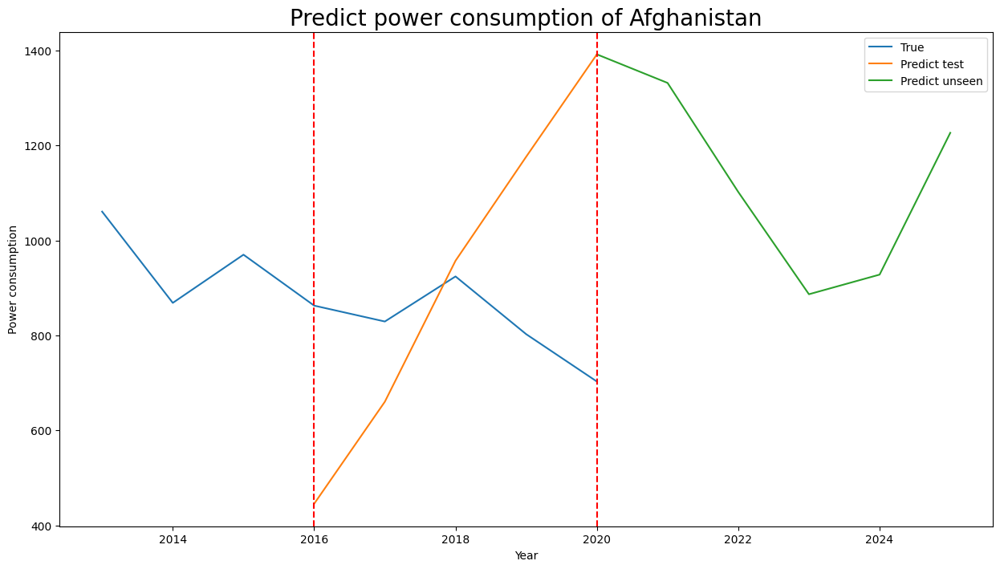

In [39]:
def neural_prophet_predict_for_each_entity_with_lags(df):
    entities = df['Entity'].unique()
    true = []
    predict = []
    predict_unseen = []
    
    for entity in entities:
        print(entity)
        regressors = ['EF', 'EC', 'EI', 'CO2', 'GG', 'GC','EN','AF','AE','RE','ER']
        removed_regressors = []
        entity_df = df[df['Entity'] == entity].copy()
        entity_df.drop('Entity', axis=1, inplace=True)
        entity_df.rename(columns={'Year': 'ds', 'PE': 'y'}, inplace=True)
        entity_df['ds'] = pd.to_datetime(entity_df['ds'], format='%Y')
        # check if any column in regressors has value does not change, drop that column and drop from regressors
        for regressor in regressors:
            if entity_df.iloc[-9:-5][regressor].nunique() < 2:
                entity_df.drop(regressor, axis=1, inplace=True)
                removed_regressors.append(regressor)
        for regressor in removed_regressors:
            regressors.remove(regressor)
        entity_df = entity_df.reset_index(drop=True)
        train = entity_df.iloc[:-5]
        test = entity_df.iloc[-5:]
        model = NeuralProphet(
                yearly_seasonality=False,
                weekly_seasonality=False,
                daily_seasonality=False,
                normalize='standardize',
                n_lags=3)
        for regressor in regressors:
            model.add_lagged_regressor(regressor, n_lags = 3)
        print(train)
        model.fit(train, freq='Y')
        future = model.make_future_dataframe(train, periods=10, n_historic_predictions=True)
        print(future)
        forecast = model.predict(future)
        predict_unseen.append(forecast['yhat1'].iloc[-5:].values)
        predict.append(forecast['yhat1'].iloc[-10:-5].values)
        true.append(test['y'].values)
#         break
    return predict, predict_unseen, true

# calculate the predict and predict unseen for all entities
predict_neural_lags, predict_unseen_neural_lags, true = neural_prophet_predict_for_each_entity_with_lags(df_power_filled_first_step_neural)

# calculate the error
predict_neural_lags_df = pd.DataFrame(predict_neural_lags, columns=[f'Year_{i}' for i in range(1, 6)])

predict_unseen_neural_lags_df = pd.DataFrame(predict_unseen_neural_lags, columns=[f'Year_{i}' for i in range(6, 11)])

true_neural_df = pd.DataFrame(true, columns=[f'Year_{i}' for i in range(1, 6)])

mae_neural_lags, rmse_neural_lags = calculate_error(predict_neural_lags_df, true_neural_df)

print('MAE NeuralProphet with lags: ', mae_neural_lags)
print('RMSE NeuralProphet with lags: ', rmse_neural_lags)

# visualize the predict and the true with the true is 8 last record data in entity_df and the predict is the last 5 years in forecast
visualize_predict_prophet(df_power_filled_first_step_neural, predict_neural_lags_df, predict_unseen_neural_lags_df, 0)

        
        

In [40]:
# save results: predict and predict_unseen to csv file
predict_df.to_csv('predict_prophet.csv', index=False)
predict_unseen_df.to_csv('predict_unseen_prophet.csv', index=False)
predict_lags_df.to_csv('predict_prophet_with_lags.csv', index=False)
predict_unseen_lags_df.to_csv('predict_unseen_prophet_with_lags.csv', index=False)
predict_neural_df.to_csv('predict_neural.csv', index=False)
predict_unseen_neural_df.to_csv('predict_unseen_neural.csv', index=False)
predict_neural_lags_df.to_csv('predict_neural_with_lags.csv', index=False)
predict_unseen_neural_lags_df.to_csv('predict_unseen_neural_with_lags.csv', index=False)
true_df.to_csv('true.csv', index=False)
true_neural_df.to_csv('true_neural.csv', index=False)